<a href="https://colab.research.google.com/github/nielsleadholm/CNN_Binding/blob/master/BoundaryAttack_vs_MadryMethod%26BindingCNNs.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Boundary Attack vs Madry Method and Binding-CNNs

Implement the Boundary attack method (Brendel et al, 2018) against the Madry et al (2017) method of adversarial resistance, then explore novel neural network architectures for greater adversarial resistance.


##Background/Introduction

###What are adversarial examples?

In recent years machine learning systems have significantly improved their performance on challenging tasks such as object recognition. Despite achieving near human-level performance on many of these problems, it has been realised that state-of-the-art machine learning systems such as deep neural networks are susceptible to subtle changes in the input space that would otherwise not be considered sufficient to change the true class of an item. For example, in the domain of vision, slight adjustments in pixel intensity that are imperceptible to humans can result in catastrophic misclassification by an otherwise well-performing model.

These engineered stimuli that fool the network are known as 'adversarial examples', and their generation as 'adversarial attacks'. Worryingly, adversarial examples have been found in multiple domain (such as audio and natural-language processing), function 'in the wild' (e.g. via video-feeds), and are known to generalize across machine learning systems.

###What are black box attacks, and what is the Boundary Attack?

The earliest methods for developing adversarial examples relied in detailed information about the network being attacked: specficially, how the gradient of the loss function relates to the input space. This enables calculated adjustments of the input domain so as to create an example that will be misclassified. Such methods are known as 'white box attacks' due to their intimate knowledge of the network.

Other methods enable attacks to be mounted with little information about the target, known as 'black box attacks'. A particularly powerful form of this is known as the Boundary Attack. Intuitively, the idea is to begin by adding a noise mask to the input such that it is misclassified. The L-2 (Euclidian) distance of this new image to the original is then iteratively reduced by minimizing the intensity of the pixel changes while ensuring the example remains adversarial. Eventually, a local minimum is found of an adversarial example which (ideally) is perceived to have been minimally changed to a human observer. Such an attack can in theory be implemented against networks regardless of their architecture (e.g. whether it is differentiable).

###What is the Madry et al method for adversarial resistance?

The Madry et al method is a process of training a machine learning classifier so as to be resistant to adversarial examples. To begin, an exhaustive search is performed for adversarial examples using a gradient-based attack. This search is constrained such that the l-infinite (Chebyshev) distance between the original and adversarial image is below a given threshold. A sufficiently large/complex model is then trained on both the original examples and these generated adversarial examples so as to maximize correct classification. The claim is that there is a degree of guarentee on the resistance of the network, at least within the bounds of input perturbation allowed by the earlier search method.

###What makes the following work novel or interesting?

####Part 1

My first prediction after reading about the Boundary Attack and the Madry et al method was that, as the Madry's search of adversarial examples is performed by a gradient based (white box) method, the Boundary attack might be able to find local minima that escaped this earlier search, and thus that the Madry method might be more vulnerable to l-2 (Euclidian) metric attacks than stated in the original paper. After beginning work on exploring this, I discovered that a later paper by the Boundary Attack authors had indeed confirmed this, and so the following begins with a simple replication of this result. Before this is shown, I briefly demonstrate a white-box attack working against a classic neural-network (ResNet-50) as a proof of principle of the 'FoolBox' Python library I am using.

####Part 2

My own research is currently focused on how the human brain encodes visual information in ways that are much richer and more complex that current deep learning systems, and how this might explain the curious existence of adversarial examples. In order to explore whether a network implementing these representations is more resistant, I first begin by developing and training a simple convolutional neural network based on the classic LeNet-5 architecture, using the MNIST hand-written characters dataset. As the steps for applying FoolBox methods such as the Boundary Attack against custom models implemented in TensorFlow's low-level API is different from pre-trained models such as ResNet-50 or the Madry network, I first demonstrate an attack against this network.

I then define and train a convolutional neural network on MNIST with a proposed change so as to confer adversarial resistance. This change results in carrying the activations of an earlier layer forward, similar to the process in 'Residual Networks' (ResNets). Unlike ResNets, this information is filtered by a boolean mask that encodes which low-level nodes are driving the high-level nodes. This relationship is similar to the 'hierarchical feature binding' that I am researching in the brain, and which may be critical to our own visual systems. This output is then rolled out and concatenated at the end to the standard 'max-pooling' output, before being fed into the latter stages of the neural network. 

Finally, I explore how this novel architecture fairs against the Boundary Attack, and compare its performance to the standard convolutional neural network, and the Madry model.

###How to Use this Notebook

The easiest way to use this Colaboratory Notebook is to run all the cells from beginning to end. 

At the beginning of the section implementing the Madry model, a code cell will run to terminate all Python operations, as this prevents variable conflict between the Madry model and the earlier ResNet model. After running this cell, all running cells will terminate, so a user must re-initiate the running of any subsequent cells. 

##Dependencies/Set-Up

In [0]:
pip install foolbox

    100% |████████████████████████████████| 245kB 7.1MB/s 
    100% |████████████████████████████████| 450kB 22.4MB/s 
    100% |████████████████████████████████| 71kB 21.8MB/s 
  Stored in directory: /root/.cache/pip/wheels/d7/e7/c8/153284a6e5e5c3fd4da42a8453175b45e2e185e8b5a09ced06
Successfully built foolbox


Randomgen is necessary for the Boundary Attack

In [0]:
pip install --no-binary randomgen randomgen

    100% |████████████████████████████████| 645kB 16.2MB/s 
Skipping bdist_wheel for randomgen, due to binaries being disabled for it.
  Running setup.py install for randomgen ... done


In [0]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import scipy
import os
import keras
import foolbox
from foolbox.models import KerasModel
from foolbox.criteria import TargetClassProbability
from foolbox import zoo
from keras.applications.resnet50 import ResNet50

Using TensorFlow backend.


In [0]:
cd sample_data

/content/sample_data


#Part 1 - Setting Up Attacks on Pre-Trained Models

##Execute a White-Box Attack on the ResNet50 Model

The following serves as a proof-of-principle demonstration that FoolBox can successfully mount a white-box attack on a standard, non-adversarial resistant network. It uses the L-infinity Basic Iterative Attack to cause ResNet-50 to misclassify an image of a chihuahua as a barometer. 

In [0]:
#Load the model to be attacked
keras.backend.set_learning_phase(0) #Disable learning
kmodel = keras.applications.resnet50.ResNet50(weights='imagenet') #Load the ResNet50 model weights for the ImageNet database
preprocessing = (np.array([104,116,123]), 1) #Normalise the input images
fmodel = KerasModel(kmodel, bounds=(0,255), preprocessing=preprocessing) #Define the model that will be attacked

102858752/102853048 [==============================] - 2s 0us/step
Instructions for updating:
Use tf.cast instead.


Instructions for updating:
Use tf.cast instead.


In [0]:
#Download the image to be tested
!wget https://www.dropbox.com/s/zqzvoyswfs3prer/test_image.jpg

--2019-03-26 09:48:56--  https://www.dropbox.com/s/zqzvoyswfs3prer/test_image.jpg?dl=0
Resolving www.dropbox.com (www.dropbox.com)... 162.125.8.1, 2620:100:601b:1::a27d:801
Connecting to www.dropbox.com (www.dropbox.com)|162.125.8.1|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/zqzvoyswfs3prer/test_image.jpg [following]
--2019-03-26 09:48:56--  https://www.dropbox.com/s/raw/zqzvoyswfs3prer/test_image.jpg
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://ucc3a83db0a094e94c0e53a7147c.dl.dropboxusercontent.com/cd/0/inline/AdxRdOnXkCkN-hgxgyM0rudg91KwgXG-v89rF77fo3kzEPDqABHUnOYrQh6j-qpJyM_PDpPfimb8o_JbSTragvHVMYd4Idt5EJxsT45oUuLJVQ/file# [following]
--2019-03-26 09:48:56--  https://ucc3a83db0a094e94c0e53a7147c.dl.dropboxusercontent.com/cd/0/inline/AdxRdOnXkCkN-hgxgyM0rudg91KwgXG-v89rF77fo3kzEPDqABHUnOYrQh6j-qpJyM_PDpPfimb8o_JbSTragvHVMYd4Idt5EJxsT45oUuLJVQ/file
Resolvin

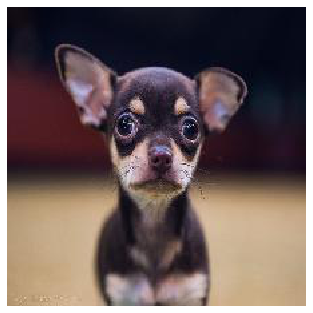

In [0]:
test_image = plt.imread('test_image.jpg')

#Define ImageNet labels of interest
test_label = 151 #Chihuahua
target_label = 427 #Barometer

#Display the image prior to any modification
fig = plt.imshow(test_image)
plt.grid(False)
fig.axes.get_xaxis().set_visible(False)
fig.axes.get_yaxis().set_visible(False)


In [0]:
#The predicted label of the network prior to carrying out the attack
pre_label = np.argmax(fmodel.predictions(test_image))
assert(pre_label == test_label)
print("The network has classified the image as a chihuahua")

The network has classified the image as a chihuahua


###Carry Out and Visualize the Results of the Attack

In [0]:
#Carry out the white-box attack
attack = foolbox.attacks.LinfinityBasicIterativeAttack(model=fmodel, criterion=TargetClassProbability(target_label, p=.85))
adversarial_image = attack(test_image, test_label)

In [0]:
#Check the output of the adversarial attack
adversarial_label = np.argmax(fmodel.predictions(adversarial_image[:, :, :]))
#Note a value of 427 corresponds to a 'barometer' in the imagenet dataset
assert(adversarial_label == target_label)
print("The network has classified the image as a barometer")

The network has classified the image as a barometer


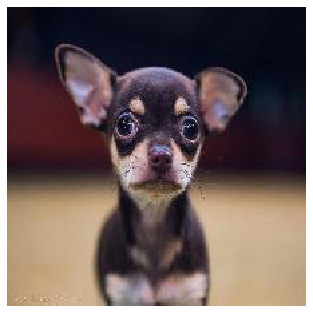

In [0]:
#Visualize the image after adversarial modification
#NB imshow can only accept values in the range of 0:255 if they are integers, hence the they are normalized to 0...1
fig = plt.imshow(adversarial_image/255)
plt.grid(False)
fig.axes.get_xaxis().set_visible(False)
fig.axes.get_yaxis().set_visible(False)

In [0]:
#Visualize some of the numerical differences in pixel intensity between the two images
#Note that consistent with the lack of a perceptual difference between the images, all of the values are << 1
print(test_image[0:3, 0:3, 2]/255 - adversarial_image[0:3, 0:3, 2]/255)

[[-0.00377197 -0.00377197 -0.00314331]
 [-0.00377197 -0.00377197 -0.00188598]
 [-0.00377197 -0.00314331  0.00314331]]


##Execute the Boundary Attack on the Madry Network (MNIST data-set)

Reset Session: Unfortunately, due to a conflict between the Madry model and the earlier ResNet model, the following will terminate all Python operations, and must be run unless the ResNet section was skipped.

In [0]:
os.kill(os.getpid(), 9)

In [0]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import scipy
import os
import keras
import foolbox
from foolbox.models import KerasModel
from foolbox.criteria import TargetClassProbability
from foolbox import zoo
from keras.applications.resnet50 import ResNet50

Using TensorFlow backend.


###Load the Madry Model and Necessary Data

In [0]:
#Load the Madry et al model to be attacked
Madry_model = zoo.get_model(url="https://github.com/bethgelab/mnist_challenge")

imported module: <module 'foolbox_model' from '/root/.foolbox_zoo/c0c3849144d0e3d772010fecfe1141efd086a988bc208ed1f36fbe9d54e58298/foolbox_model.py'>
Instructions for updating:
Colocations handled automatically by placer.


Instructions for updating:
Colocations handled automatically by placer.


Instructions for updating:
Use standard file APIs to check for files with this prefix.


Instructions for updating:
Use standard file APIs to check for files with this prefix.


INFO:tensorflow:Restoring parameters from /root/.foolbox_zoo/weights/4d9478a82a7e4f3f4bf05357f1406beb3cff122f7cd1c3914db7bd3c17107718/secret/models/secret/checkpoint-99900


INFO:tensorflow:Restoring parameters from /root/.foolbox_zoo/weights/4d9478a82a7e4f3f4bf05357f1406beb3cff122f7cd1c3914db7bd3c17107718/secret/models/secret/checkpoint-99900


In [0]:
#Use the small (20k examples) MNIST dataset available in Colaboratory
#Note the Madry model takes the images in a flattened form, rather than a 2D-reshaped input

Madry_testing_import = np.genfromtxt('mnist_test.csv', delimiter=',')

#Separate the training and testing images and their labels
Madry_testing_data = Madry_testing_import[:, 1:]
Madry_testing_labels = Madry_testing_import[:, 0]

#Rescale images to values between 0:1
Madry_testing_data = Madry_testing_data/255

#Transform the labels into one-hot encoding
num_classes = 10
Madry_testing_labels = np.eye(num_classes)[Madry_testing_labels.astype(int)]

Visualize a typical example from MNIST, and the Madry model's predicted label

5


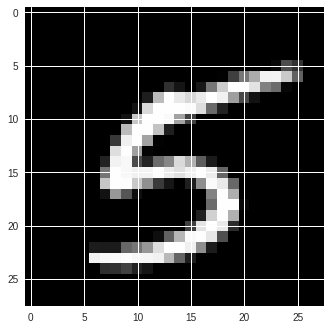

In [0]:
image_iter = 52
test_image_Madry = Madry_testing_data[image_iter, :]
plt.imshow(np.reshape(test_image_Madry, [28, 28, 1])[:,:,0], cmap='gray')
test_label_Madry = np.argmax(Madry_testing_labels[image_iter,:])

print(test_label_Madry)

In [0]:
#The predicted label of the network prior to carrying out the attack
pre_label = np.argmax(Madry_model.predictions(Madry_testing_data[image_iter, :]))
assert(pre_label == test_label_Madry)
print("The predicted label is " + str(pre_label))


The predicted label is 5


###Carry Out and Visualize the Boundary Attack

In [0]:
#Carry out the black-box attack
num_iterations = 100 #Note that the more iterations that are run, the more similar the new image will be to the original
Madry_attack = foolbox.attacks.BoundaryAttack(model=Madry_model, criterion=foolbox.criteria.Misclassification())
Madry_adversarial_image = Madry_attack(test_image_Madry, test_label_Madry, iterations=num_iterations, log_every_n_steps=50)

run with verbose=True to see details
Step 0: 9.14851e-02, stepsizes = 1.0e-02/1.0e-02: 
Step 50: 8.48095e-02, stepsizes = 1.5e-02/6.7e-03:  (took 0.09125 seconds)
Step 100: 6.40509e-02, stepsizes = 1.5e-02/4.4e-03: d. reduced by 0.89% (5.7316e-04) (took 0.00474 seconds)


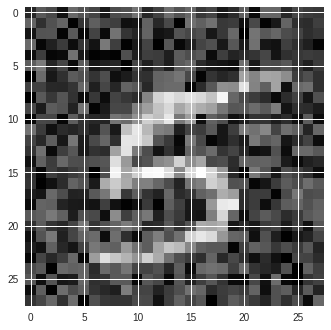

In [0]:
#Visualize the image after adversarial modification
#NB imshow can only accept values in the range of 0:255 if they are integers, hence the they are normalized to 0...1
plt.imshow(np.reshape(Madry_adversarial_image, [28, 28, 1])[:,:,0], cmap='gray')

In [0]:
#The predicted label of the network after the attack
post_label = np.argmax(Madry_model.predictions(Madry_adversarial_image))
print("The predicted label is " + str(post_label))

The predicted label is 0


###Quantify the Vulnerability of the Madry Model to the Boundary Attack

As the Boundary Attack optimizes for the L-2 norm, it is not possible to investigate it's ability to identify new local minima in L-inf norm space. On the other hand, Madry et al report a level of accuracy for l-2 norm resistance, based on PGD (gradient based) adversaries; specifically, they found that an l-2 perturbation of >5 was needed to drop the performance of classification significantly below 85%. I will explore here whether the Boundary Attack can find new local minima such that greater misclassification occurs without using a large l-2 perturbation.

In [0]:
#Function to iterate through a series of images to be attacked
def evaluate_l2_BoundaryAttack_resistance_MadryModel(num_images_to_attack, num_iterations):
    adversary_found = np.zeros([num_images_to_attack]) #array of booleans that indicates if an adversary was found for a particular image
    adversary_distance = np.zeros([num_images_to_attack])
    adversary_arrays = np.zeros([num_images_to_attack, Madry_testing_data.shape[1]])
    
    for ii in range(num_images_to_attack):
        test_image_Madry = Madry_testing_data[ii, :]
        test_label_Madry = np.argmax(Madry_testing_labels[ii,:])

        Madry_attack = foolbox.attacks.BoundaryAttack(model=Madry_model, criterion=foolbox.criteria.Misclassification())
        Madry_adversarial_image = Madry_attack(test_image_Madry, test_label_Madry, iterations=num_iterations, log_every_n_steps=500)
        adversary_arrays[ii, :] = Madry_adversarial_image
        
        # **** need to check this logical statement for accuracy
        if np.any(np.any(Madry_adversarial_image == None) | (Madry_model.predictions(Madry_adversarial_image) == test_label_Madry)):
            print("No adversarial image found")

        else:
            l2_distance = scipy.spatial.distance.euclidean(test_image_Madry, Madry_adversarial_image)
            print("The L2 distance of the adversary is " + str(l2_distance))
            adversary_found[ii] = 1
            adversary_distance[ii] = l2_distance

    return adversary_found, adversary_distance, adversary_arrays


In [0]:
num_images_to_attack = 3
num_iterations = 100
adversary_found, adversary_distance, adversary_arrays = evaluate_l2_BoundaryAttack_resistance_MadryModel(num_images_to_attack=num_images_to_attack, num_iterations=num_iterations)


run with verbose=True to see details
Step 0: 8.44766e-02, stepsizes = 1.0e-02/1.0e-02: 
The L2 distance of the adversary is 7.345142646194495
run with verbose=True to see details
Step 0: 1.35364e-01, stepsizes = 1.0e-02/1.0e-02: 
The L2 distance of the adversary is 8.15060971287477
run with verbose=True to see details
Step 0: 8.47509e-02, stepsizes = 1.0e-02/1.0e-02: 
The L2 distance of the adversary is 6.744604742666325


In [0]:
np.savetxt("Madry_adversaries.csv", adversary_arrays, delimiter=',')

In [0]:
success_ratio = np.sum(adversary_found)/num_images_to_attack
mean_distance_successful_attacks = np.sum(adversary_distance)/np.sum(adversary_found)

In [0]:
print("The success ratio is " + str(success_ratio))
print("The mean distance is " + str(mean_distance_successful_attacks))

The success ratio is 1.0
The mean distance is 7.413452367245196


My own results suggest that the boundary attack can achieve 100% misclassification of the Madry model, using a *mean* l-2 epsilon of only 1.406. In their original paper, they repated that an l-2 epislon of >5 was necessary to cause more than 15% misclassification. While my metric differed from that in the paper, and therefore direct comparisons are not possible, this suggests that the Boundary Attack method is indeed capable of finding local minima that escape gradient-based methods. Note this result was based on a sample of 50 images, allowing the BoundaryAttack to perform 1000 iterations for each.

Over the course of this work, I discovered a later pape by Schott et al (Towards the First Adversarially Robust Neural Network Model on MNIST, 2018 Arxiv) which used the same metric as in Madry et al, and found a similar result.

The earlier prediction that the Boundary Attack can identify novel local minima that gradient-based attacks cannot therefore appears confirmed.

#Part 2 - Setting Up Attacks on Custom Models, and Implementation of the Binding Network

##Execute the Boundary Attack on a Standard Convolutional Neural Network

The following demonstrates the use of the Boundary Attack Method against a standard convolutional neural network model trained on MNIST. This work helps to lay-out the steps necessary to apply FoolBox methods to a custom neural network that has been developed in TensorFlow's low-level API. Note this CNN is based on a model I previously developed in TensorFlow, and is based on the architecture of the classic network 'LeNet-5'.

###Data Setup and Preprocessing

In [0]:
#Use the small (20k examples) MNIST dataset available in Colaboratory
#Note the shape of the images required by the custom CNNs is 2D, rather than flattened as for the Madry model
training_import = np.genfromtxt('mnist_train_small.csv', delimiter=",")
testing_import = np.genfromtxt('mnist_test.csv', delimiter=',')


In [0]:
#Separate the training and testing images and their labels
training_data = training_import[:, 1:]
training_labels = training_import[:, 0]

testing_data = testing_import[:, 1:]
testing_labels = testing_import[:, 0]

In [0]:
#Rescale images to values between 0:1 and reshape so each image is 28x28
training_data = training_data/255
training_data = np.reshape(training_data, [np.shape(training_data)[0], 28, 28, 1])

testing_data = testing_data/255
testing_data = np.reshape(testing_data, [np.shape(testing_data)[0], 28, 28, 1])

In [0]:
#Transform the labels into one-hot encoding
num_classes = 10
training_labels = np.eye(num_classes)[training_labels.astype(int)]

testing_labels = np.eye(num_classes)[testing_labels.astype(int)]

###Model Setup

In [0]:
#Define training parameters
batch_size = 128
training_epochs = 3

In [0]:
#Declare placeholders for the input features and labels
#The first dimension of the palceholder shape is set to None as this will later be defined by the batch size

x = tf.placeholder(training_data.dtype, [None, 28, 28, 1])
y = tf.placeholder(training_labels.dtype, [None, num_classes])

In [0]:
#Define weight and bias variables, and initialize values 
#Note for example that the first convolutional weights layer has a 5x5 filter with 1 input channel, and 6 output channels
#tf.get_variable will either get an existing variable with these parameters, or otherwise create a new one
weights_LeNet = {
    'conv_W1' : tf.get_variable('CW1', shape=(5, 5, 1, 6), initializer=tf.contrib.layers.xavier_initializer()),
    'conv_W2' : tf.get_variable('CW2', shape=(5, 5, 6, 16), initializer=tf.contrib.layers.xavier_initializer()),
    'dense_W1' : tf.get_variable('DW1', shape=(400, 120), initializer=tf.contrib.layers.xavier_initializer()),
    'dense_W2' : tf.get_variable('DW2', shape=(120, 84), initializer=tf.contrib.layers.xavier_initializer()),
    'output_W' : tf.get_variable('OW', shape=(84, num_classes), initializer=tf.contrib.layers.xavier_initializer())
}

biases_LeNet = {
    'conv_b1' : tf.get_variable('Cb1', shape=(6), initializer=tf.contrib.layers.xavier_initializer()),
    'conv_b2' : tf.get_variable('Cb2', shape=(16), initializer=tf.contrib.layers.xavier_initializer()),
    'dense_b1' : tf.get_variable('Db1', shape=(120), initializer=tf.contrib.layers.xavier_initializer()),
    'dense_b2' : tf.get_variable('Db2', shape=(84), initializer=tf.contrib.layers.xavier_initializer()),
    'output_b' : tf.get_variable('Ob', shape=(num_classes), initializer=tf.contrib.layers.xavier_initializer())
}


For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
If you depend on functionality not listed there, please file an issue.



In [0]:
var_list_LeNet = [weights_LeNet['conv_W1'], weights_LeNet['conv_W2'], weights_LeNet['dense_W1'], weights_LeNet['dense_W2'], 
                  weights_LeNet['output_W'], biases_LeNet['conv_b1'], biases_LeNet['conv_b2'], biases_LeNet['dense_b1'],
                  biases_LeNet['dense_b2'], biases_LeNet['output_b']]

In [0]:
#Define the model

def cnn_predictions(features, temp_batch_size):

    #Note temp_batch_size is not currently used in this particular model, but is 
    #included as an argument to enable arbitrary calling of models later
    
    conv1 = tf.nn.conv2d(input=tf.dtypes.cast(features, dtype=tf.float32), filter=weights_LeNet['conv_W1'], 
                         strides=[1, 1, 1, 1], padding="SAME")
    conv1 = tf.nn.bias_add(conv1, biases_LeNet['conv_b1'])
    relu1 = tf.nn.relu(conv1)
    pool1 = tf.nn.max_pool(relu1, ksize=(1,2,2,1), strides=(1,2,2,1), padding="VALID")
    #Note in the tuple defining strides for max_pool, the first entry is always 1 as this refers to the batches/indexed images,
    #rather than the dimensions of a particular image

    conv2 = tf.nn.conv2d(pool1, weights_LeNet['conv_W2'], strides=[1,1,1,1], padding="VALID")
    conv2 = tf.nn.bias_add(conv2, biases_LeNet['conv_b2'])
    relu2 = tf.nn.relu(conv2)
    pool2 = tf.nn.max_pool(relu2, ksize=(1,2,2,1), strides=(1,2,2,1), padding="VALID")

    #Flatten Pool 2 before connecting it (fully) with the dense layers 1 and 2
    pool2_flat = tf.reshape(pool2, [-1, 5 * 5 * 16])
    dense1 = tf.add(tf.matmul(pool2_flat, weights_LeNet['dense_W1']), biases_LeNet['dense_b1'])
    dense1 = tf.nn.relu(dense1)
    dense2 = tf.add(tf.matmul(dense1, weights_LeNet['dense_W2']), biases_LeNet['dense_b2'])
    dense2 = tf.nn.relu(dense2)

    logits = tf.add(tf.matmul(dense2, weights_LeNet['output_W']), biases_LeNet['output_b'])

    return logits



###Define Training

In [0]:
#Primary training function
def LeNet5_train(var_list, training_data, training_labels, testing_data, testing_labels, learning_rate, temp_batch_size):
    
    predictions = cnn_predictions(x, temp_batch_size) #NB that x was defined earlier with tf.placeholder
    
    #Define the main Tensors (left hand) and Operations (right hand) that will be used during training
    cost = tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits(logits=predictions, labels=y))
    correct_prediction = tf.equal(tf.argmax(predictions, 1), tf.argmax(y, 1))
    accuracy = tf.reduce_mean(tf.cast(correct_prediction, tf.float32))

    #Create the chosen optimizer with tf.train.Adam..., then add it to the graph with .minimize
    optimizer = tf.train.AdamOptimizer(learning_rate=learning_rate).minimize(cost)
    
    #Define values to be written with the summary method for later visualization
    loss_summary = tf.summary.scalar(name="Loss_values", tensor=cost)
    accuracy_summary = tf.summary.scalar(name="Accuracy_values", tensor=accuracy)
    
    #Create a Saver object to enable later re-loading of the learned weights
    saver = tf.train.Saver(var_list)

    #Aside on understanding 'with' and 'tf.Session()'
        #Python's 'with' statement enables the evaluation of tf.Session, while ensuring
        #that the associated __exit__ method (similar to e.g. closing a file) will always 
        #be executed even if an error is raised
        #tf.Session() provides a connection between the Python program and the C++ runtime
        #It also caches information about the tf.Graph to enable efficient re-use of data
        #As tf.Session owns physical resources (such as the GPU), 'with' is particularly important
    with tf.Session() as sess:
        #Initialize variables; note the requirement for explicit initialization prevents expensive
        #initializers from being re-run when e.g. relaoding a model from a checkpoint
        sess.run(tf.global_variables_initializer())
        
        #Empty arrays for storing performance measures
        train_loss = []
        test_loss = []
        train_accuracy = []
        test_accuracy = []


        for epoch in range(training_epochs):

            for batch in range(int(len(training_labels)/batch_size)):

                batch_x = training_data[batch*batch_size:min((batch+1)*batch_size, len(training_labels))]
                batch_y = training_labels[batch*batch_size:min((batch+1)*batch_size, len(training_labels))]
                
                #Recall that tf.Session.run is the main method for running a tf.Operation or evaluation a tf.Tensor
                #By passing or more Tensors or Operations, TensorFlow will execute the operations needed
                run_optim = sess.run(optimizer, feed_dict = {x: batch_x, y: batch_y})

                loss, acc = sess.run([cost, accuracy], feed_dict = {x: batch_x, y: batch_y})
                

            print("At iteration " + str(epoch) + ", Loss = " + \
                 "{:.6f}".format(loss) + ", Training Accuracy = " + \
                                "{:.5f}".format(acc))

        print("Training complete")
        
        save_path = saver.save(sess, "/MNIST_LeNet5_CNN.ckpt")
        print("Model saved in MNIST_LeNet5_CNN.ckpt")
        
        test_acc, _ = sess.run([accuracy,cost], feed_dict={x: testing_data, y: testing_labels})

        print("Testing Accuracy:","{:.5f}".format(test_acc))



###Train the Model

In [0]:
LeNet5_train(var_list_LeNet, training_data, training_labels, testing_data, testing_labels, learning_rate=0.001, temp_batch_size=None)

Instructions for updating:

Future major versions of TensorFlow will allow gradients to flow
into the labels input on backprop by default.

See `tf.nn.softmax_cross_entropy_with_logits_v2`.



Instructions for updating:

Future major versions of TensorFlow will allow gradients to flow
into the labels input on backprop by default.

See `tf.nn.softmax_cross_entropy_with_logits_v2`.



At iteration 0, Loss = 0.364993, Training Accuracy = 0.92969
At iteration 1, Loss = 0.211063, Training Accuracy = 0.92969
At iteration 2, Loss = 0.113171, Training Accuracy = 0.96094
Training complete
Model saved in MNIST_LeNet5_CNN.ckpt
Testing Accuracy: 0.96940


###Check the Successful Loading of the Model Using tf.train.Saver()

In [0]:
def LeNet5_test(var_list_LeNet, testing_data, testing_labels, temp_batch_size):

    predictions = cnn_predictions(x, temp_batch_size)

    correct_prediction = tf.equal(tf.argmax(predictions, 1), tf.argmax(y, 1))
    accuracy = tf.reduce_mean(tf.cast(correct_prediction, tf.float32))
    
    saver = tf.train.Saver(var_list=var_list_LeNet)
    
    with tf.Session() as sess:
        saver.restore(sess, "/MNIST_LeNet5_CNN.ckpt")
        
        test_acc = sess.run([accuracy], feed_dict={x: testing_data, y: testing_labels})
        
        print("Testing Accuracy:" + str(test_acc))

In [0]:
LeNet5_test(var_list_LeNet, testing_data, testing_labels, temp_batch_size=None)

INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


Testing Accuracy:[0.9694]


###Test the Trained Model on Random Examples

In [0]:
def LeNet5_predict(var_list_LeNet, test_image, temp_batch_size):
    
    predictions = cnn_predictions(x, temp_batch_size)
    
    saver = tf.train.Saver(var_list=var_list_LeNet)
    
    with tf.Session() as sess:
        saver.restore(sess, "/MNIST_LeNet5_CNN.ckpt")
        
        num_parameters = np.sum([np.prod(v.get_shape().as_list()) for v in tf.trainable_variables()])
        print(num_parameters)
        
        output_predictions = sess.run([predictions], feed_dict={x: test_image})
                
        return output_predictions

5


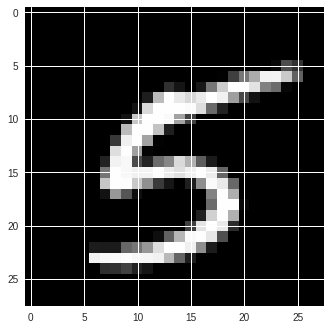

In [0]:
image_iter = 52
test_image_LeNet = testing_data[image_iter, :, :]
plt.imshow(test_image_LeNet[:,:,0], cmap='gray')
test_label_LeNet = np.argmax(testing_labels[image_iter,:])

print(test_label_LeNet)

In [0]:
output_predictions = LeNet5_predict(var_list_LeNet, test_image_LeNet[None, :, :, :], temp_batch_size=None)
print("The predicted value is " + str(np.argmax(output_predictions)))

INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


3336340
The predicted value is 5


###Carry Out and Visualize an Attack

In [0]:
#Function used to attack an arbitrary model that has been implemented with TensorFlow's low-level API (i.e. requires a session to be called explicitly)
def Boundary_Attack_customTensorFlowModel(model_prediction_function, model_weights, var_list, num_iterations, test_image, test_label, temp_batch_size):

    images = x #x is a place-holder for 28x28 images earlier defined
    logits = model_prediction_function(images, temp_batch_size)

    saver = tf.train.Saver(var_list) #Define saver object for use later when loading the model weights

    #Note how when attacking a low-level TensorFlow API model, it is necessary for all steps to occur within the tf.Session()
    with tf.Session() as session:
        saver.restore(session, model_weights) #Note when restoring weights its important not to run init on the same
        #variables, as this will over-write the learned weights with randomly initialized ones

        #Define the foolbox model
        fmodel = foolbox.models.TensorFlowModel(images, logits, (0,1)) 

        #The predicted label of the network prior to carrying out the attack
        pre_label = np.argmax(fmodel.predictions(test_image[:, :, :]))
        #print("The classification label prior to attack is " + str(pre_label))
        if (pre_label != test_label):
            print("The model predicted a " + str(pre_label) + " when the ground-truth label is " + str(test_label))
            plt.imshow(test_image[:,:,0], cmap='gray')

        #Carry out the untargeted Bounary Attack
        attack_fmodel = foolbox.attacks.BoundaryAttack(model=fmodel, criterion=foolbox.criteria.Misclassification())
        adversarial_image_fmodel = attack_fmodel(test_image, test_label, iterations=num_iterations, log_every_n_steps=50)
        plt.imshow(adversarial_image_fmodel[:,:,0], cmap='gray')
        plt.show()
        
        #Check the output of the adversarial attack
        adversarial_label_fmodel = np.argmax(fmodel.predictions(adversarial_image_fmodel[:, :, :]))
        print("The classification label following attack is " + str(adversarial_label_fmodel) 
              + " from an original classification of " + str(test_label))
        
        return adversarial_image_fmodel, adversarial_label_fmodel

INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


run with verbose=True to see details
Step 0: 7.61396e-02, stepsizes = 1.0e-02/1.0e-02: 
Step 50: 7.51278e-02, stepsizes = 1.5e-02/6.7e-03:  (took 0.05942 seconds)
Step 100: 6.03899e-02, stepsizes = 2.2e-02/4.4e-03:  (took 0.06741 seconds)
Step 150: 4.14796e-02, stepsizes = 3.4e-02/4.4e-03: d. reduced by 0.89% (3.7118e-04) (took 0.01747 seconds)
Step 200: 2.86184e-02, stepsizes = 5.1e-02/6.7e-03: d. reduced by 0.89% (2.5609e-04) (took 0.01574 seconds)
Step 250: 1.98552e-02, stepsizes = 7.6e-02/6.7e-03: d. reduced by 1.33% (2.6741e-04) (took 0.01671 seconds)
Step 300: 1.45352e-02, stepsizes = 7.6e-02/4.4e-03:  (took 0.01636 seconds)
Step 350: 1.21635e-02, stepsizes = 5.1e-02/2.0e-03:  (took 0.01517 seconds)
Step 400: 1.03021e-02, stepsizes = 5.1e-02/2.0e-03: d. reduced by 0.39% (4.0821e-05) (took 0.01772 seconds)
Step 450: 9.07752e-03, stepsizes = 5.1e-02/2.0e-03: d. reduced by 0.39% (3.5968e-05) (took 0.01623 seconds)
Step 500: 8.60005e-03, stepsizes = 2.3e-02/8.8e-04: d. reduced by 0.2

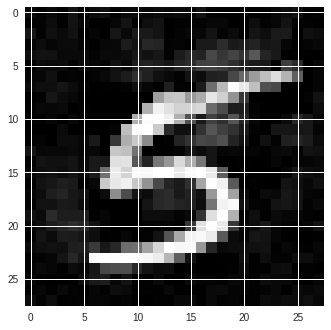

The classification label following attack is 5 from an original classification of 5


In [0]:
#An example of the attack
adversarial_image_fmodel, adversarial_label_fmodel = Boundary_Attack_customTensorFlowModel(model_prediction_function=cnn_predictions,
                                                                 model_weights="/MNIST_LeNet5_CNN.ckpt", 
                                                                 var_list=var_list_LeNet,
                                                                num_iterations=4000, 
                                                                 test_image=test_image_LeNet, 
                                                                 test_label=test_label_LeNet,
                                                                 temp_batch_size=None)


In [0]:
print("The prediction following adversarial perturbation is " + str(adversarial_label_fmodel))

The prediction following adversarial perturbation is 5


###Quantify the Vulnerability of the Standard CNN Model to the Boundary Attack

In [0]:
#Iterate through a series of images to be attacked
def evaluate_l2_BoundaryAttack_resistance_CustomModel(model_prediction_function, model_weights, var_list, num_images_to_attack, num_iterations, temp_batch_size):
    adversary_found = np.zeros([num_images_to_attack]) #array of booleans that indicates if an adversary was found for a particular image
    adversary_distance = np.zeros([num_images_to_attack])
    adversary_arrays = np.zeros([num_images_to_attack, testing_data.shape[1], testing_data.shape[2], 1])

    for ii in range(num_images_to_attack):
        test_image = testing_data[ii, :, :]
        test_label = np.argmax(testing_labels[ii,:])

        adversarial_image_fmodel, adversarial_classification = Boundary_Attack_customTensorFlowModel(model_prediction_function, 
                                                                                                     model_weights, var_list,
                                                                                                     num_iterations, 
                                                                                                     test_image, test_label, 
                                                                                                     temp_batch_size)
        adversary_arrays[ii, :, :] = adversarial_image_fmodel

        if ((np.any(adversarial_image_fmodel == None) | adversarial_classification == test_label)):
            print("No adversarial image found")

        else:
            l2_distance = scipy.spatial.distance.euclidean(test_image.flatten(), adversarial_image_fmodel.flatten())
            print("The L2 distance of the adversary is " + str(l2_distance))
            adversary_found[ii] = 1
            adversary_distance[ii] = l2_distance
        
    return adversary_found, adversary_distance, adversary_arrays

INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


run with verbose=True to see details
Step 0: 9.26696e-02, stepsizes = 1.0e-02/1.0e-02: 
Step 50: 9.26696e-02, stepsizes = 1.5e-02/6.7e-03:  (took 0.07102 seconds)
Step 100: 8.43854e-02, stepsizes = 2.2e-02/6.7e-03:  (took 0.07696 seconds)


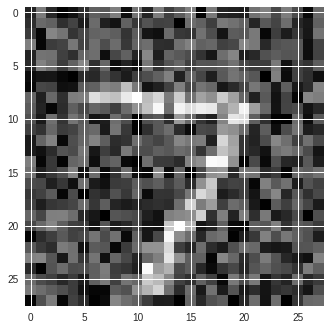

The classification label following attack is 3 from an original classification of 7
The L2 distance of the adversary is 8.133751918223831
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


run with verbose=True to see details
Step 0: 1.44966e-01, stepsizes = 1.0e-02/1.0e-02: 
Step 50: 1.30244e-01, stepsizes = 1.5e-02/1.0e-02:  (took 0.06211 seconds)
Step 100: 9.70239e-02, stepsizes = 2.2e-02/6.7e-03:  (took 0.08526 seconds)


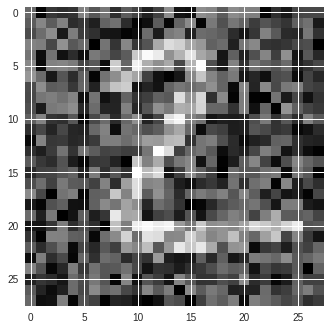

The classification label following attack is 8 from an original classification of 2
The L2 distance of the adversary is 8.721537242037703
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


run with verbose=True to see details
Step 0: 3.82374e-02, stepsizes = 1.0e-02/1.0e-02: 
Step 50: 3.82374e-02, stepsizes = 1.5e-02/6.7e-03:  (took 0.08267 seconds)
Step 100: 3.07345e-02, stepsizes = 2.2e-02/6.7e-03:  (took 0.08842 seconds)


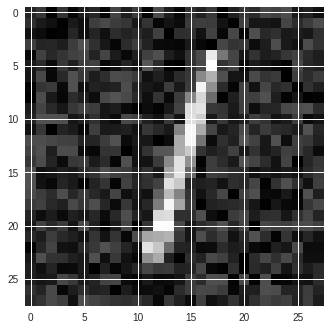

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 4.9087420880794985


In [0]:
num_images_to_attack = 3
num_iterations = 100
adversary_found, adversary_distance, adversary_arrays = evaluate_l2_BoundaryAttack_resistance_CustomModel(model_prediction_function=cnn_predictions,
                                                                                       model_weights="/MNIST_LeNet5_CNN.ckpt",
                                                                                      var_list=var_list_LeNet,
                                                                                       num_images_to_attack=num_images_to_attack, 
                                                                                       num_iterations=num_iterations,
                                                                                      temp_batch_size=None)


In [0]:
np.savetxt("StandardCNN_adversaries.csv", 
           np.reshape(adversary_arrays, [adversary_arrays.shape[0], adversary_arrays.shape[1]*adversary_arrays.shape[2]]), 
                      delimiter=',')

In [0]:
success_ratio = np.sum(adversary_found)/num_images_to_attack
mean_distance_successful_attacks = np.sum(adversary_distance)/np.sum(adversary_found)

In [0]:
print("The success ratio is " + str(success_ratio))
print("The mean distance is " + str(mean_distance_successful_attacks))

The success ratio is 1.0
The mean distance is 7.254677082780344


Assessing the simple CNN model found 100% misclassification of the Bounday Attack, using a *mean* l-2 perturbation of only 1.735; note this is actually a slightly larger distance necesary than that found when attacking the Madry model. This fits with the notion that the Madry method actually displays poor resistance to l-2 attacks from the Boundary Attack, as it has overfit on l-infinity attacks. This result is confirmed in the earlier discussed paper by Schott et al. Note this result was based on a sample of 50 images, allowing the BoundaryAttack to perform 1000 iterations for each.

##Execute the Boundary Attack on a Binding-Capable CNN

###Model Setup

The following demonstrates the use of the Boundary Attack Method against a convolutional neural network model trained on MNIST. This model has been augmented in an attempt to capture 'hierarchical binding information' - essentially how low-level features are driving high level features. Whether this confers resistance to the l-2 based Boundary Attack is then explored. Note that the model, unlike the Madry et al method, receives *no* training on adversarial examples.

In [0]:
#Define weight and bias variables, and initialize values 
weights_Binding = {
    'conv_W1_bind' : tf.get_variable('CW1_bind', shape=(5, 5, 1, 6), initializer=tf.contrib.layers.xavier_initializer()),
    'conv_W2_bind' : tf.get_variable('CW2_bind', shape=(5, 5, 6, 16), initializer=tf.contrib.layers.xavier_initializer()),
    'dense_W1_bind' : tf.get_variable('DW1_bind', shape=(400+1600, 120), initializer=tf.contrib.layers.xavier_initializer()),
    'dense_W2_bind' : tf.get_variable('DW2_bind', shape=(120, 84), initializer=tf.contrib.layers.xavier_initializer()),
    'output_W_bind' : tf.get_variable('OW_bind', shape=(84, num_classes), initializer=tf.contrib.layers.xavier_initializer())
}

biases_Binding = {
    'conv_b1_bind' : tf.get_variable('Cb1_bind', shape=(6), initializer=tf.contrib.layers.xavier_initializer()),
    'conv_b2_bind' : tf.get_variable('Cb2_bind', shape=(16), initializer=tf.contrib.layers.xavier_initializer()),
    'dense_b1_bind' : tf.get_variable('Db1_bind', shape=(120), initializer=tf.contrib.layers.xavier_initializer()),
    'dense_b2_bind' : tf.get_variable('Db2_bind', shape=(84), initializer=tf.contrib.layers.xavier_initializer()),
    'output_b_bind' : tf.get_variable('Ob_bind', shape=(num_classes), initializer=tf.contrib.layers.xavier_initializer())
}


In [0]:
var_list_Binding = [weights_Binding['conv_W1_bind'], weights_Binding['conv_W2_bind'], weights_Binding['dense_W1_bind'], 
                    weights_Binding['dense_W2_bind'], weights_Binding['output_W_bind'], biases_Binding['conv_b1_bind'], 
                    biases_Binding['conv_b2_bind'], biases_Binding['dense_b1_bind'], biases_Binding['dense_b2_bind'], 
                    biases_Binding['output_b_bind']]

In [0]:
#Declare placeholders for the input features and labels
#The first dimension of the palceholder shape is set to None as this will later be defined by the batch size

x = tf.placeholder(training_data.dtype, [None, 28, 28, 1])
y = tf.placeholder(training_labels.dtype, [None, num_classes])
# batch_size_placeholder = tf.placeholder(tf.int32, shape=())

In [0]:
#Define training parameters
batch_size = 128
training_epochs = 5

In [0]:
#Define the convolutional model now with binding information

def cnn_binding_predictions(features, temp_batch_size):

    conv1 = tf.nn.conv2d(input=tf.dtypes.cast(features, dtype=tf.float32), filter=weights_Binding['conv_W1_bind'], 
                         strides=[1, 1, 1, 1], padding="SAME")
    conv1 = tf.nn.bias_add(conv1, biases_Binding['conv_b1_bind'])
    relu1 = tf.nn.relu(conv1)
    pool1 = tf.nn.max_pool(relu1, ksize=(1,2,2,1), strides=(1,2,2,1), padding="VALID")
    #Note in the tuple defining strides for max_pool, the first entry is always 1 as this refers to the batches/indexed images,
    #rather than the dimensions of a particular image

    conv2 = tf.nn.conv2d(pool1, weights_Binding['conv_W2_bind'], strides=[1,1,1,1], padding="VALID")
    conv2 = tf.nn.bias_add(conv2, biases_Binding['conv_b2_bind'])
    relu2 = tf.nn.relu(conv2)
    pool2 = tf.nn.max_pool(relu2, ksize=(1,2,2,1), strides=(1,2,2,1), padding="VALID")

    #Flatten Pool 2 before connecting it (fully) with the dense layers 1 and 2
    pool2_flat = tf.reshape(pool2, [-1, 5 * 5 * 16])
    
    
    #Output the indeces of the relu2 nodes that were maximally active (i.e. 'drove' the pool2 nodes), and flatten them
    _, binding_indeces = tf.nn.max_pool_with_argmax(relu2, ksize=(1,2,2,1), strides=(1,2,2,1), padding="VALID")
    binding_indeces_flat = tf.reshape(binding_indeces, [-1, 5 * 5 * 16])
    binding_indeces_flat_cast = tf.dtypes.cast(binding_indeces_flat, dtype=tf.int32)

    #Define update (containing the same number of ones as earlier indices), and shape, which form arguments of scatter_nd
    updates_batch = tf.ones_like(binding_indeces_flat_cast)
    shape = tf.constant([10 * 10 * 16])

    tensor_list = [] #Empty list to hold each row-like tensor, one of which will be formed for each image in the batch
    
    for batch_iter in range(temp_batch_size):

        #Add a dimension to enable use of scatter_nd with the flattened tensor
        indices_temp = tf.expand_dims(binding_indeces_flat_cast[batch_iter], axis=1) 
        
        #In a new tensor of shape 'shape', place a one wherever indicated by 'indices_temp'
        scatter = tf.scatter_nd(indices_temp, updates_batch[batch_iter], shape)

        tensor_list.append(scatter)

    #Stack the scatter tensors for each member of the batch into a single tensor of dimension (batch_size, 'shape')
    binding_mask = tf.stack(tensor_list)
    
    #Recast and flatten tensors as necessary
    binding_mask_cast = tf.dtypes.cast(binding_mask, dtype=tf.float32)
    relu2_flat = tf.reshape(relu2, [-1, 10 * 10 * 16])

    #Apply the boolean information about which lower level nodes were active as a mask to the actual activaiton values
    binding_activations = tf.math.multiply(relu2_flat, binding_mask_cast)
    
    dense1 = tf.add(tf.matmul(tf.concat([pool2_flat, binding_activations], axis=1), 
                              weights_Binding['dense_W1_bind']), biases_Binding['dense_b1_bind'])
    dense1 = tf.nn.relu(dense1)
    dense2 = tf.add(tf.matmul(dense1, weights_Binding['dense_W2_bind']), biases_Binding['dense_b2_bind'])
    dense2 = tf.nn.relu(dense2)

    logits = tf.add(tf.matmul(dense2, weights_Binding['output_W_bind']), biases_Binding['output_b_bind'])

    return logits


###Define Training

In [0]:
#Define the training function of the new Binding-CNN
def BindingNet_train(var_list, training_data, training_labels, testing_data, testing_labels, learning_rate):
    
    predictions = cnn_binding_predictions(x, temp_batch_size=128) #NB that x was defined earlier with tf.placeholder
    
    #Define the main Tensors (left hand) and Operations (right hand) that will be used during training
    cost = tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits(logits=predictions, labels=y))
    correct_prediction = tf.equal(tf.argmax(predictions, 1), tf.argmax(y, 1))
    accuracy = tf.reduce_mean(tf.cast(correct_prediction, tf.float32))

    #Create the chosen optimizer with tf.train.Adam..., then add it to the graph with .minimize
    optimizer = tf.train.AdamOptimizer(learning_rate=learning_rate).minimize(cost)
    
    #Define values to be written with the summary method for later visualization
    loss_summary = tf.summary.scalar(name="Loss_values", tensor=cost)
    accuracy_summary = tf.summary.scalar(name="Accuracy_values", tensor=accuracy)
    
    saver = tf.train.Saver(var_list)
    
    #Carry out training
    with tf.Session() as sess:
        #Initialize the new variables
        sess.run(tf.global_variables_initializer())
        

        for epoch in range(training_epochs):

            for batch in range(int(len(training_labels)/batch_size)):

                batch_x = training_data[batch*batch_size:min((batch+1)*batch_size, len(training_labels))]
                batch_y = training_labels[batch*batch_size:min((batch+1)*batch_size, len(training_labels))]
                

                #Recall that tf.Session.run is the main method for running a tf.Operation or evaluation a tf.Tensor
                #By passing or more Tensors or Operations, TensorFlow will execute the operations needed
                run_optim = sess.run(optimizer, feed_dict = {x: batch_x, y: batch_y})

                loss, acc = sess.run([cost, accuracy], feed_dict = {x: batch_x, y: batch_y})
                

            print("At iteration " + str(epoch) + ", Loss = " + \
                 "{:.6f}".format(loss) + ", Training Accuracy = " + \
                                "{:.5f}".format(acc))

        print("Training complete")
        
        save_path = saver.save(sess, "/Binding_CNN.ckpt")
        print("Model saved in Binding_CNN.ckpt")
        
        test_acc_list = []
        test_loss_list = []
        
        for batch in range(int(len(testing_labels)/batch_size)):

            batch_x = testing_data[batch*batch_size:min((batch+1)*batch_size, len(testing_labels))]
            batch_y = testing_labels[batch*batch_size:min((batch+1)*batch_size, len(testing_labels))]


            test_acc, test_l = sess.run([accuracy,cost], feed_dict={x: batch_x, y: batch_y})

            test_acc_list.append(test_acc)
            test_loss_list.append(test_l)

        return test_acc_list, test_loss_list
        #print("Testing Accuracy:","{:.5f}".format(test_acc))



###Train the Model

In [0]:
test_acc_list, test_loss_list = BindingNet_train(var_list_Binding, training_data, training_labels, 
                                                 testing_data, testing_labels, learning_rate=0.001)

At iteration 0, Loss = 0.254066, Training Accuracy = 0.92969
At iteration 1, Loss = 0.117723, Training Accuracy = 0.96875
At iteration 2, Loss = 0.055967, Training Accuracy = 0.98438
At iteration 3, Loss = 0.064103, Training Accuracy = 0.98438
At iteration 4, Loss = 0.037833, Training Accuracy = 0.99219
Training complete
Model saved in Binding_CNN.ckpt


In [0]:
print("Achieved an accuracy of " + str(np.mean(test_acc_list)))

Achieved an accuracy of 0.96584535


###Carry Out and Visualize an Attack

In [0]:
### *** temporary code to help count the number of parameters

def Binding_predict(var_list, test_image, temp_batch_size):
    
    predictions = cnn_binding_predictions(x, temp_batch_size)
    
    saver = tf.train.Saver(var_list)
    
    with tf.Session() as sess:
        saver.restore(sess, "/Binding_CNN.ckpt")
        
        num_parameters = np.sum([np.prod(v.get_shape().as_list()) for v in tf.trainable_variables()])
        print(num_parameters)
        
        output_predictions = sess.run([predictions], feed_dict={x: test_image})
                
        return output_predictions

In [0]:
Binding_predict(var_list_Binding, test_image_LeNet[None,:,:,:], temp_batch_size=1)

INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


3590046


[array([[-1.4375738, -8.398105 , -6.2640347, -2.6701653, -2.6180077,
         13.720008 ,  3.7834764, -7.8211765, -3.2510903, -4.3145666]],
       dtype=float32)]

In [0]:
#Function to try to identify why the Boundary Attack does not stop iteratively decreasing noise into correct classification
# def bug_test_attack(num_iterations, test_image, test_label, target_image, target_label, temp_batch_size):

#     images = x #x is a place-holder for 28x28 images earlier defined
#     logits = cnn_binding_predictions(images, temp_batch_size)

#     saver = tf.train.Saver(var_list_Binding) #Define saver object for use later when loading the model weights

#     #Note how when attacking a low-level TensorFlow API model, it is necessary for all steps to occur within the tf.Session()
#     with tf.Session() as session:
#         saver.restore(session, "/Binding_CNN.ckpt") #Note when restoring weights its important not to run init on the same
#         #variables, as this will over-write the learned weights with randomly initialized ones

#         #Define the foolbox model
#         fmodel = foolbox.models.TensorFlowModel(images, logits, (0,1)) 

#         #The predicted label of the network prior to carrying out the attack
#         pre_label = np.argmax(fmodel.predictions(test_image[:, :, :]))
#         #print("The classification label prior to attack is " + str(pre_label))
#         if (pre_label != test_label):
#             print("The model predicted a " + str(pre_label) + " when the ground-truth label is " + str(test_label))
#             plt.imshow(test_image[:,:,0], cmap='gray')

#         #Carry out the untargeted Bounary Attack
#         attack_fmodel = foolbox.attacks.BoundaryAttack(model=fmodel, criterion=foolbox.criteria.TargetClass(target_label_LeNet))
#         adversarial_image_fmodel = attack_fmodel(test_image, test_label, iterations=num_iterations, starting_point=target_image_LeNet,
#                                                  log_every_n_steps=50)
#         plt.imshow(adversarial_image_fmodel[:,:,0], cmap='gray')
#         plt.show()
        
#         #Check the output of the adversarial attack
#         adversarial_label_fmodel = np.argmax(fmodel.predictions(adversarial_image_fmodel[:, :, :]))
#         print("The classification label following attack is " + str(adversarial_label_fmodel) 
#               + " from an original classification of " + str(test_label))
        
#         return adversarial_image_fmodel, adversarial_label_fmodel

In [0]:
#To be used if a targeted attack is desired

#Unfortunately the targeted boundary attack appears to have the same odd behaviour

# image_iter = 56
# target_image_LeNet = testing_data[image_iter, :, :]
# plt.imshow(target_image_LeNet[:,:,0], cmap='gray')
# target_label_LeNet = np.argmax(testing_labels[image_iter,:])

# print(target_label_LeNet)

In [0]:
# #An example of the attack
# adversarial_image_fmodel = bug_test_attack(num_iterations=100, 
#                                                                  test_image=test_image_LeNet, 
#                                                                  test_label=test_label_LeNet,
#                                                                 target_image=target_image_LeNet,
#                                                                 target_label=target_label_LeNet,
#                                                                  temp_batch_size=1)


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


run with verbose=True to see details
Step 0: 1.65224e-01, stepsizes = 1.0e-02/1.0e-02: 
Step 50: 1.51449e-01, stepsizes = 6.7e-03/6.7e-03:  (took 0.08065 seconds)
Step 100: 1.38528e-01, stepsizes = 4.4e-03/4.4e-03:  (took 0.06928 seconds)


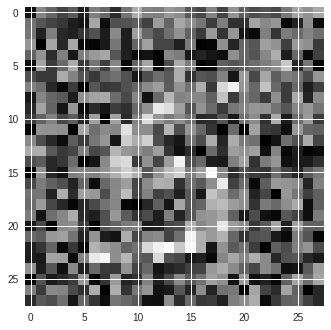

The classification label following attack is 2 from an original classification of 5


In [0]:
#An example of the attack
adversarial_image_fmodel = Boundary_Attack_customTensorFlowModel(model_prediction_function=cnn_binding_predictions,
                                                                 model_weights="/Binding_CNN.ckpt",
                                                                 var_list=var_list_Binding,
                                                                 num_iterations=100, 
                                                                 test_image=test_image_LeNet, 
                                                                 test_label=test_label_LeNet,
                                                                 temp_batch_size=1)


###Quantify the Vulnerability of the Binding-Capable CNN to the Boundary Attack

INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


run with verbose=True to see details
Step 0: 1.28783e-01, stepsizes = 1.0e-02/1.0e-02: 
Step 50: 9.39950e-02, stepsizes = 6.7e-03/6.7e-03:  (took 0.07276 seconds)
Step 100: 9.39950e-02, stepsizes = 4.4e-03/3.0e-03:  (took 0.09207 seconds)


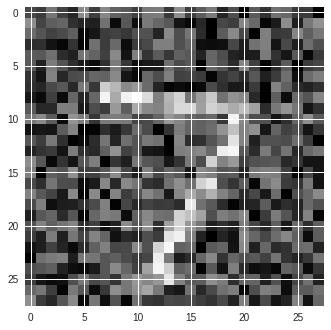

The classification label following attack is 9 from an original classification of 7
The L2 distance of the adversary is 8.584408157447212
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


run with verbose=True to see details
Step 0: 2.43754e-01, stepsizes = 1.0e-02/1.0e-02: 
Step 50: 2.24922e-01, stepsizes = 6.7e-03/6.7e-03:  (took 0.08993 seconds)
Step 100: 2.23592e-01, stepsizes = 4.4e-03/3.0e-03:  (took 0.08797 seconds)


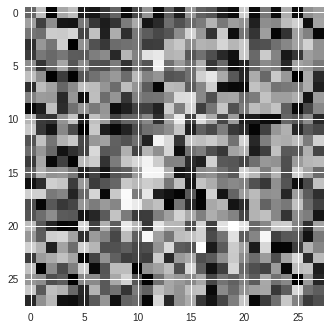

The classification label following attack is 3 from an original classification of 2
The L2 distance of the adversary is 13.239929195361498
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


run with verbose=True to see details
Step 0: 9.71627e-02, stepsizes = 1.0e-02/1.0e-02: 
Step 50: 8.10836e-02, stepsizes = 6.7e-03/6.7e-03:  (took 0.07696 seconds)
Step 100: 6.96883e-02, stepsizes = 4.4e-03/3.0e-03:  (took 0.07931 seconds)


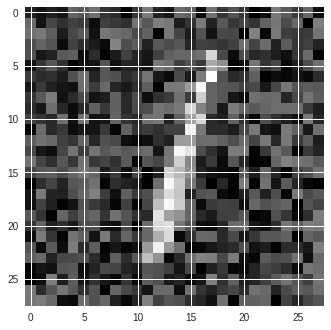

The classification label following attack is 2 from an original classification of 1
The L2 distance of the adversary is 7.39159390202984


In [0]:
num_images_to_attack = 3
num_iterations = 100
adversary_found, adversary_distance, adversary_arrays = evaluate_l2_BoundaryAttack_resistance_CustomModel(model_prediction_function=cnn_binding_predictions,
                                                                                        model_weights="/Binding_CNN.ckpt", 
                                                                                      var_list=var_list_Binding,
                                                                                        num_images_to_attack=num_images_to_attack,
                                                                                        num_iterations=num_iterations, temp_batch_size=1)
#Note that as the Boundary Attack appears to display unusual behaviour against this network, each adversarial image is also shown

In [0]:
np.savetxt("BindingNetwork_adversaries.csv", 
           np.reshape(adversary_arrays, [adversary_arrays.shape[0], adversary_arrays.shape[1]*adversary_arrays.shape[2]]), 
                      delimiter=',')

In [0]:
success_ratio = np.sum(adversary_found)/num_images_to_attack
mean_distance_successful_attacks = np.sum(adversary_distance)/np.sum(adversary_found)

In [0]:
print("The success ratio is " + str(success_ratio))
print("The mean distance is " + str(mean_distance_successful_attacks))

The success ratio is 1.0
The mean distance is 7.387966552713517


On running the above, the Binding-network appears to only misclassify 24% of the examples generated, and of these, the mean L-2 distance required to cause misclassification is 8.32. This is much better performance than for the other networks, but on inspecting the running of the code, the Boundary Attack appears to be performing oddly together with the network, in that after identifying an adversarial example (i.e. with 100% success, as for the other models), it continues to iteratively decrease the noise over the 1000 iteraitons. After this reduction in noise, the network is generally able to classify the example; thus the issue appears to be that the Boundary Attack is not remaining in what the 'region of adversity'. It is likely this is due to a bug in my own execution of the attack, and so an alternative measure of adversarial resistance is explored below.

#Part 3 - Direct Comparison of Each Network's Performance

##Transfer Attacks

As it is unclear from the above results whether the Binding CNN is genuinely more resistant to adversarial attacks, or there is simply an issue with how the Boundary Attack is being leveraged against it, an additional measure will be performed. The following assesses how resistant each network is to the adversarial examples generated by the other networks; such an attack is in fact a form of a blac box attack know as a 'transfer attack'. Generally speaking, adversarial examples generalize well across models, and so any indication that a model is resistant to the adversarial examples of other is a positive sign that it is genuinely resistant. As this assessment does not make use of FoolBox, any possible issues with the implementation of the Boundary Attack against the binding network should not confer non-genuine resistance to the transfer attacks.

###Transfer Attacks Against the Keras Models

In [0]:
def Transfer_Attack_KerasModel(model, transfer_attack_images):
    
    #Load transfer_attack_images and reshape
    transfer_images = np.genfromtxt(transfer_attack_images, delimiter=',')
    

    
    for ii in range(transfer_images.shape[0]):
        test_image = transfer_images[ii, :]
                
        plt.imshow(np.reshape(test_image, [28, 28, 1])[:,:,0], cmap='gray')
        plt.show()
        print("The network predicted a class label of " + str(np.argmax(model.predictions(test_image))))
        


####Madry Model vs Standard CNN Adversaries

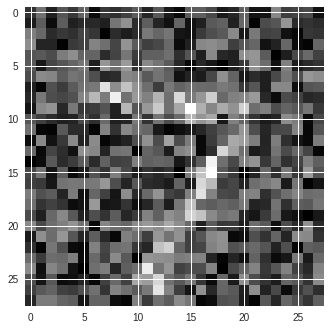

The network predicted a class label of 0


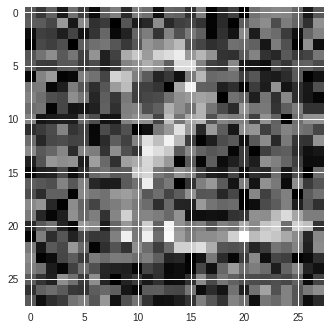

The network predicted a class label of 2


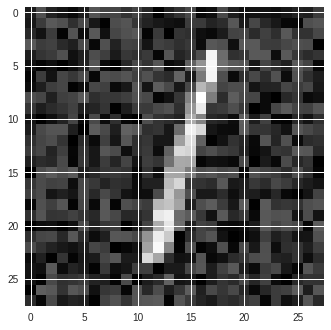

The network predicted a class label of 1


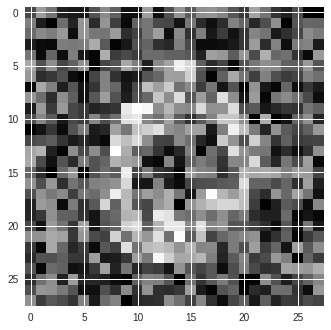

The network predicted a class label of 0


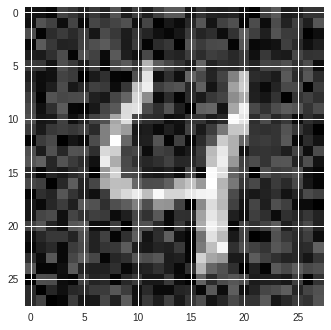

The network predicted a class label of 4


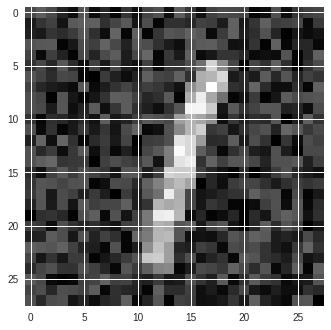

The network predicted a class label of 1


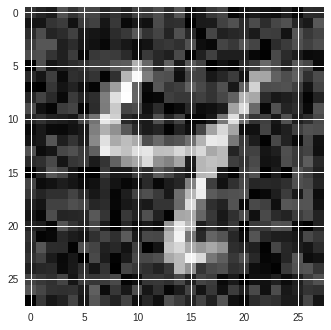

The network predicted a class label of 4


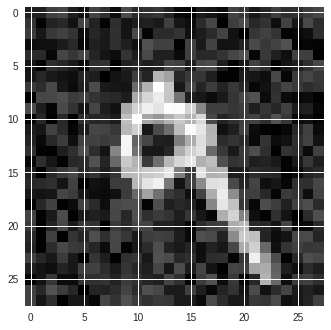

The network predicted a class label of 9


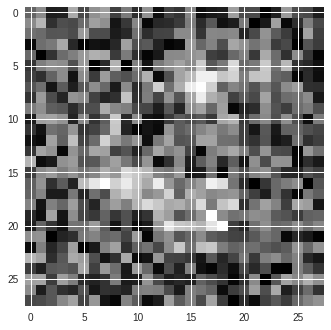

The network predicted a class label of 0


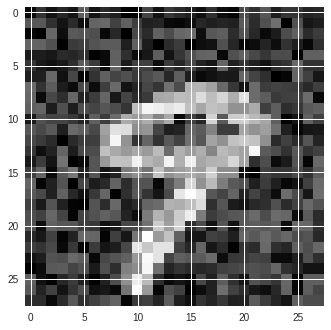

The network predicted a class label of 9


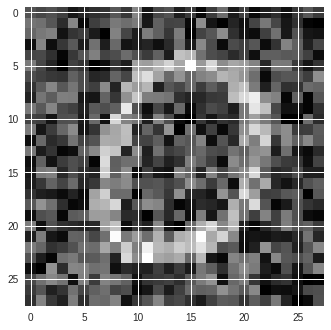

The network predicted a class label of 0


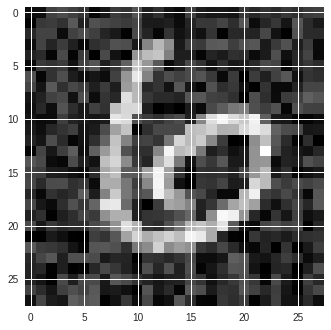

The network predicted a class label of 6


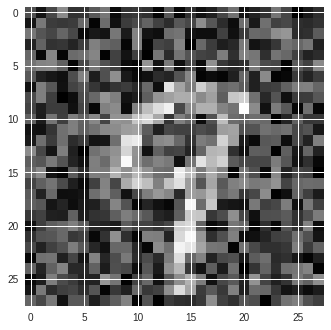

The network predicted a class label of 9


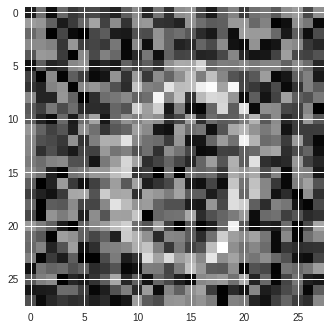

The network predicted a class label of 0


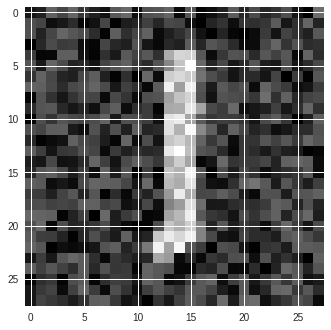

The network predicted a class label of 1


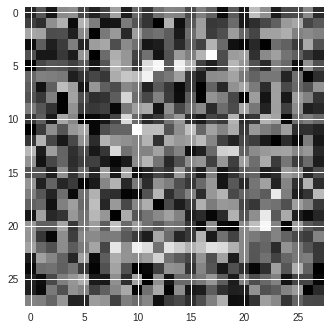

The network predicted a class label of 0


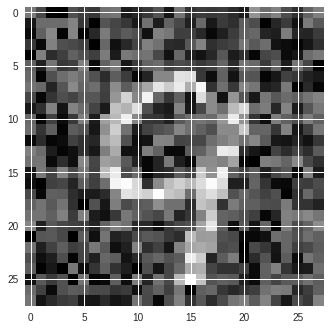

The network predicted a class label of 9


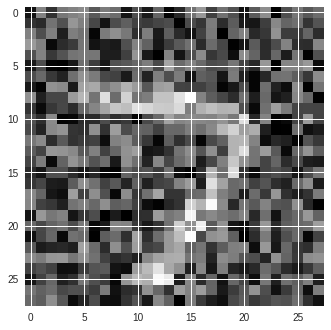

The network predicted a class label of 0


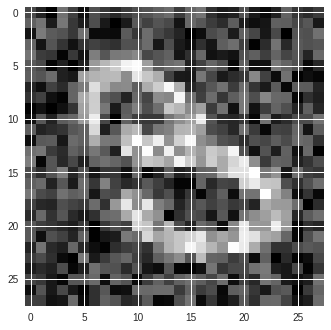

The network predicted a class label of 8


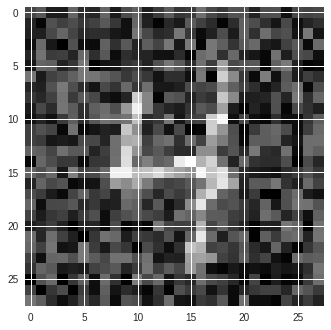

The network predicted a class label of 4


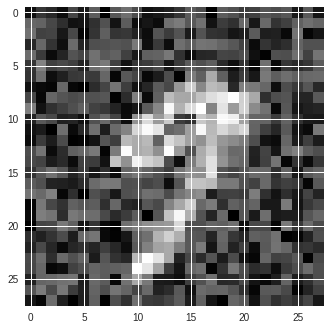

The network predicted a class label of 2


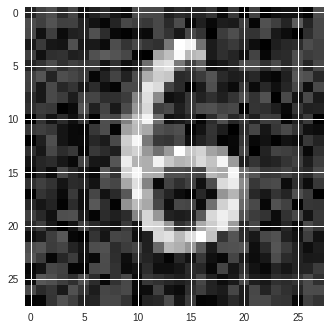

The network predicted a class label of 6


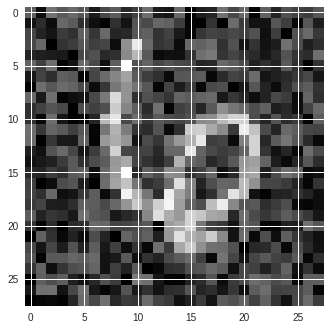

The network predicted a class label of 6


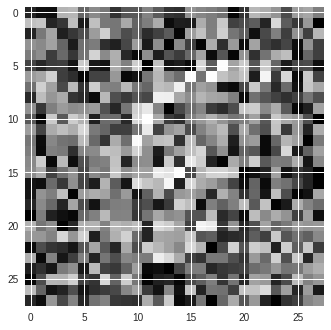

The network predicted a class label of 0


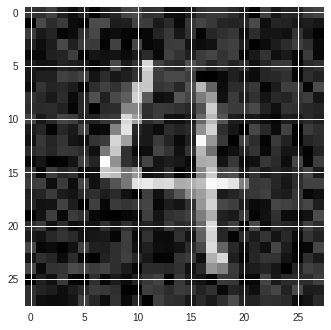

The network predicted a class label of 4


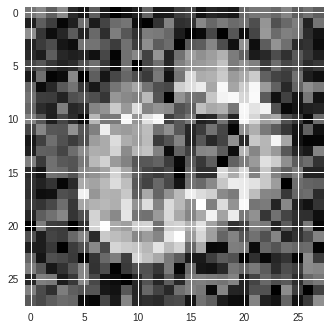

The network predicted a class label of 0


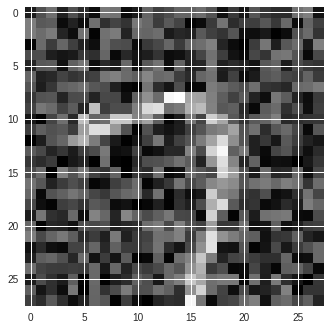

The network predicted a class label of 0


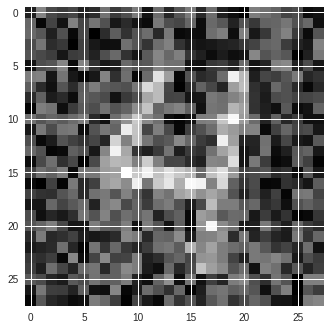

The network predicted a class label of 4


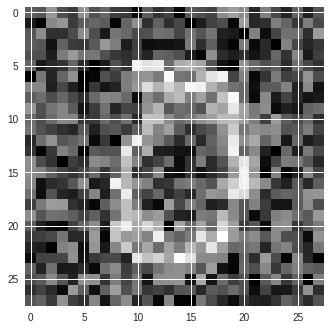

The network predicted a class label of 0


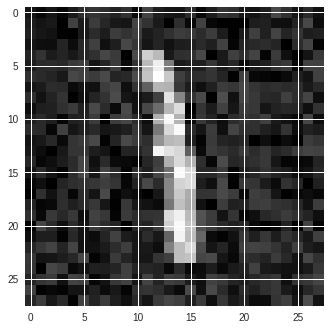

The network predicted a class label of 1


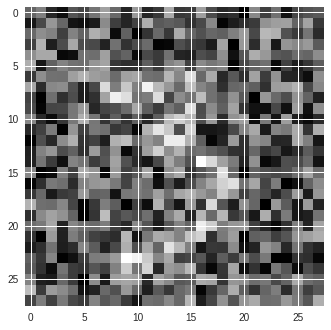

The network predicted a class label of 0


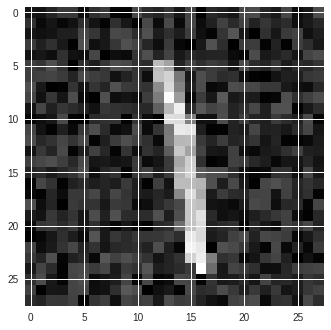

The network predicted a class label of 1


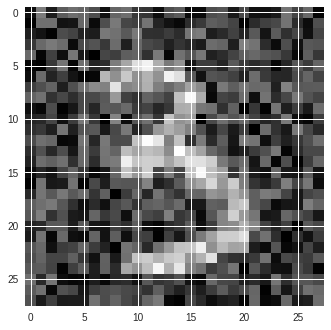

The network predicted a class label of 3


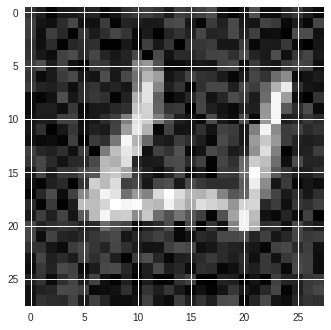

The network predicted a class label of 4


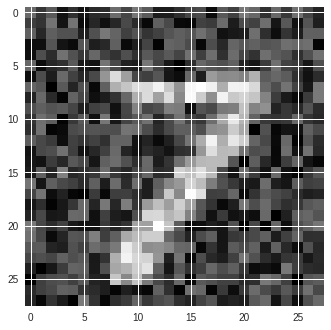

The network predicted a class label of 2


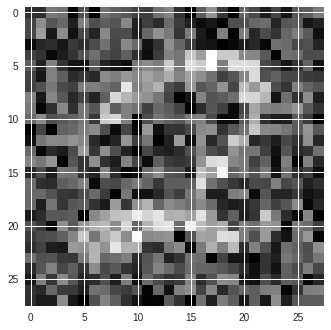

The network predicted a class label of 2


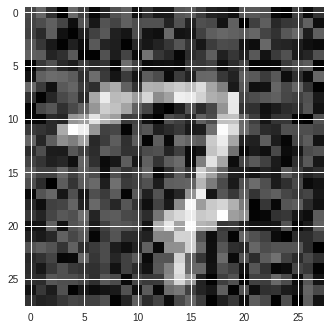

The network predicted a class label of 7


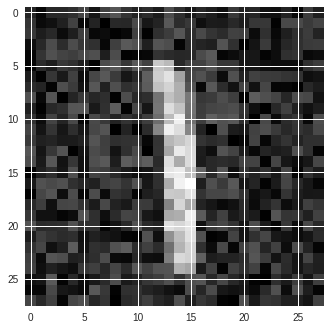

The network predicted a class label of 1


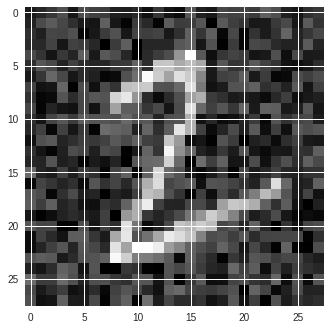

The network predicted a class label of 2


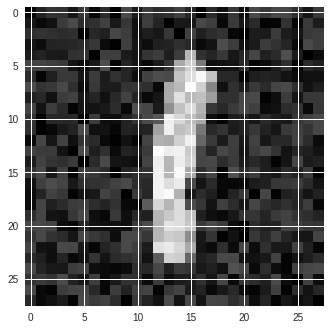

The network predicted a class label of 1


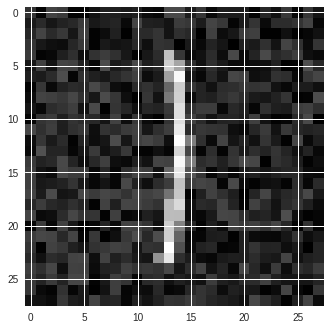

The network predicted a class label of 1


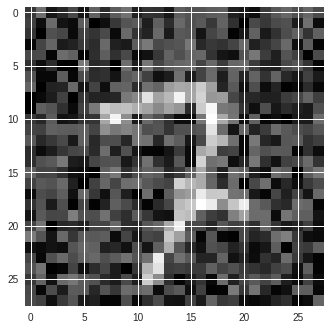

The network predicted a class label of 7


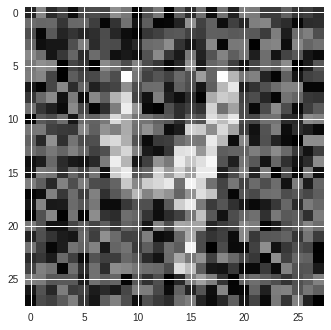

The network predicted a class label of 8


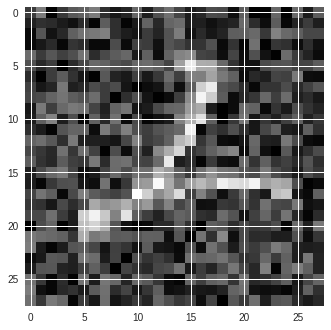

The network predicted a class label of 2


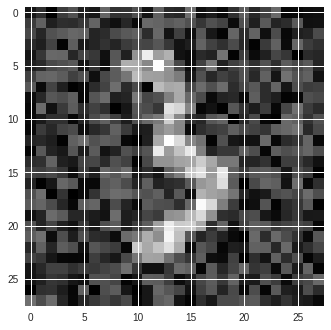

The network predicted a class label of 3


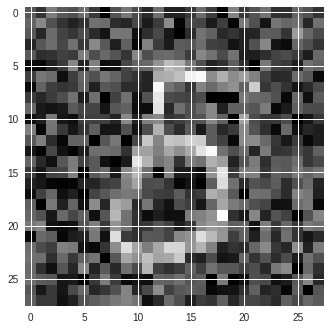

The network predicted a class label of 2


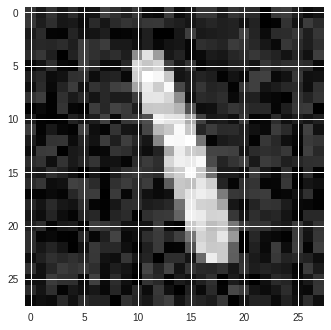

The network predicted a class label of 1


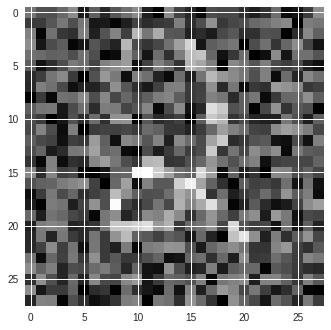

The network predicted a class label of 2


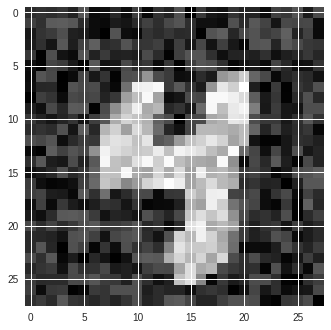

The network predicted a class label of 4


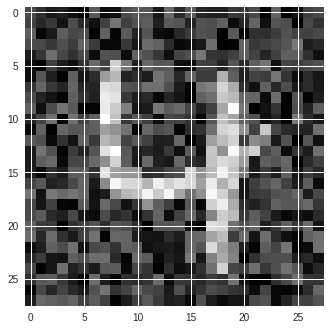

The network predicted a class label of 4


In [0]:
Transfer_Attack_KerasModel(model=Madry_model, transfer_attack_images="StandardCNN_adversaries.csv")

The Madry network performs well against standard CNN adversaries, getting 10/10.

####Madry Model vs Binding CNN Adversaries

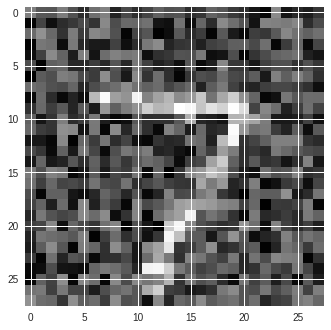

The network predicted a class label of 0


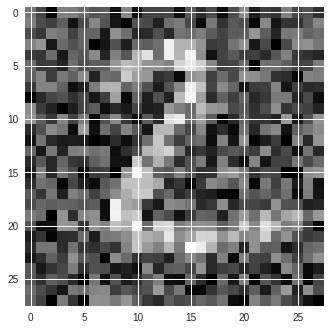

The network predicted a class label of 2


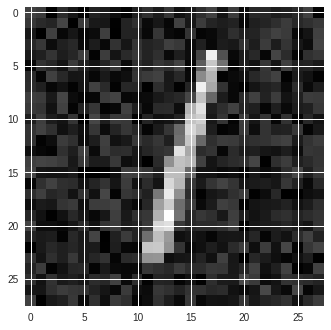

The network predicted a class label of 1


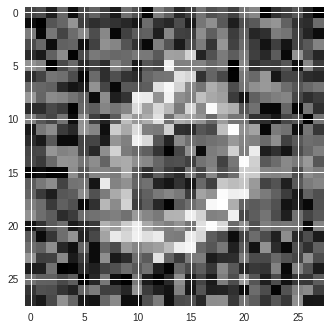

The network predicted a class label of 0


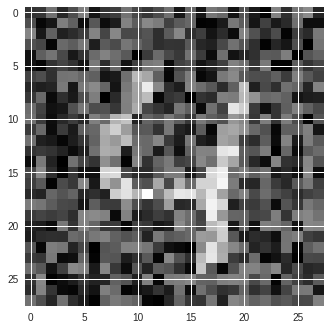

The network predicted a class label of 4


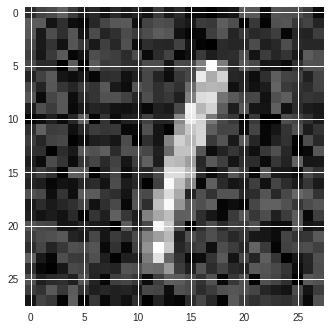

The network predicted a class label of 1


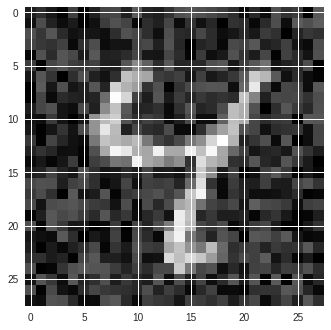

The network predicted a class label of 4


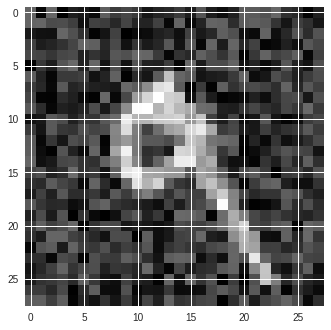

The network predicted a class label of 9


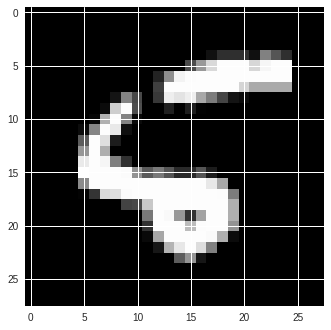

The network predicted a class label of 5


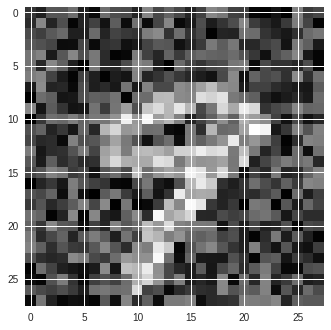

The network predicted a class label of 8


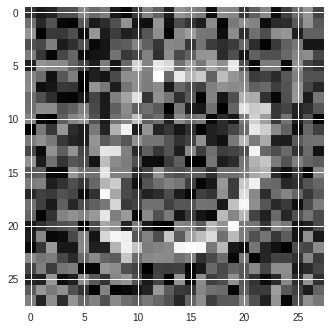

The network predicted a class label of 0


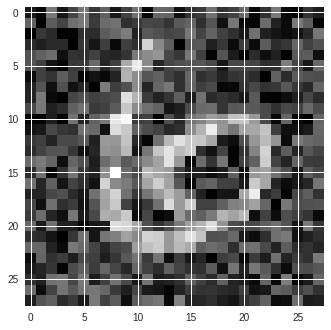

The network predicted a class label of 6


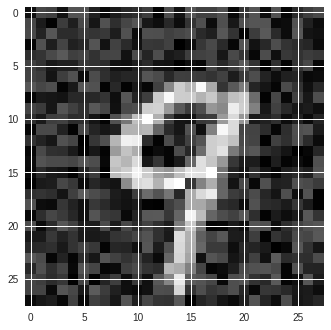

The network predicted a class label of 9


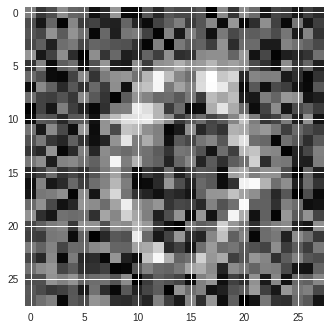

The network predicted a class label of 0


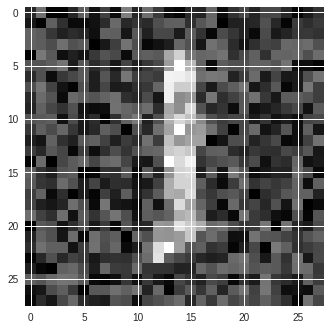

The network predicted a class label of 1


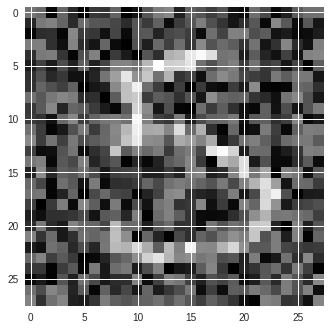

The network predicted a class label of 5


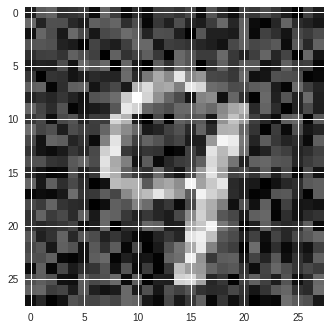

The network predicted a class label of 9


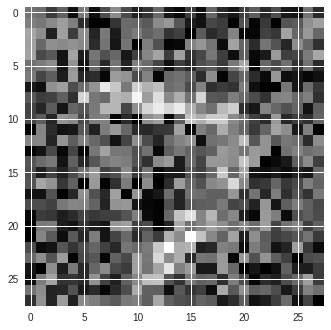

The network predicted a class label of 0


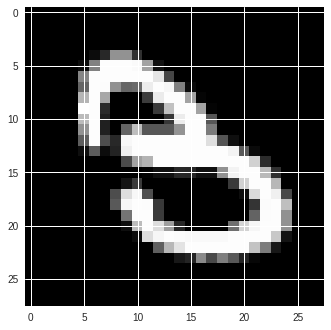

The network predicted a class label of 3


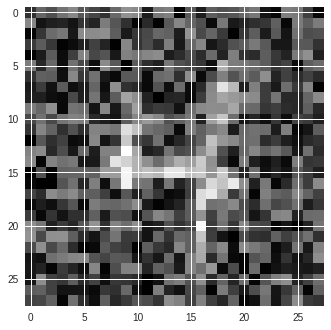

The network predicted a class label of 4


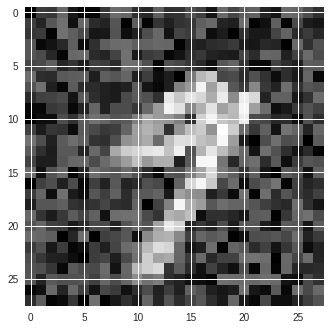

The network predicted a class label of 9


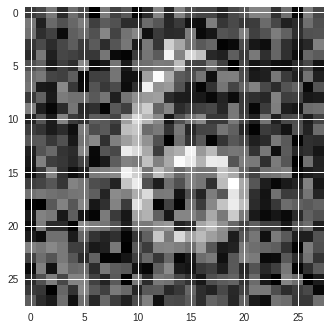

The network predicted a class label of 6


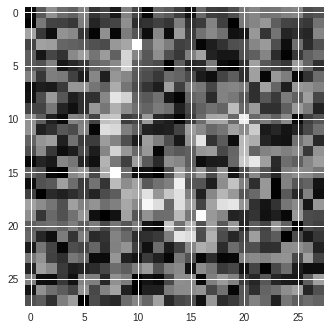

The network predicted a class label of 0


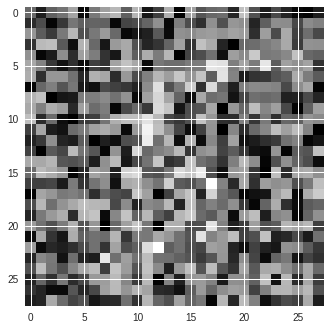

The network predicted a class label of 0


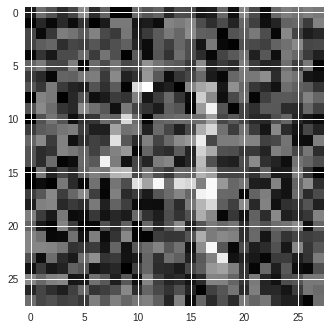

The network predicted a class label of 9


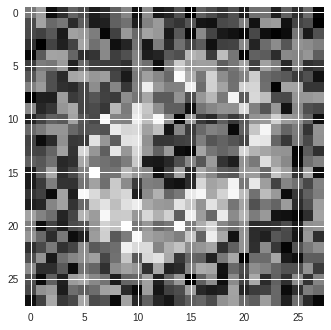

The network predicted a class label of 0


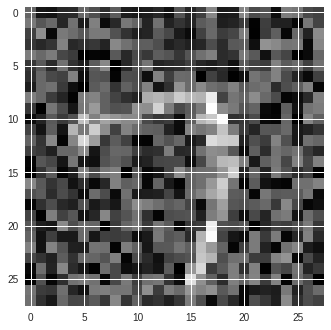

The network predicted a class label of 0


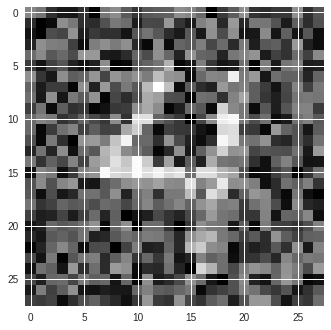

The network predicted a class label of 2


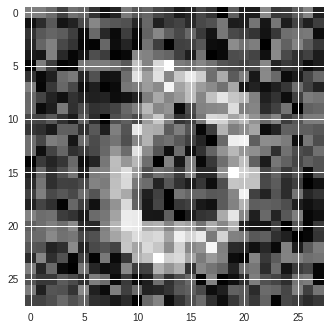

The network predicted a class label of 0


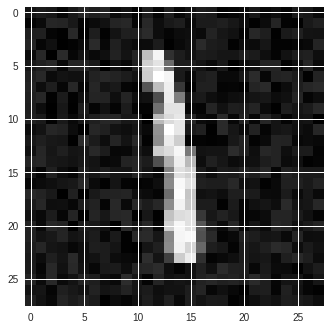

The network predicted a class label of 1


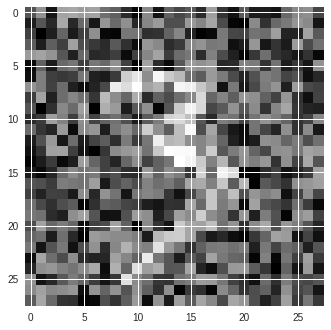

The network predicted a class label of 0


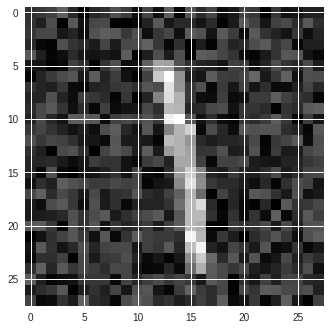

The network predicted a class label of 1


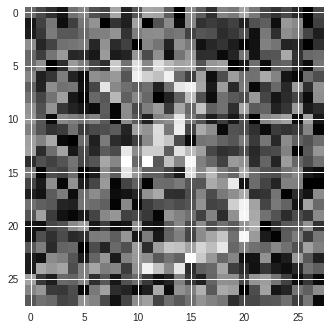

The network predicted a class label of 0


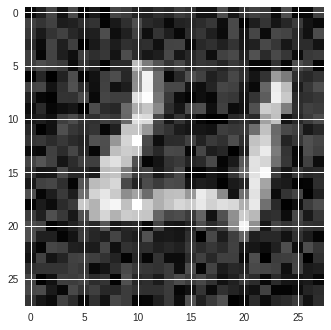

The network predicted a class label of 4


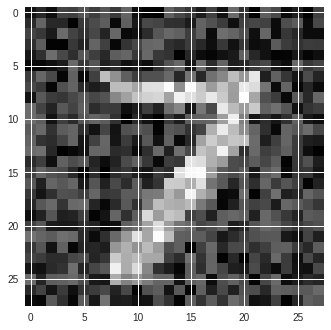

The network predicted a class label of 7


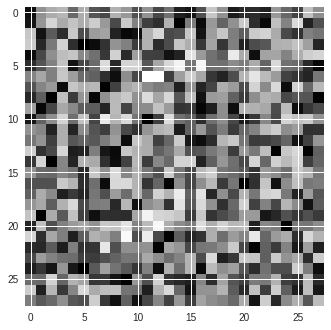

The network predicted a class label of 0


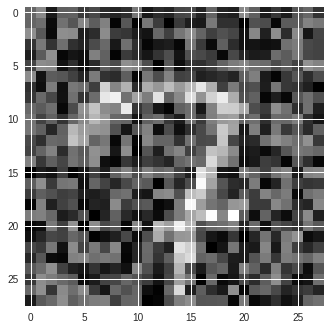

The network predicted a class label of 0


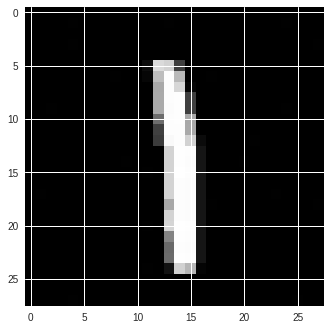

The network predicted a class label of 1


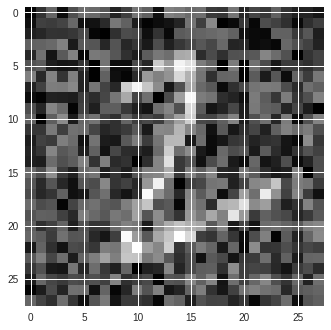

The network predicted a class label of 2


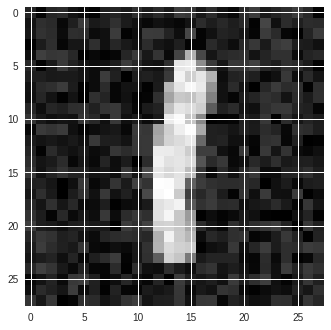

The network predicted a class label of 1


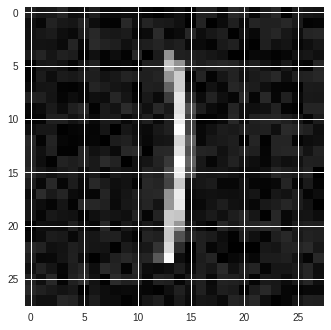

The network predicted a class label of 1


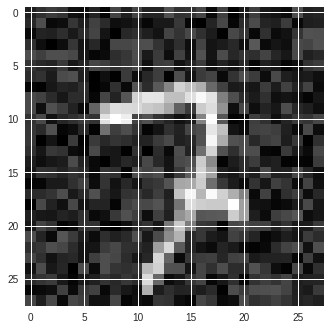

The network predicted a class label of 7


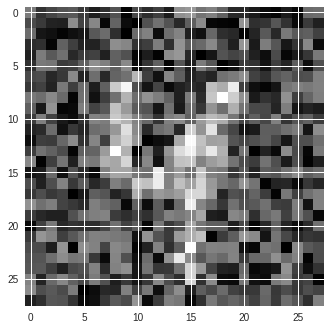

The network predicted a class label of 8


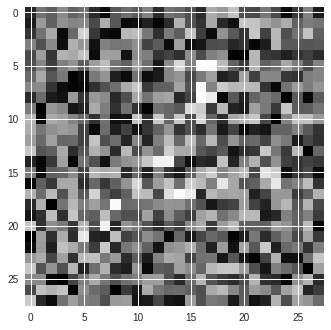

The network predicted a class label of 2


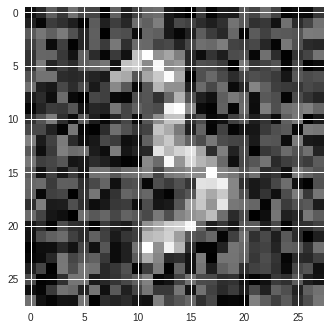

The network predicted a class label of 5


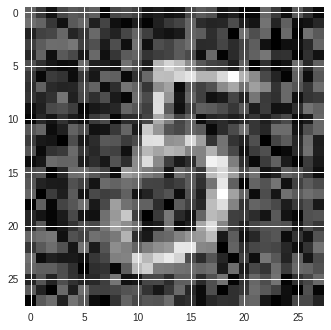

The network predicted a class label of 5


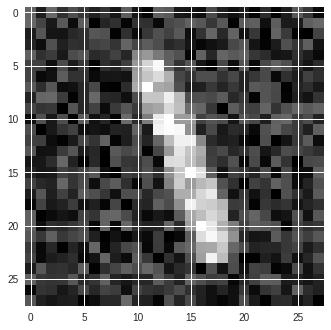

The network predicted a class label of 1


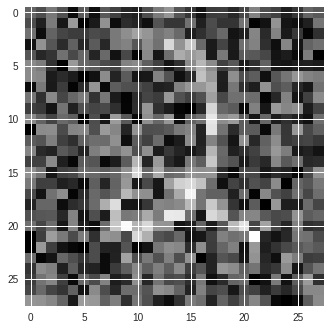

The network predicted a class label of 2


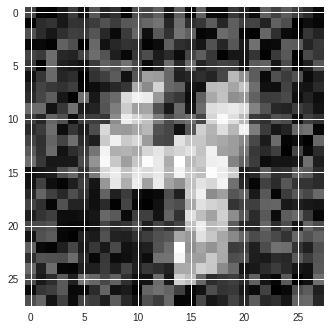

The network predicted a class label of 4


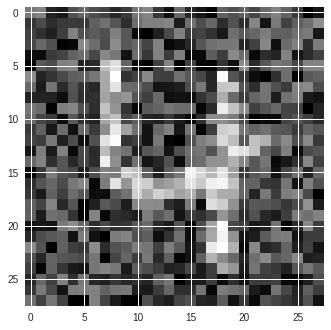

The network predicted a class label of 4


In [0]:
Transfer_Attack_KerasModel(model=Madry_model, transfer_attack_images="BindingNetwork_adversaries.csv")

The Madry network does reasonably well against the Binding-CNN adversaries, scoring 7/10. Note this may be more appropriately measured as 5/8, given that the '0' above is essentially uninformative to a human, and that the second-to-last example of a 5 is also arguably of poor ground-truth.

####Madry Model vs Its Own Adversaries

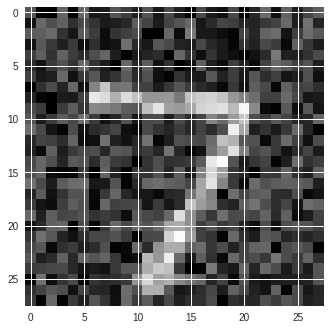

The network predicted a class label of 2


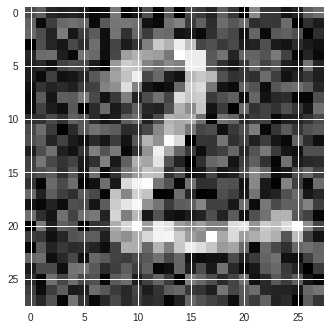

The network predicted a class label of 0


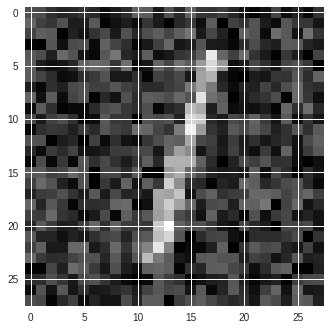

The network predicted a class label of 2


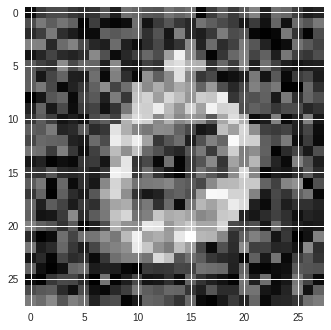

The network predicted a class label of 2


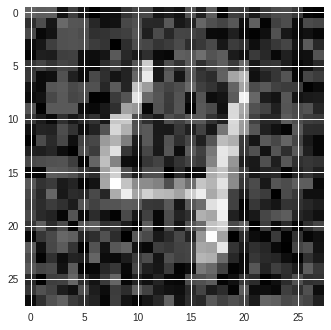

The network predicted a class label of 9


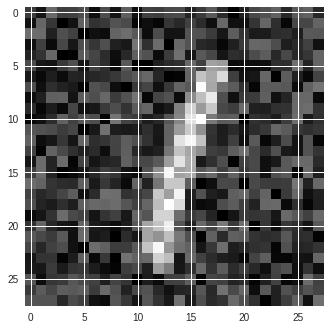

The network predicted a class label of 2


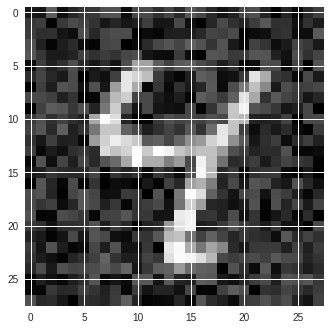

The network predicted a class label of 8


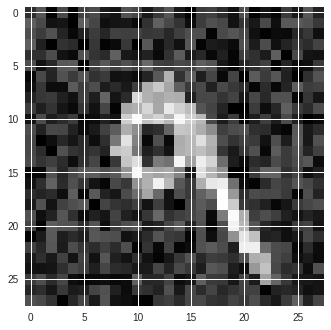

The network predicted a class label of 4


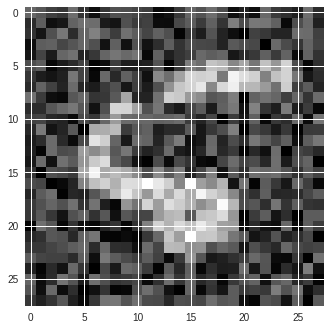

The network predicted a class label of 6


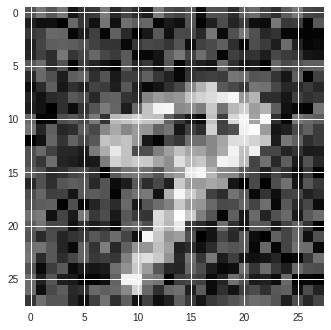

The network predicted a class label of 8


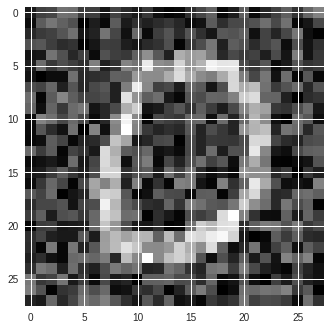

The network predicted a class label of 2


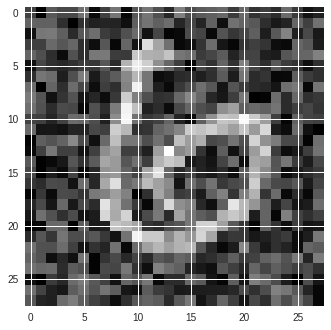

The network predicted a class label of 0


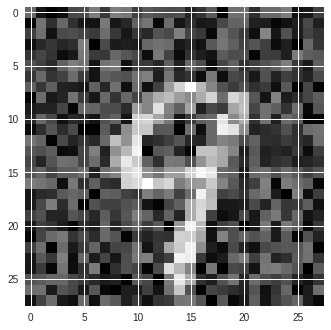

The network predicted a class label of 8


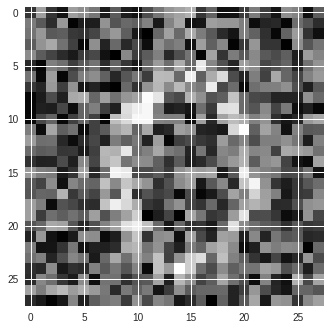

The network predicted a class label of 2


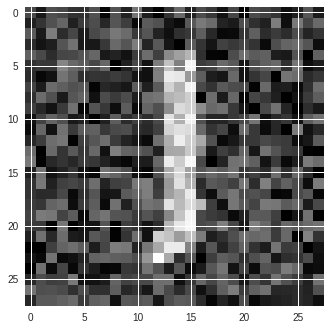

The network predicted a class label of 2


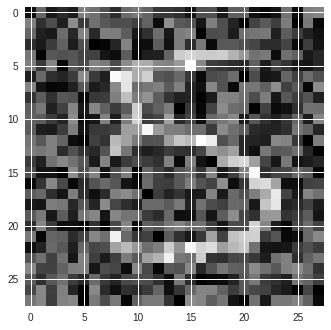

The network predicted a class label of 0


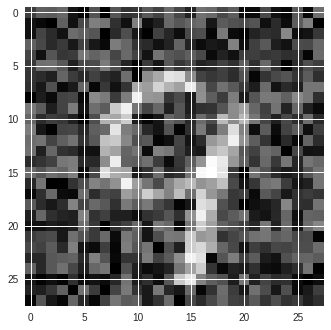

The network predicted a class label of 8


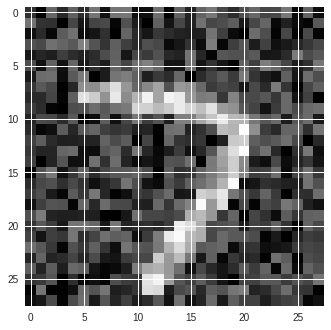

The network predicted a class label of 0


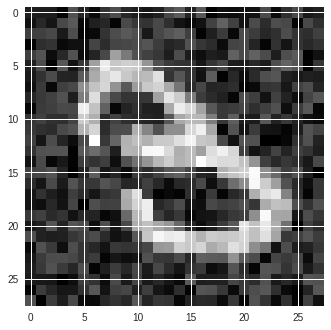

The network predicted a class label of 5


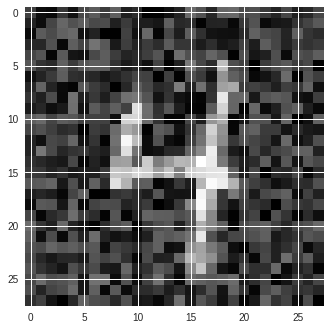

The network predicted a class label of 9


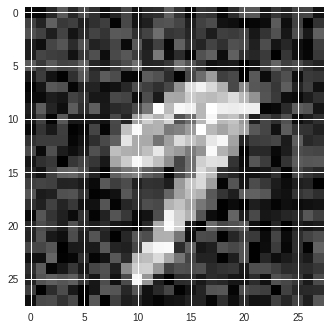

The network predicted a class label of 4


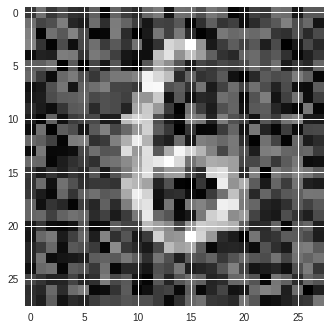

The network predicted a class label of 0


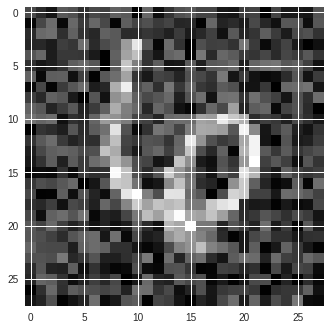

The network predicted a class label of 0


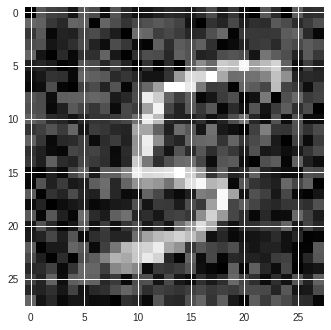

The network predicted a class label of 8


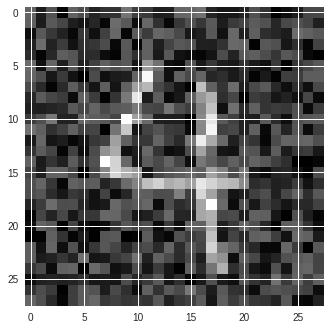

The network predicted a class label of 9


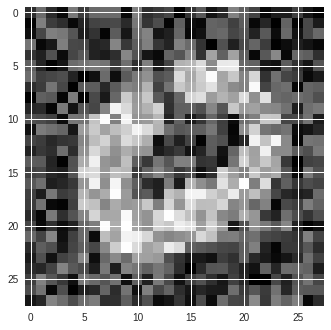

The network predicted a class label of 2


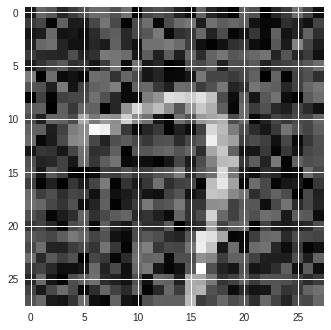

The network predicted a class label of 0


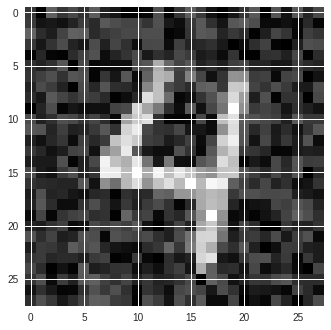

The network predicted a class label of 9


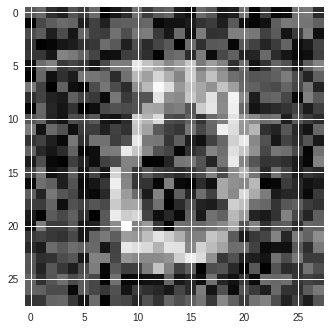

The network predicted a class label of 2


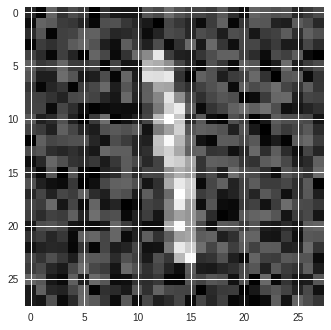

The network predicted a class label of 8


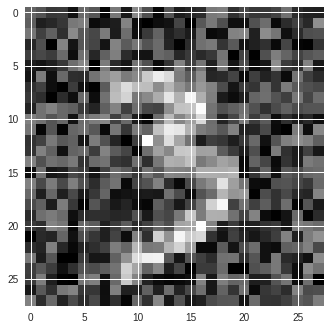

The network predicted a class label of 2


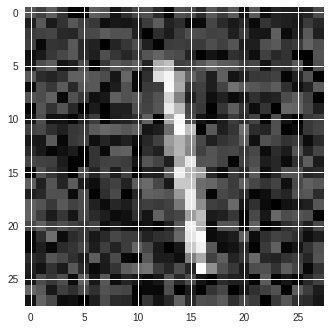

The network predicted a class label of 8


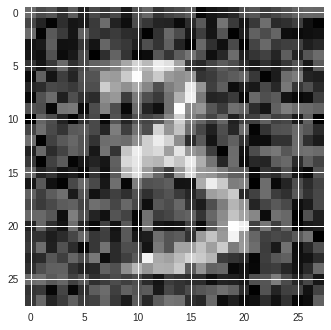

The network predicted a class label of 8


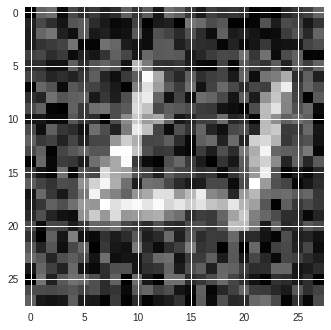

The network predicted a class label of 0


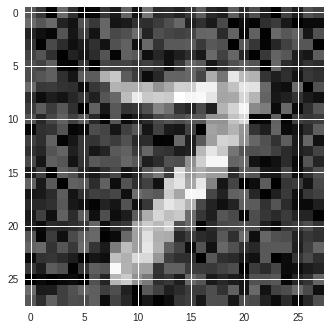

The network predicted a class label of 3


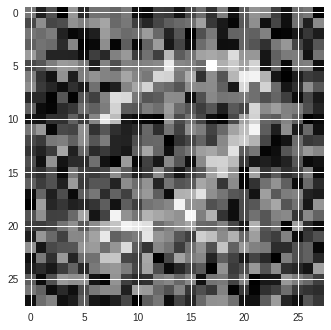

The network predicted a class label of 0


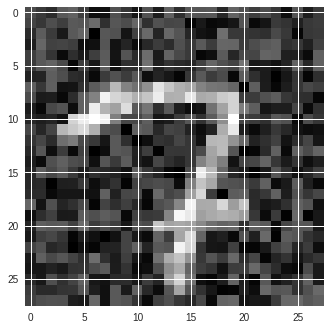

The network predicted a class label of 2


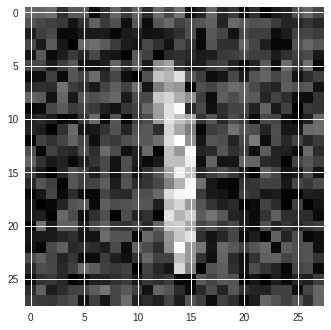

The network predicted a class label of 8


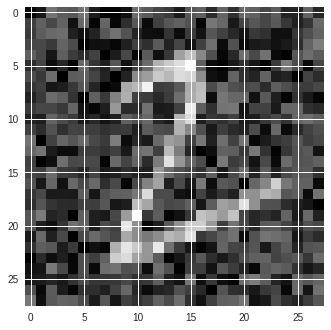

The network predicted a class label of 8


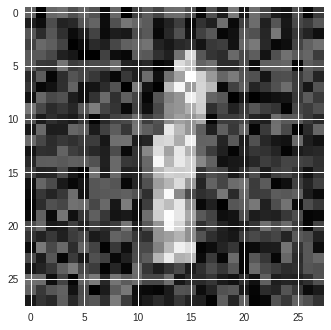

The network predicted a class label of 8


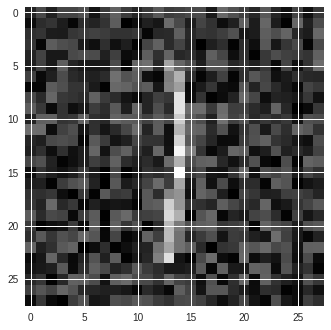

The network predicted a class label of 8


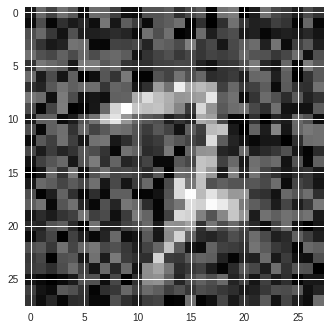

The network predicted a class label of 0


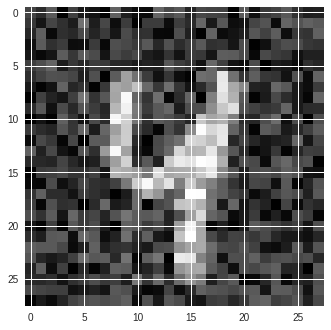

The network predicted a class label of 8


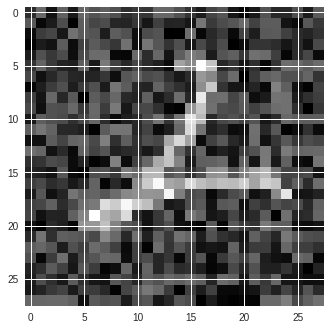

The network predicted a class label of 8


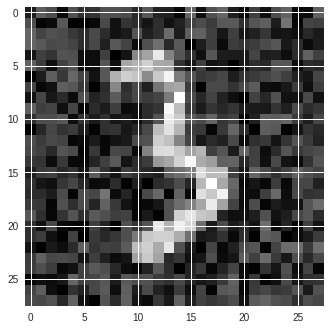

The network predicted a class label of 2


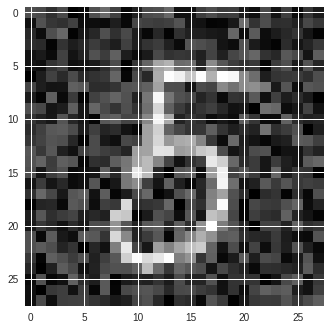

The network predicted a class label of 8


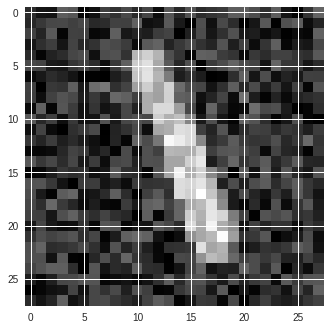

The network predicted a class label of 8


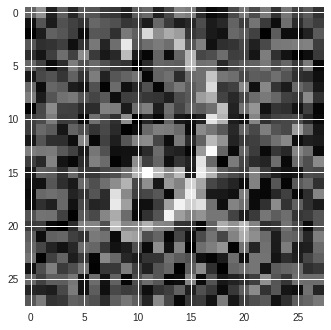

The network predicted a class label of 8


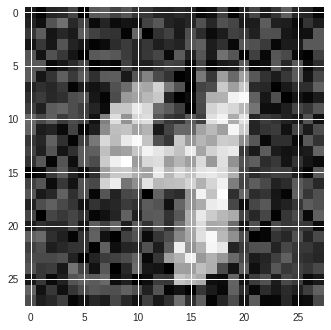

The network predicted a class label of 9


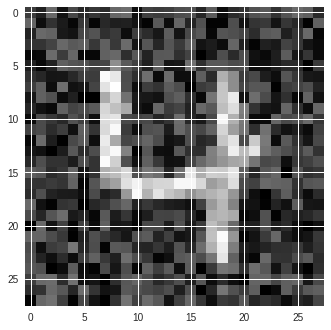

The network predicted a class label of 9


In [0]:
#Double check the adversaries work against the model they were developed for
Transfer_Attack_KerasModel(model=Madry_model, transfer_attack_images="Madry_adversaries.csv")

As expected, the Madry network scores 0/10 against its own adversaries.

###Transfer Attacks Against the TensorFlow Models

In [0]:
def Transfer_Attack_prediction_customTensorFlowModel(model_prediction_function, model_weights, var_list, test_image, temp_batch_size):
    
    predictions = model_prediction_function(x, temp_batch_size)
    
    saver = tf.train.Saver(var_list)
    
    with tf.Session() as sess:
        saver.restore(sess, model_weights)
        
        output_predictions = sess.run([predictions], feed_dict={x: test_image})
                
        return output_predictions

In [0]:
def Transfer_Attack_customTensorFlowModel(model_prediction_function, model_weights, var_list, transfer_attack_images, temp_batch_size):
    
    #Load transfer_attack_images and reshape
    transfer_images = np.genfromtxt(transfer_attack_images, delimiter=',')
    
    
    transfer_images = np.reshape(transfer_images, [transfer_images.shape[0], 28, 28, 1])

    
    for ii in range(transfer_images.shape[0]):
        test_image = transfer_images[ii, :, :, :]
        
        output_predictions = Transfer_Attack_prediction_customTensorFlowModel(model_prediction_function, model_weights, var_list, 
                                                                              test_image[None, :, :, :], temp_batch_size)
        
        plt.imshow(test_image[:,:,0], cmap='gray')
        plt.show()
        print("The network predicted a class label of " + str(np.argmax(output_predictions)))

####Standard CNN vs Madry Adversaries

INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


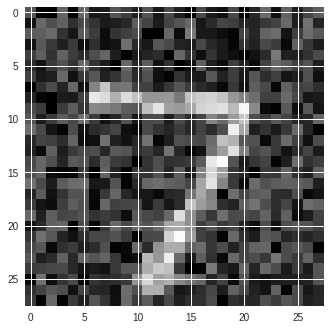

The network predicted a class label of 7
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


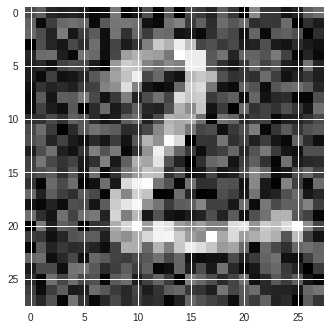

The network predicted a class label of 2
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


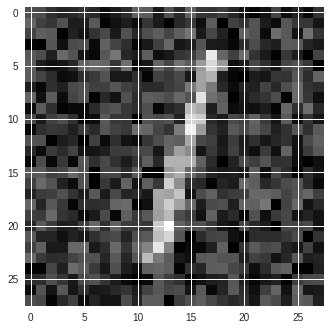

The network predicted a class label of 2
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


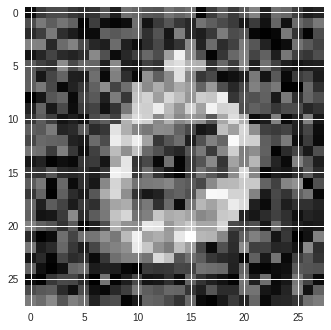

The network predicted a class label of 0
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


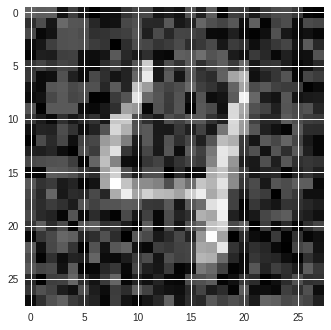

The network predicted a class label of 9
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


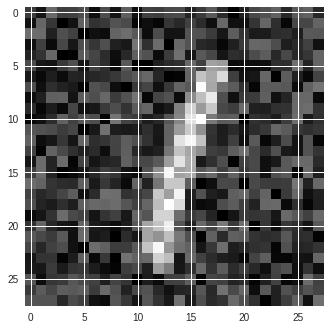

The network predicted a class label of 8
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


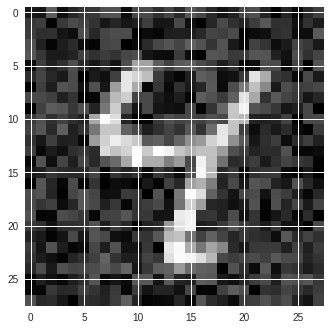

The network predicted a class label of 4
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


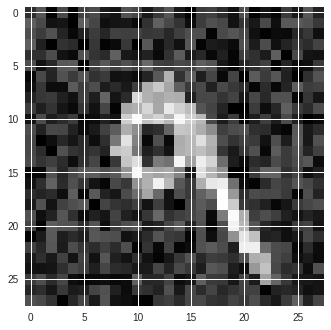

The network predicted a class label of 5
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


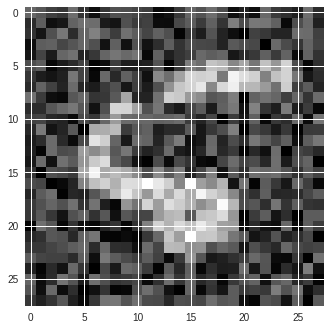

The network predicted a class label of 5
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


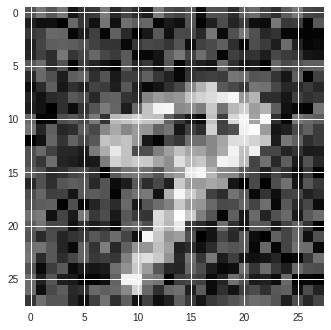

The network predicted a class label of 9
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


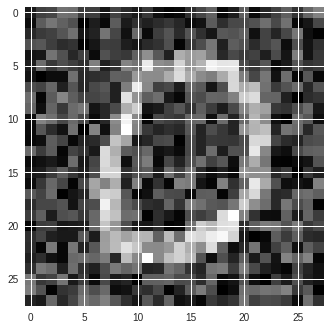

The network predicted a class label of 0
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


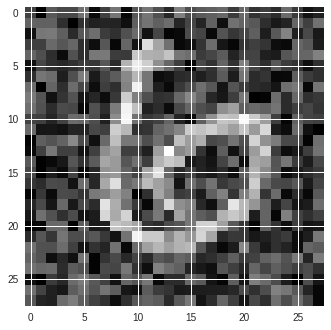

The network predicted a class label of 5
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


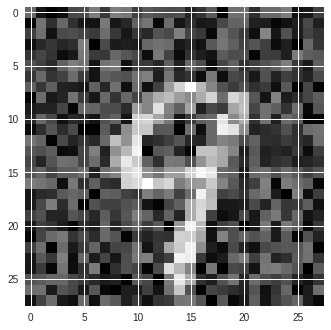

The network predicted a class label of 9
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


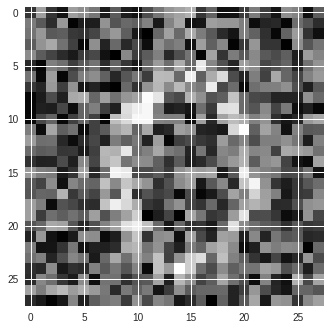

The network predicted a class label of 0
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


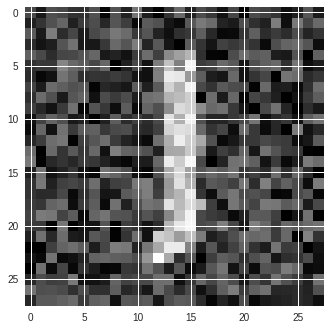

The network predicted a class label of 3
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


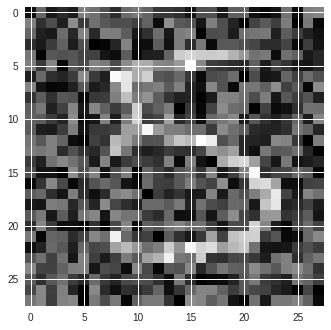

The network predicted a class label of 5
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


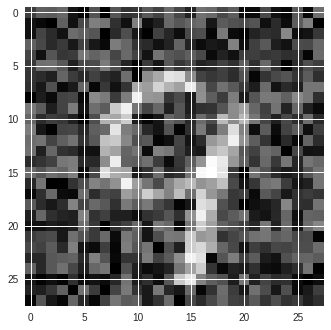

The network predicted a class label of 9
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


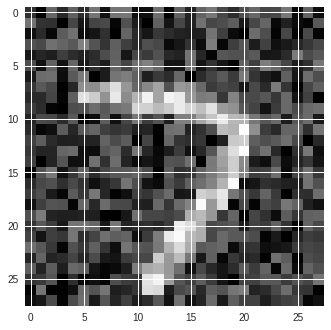

The network predicted a class label of 7
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


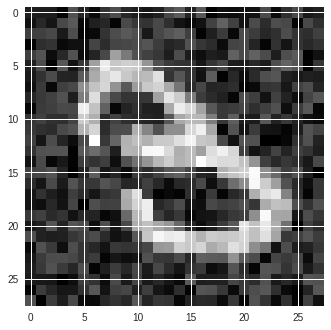

The network predicted a class label of 3
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


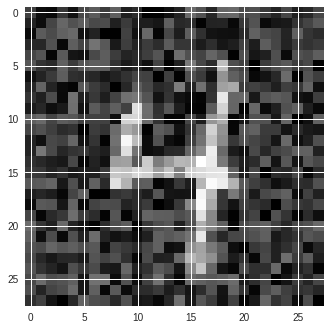

The network predicted a class label of 4
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


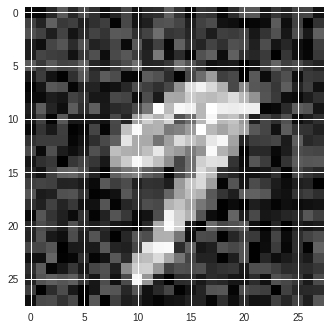

The network predicted a class label of 9
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


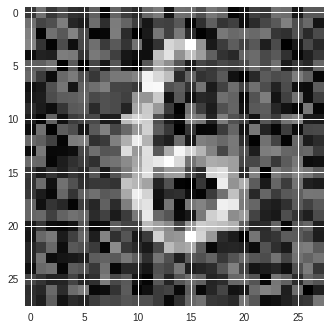

The network predicted a class label of 5
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


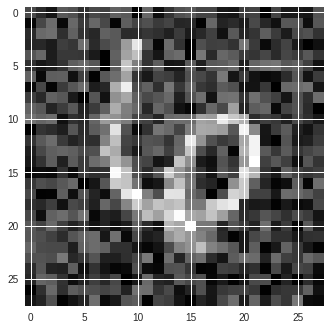

The network predicted a class label of 6
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


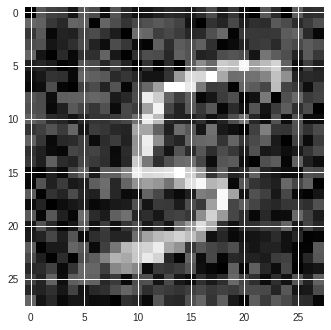

The network predicted a class label of 5
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


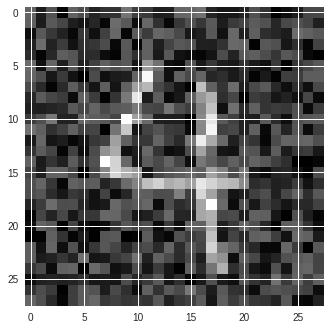

The network predicted a class label of 5
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


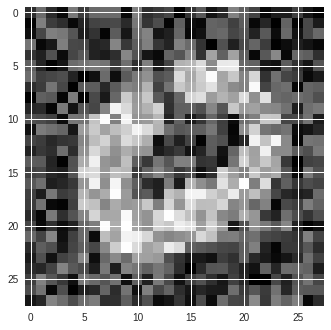

The network predicted a class label of 0
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


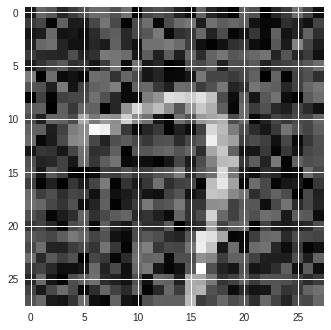

The network predicted a class label of 7
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


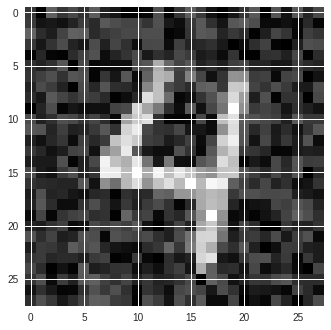

The network predicted a class label of 4
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


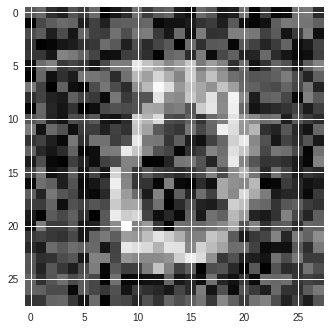

The network predicted a class label of 0
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


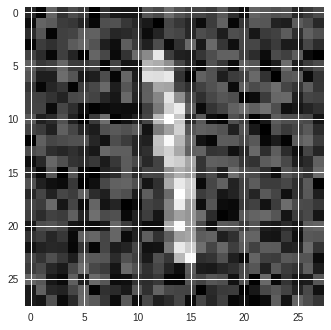

The network predicted a class label of 8
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


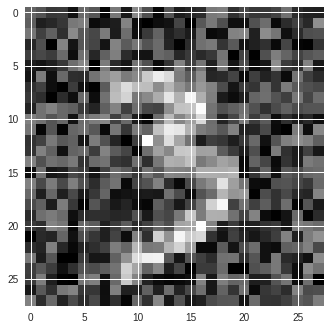

The network predicted a class label of 3
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


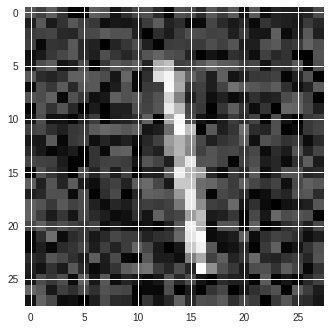

The network predicted a class label of 3
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


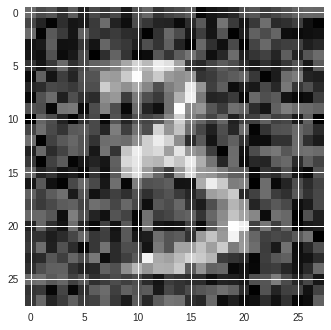

The network predicted a class label of 3
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


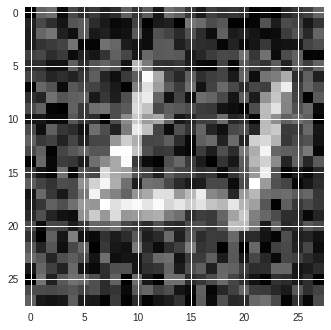

The network predicted a class label of 6
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


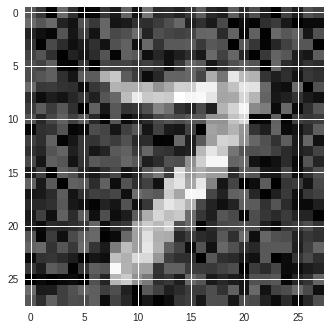

The network predicted a class label of 7
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


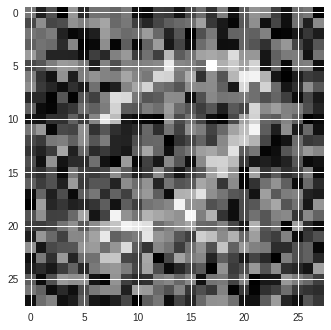

The network predicted a class label of 2
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


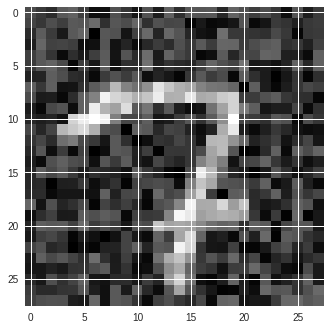

The network predicted a class label of 7
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


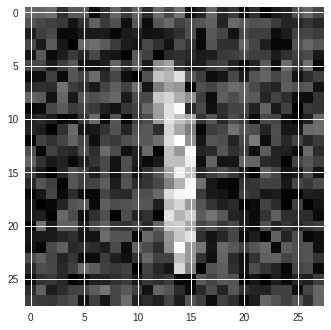

The network predicted a class label of 8
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


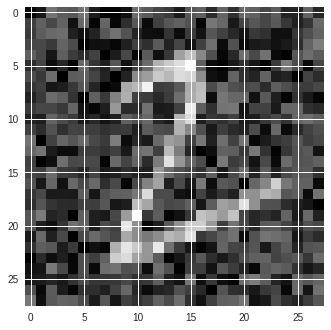

The network predicted a class label of 2
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


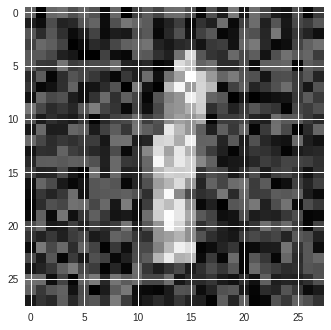

The network predicted a class label of 8
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


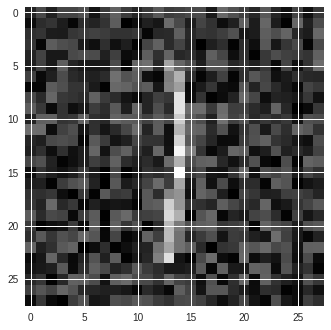

The network predicted a class label of 8
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


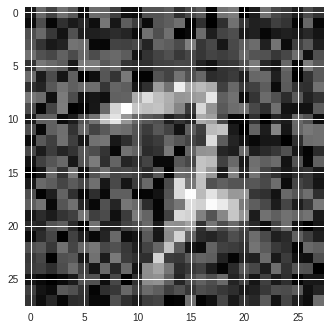

The network predicted a class label of 2
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


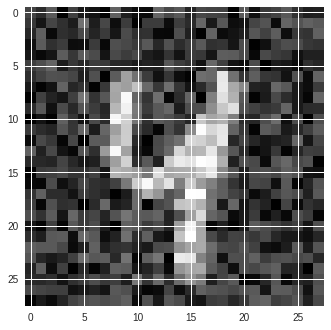

The network predicted a class label of 4
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


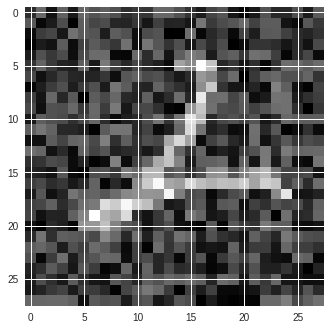

The network predicted a class label of 2
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


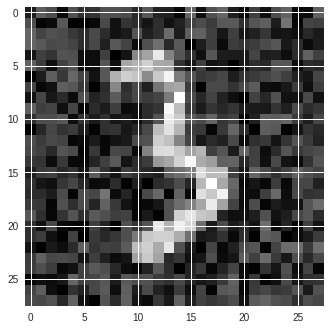

The network predicted a class label of 3
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


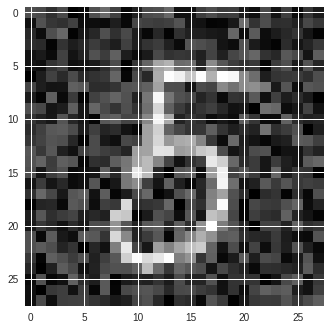

The network predicted a class label of 5
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


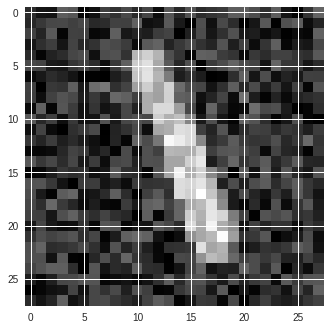

The network predicted a class label of 3
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


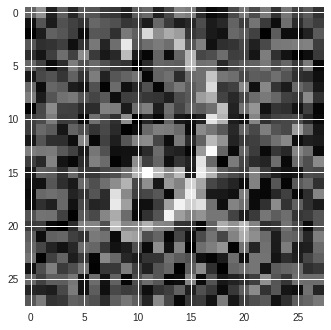

The network predicted a class label of 2
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


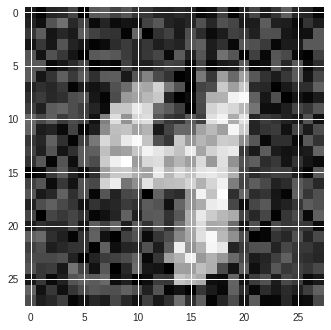

The network predicted a class label of 4
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


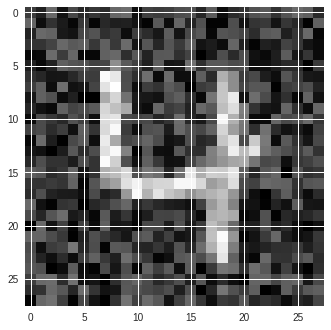

The network predicted a class label of 4


In [0]:
Transfer_Attack_customTensorFlowModel(model_prediction_function=cnn_predictions,
                                      model_weights="/MNIST_LeNet5_CNN.ckpt", 
                                      var_list=var_list_LeNet,
                                      transfer_attack_images="Madry_adversaries.csv",
                                      temp_batch_size=None)

The standard CNN scores 5/10 against the Madry examples; this is worse than the binding CNN, but not significantly so, suggesting that the binding-CNN may have most of its advantage simply from e.g. more parameters.

####Standard CNN vs Binding Network Adversaries

INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


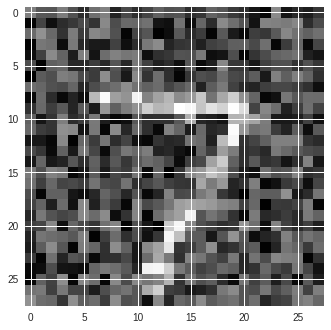

The network predicted a class label of 7
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


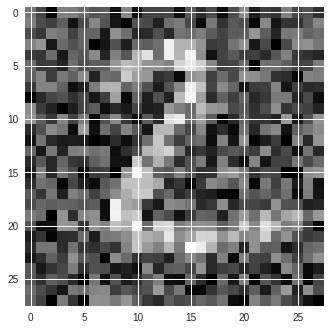

The network predicted a class label of 2
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


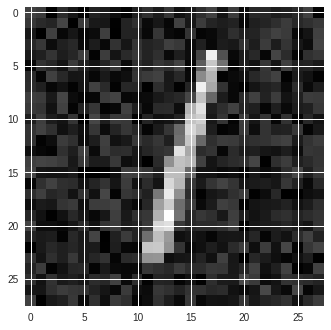

The network predicted a class label of 1
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


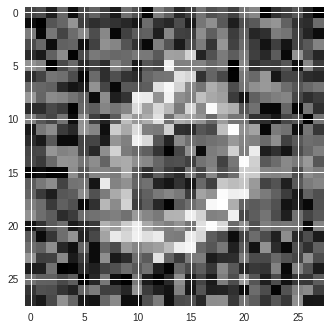

The network predicted a class label of 0
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


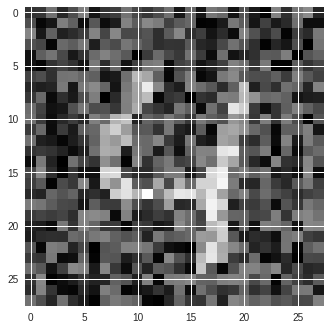

The network predicted a class label of 9
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


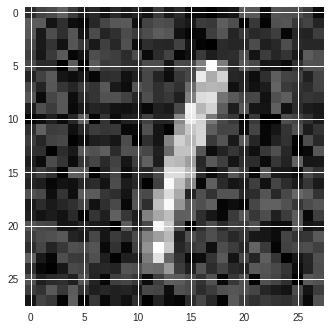

The network predicted a class label of 1
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


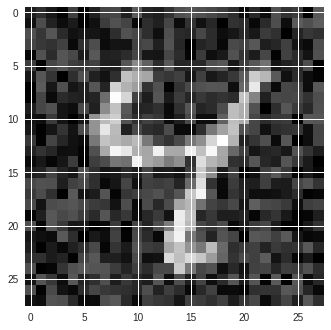

The network predicted a class label of 4
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


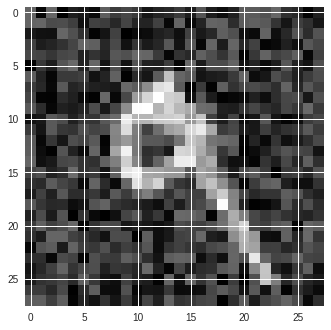

The network predicted a class label of 5
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


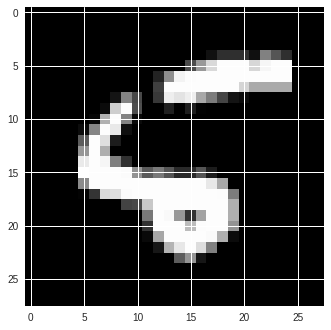

The network predicted a class label of 5
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


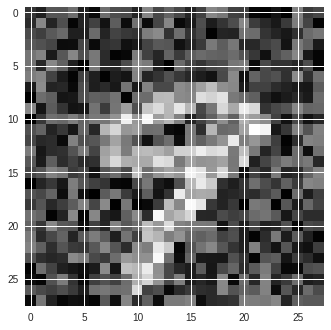

The network predicted a class label of 9
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


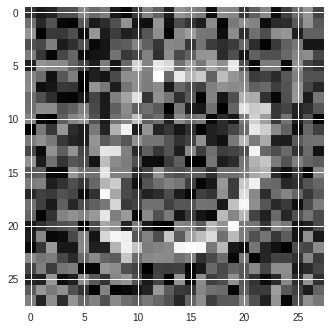

The network predicted a class label of 0
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


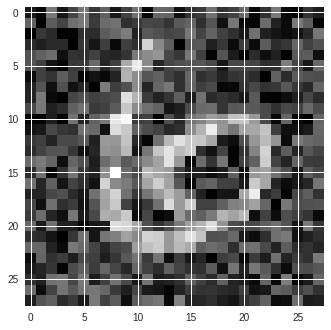

The network predicted a class label of 5
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


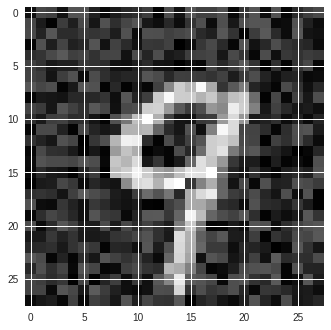

The network predicted a class label of 9
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


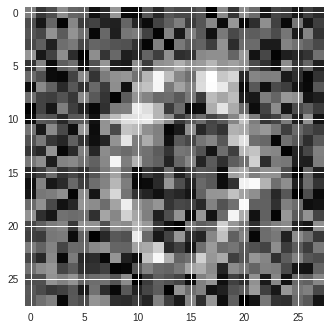

The network predicted a class label of 0
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


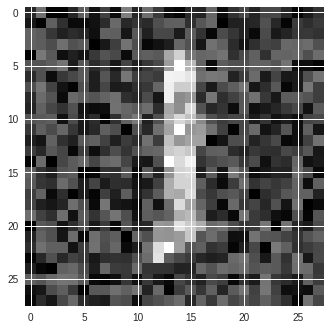

The network predicted a class label of 3
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


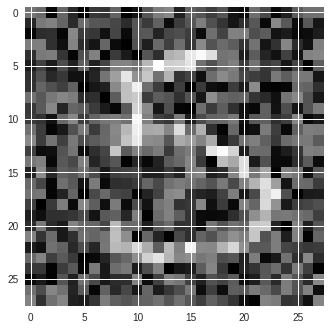

The network predicted a class label of 5
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


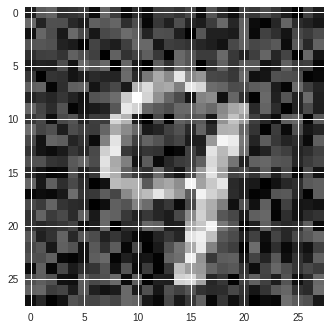

The network predicted a class label of 9
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


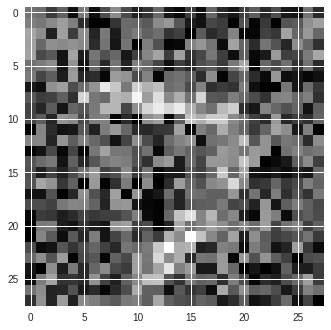

The network predicted a class label of 3
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


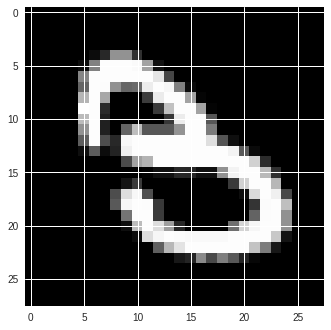

The network predicted a class label of 3
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


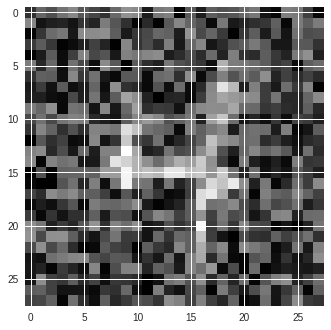

The network predicted a class label of 5
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


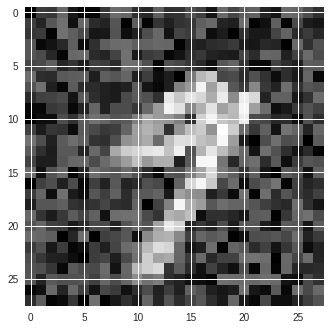

The network predicted a class label of 9
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


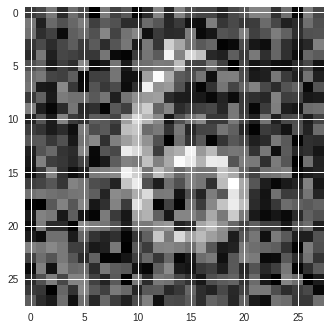

The network predicted a class label of 5
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


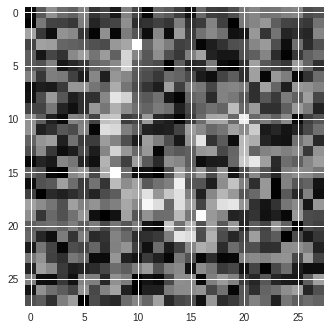

The network predicted a class label of 5
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


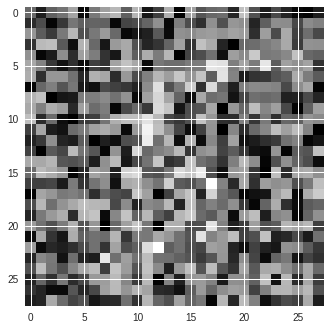

The network predicted a class label of 5
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


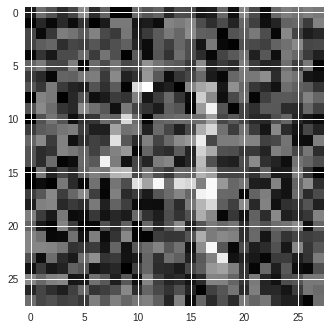

The network predicted a class label of 5
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


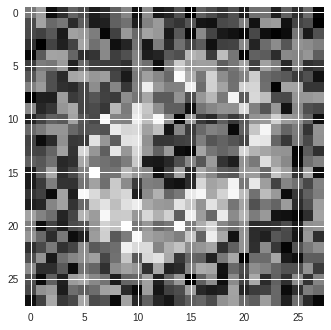

The network predicted a class label of 8
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


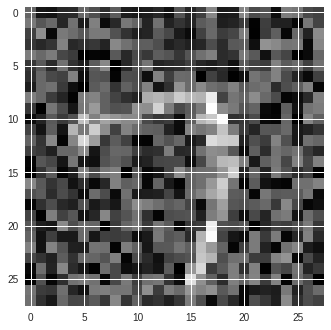

The network predicted a class label of 5
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


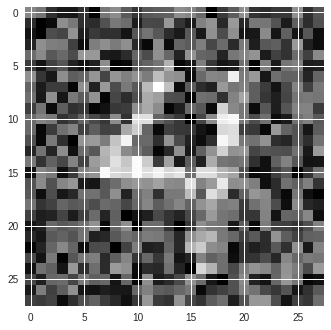

The network predicted a class label of 9
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


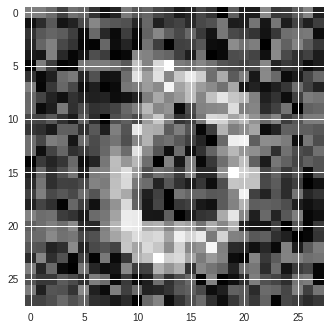

The network predicted a class label of 0
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


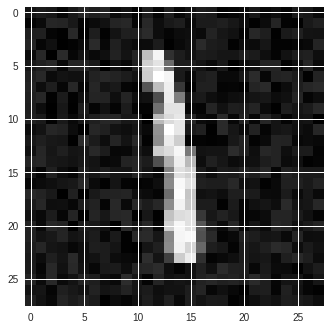

The network predicted a class label of 1
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


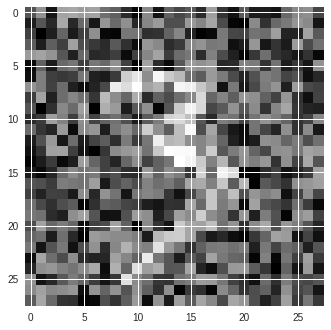

The network predicted a class label of 3
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


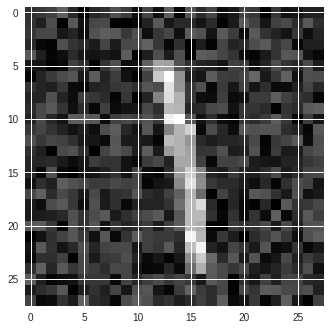

The network predicted a class label of 5
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


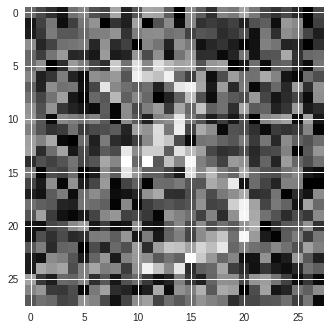

The network predicted a class label of 5
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


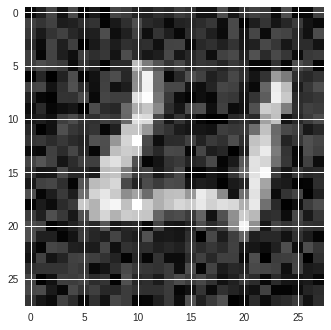

The network predicted a class label of 4
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


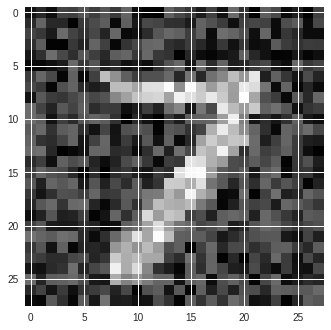

The network predicted a class label of 7
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


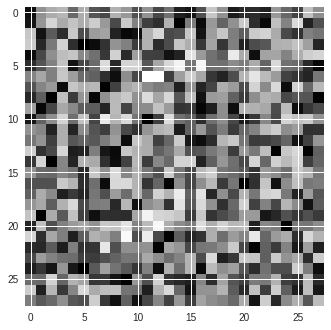

The network predicted a class label of 5
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


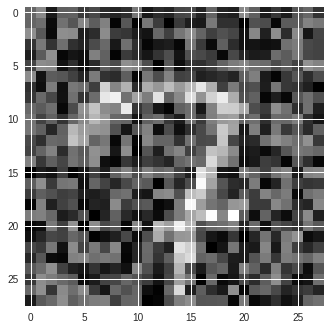

The network predicted a class label of 3
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


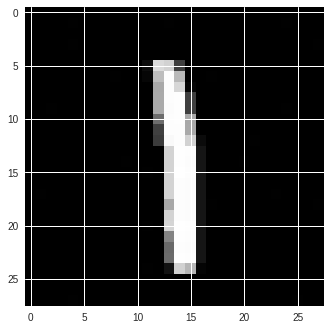

The network predicted a class label of 1
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


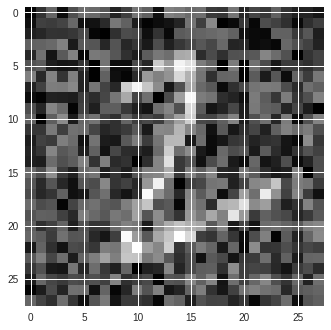

The network predicted a class label of 2
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


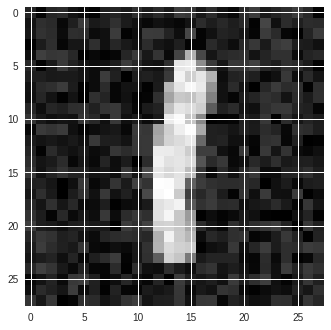

The network predicted a class label of 1
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


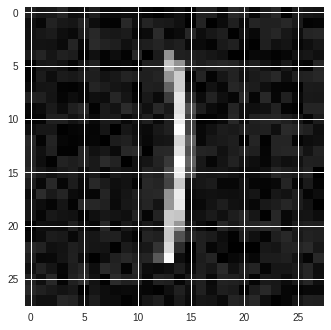

The network predicted a class label of 1
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


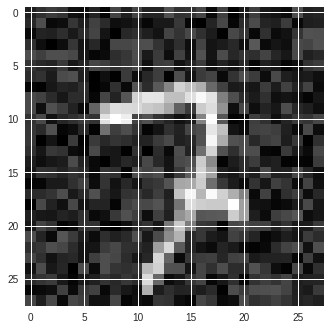

The network predicted a class label of 7
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


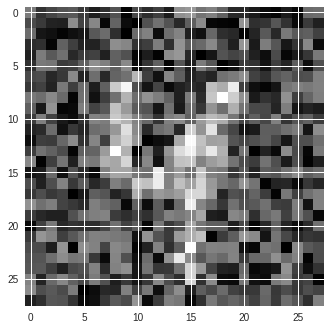

The network predicted a class label of 8
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


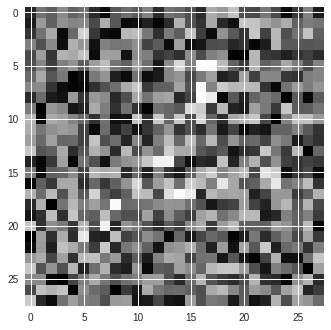

The network predicted a class label of 3
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


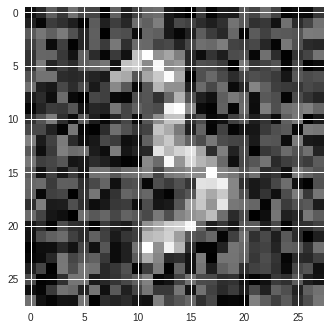

The network predicted a class label of 3
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


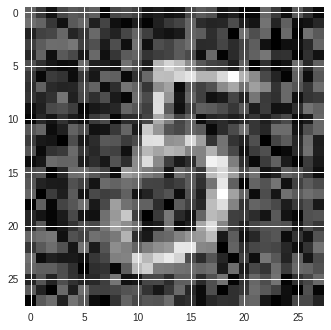

The network predicted a class label of 5
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


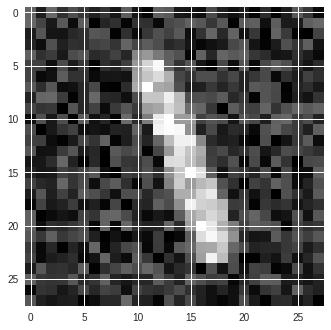

The network predicted a class label of 3
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


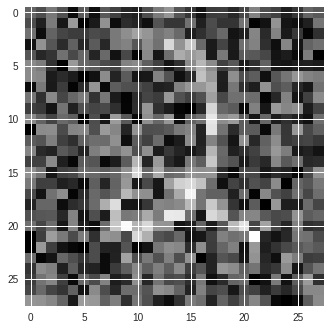

The network predicted a class label of 2
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


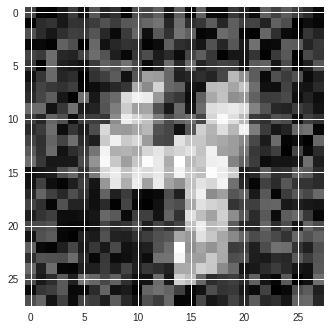

The network predicted a class label of 4
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


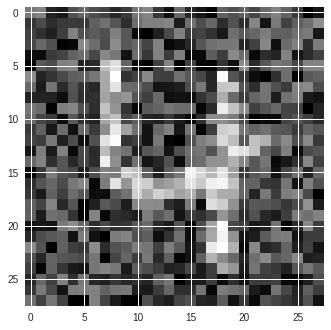

The network predicted a class label of 4


In [0]:
Transfer_Attack_customTensorFlowModel(model_prediction_function=cnn_predictions,
                                      model_weights="/MNIST_LeNet5_CNN.ckpt", 
                                      var_list=var_list_LeNet,
                                      transfer_attack_images="BindingNetwork_adversaries.csv",
                                      temp_batch_size=None)

The standard CNN performs poorly (2/10) against the binding networks adversaries.

####Standard CNN vs Its Own Adversaries

In [0]:
#Double check the adversaries work against the model they were developed for
Transfer_Attack_customTensorFlowModel(model_prediction_function=cnn_predictions,
                                      model_weights="/MNIST_LeNet5_CNN.ckpt", 
                                      var_list=var_list_LeNet,
                                      transfer_attack_images="StandardCNN_adversaries.csv",
                                      temp_batch_size=None)

As expected, the standard CNN scores 0/10 against its own adversaries.

####Binding Model vs Standard CNN Adversaries

INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


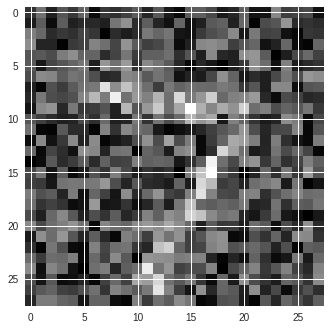

The network predicted a class label of 3
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


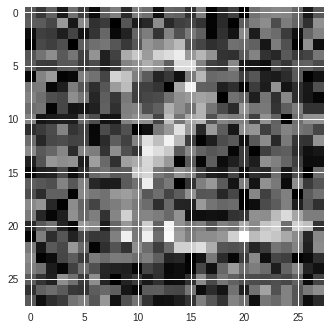

The network predicted a class label of 2
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


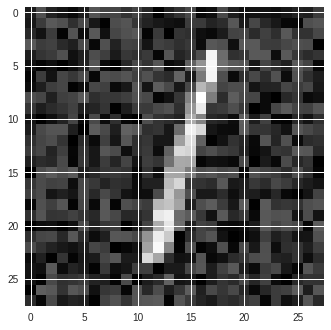

The network predicted a class label of 8
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


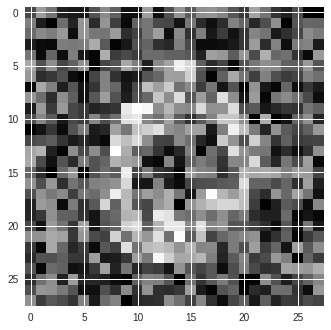

The network predicted a class label of 0
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


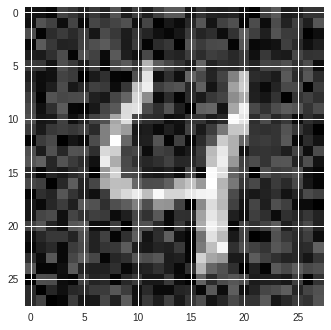

The network predicted a class label of 4
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


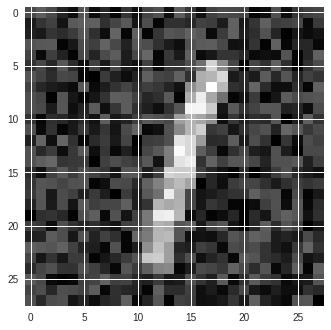

The network predicted a class label of 2
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


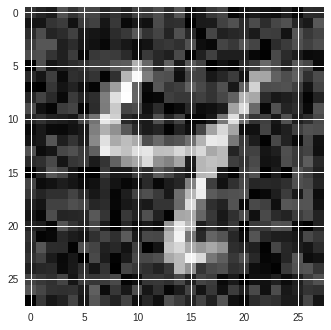

The network predicted a class label of 8
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


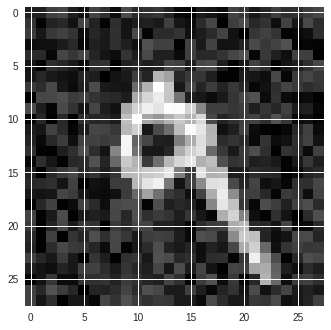

The network predicted a class label of 9
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


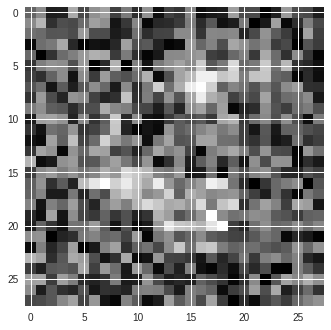

The network predicted a class label of 2
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


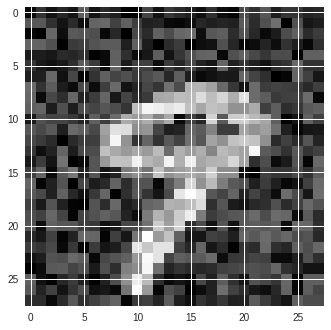

The network predicted a class label of 9
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


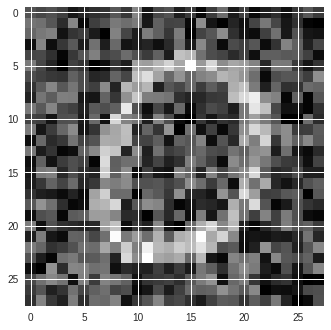

The network predicted a class label of 8
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


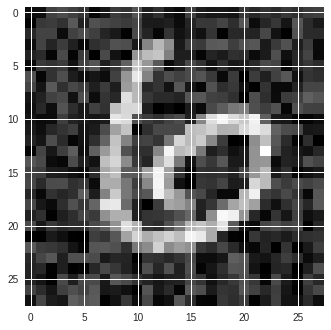

The network predicted a class label of 6
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


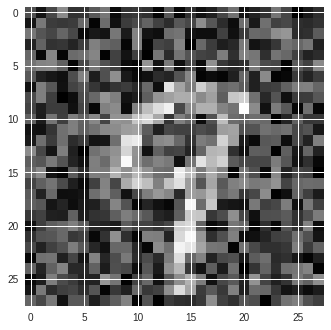

The network predicted a class label of 7
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


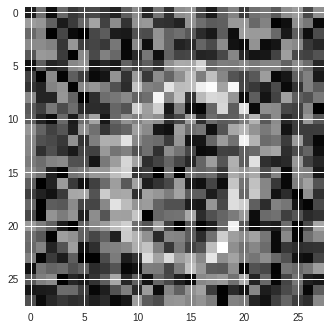

The network predicted a class label of 0
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


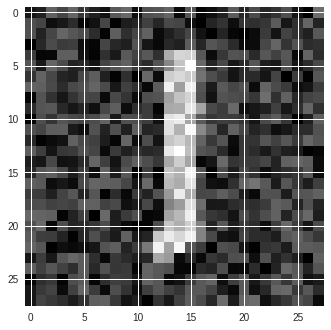

The network predicted a class label of 8
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


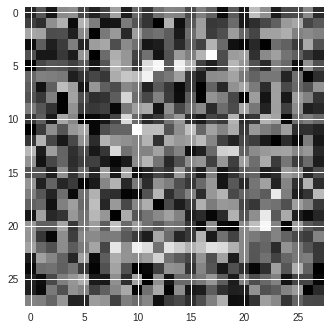

The network predicted a class label of 8
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


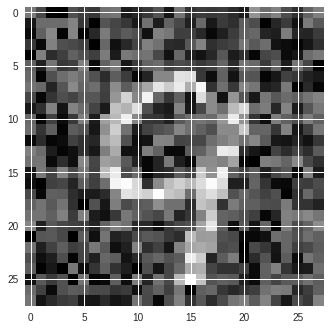

The network predicted a class label of 9
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


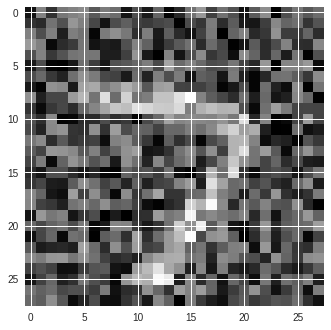

The network predicted a class label of 7
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


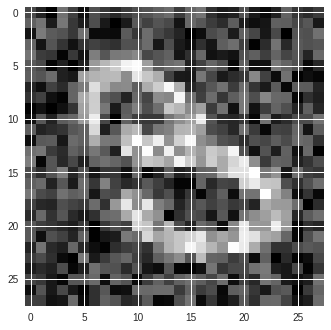

The network predicted a class label of 5
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


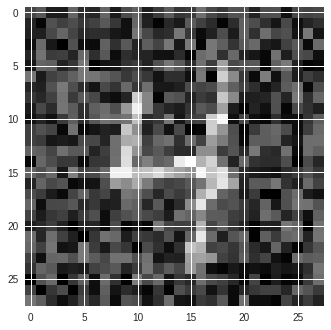

The network predicted a class label of 4
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


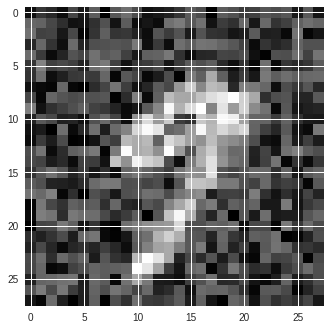

The network predicted a class label of 3
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


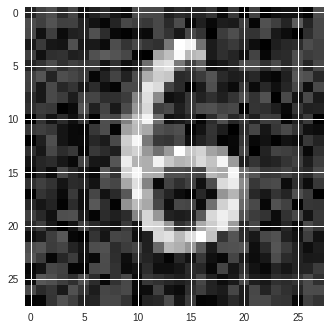

The network predicted a class label of 6
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


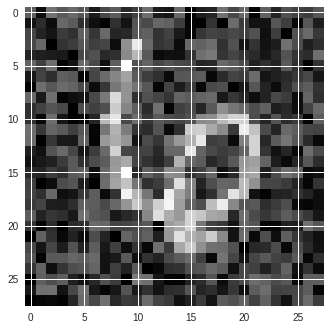

The network predicted a class label of 6
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


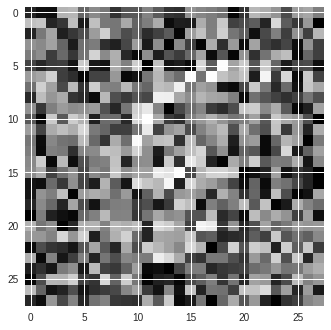

The network predicted a class label of 8
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


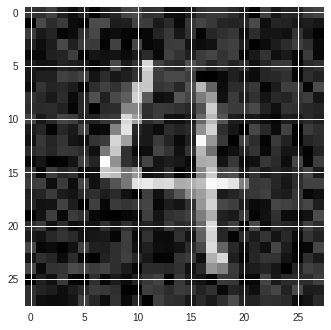

The network predicted a class label of 4
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


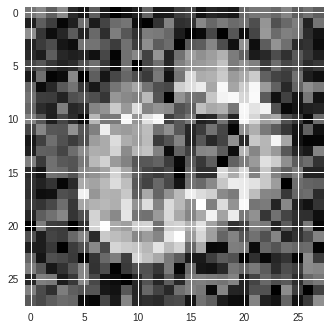

The network predicted a class label of 0
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


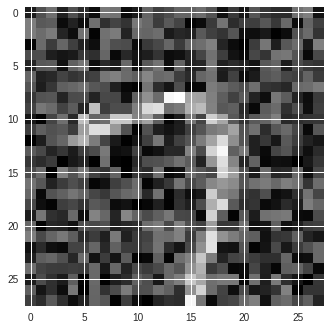

The network predicted a class label of 7
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


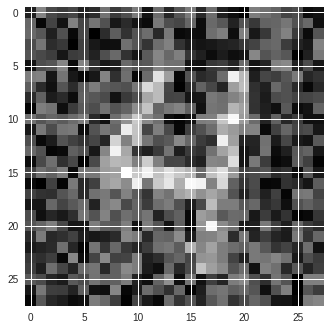

The network predicted a class label of 4
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


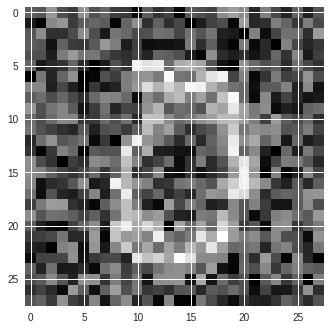

The network predicted a class label of 0
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


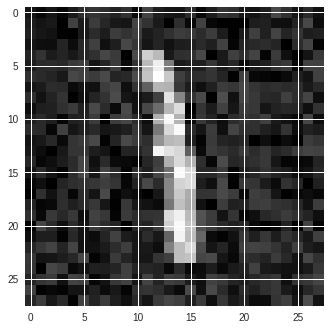

The network predicted a class label of 1
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


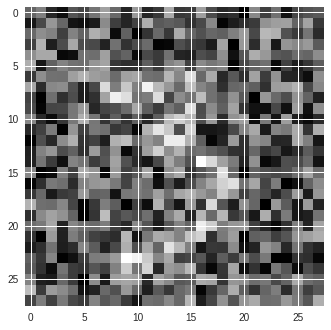

The network predicted a class label of 7
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


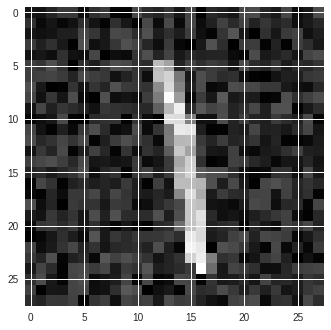

The network predicted a class label of 1
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


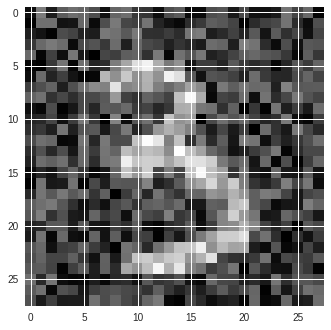

The network predicted a class label of 3
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


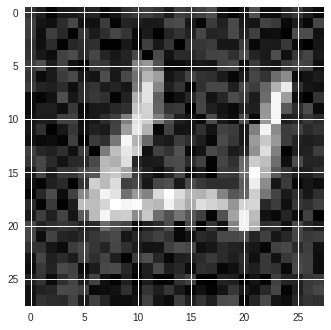

The network predicted a class label of 4
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


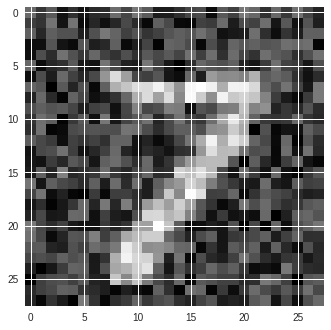

The network predicted a class label of 7
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


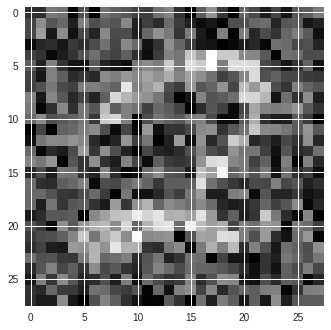

The network predicted a class label of 2
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


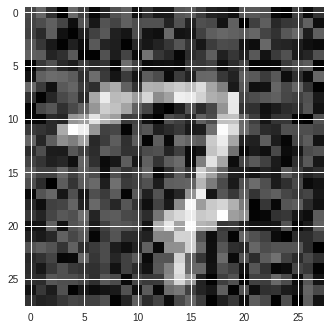

The network predicted a class label of 7
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


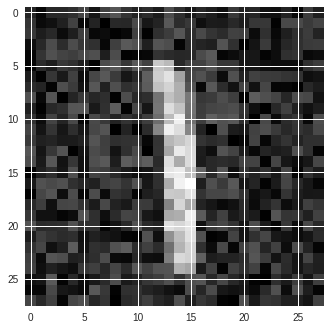

The network predicted a class label of 8
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


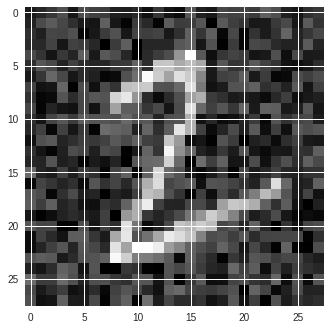

The network predicted a class label of 2
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


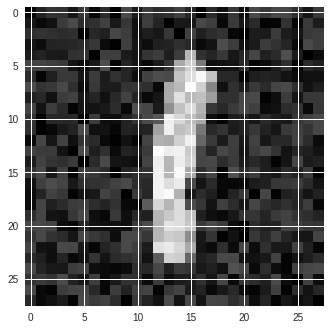

The network predicted a class label of 1
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


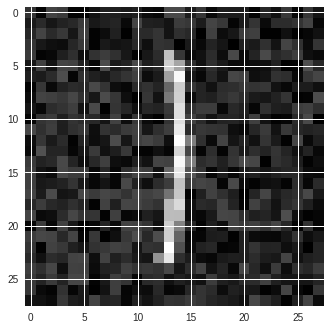

The network predicted a class label of 2
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


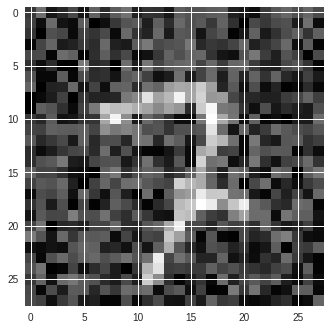

The network predicted a class label of 7
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


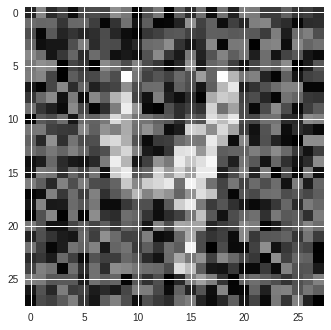

The network predicted a class label of 4
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


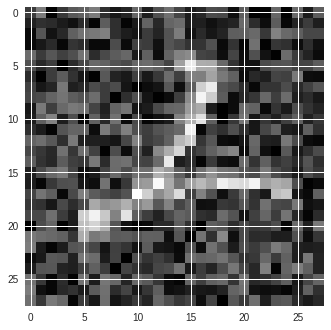

The network predicted a class label of 2
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


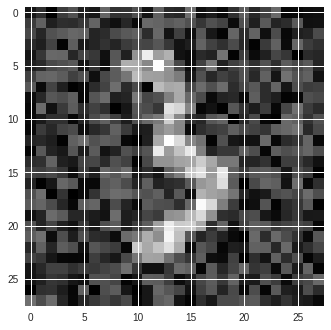

The network predicted a class label of 5
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


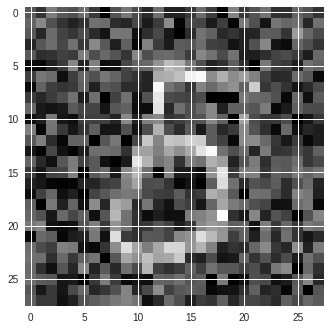

The network predicted a class label of 8
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


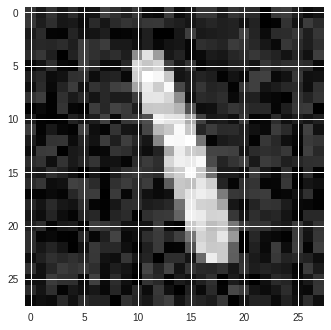

The network predicted a class label of 1
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


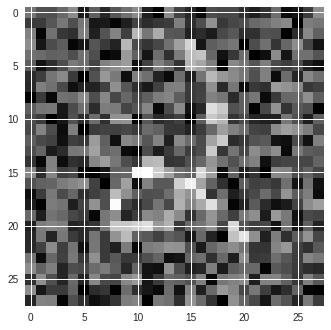

The network predicted a class label of 2
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


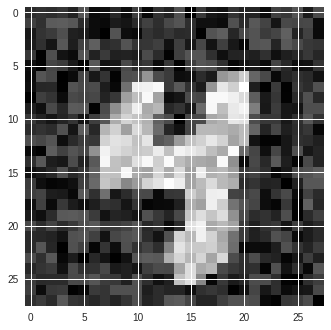

The network predicted a class label of 4
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


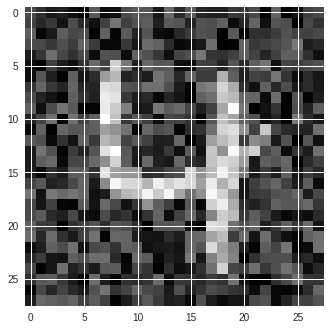

The network predicted a class label of 4


In [0]:
Transfer_Attack_customTensorFlowModel(model_prediction_function=cnn_binding_predictions,
                                      model_weights="/Binding_CNN.ckpt", 
                                      var_list=var_list_Binding,
                                      transfer_attack_images="StandardCNN_adversaries.csv",
                                      temp_batch_size=1)

The binding network performs well against the standard CNN adversaries, scoring 9/10, although note the one class it scored incorrectly (the second to last example) has a debatable ground truth.

####Binding Network vs Mardy Adversaries

INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


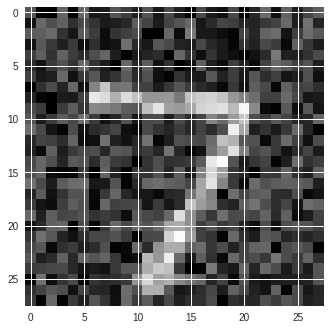

The network predicted a class label of 7
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


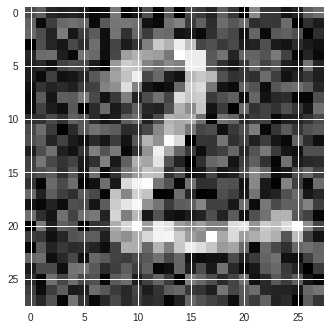

The network predicted a class label of 2
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


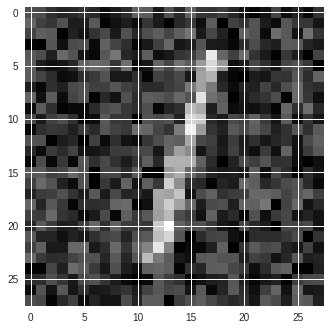

The network predicted a class label of 1
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


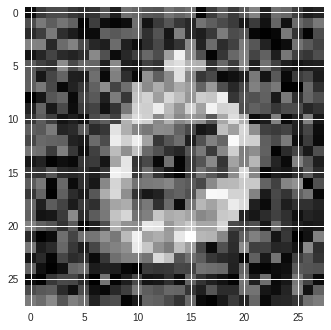

The network predicted a class label of 0
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


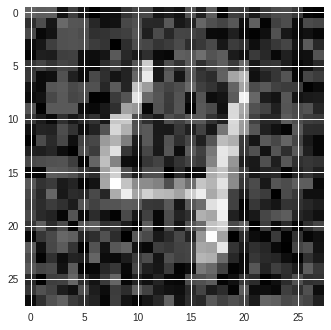

The network predicted a class label of 4
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


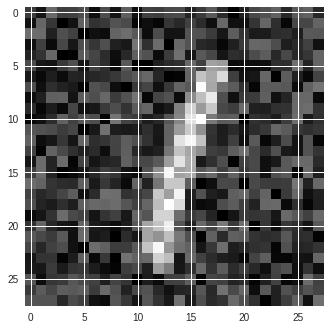

The network predicted a class label of 2
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


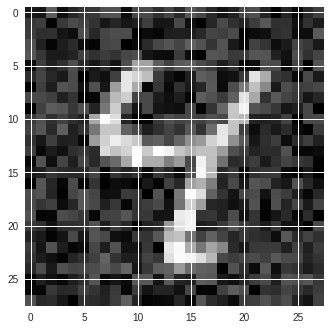

The network predicted a class label of 4
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


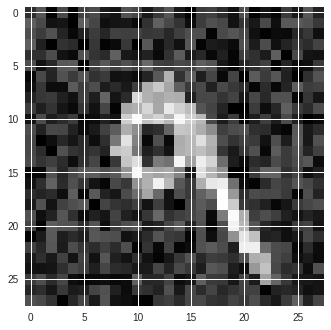

The network predicted a class label of 9
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


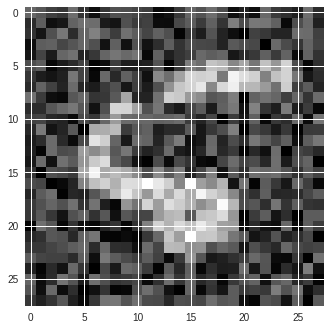

The network predicted a class label of 5
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


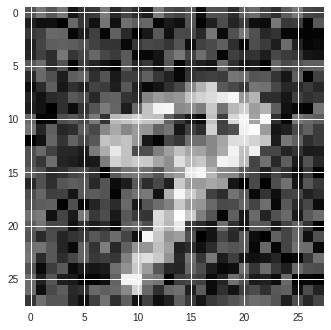

The network predicted a class label of 9
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


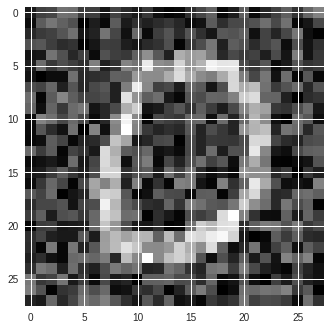

The network predicted a class label of 0
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


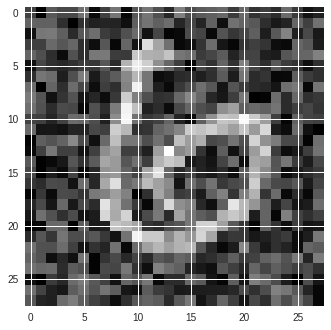

The network predicted a class label of 6
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


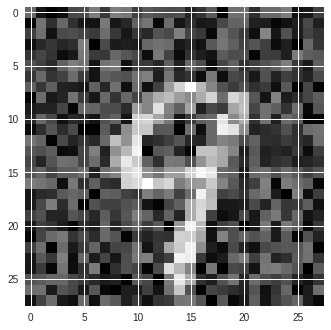

The network predicted a class label of 9
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


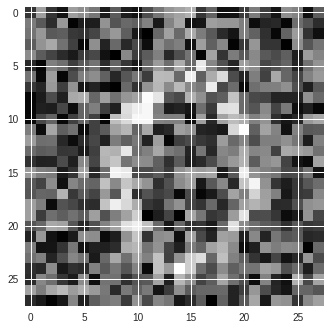

The network predicted a class label of 8
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


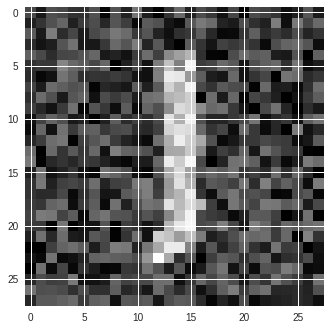

The network predicted a class label of 1
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


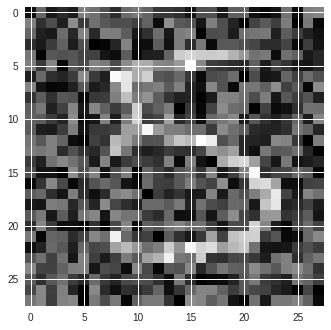

The network predicted a class label of 5
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


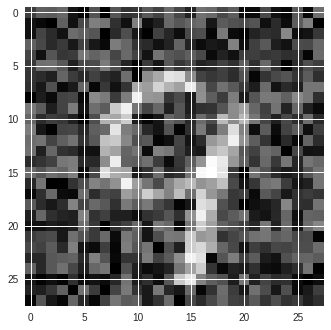

The network predicted a class label of 9
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


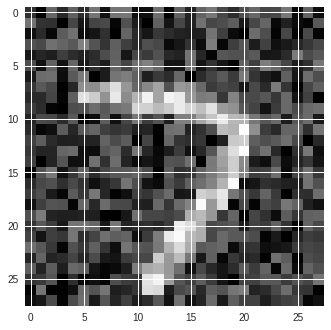

The network predicted a class label of 7
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


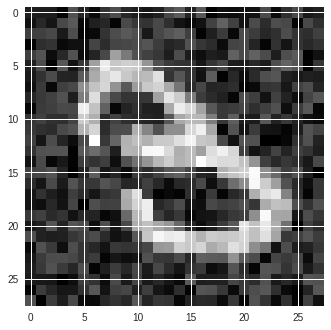

The network predicted a class label of 8
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


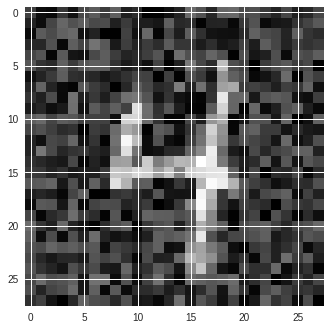

The network predicted a class label of 4
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


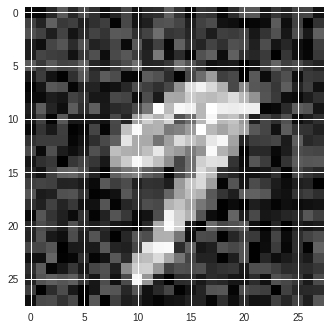

The network predicted a class label of 9
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


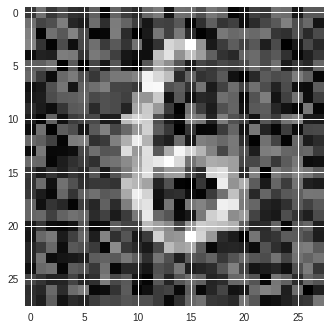

The network predicted a class label of 6
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


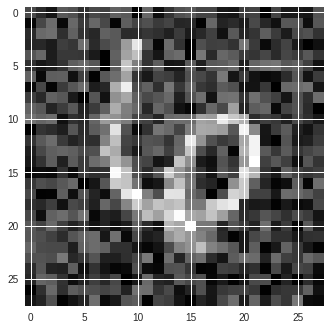

The network predicted a class label of 6
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


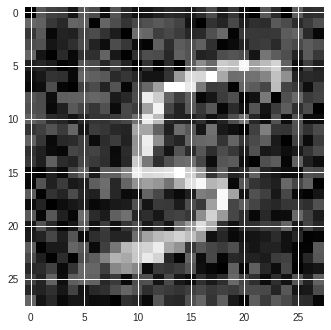

The network predicted a class label of 5
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


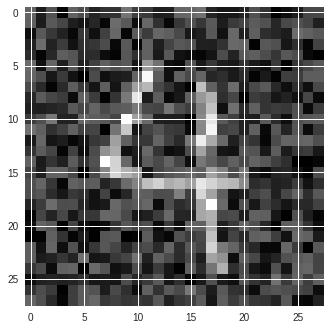

The network predicted a class label of 4
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


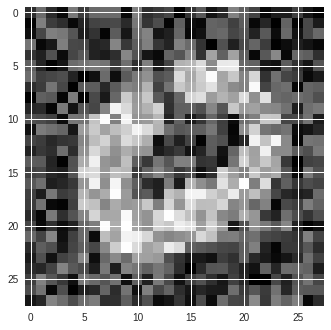

The network predicted a class label of 0
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


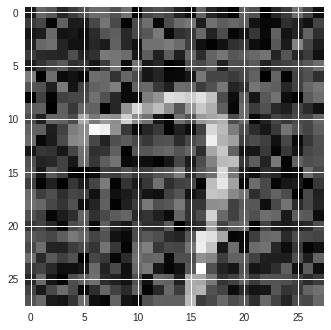

The network predicted a class label of 7
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


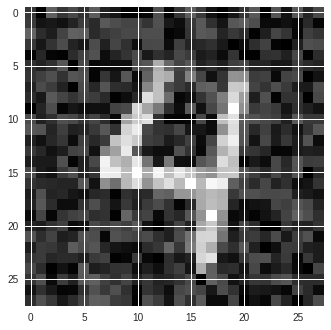

The network predicted a class label of 4
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


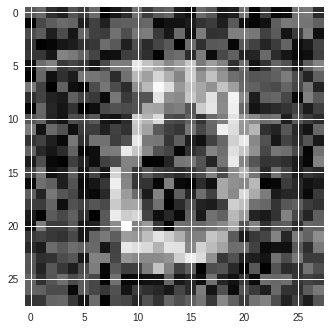

The network predicted a class label of 0
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


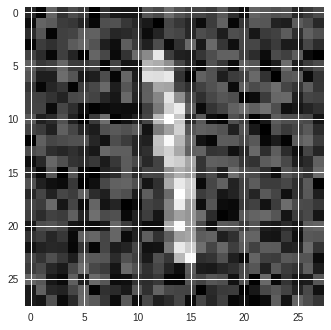

The network predicted a class label of 1
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


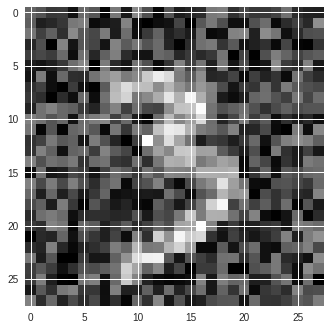

The network predicted a class label of 3
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


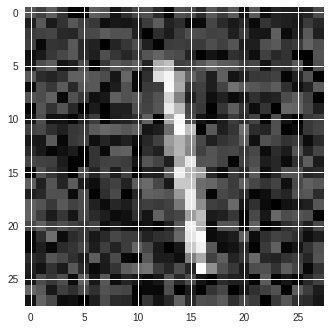

The network predicted a class label of 1
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


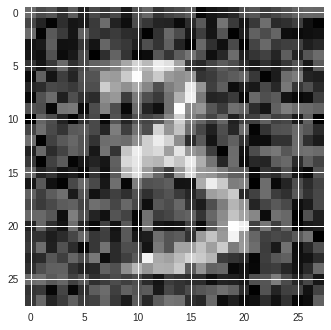

The network predicted a class label of 3
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


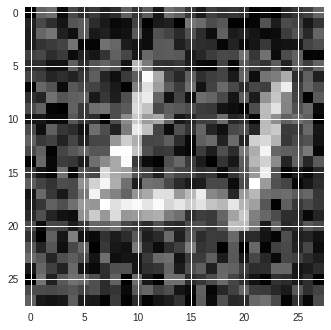

The network predicted a class label of 4
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


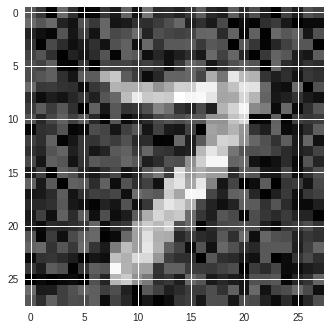

The network predicted a class label of 7
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


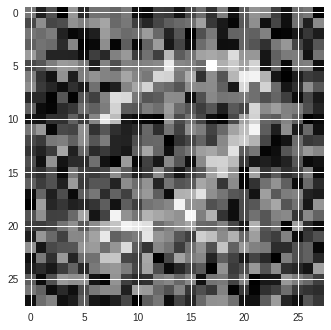

The network predicted a class label of 2
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


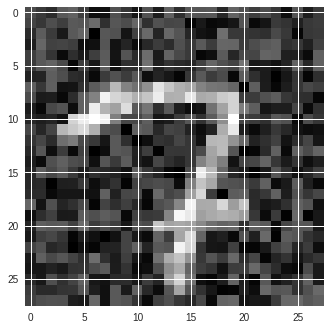

The network predicted a class label of 7
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


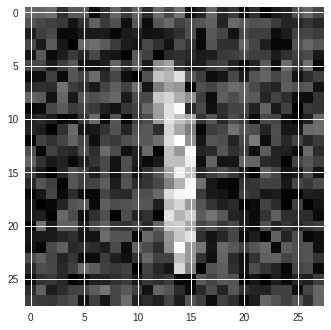

The network predicted a class label of 1
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


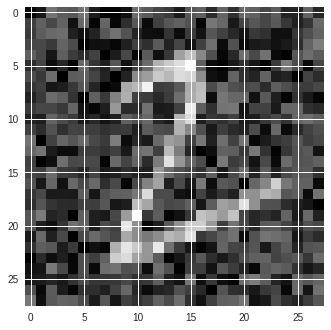

The network predicted a class label of 2
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


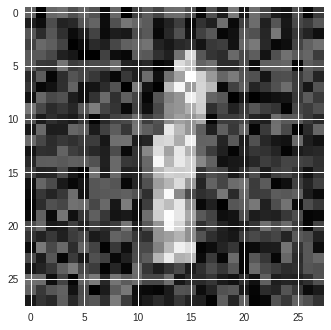

The network predicted a class label of 8
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


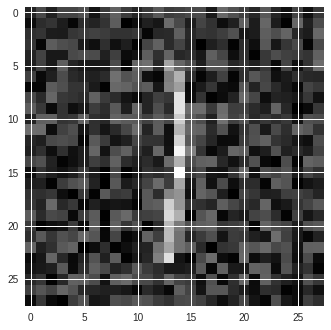

The network predicted a class label of 1
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


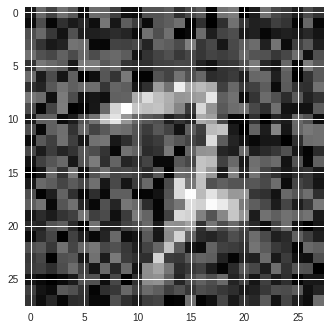

The network predicted a class label of 7
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


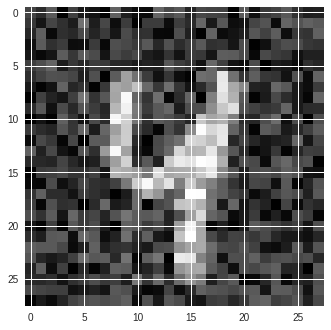

The network predicted a class label of 4
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


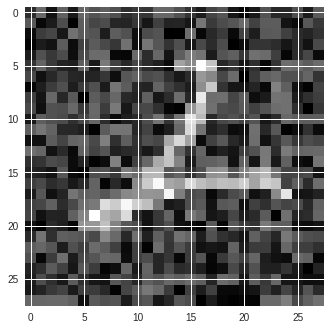

The network predicted a class label of 2
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


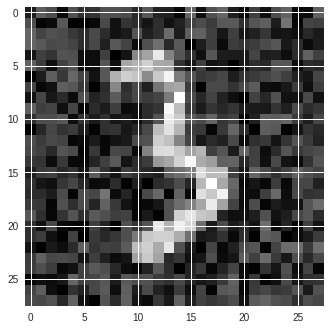

The network predicted a class label of 3
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


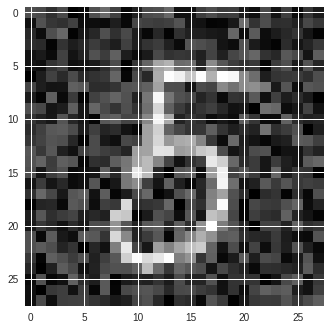

The network predicted a class label of 5
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


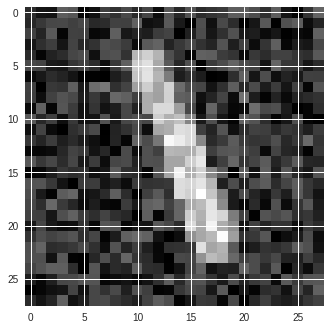

The network predicted a class label of 1
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


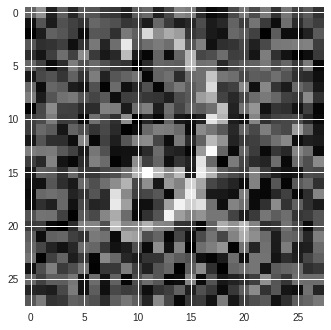

The network predicted a class label of 2
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


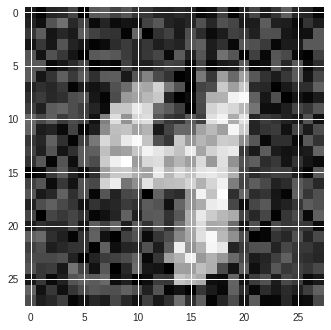

The network predicted a class label of 4
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


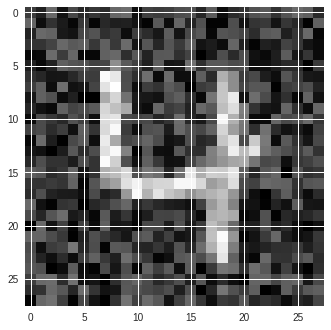

The network predicted a class label of 4


In [0]:
Transfer_Attack_customTensorFlowModel(model_prediction_function=cnn_binding_predictions,
                                      model_weights="/Binding_CNN.ckpt", 
                                      var_list=var_list_Binding,
                                      transfer_attack_images="Madry_adversaries.csv",
                                      temp_batch_size=1)

The binding network performed reasonably against the Madry adversaries, scoring 7/10. Note in particular that the binding network has had *no* training on adversarial examples, and yet its performance is comparable to that of the highly optimized (and I believe larger-parameter) Madry model.

####Binding Network vs Its Own Adversaries

In [0]:
Transfer_Attack_customTensorFlowModel(model_prediction_function=cnn_binding_predictions,
                                      model_weights="/Binding_CNN.ckpt", 
                                      var_list=var_list_Binding,
                                      transfer_attack_images="BindingNetwork_adversaries.csv",
                                      temp_batch_size=1)

As expected, the binding network scores 0/10 against its own adversaries.

##Point-Wise Attack

###Point-Wise Attack Functions for the TensorFlow Models

In [0]:
# *** this code can eventually be refractored with earlier functions

#Function used to attack an arbitrary model that has been implemented with TensorFlow's low-level API (i.e. requires a session to be called explicitly)
def PointWise_Attack_customTensorFlowModel(model_prediction_function, model_weights, var_list, test_image, test_label, temp_batch_size):

    images = x #x is a place-holder for 28x28 images earlier defined
    logits = model_prediction_function(images, temp_batch_size)

    saver = tf.train.Saver(var_list) #Define saver object for use later when loading the model weights

    #Note how when attacking a low-level TensorFlow API model, it is necessary for all steps to occur within the tf.Session()
    with tf.Session() as session:
        saver.restore(session, model_weights)

        #Define the foolbox model
        fmodel = foolbox.models.TensorFlowModel(images, logits, (0,1)) #The final parameter specifies the input values range

        #The predicted label of the network prior to carrying out the attack
        pre_label = np.argmax(fmodel.predictions(test_image[:, :, :]))
        #print("The classification label prior to attack is " + str(pre_label))
        if (pre_label != test_label):
            print("The model predicted a " + str(pre_label) + " when the ground-truth label is " + str(test_label))
            plt.imshow(test_image[:,:,0], cmap='gray')

        #Carry out the untargeted Bounary Attack
        attack_fmodel = foolbox.attacks.PointwiseAttack(model=fmodel, criterion=foolbox.criteria.Misclassification())
        adversarial_image_fmodel = attack_fmodel(test_image, test_label)
        plt.imshow(adversarial_image_fmodel[:,:,0], cmap='gray')
        plt.show()
        
        #Check the output of the adversarial attack
        adversarial_label_fmodel = np.argmax(fmodel.predictions(adversarial_image_fmodel[:, :, :]))
        print("The classification label following attack is " + str(adversarial_label_fmodel) 
              + " from an original classification of " + str(test_label))
        
        return adversarial_image_fmodel, adversarial_label_fmodel

In [0]:
#Iterate through a series of images to be attacked
def evaluate_l0_PointWiseAttack_resistance_CustomModel(model_prediction_function, model_weights, var_list, num_images_to_attack, temp_batch_size):
    adversary_found = np.zeros([num_images_to_attack]) #array of booleans that indicates if an adversary was found for a particular image
    adversary_distance = np.zeros([num_images_to_attack])
    adversary_arrays = np.zeros([num_images_to_attack, testing_data.shape[1], testing_data.shape[2], 1])

    for ii in range(num_images_to_attack):
        test_image = testing_data[ii, :, :]
        test_label = np.argmax(testing_labels[ii,:])

        adversarial_image_fmodel, adversarial_classification = PointWise_Attack_customTensorFlowModel(model_prediction_function, 
                                                                                                     model_weights, var_list, 
                                                                                                     test_image, test_label, 
                                                                                                     temp_batch_size)
        adversary_arrays[ii, :, :] = adversarial_image_fmodel

        if ((np.any(adversarial_image_fmodel == None) | adversarial_classification == test_label)):
            print("No adversarial image found")

        else:
            l0_distance = scipy.spatial.distance.hamming(test_image.flatten(), adversarial_image_fmodel.flatten())
            print("The L0 distance of the adversary is " + str(l0_distance))
            adversary_found[ii] = 1
            adversary_distance[ii] = l0_distance
        
    return adversary_found, adversary_distance, adversary_arrays

###Visualize the Point-Wise Attack

INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


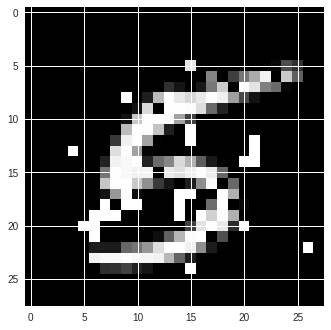

The classification label following attack is 8 from an original classification of 5


In [0]:
#An example of the attack
adversarial_image_fmodel, adversarial_label_fmodel = PointWise_Attack_customTensorFlowModel(model_prediction_function=cnn_predictions,
                                                                 model_weights="/MNIST_LeNet5_CNN.ckpt", 
                                                                var_list=var_list_LeNet,
                                                                 test_image=test_image_LeNet, 
                                                                 test_label=test_label_LeNet,
                                                                 temp_batch_size=None)


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


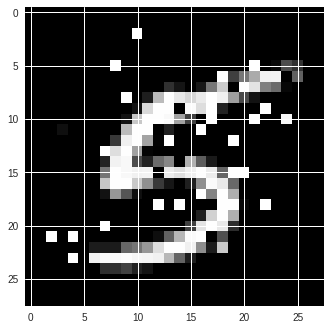

The classification label following attack is 4 from an original classification of 5


In [0]:
adversarial_image_fmodel, adversarial_label_fmodel = PointWise_Attack_customTensorFlowModel(model_prediction_function=cnn_binding_predictions,
                                                                 model_weights="/Binding_CNN.ckpt",
                                                                  var_list=var_list_Binding,
                                                                 test_image=test_image_LeNet, 
                                                                 test_label=test_label_LeNet,
                                                                 temp_batch_size=1)


###Quantify Vulnerability

In [0]:
num_images_to_attack=100

####Standard CNN

INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


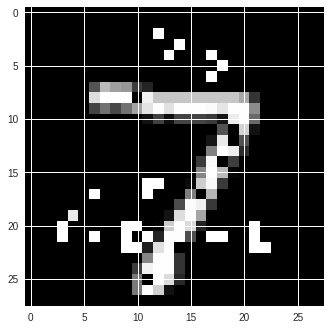

The classification label following attack is 2 from an original classification of 7
The L0 distance of the adversary is 0.042091836734693876
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


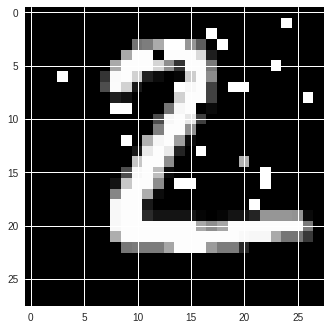

The classification label following attack is 6 from an original classification of 2
The L0 distance of the adversary is 0.02806122448979592
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


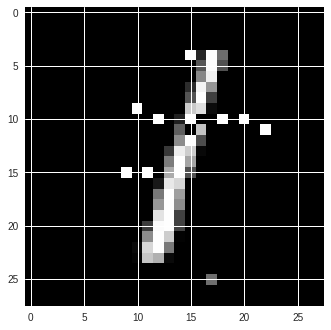

The classification label following attack is 8 from an original classification of 1
The L0 distance of the adversary is 0.01403061224489796
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


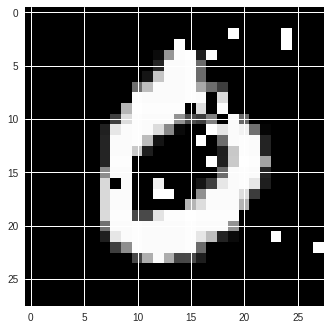

The classification label following attack is 6 from an original classification of 0
The L0 distance of the adversary is 0.026785714285714284
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


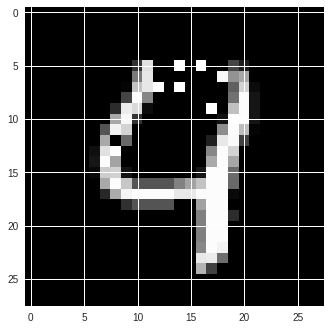

The classification label following attack is 9 from an original classification of 4
The L0 distance of the adversary is 0.008928571428571428
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


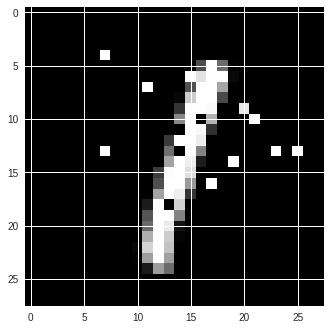

The classification label following attack is 7 from an original classification of 1
The L0 distance of the adversary is 0.017857142857142856
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


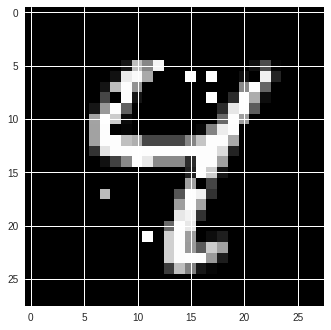

The classification label following attack is 9 from an original classification of 4
The L0 distance of the adversary is 0.012755102040816327
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


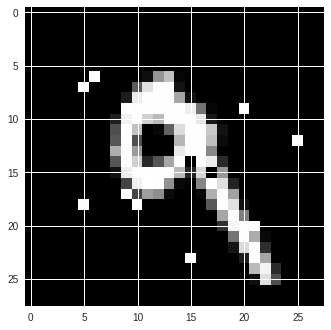

The classification label following attack is 8 from an original classification of 9
The L0 distance of the adversary is 0.015306122448979591
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


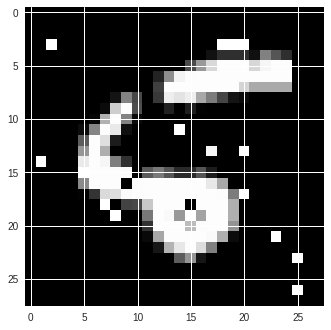

The classification label following attack is 6 from an original classification of 5
The L0 distance of the adversary is 0.02295918367346939
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


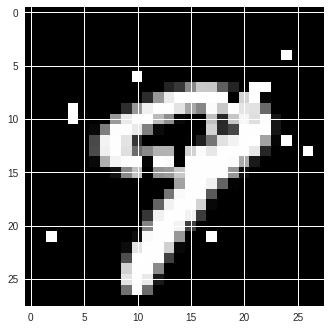

The classification label following attack is 7 from an original classification of 9
The L0 distance of the adversary is 0.02040816326530612
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


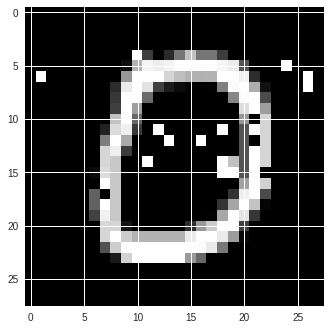

The classification label following attack is 5 from an original classification of 0
The L0 distance of the adversary is 0.02423469387755102
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


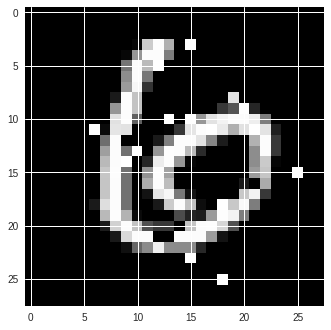

The classification label following attack is 8 from an original classification of 6
The L0 distance of the adversary is 0.02295918367346939
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


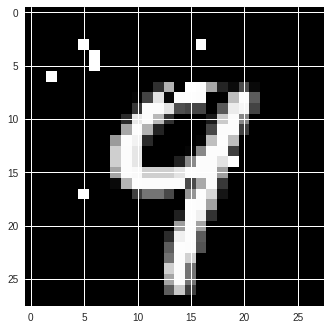

The classification label following attack is 4 from an original classification of 9
The L0 distance of the adversary is 0.015306122448979591
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


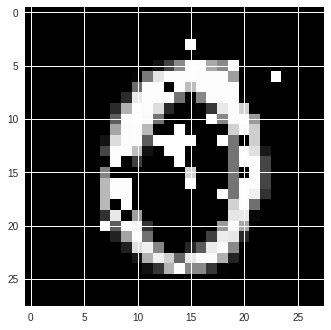

The classification label following attack is 5 from an original classification of 0
The L0 distance of the adversary is 0.03316326530612245
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


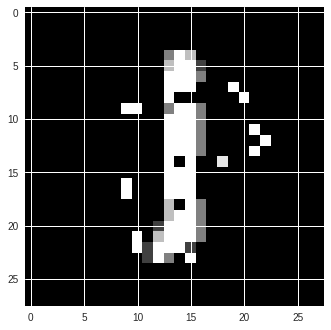

The classification label following attack is 8 from an original classification of 1
The L0 distance of the adversary is 0.021683673469387755
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


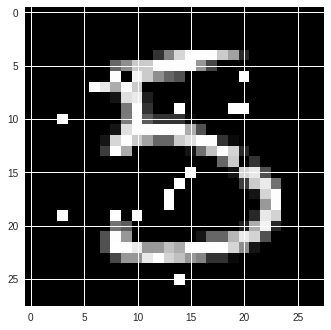

The classification label following attack is 8 from an original classification of 5
The L0 distance of the adversary is 0.021683673469387755
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


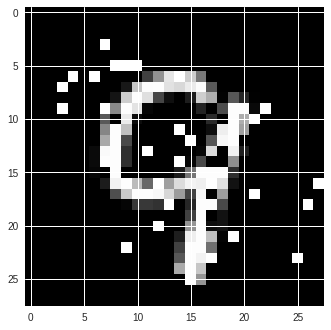

The classification label following attack is 8 from an original classification of 9
The L0 distance of the adversary is 0.04846938775510204
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


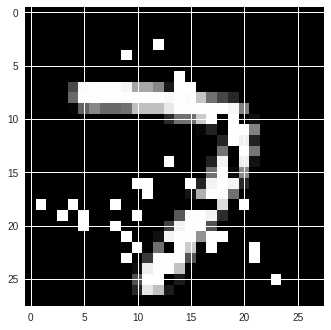

The classification label following attack is 2 from an original classification of 7
The L0 distance of the adversary is 0.04974489795918367
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


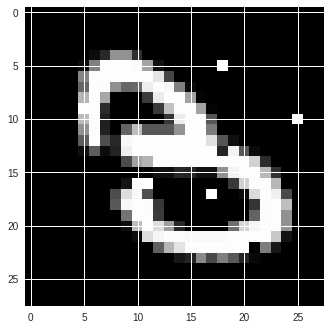

The classification label following attack is 8 from an original classification of 3
The L0 distance of the adversary is 0.008928571428571428
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


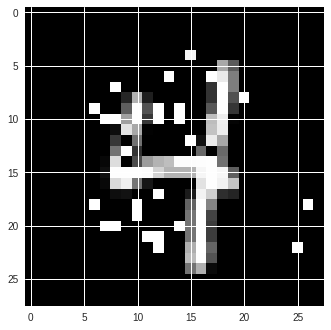

The classification label following attack is 8 from an original classification of 4
The L0 distance of the adversary is 0.03571428571428571
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


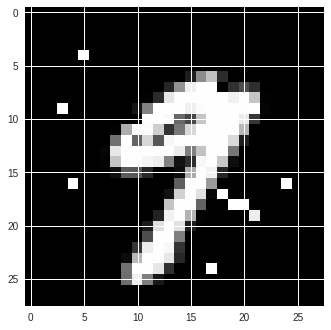

The classification label following attack is 7 from an original classification of 9
The L0 distance of the adversary is 0.016581632653061226
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


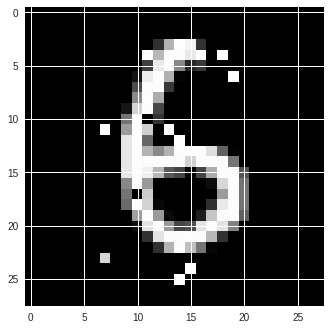

The classification label following attack is 5 from an original classification of 6
The L0 distance of the adversary is 0.015306122448979591
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


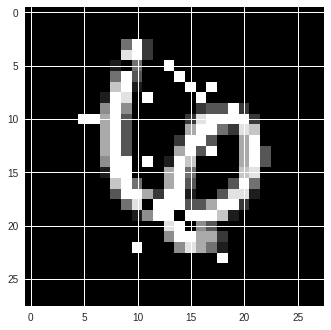

The classification label following attack is 8 from an original classification of 6
The L0 distance of the adversary is 0.02295918367346939
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


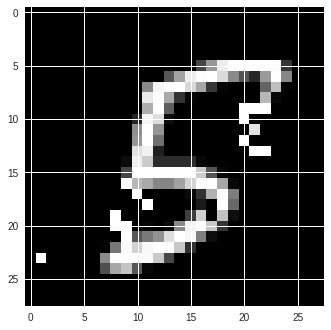

The classification label following attack is 8 from an original classification of 5
The L0 distance of the adversary is 0.02423469387755102
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


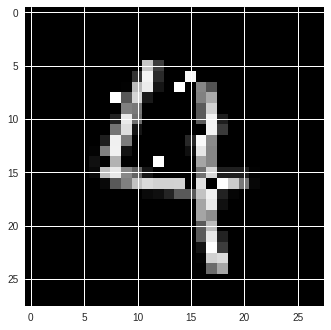

The classification label following attack is 9 from an original classification of 4
The L0 distance of the adversary is 0.01020408163265306
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


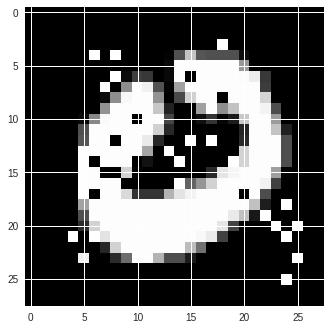

The classification label following attack is 2 from an original classification of 0
The L0 distance of the adversary is 0.04081632653061224
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


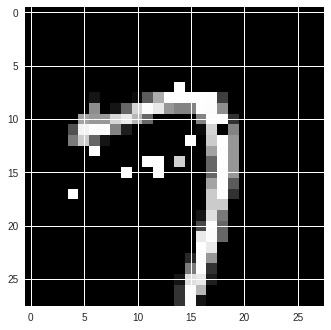

The classification label following attack is 9 from an original classification of 7
The L0 distance of the adversary is 0.012755102040816327
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


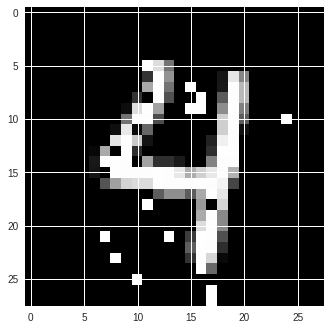

The classification label following attack is 9 from an original classification of 4
The L0 distance of the adversary is 0.025510204081632654
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


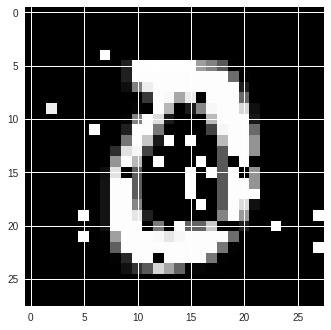

The classification label following attack is 2 from an original classification of 0
The L0 distance of the adversary is 0.036989795918367346
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


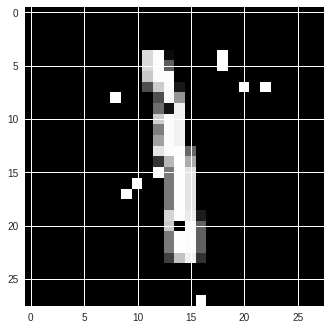

The classification label following attack is 8 from an original classification of 1
The L0 distance of the adversary is 0.01403061224489796
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


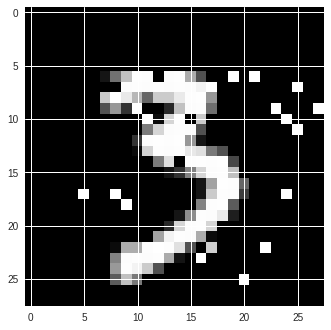

The classification label following attack is 5 from an original classification of 3
The L0 distance of the adversary is 0.029336734693877552
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


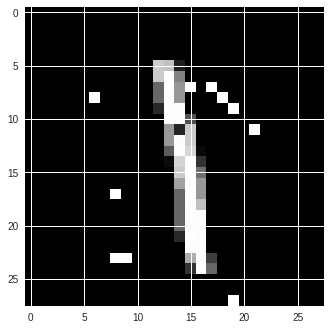

The classification label following attack is 3 from an original classification of 1
The L0 distance of the adversary is 0.01403061224489796
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


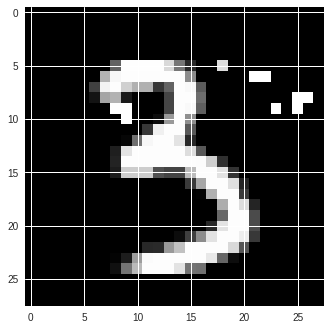

The classification label following attack is 5 from an original classification of 3
The L0 distance of the adversary is 0.012755102040816327
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


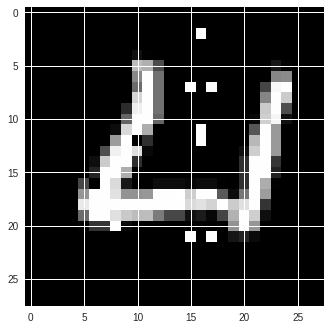

The classification label following attack is 6 from an original classification of 4
The L0 distance of the adversary is 0.012755102040816327
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


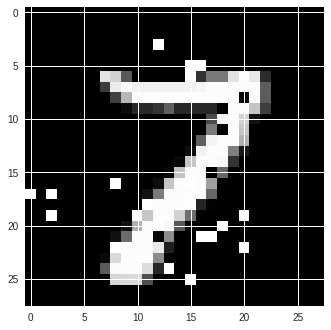

The classification label following attack is 2 from an original classification of 7
The L0 distance of the adversary is 0.029336734693877552
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


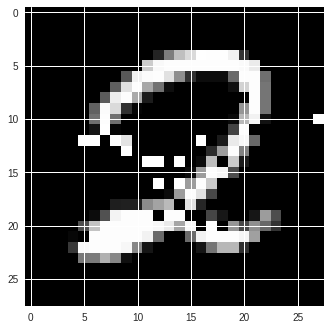

The classification label following attack is 8 from an original classification of 2
The L0 distance of the adversary is 0.030612244897959183
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


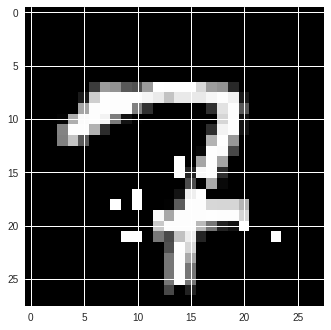

The classification label following attack is 2 from an original classification of 7
The L0 distance of the adversary is 0.015306122448979591
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


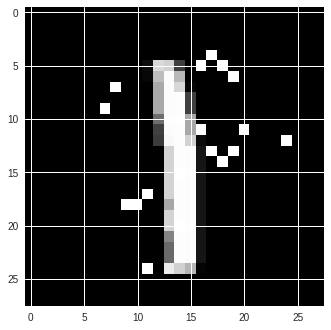

The classification label following attack is 8 from an original classification of 1
The L0 distance of the adversary is 0.021683673469387755
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


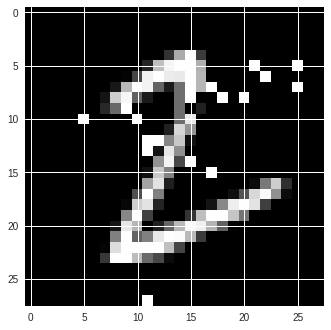

The classification label following attack is 8 from an original classification of 2
The L0 distance of the adversary is 0.02295918367346939
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


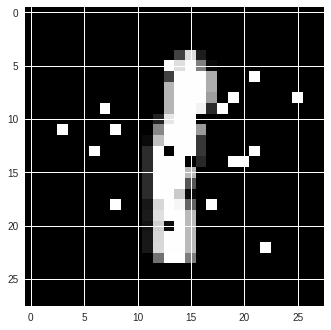

The classification label following attack is 8 from an original classification of 1
The L0 distance of the adversary is 0.02423469387755102
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


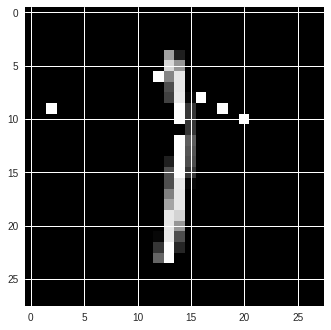

The classification label following attack is 7 from an original classification of 1
The L0 distance of the adversary is 0.007653061224489796
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


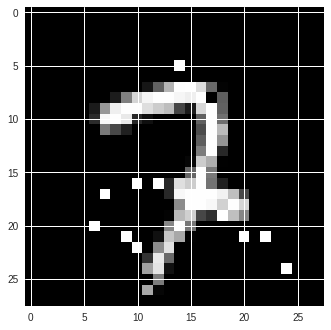

The classification label following attack is 2 from an original classification of 7
The L0 distance of the adversary is 0.017857142857142856
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


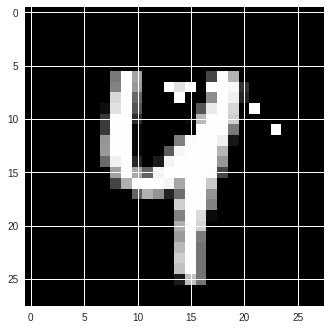

The classification label following attack is 9 from an original classification of 4
The L0 distance of the adversary is 0.01020408163265306
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


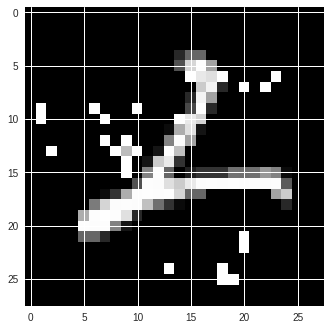

The classification label following attack is 8 from an original classification of 2
The L0 distance of the adversary is 0.03188775510204082
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


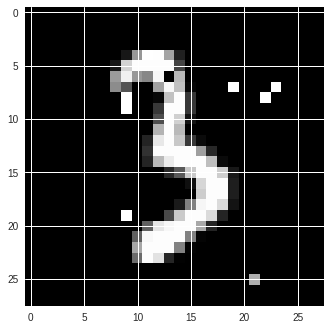

The classification label following attack is 5 from an original classification of 3
The L0 distance of the adversary is 0.01020408163265306
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


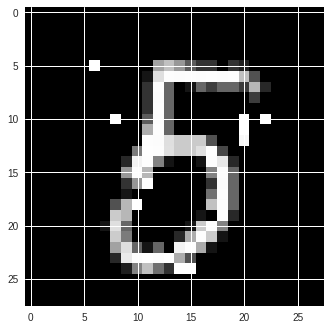

The classification label following attack is 8 from an original classification of 5
The L0 distance of the adversary is 0.016581632653061226
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


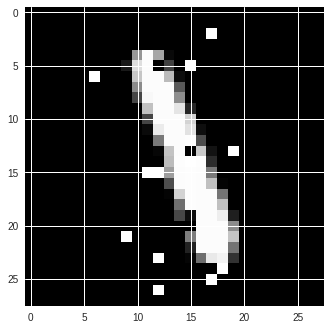

The classification label following attack is 3 from an original classification of 1
The L0 distance of the adversary is 0.01913265306122449
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


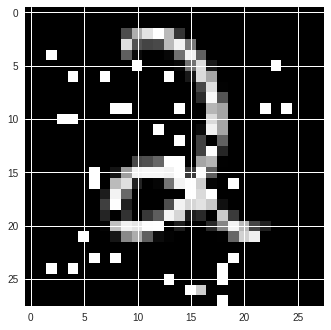

The classification label following attack is 3 from an original classification of 2
The L0 distance of the adversary is 0.05102040816326531
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


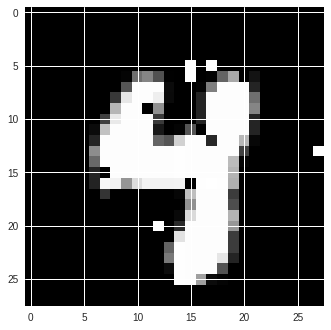

The classification label following attack is 9 from an original classification of 4
The L0 distance of the adversary is 0.01403061224489796
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


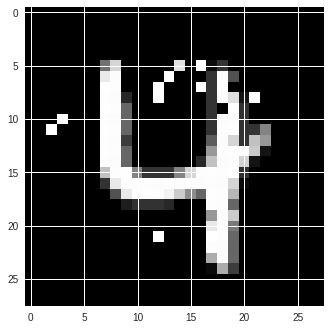

The classification label following attack is 9 from an original classification of 4
The L0 distance of the adversary is 0.015306122448979591
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


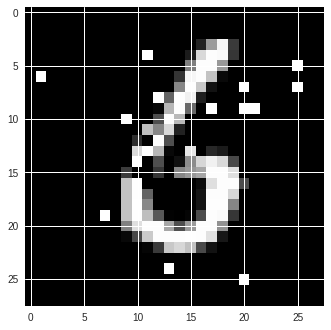

The classification label following attack is 5 from an original classification of 6
The L0 distance of the adversary is 0.02423469387755102
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


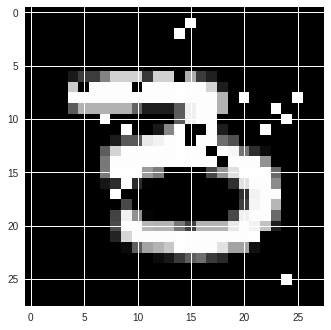

The classification label following attack is 5 from an original classification of 3
The L0 distance of the adversary is 0.029336734693877552
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


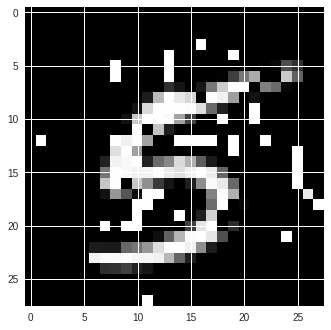

The classification label following attack is 8 from an original classification of 5
The L0 distance of the adversary is 0.0625
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


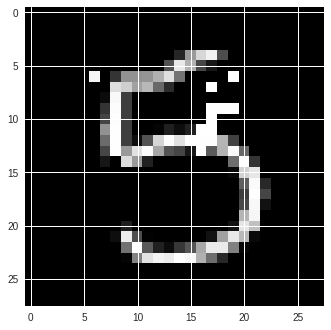

The classification label following attack is 3 from an original classification of 5
The L0 distance of the adversary is 0.01403061224489796
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


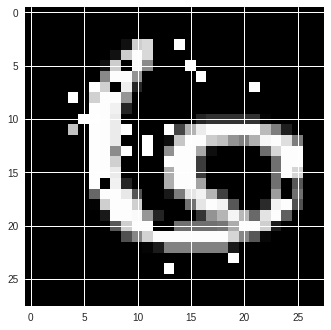

The classification label following attack is 8 from an original classification of 6
The L0 distance of the adversary is 0.029336734693877552
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


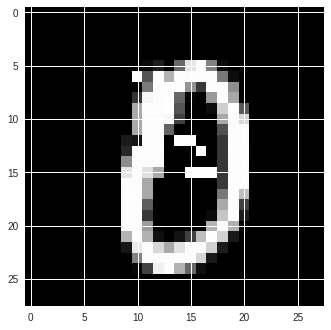

The classification label following attack is 8 from an original classification of 0
The L0 distance of the adversary is 0.01020408163265306
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


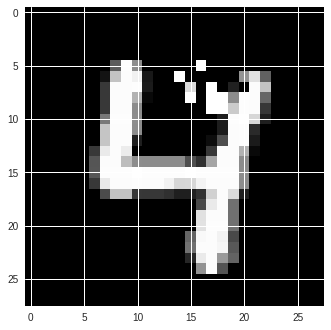

The classification label following attack is 9 from an original classification of 4
The L0 distance of the adversary is 0.012755102040816327
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


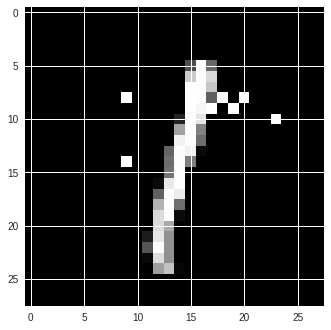

The classification label following attack is 7 from an original classification of 1
The L0 distance of the adversary is 0.008928571428571428
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


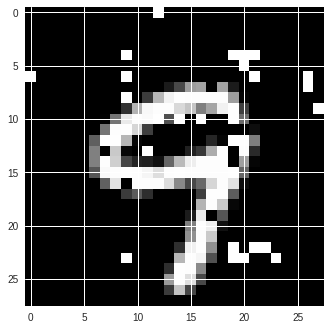

The classification label following attack is 5 from an original classification of 9
The L0 distance of the adversary is 0.044642857142857144
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


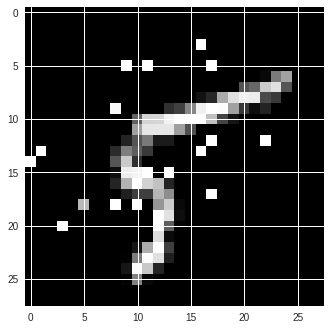

The classification label following attack is 8 from an original classification of 5
The L0 distance of the adversary is 0.021683673469387755
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


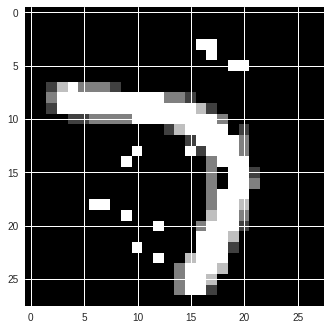

The classification label following attack is 5 from an original classification of 7
The L0 distance of the adversary is 0.021683673469387755
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


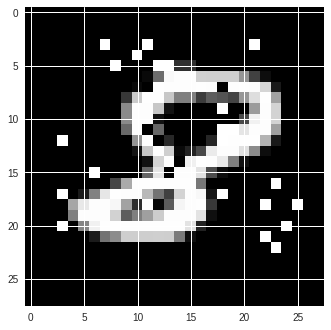

The classification label following attack is 2 from an original classification of 8
The L0 distance of the adversary is 0.036989795918367346
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


The model predicted a 5 when the ground-truth label is 9


/usr/local/lib/python3.6/dist-packages/foolbox/attacks/base.py:129: UserWarning: Not running the attack because the original input is already misclassified and the adversarial thus has a distance of 0.
  warnings.warn('Not running the attack because the original input'


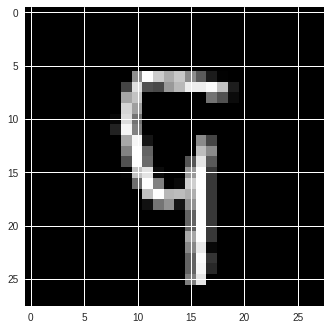

The classification label following attack is 5 from an original classification of 9
The L0 distance of the adversary is 0.0
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


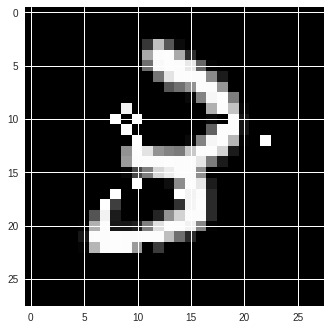

The classification label following attack is 8 from an original classification of 3
The L0 distance of the adversary is 0.015306122448979591
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


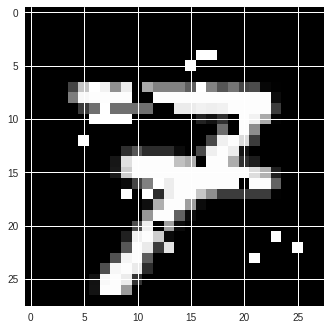

The classification label following attack is 8 from an original classification of 7
The L0 distance of the adversary is 0.03443877551020408
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


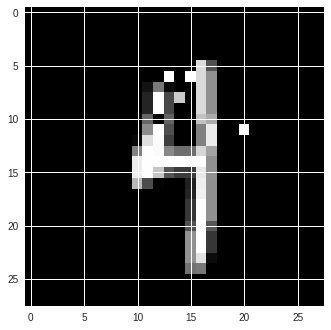

The classification label following attack is 9 from an original classification of 4
The L0 distance of the adversary is 0.006377551020408163
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


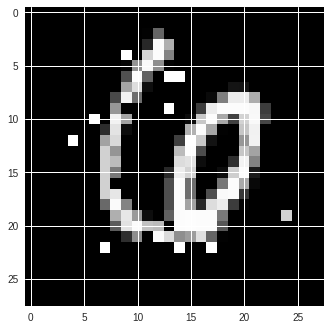

The classification label following attack is 2 from an original classification of 6
The L0 distance of the adversary is 0.01913265306122449
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


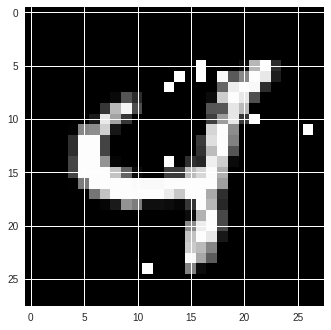

The classification label following attack is 9 from an original classification of 4
The L0 distance of the adversary is 0.011479591836734694
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


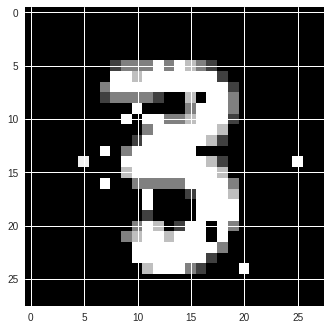

The classification label following attack is 8 from an original classification of 3
The L0 distance of the adversary is 0.021683673469387755
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


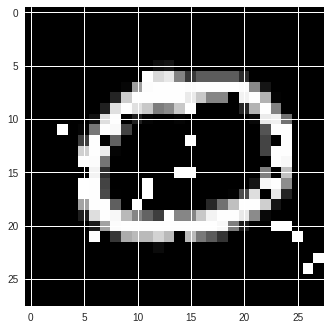

The classification label following attack is 2 from an original classification of 0
The L0 distance of the adversary is 0.03188775510204082
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


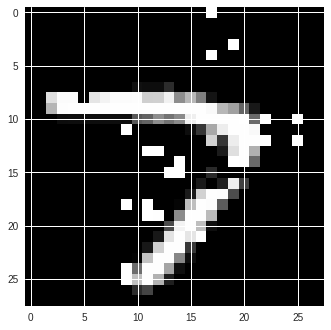

The classification label following attack is 5 from an original classification of 7
The L0 distance of the adversary is 0.036989795918367346
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


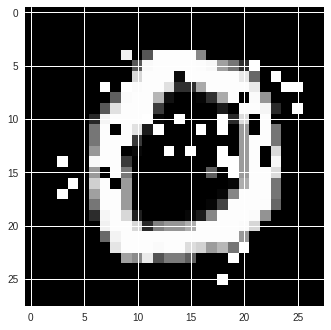

The classification label following attack is 5 from an original classification of 0
The L0 distance of the adversary is 0.04974489795918367
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


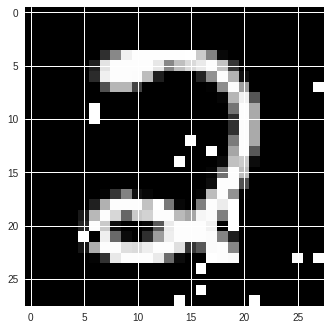

The classification label following attack is 3 from an original classification of 2
The L0 distance of the adversary is 0.025510204081632654
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


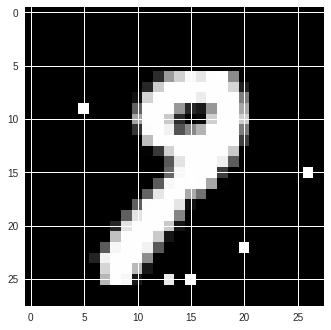

The classification label following attack is 8 from an original classification of 9
The L0 distance of the adversary is 0.006377551020408163
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


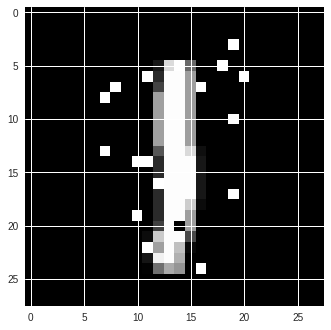

The classification label following attack is 8 from an original classification of 1
The L0 distance of the adversary is 0.021683673469387755
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


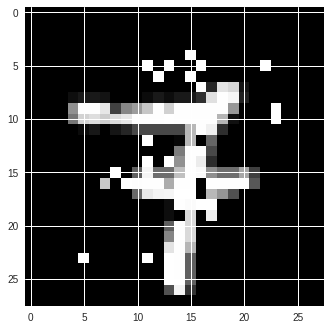

The classification label following attack is 3 from an original classification of 7
The L0 distance of the adversary is 0.03443877551020408
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


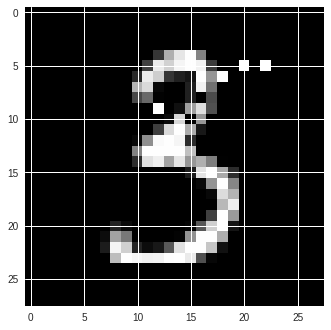

The classification label following attack is 5 from an original classification of 3
The L0 distance of the adversary is 0.008928571428571428
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


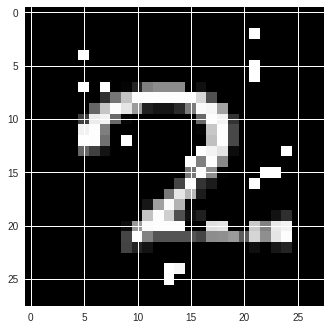

The classification label following attack is 7 from an original classification of 2
The L0 distance of the adversary is 0.029336734693877552
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


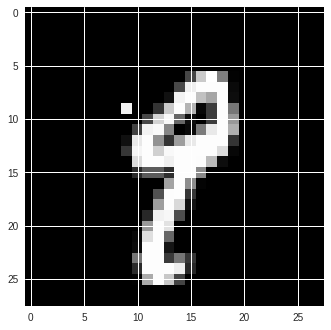

The classification label following attack is 8 from an original classification of 9
The L0 distance of the adversary is 0.0012755102040816326
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


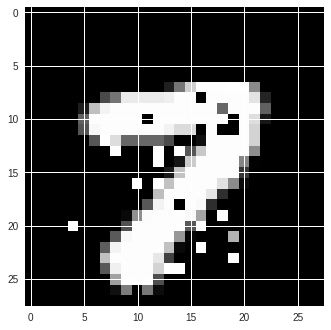

The classification label following attack is 8 from an original classification of 7
The L0 distance of the adversary is 0.030612244897959183
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


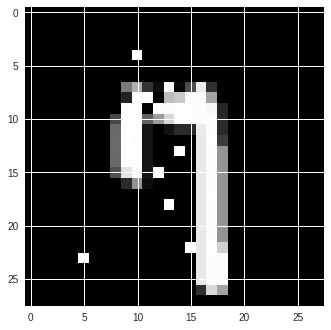

The classification label following attack is 9 from an original classification of 7
The L0 distance of the adversary is 0.012755102040816327
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


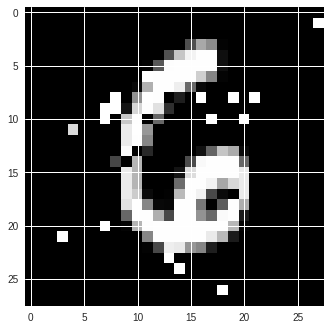

The classification label following attack is 2 from an original classification of 6
The L0 distance of the adversary is 0.029336734693877552
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


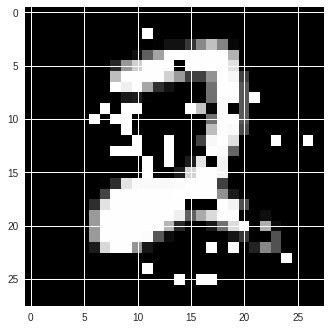

The classification label following attack is 8 from an original classification of 2
The L0 distance of the adversary is 0.05357142857142857
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


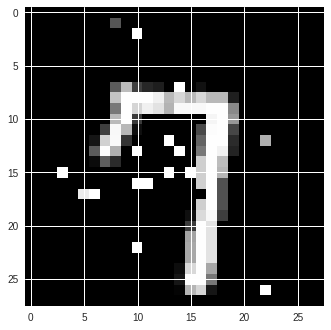

The classification label following attack is 9 from an original classification of 7
The L0 distance of the adversary is 0.021683673469387755
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


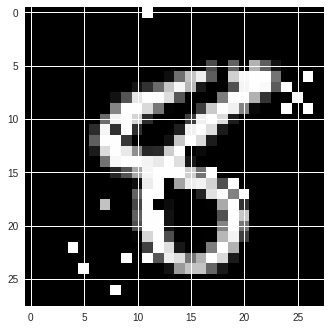

The classification label following attack is 5 from an original classification of 8
The L0 distance of the adversary is 0.02806122448979592
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


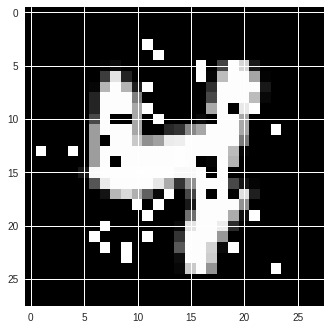

The classification label following attack is 8 from an original classification of 4
The L0 distance of the adversary is 0.04591836734693878
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


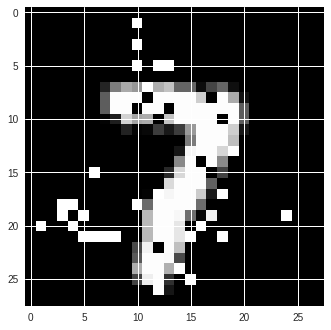

The classification label following attack is 2 from an original classification of 7
The L0 distance of the adversary is 0.047193877551020405
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


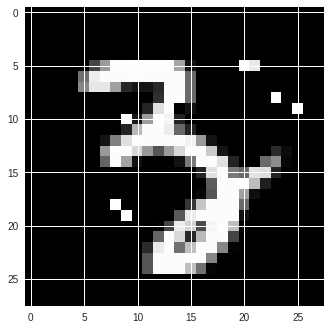

The classification label following attack is 5 from an original classification of 3
The L0 distance of the adversary is 0.01020408163265306
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


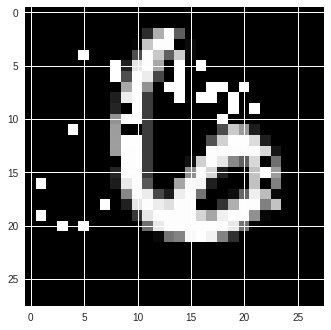

The classification label following attack is 2 from an original classification of 6
The L0 distance of the adversary is 0.042091836734693876
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


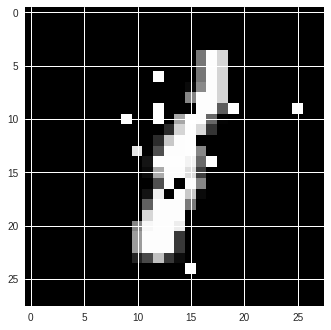

The classification label following attack is 8 from an original classification of 1
The L0 distance of the adversary is 0.016581632653061226
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


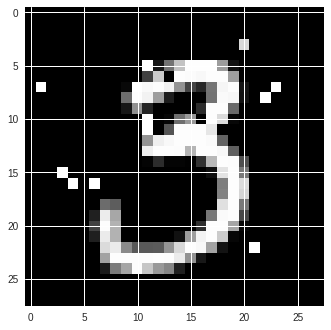

The classification label following attack is 5 from an original classification of 3
The L0 distance of the adversary is 0.01913265306122449
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


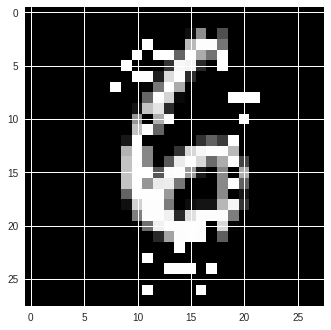

The classification label following attack is 8 from an original classification of 6
The L0 distance of the adversary is 0.042091836734693876
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


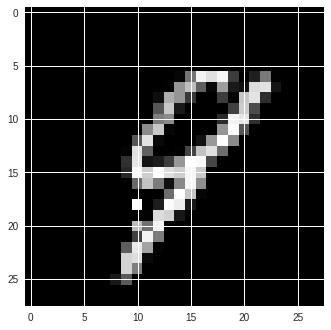

The classification label following attack is 8 from an original classification of 9
The L0 distance of the adversary is 0.002551020408163265
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


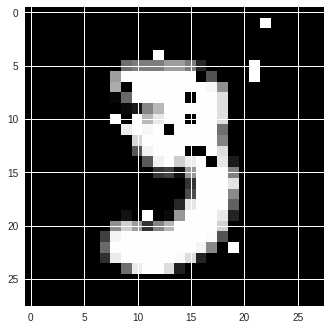

The classification label following attack is 5 from an original classification of 3
The L0 distance of the adversary is 0.02295918367346939
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


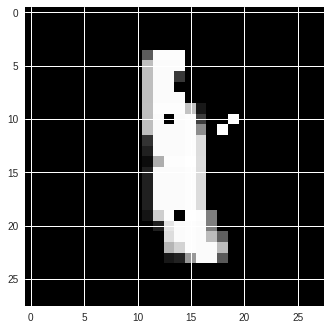

The classification label following attack is 8 from an original classification of 1
The L0 distance of the adversary is 0.007653061224489796
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


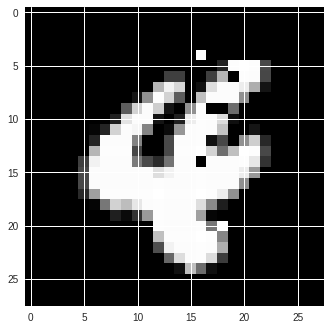

The classification label following attack is 6 from an original classification of 4
The L0 distance of the adversary is 0.008928571428571428
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


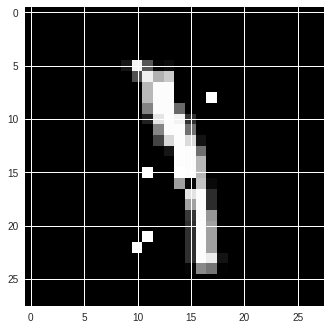

The classification label following attack is 3 from an original classification of 1
The L0 distance of the adversary is 0.007653061224489796
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


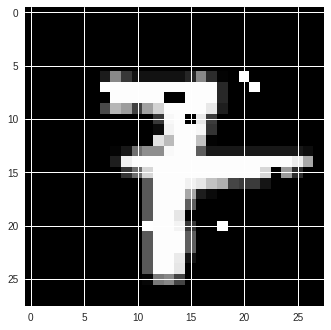

The classification label following attack is 8 from an original classification of 7
The L0 distance of the adversary is 0.012755102040816327
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


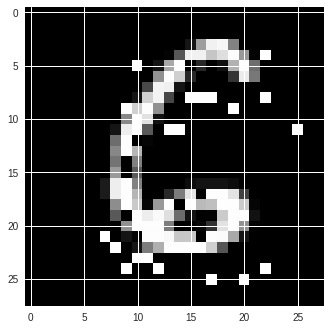

The classification label following attack is 5 from an original classification of 6
The L0 distance of the adversary is 0.036989795918367346
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


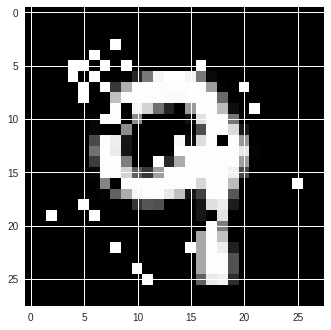

The classification label following attack is 3 from an original classification of 9
The L0 distance of the adversary is 0.044642857142857144


In [0]:
adversary_found, adversary_distance, adversary_arrays = evaluate_l0_PointWiseAttack_resistance_CustomModel(
    model_prediction_function=cnn_predictions, model_weights="/MNIST_LeNet5_CNN.ckpt", var_list=var_list_LeNet,
    num_images_to_attack=num_images_to_attack, temp_batch_size=None)

In [0]:
success_ratio = np.sum(adversary_found)/num_images_to_attack
mean_distance_successful_attacks = np.sum(adversary_distance)/np.sum(adversary_found)

print("The success ratio is " + str(success_ratio))
print("The mean distance is " + str(mean_distance_successful_attacks))


The success ratio is 1.0
The mean distance is 0.02331632653061225


The Point-Wise attack is able to achieve 100% misclassification against the binding CNN with a mean l-0 distance of 0.0233. This is a larger distance than that required against the binding CNN, arguing against increased adversarial resistance through the 'binding' representations. Note these results were obtained from 100 images. 

####Binding CNN

INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


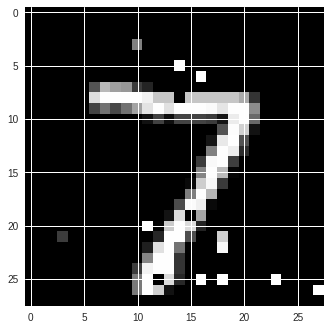

The classification label following attack is 2 from an original classification of 7
The L0 distance of the adversary is 0.01913265306122449
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


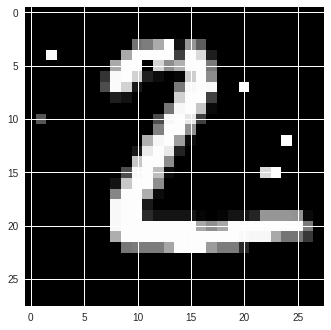

The classification label following attack is 6 from an original classification of 2
The L0 distance of the adversary is 0.012755102040816327
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


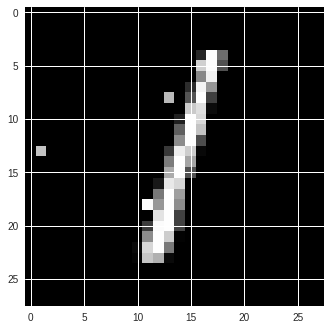

The classification label following attack is 8 from an original classification of 1
The L0 distance of the adversary is 0.00510204081632653
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


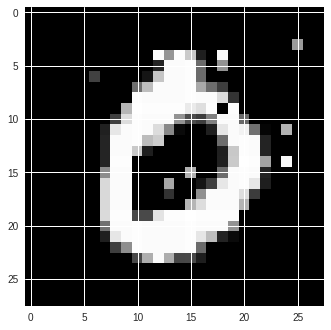

The classification label following attack is 6 from an original classification of 0
The L0 distance of the adversary is 0.015306122448979591
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


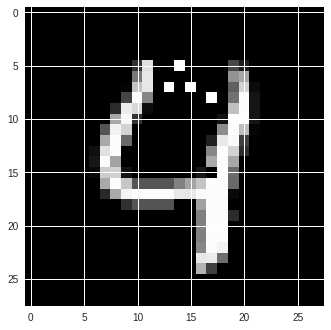

The classification label following attack is 9 from an original classification of 4
The L0 distance of the adversary is 0.007653061224489796
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


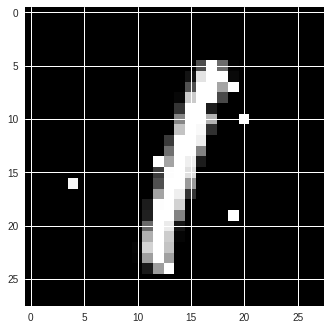

The classification label following attack is 8 from an original classification of 1
The L0 distance of the adversary is 0.01020408163265306
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


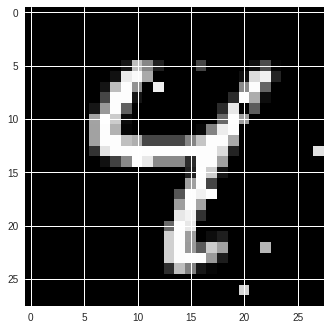

The classification label following attack is 8 from an original classification of 4
The L0 distance of the adversary is 0.01020408163265306
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


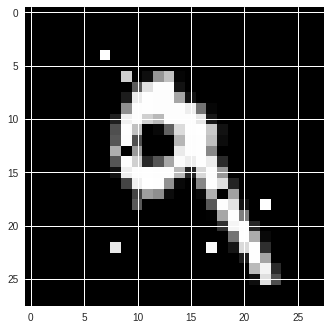

The classification label following attack is 3 from an original classification of 9
The L0 distance of the adversary is 0.01020408163265306
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


The model predicted a 6 when the ground-truth label is 5


/usr/local/lib/python3.6/dist-packages/foolbox/attacks/base.py:129: UserWarning: Not running the attack because the original input is already misclassified and the adversarial thus has a distance of 0.
  warnings.warn('Not running the attack because the original input'


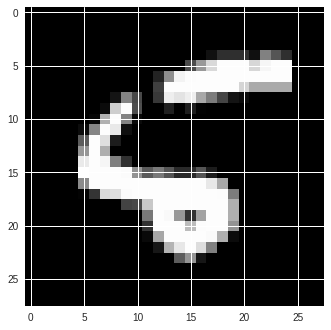

The classification label following attack is 6 from an original classification of 5
The L0 distance of the adversary is 0.0
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


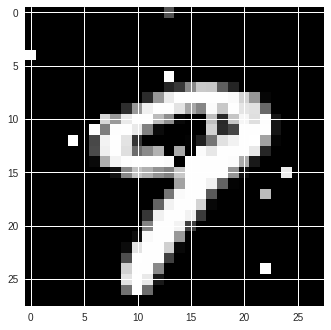

The classification label following attack is 7 from an original classification of 9
The L0 distance of the adversary is 0.016581632653061226
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


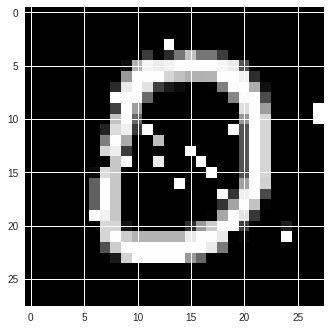

The classification label following attack is 8 from an original classification of 0
The L0 distance of the adversary is 0.02423469387755102
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


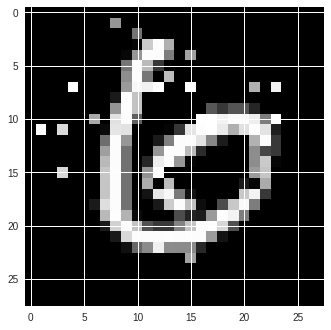

The classification label following attack is 8 from an original classification of 6
The L0 distance of the adversary is 0.029336734693877552
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


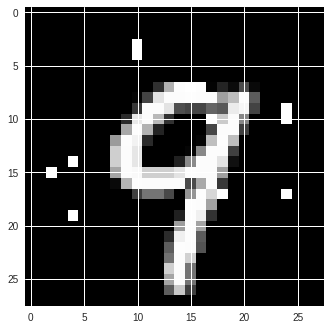

The classification label following attack is 4 from an original classification of 9
The L0 distance of the adversary is 0.01403061224489796
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


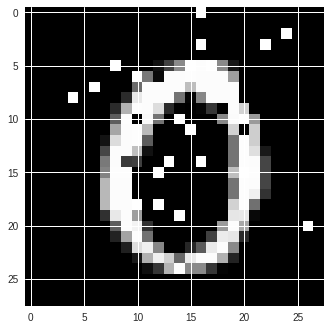

The classification label following attack is 5 from an original classification of 0
The L0 distance of the adversary is 0.030612244897959183
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


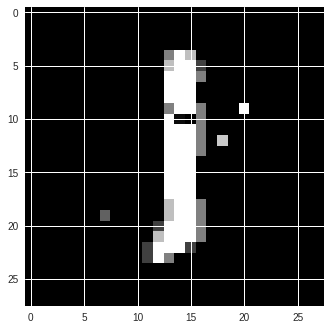

The classification label following attack is 8 from an original classification of 1
The L0 distance of the adversary is 0.006377551020408163
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


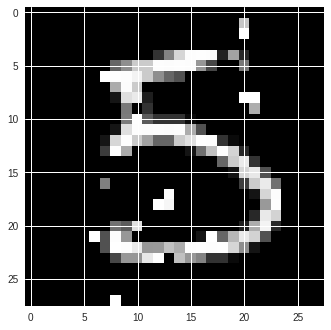

The classification label following attack is 8 from an original classification of 5
The L0 distance of the adversary is 0.02295918367346939
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


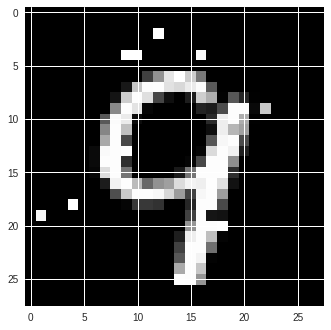

The classification label following attack is 4 from an original classification of 9
The L0 distance of the adversary is 0.01403061224489796
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


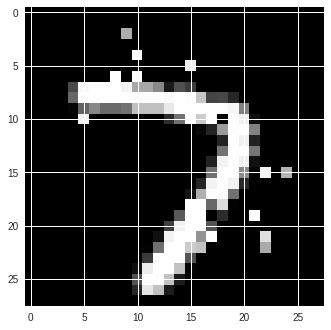

The classification label following attack is 2 from an original classification of 7
The L0 distance of the adversary is 0.02423469387755102
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


The model predicted a 8 when the ground-truth label is 3


/usr/local/lib/python3.6/dist-packages/foolbox/attacks/base.py:129: UserWarning: Not running the attack because the original input is already misclassified and the adversarial thus has a distance of 0.
  warnings.warn('Not running the attack because the original input'


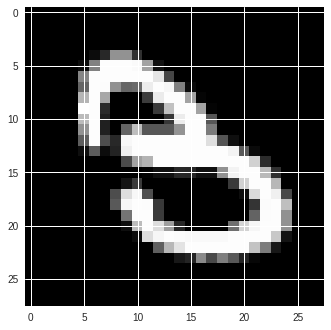

The classification label following attack is 8 from an original classification of 3
The L0 distance of the adversary is 0.0
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


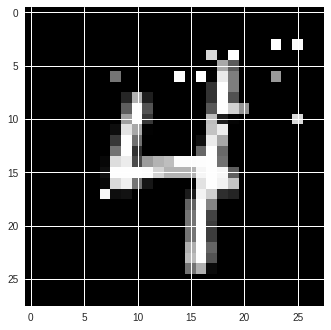

The classification label following attack is 9 from an original classification of 4
The L0 distance of the adversary is 0.016581632653061226
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


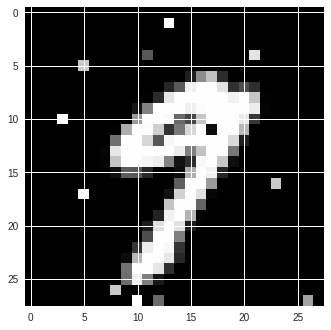

The classification label following attack is 7 from an original classification of 9
The L0 distance of the adversary is 0.016581632653061226
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


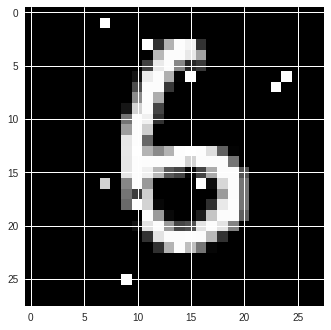

The classification label following attack is 5 from an original classification of 6
The L0 distance of the adversary is 0.012755102040816327
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


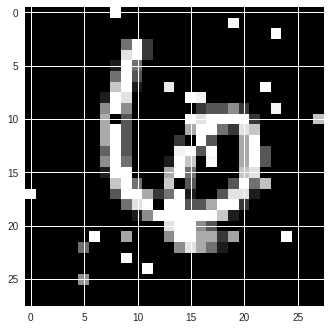

The classification label following attack is 8 from an original classification of 6
The L0 distance of the adversary is 0.03826530612244898
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


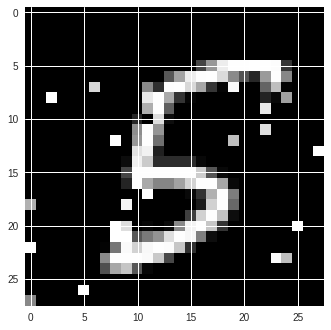

The classification label following attack is 8 from an original classification of 5
The L0 distance of the adversary is 0.03188775510204082
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


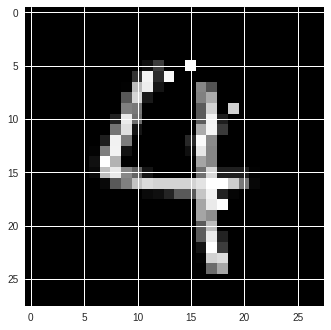

The classification label following attack is 9 from an original classification of 4
The L0 distance of the adversary is 0.006377551020408163
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


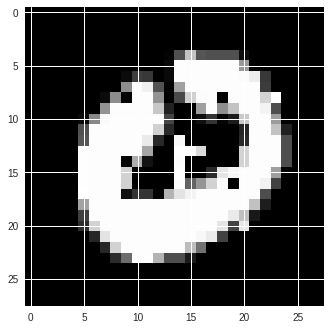

The classification label following attack is 6 from an original classification of 0
The L0 distance of the adversary is 0.02040816326530612
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


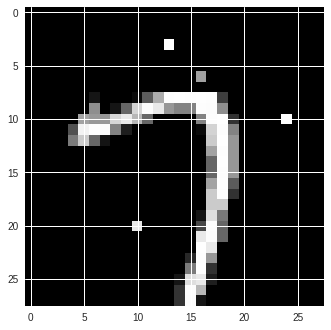

The classification label following attack is 2 from an original classification of 7
The L0 distance of the adversary is 0.00510204081632653
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


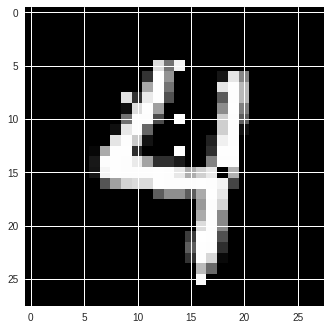

The classification label following attack is 9 from an original classification of 4
The L0 distance of the adversary is 0.008928571428571428
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


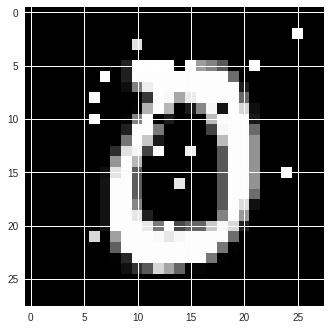

The classification label following attack is 2 from an original classification of 0
The L0 distance of the adversary is 0.01913265306122449
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


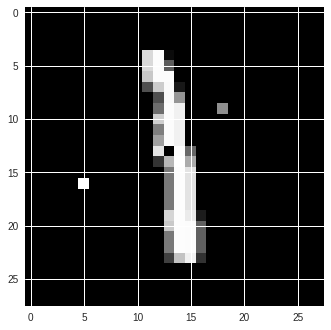

The classification label following attack is 5 from an original classification of 1
The L0 distance of the adversary is 0.003826530612244898
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


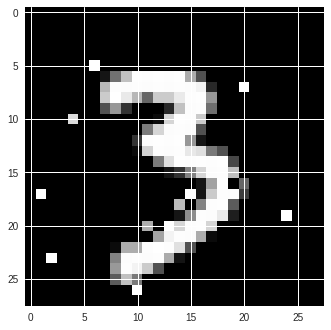

The classification label following attack is 7 from an original classification of 3
The L0 distance of the adversary is 0.015306122448979591
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


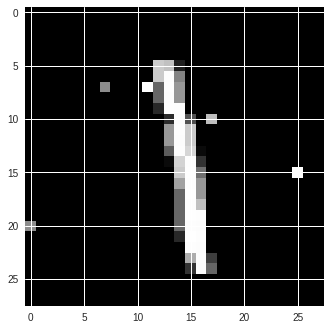

The classification label following attack is 7 from an original classification of 1
The L0 distance of the adversary is 0.007653061224489796
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


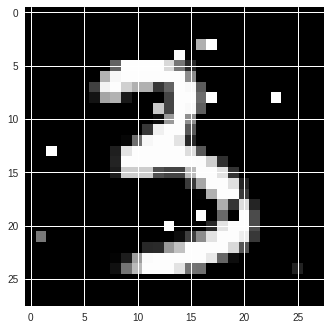

The classification label following attack is 5 from an original classification of 3
The L0 distance of the adversary is 0.016581632653061226
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


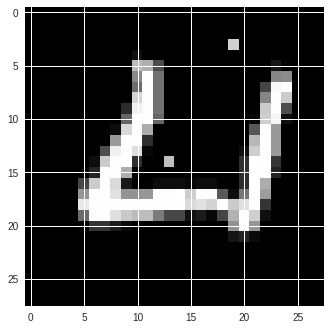

The classification label following attack is 6 from an original classification of 4
The L0 distance of the adversary is 0.002551020408163265
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


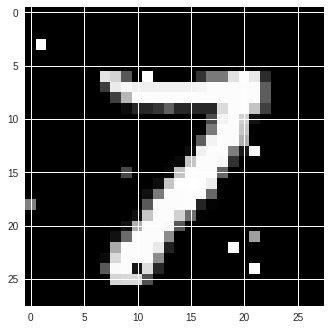

The classification label following attack is 2 from an original classification of 7
The L0 distance of the adversary is 0.012755102040816327
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


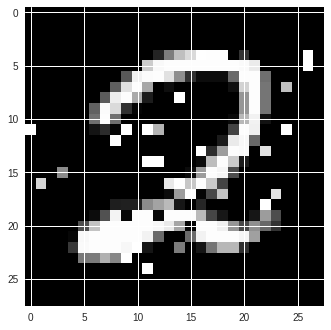

The classification label following attack is 8 from an original classification of 2
The L0 distance of the adversary is 0.044642857142857144
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


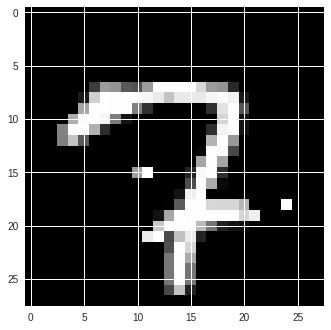

The classification label following attack is 2 from an original classification of 7
The L0 distance of the adversary is 0.007653061224489796
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


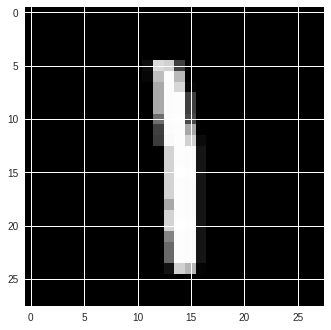

The classification label following attack is 8 from an original classification of 1
The L0 distance of the adversary is 0.0012755102040816326
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


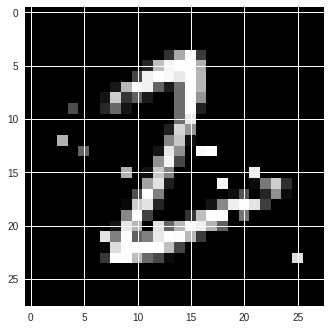

The classification label following attack is 8 from an original classification of 2
The L0 distance of the adversary is 0.02040816326530612
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


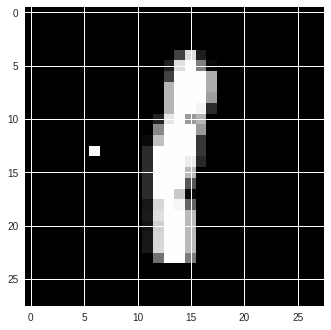

The classification label following attack is 8 from an original classification of 1
The L0 distance of the adversary is 0.002551020408163265
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


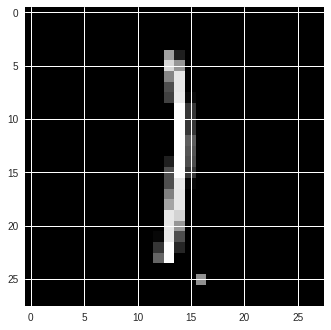

The classification label following attack is 2 from an original classification of 1
The L0 distance of the adversary is 0.0012755102040816326
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


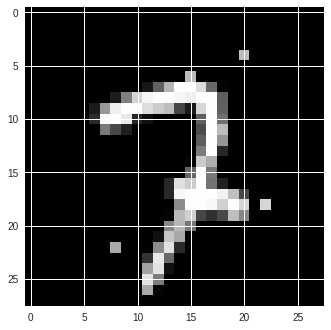

The classification label following attack is 2 from an original classification of 7
The L0 distance of the adversary is 0.006377551020408163
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


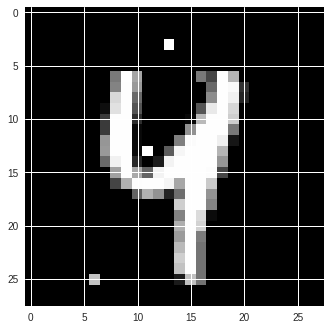

The classification label following attack is 9 from an original classification of 4
The L0 distance of the adversary is 0.00510204081632653
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


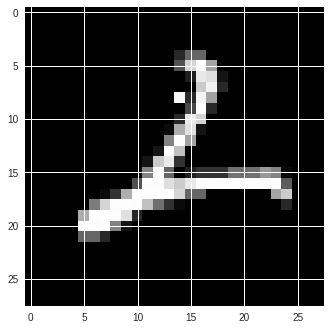

The classification label following attack is 6 from an original classification of 2
The L0 distance of the adversary is 0.0012755102040816326
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


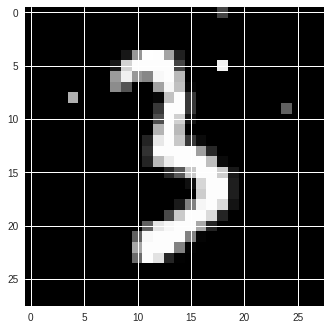

The classification label following attack is 5 from an original classification of 3
The L0 distance of the adversary is 0.00510204081632653
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


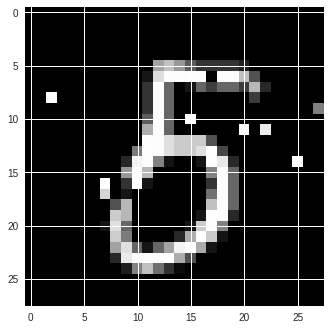

The classification label following attack is 8 from an original classification of 5
The L0 distance of the adversary is 0.012755102040816327
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


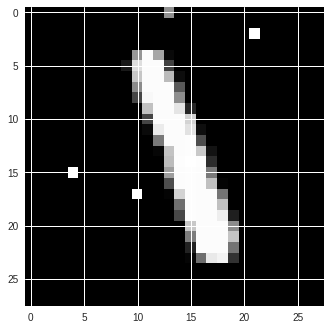

The classification label following attack is 8 from an original classification of 1
The L0 distance of the adversary is 0.00510204081632653
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


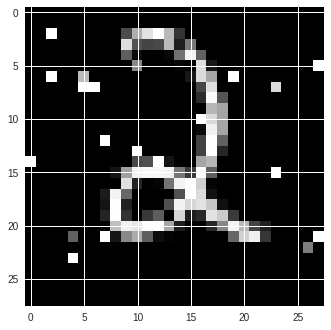

The classification label following attack is 4 from an original classification of 2
The L0 distance of the adversary is 0.03188775510204082
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


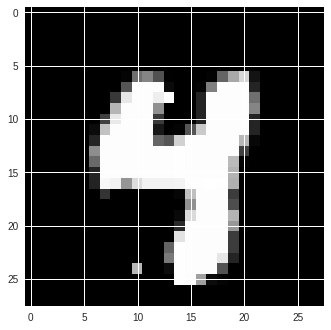

The classification label following attack is 9 from an original classification of 4
The L0 distance of the adversary is 0.002551020408163265
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


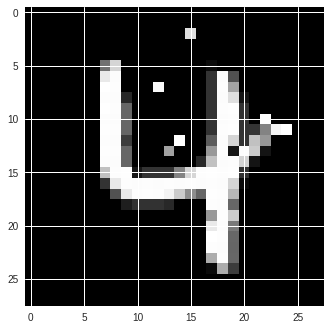

The classification label following attack is 9 from an original classification of 4
The L0 distance of the adversary is 0.012755102040816327
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


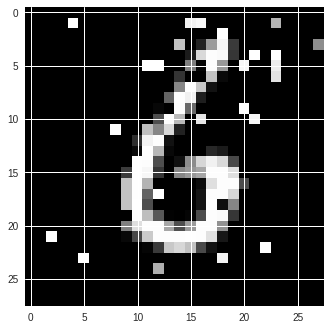

The classification label following attack is 2 from an original classification of 6
The L0 distance of the adversary is 0.042091836734693876
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


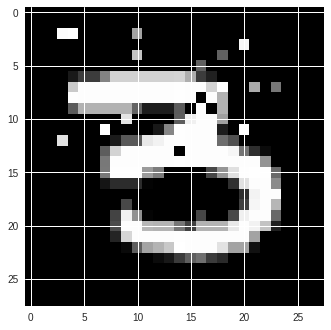

The classification label following attack is 5 from an original classification of 3
The L0 distance of the adversary is 0.02423469387755102
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


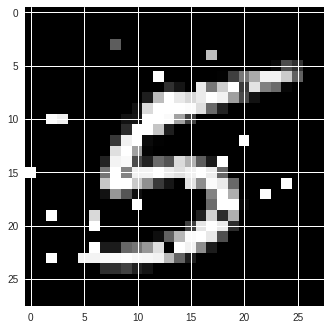

The classification label following attack is 2 from an original classification of 5
The L0 distance of the adversary is 0.03443877551020408
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


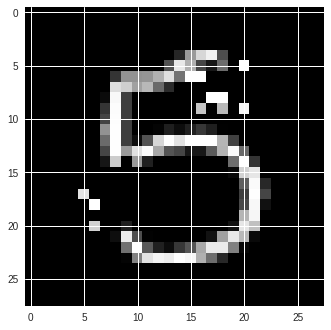

The classification label following attack is 3 from an original classification of 5
The L0 distance of the adversary is 0.016581632653061226
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


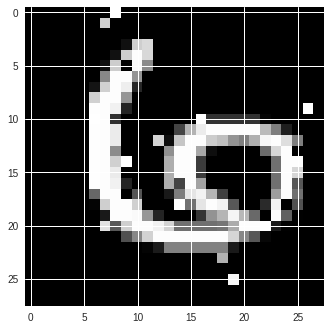

The classification label following attack is 8 from an original classification of 6
The L0 distance of the adversary is 0.02295918367346939
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


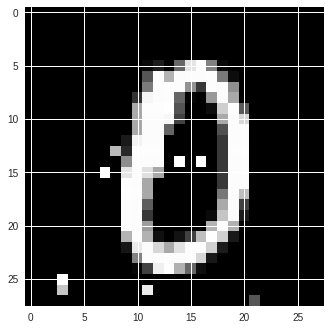

The classification label following attack is 8 from an original classification of 0
The L0 distance of the adversary is 0.01020408163265306
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


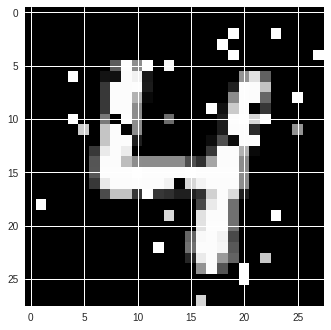

The classification label following attack is 9 from an original classification of 4
The L0 distance of the adversary is 0.039540816326530615
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


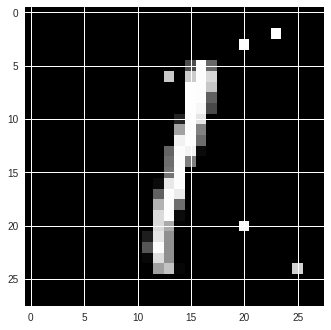

The classification label following attack is 2 from an original classification of 1
The L0 distance of the adversary is 0.006377551020408163
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


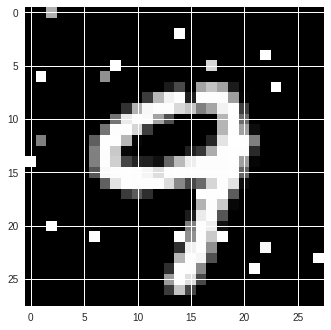

The classification label following attack is 4 from an original classification of 9
The L0 distance of the adversary is 0.025510204081632654
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


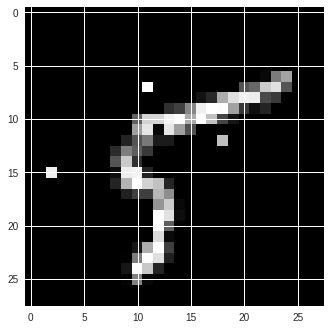

The classification label following attack is 8 from an original classification of 5
The L0 distance of the adversary is 0.006377551020408163
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


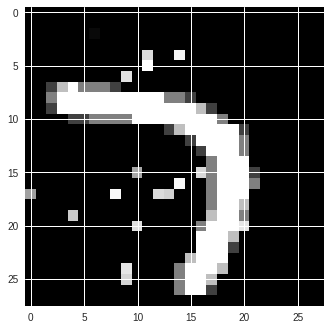

The classification label following attack is 3 from an original classification of 7
The L0 distance of the adversary is 0.021683673469387755
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


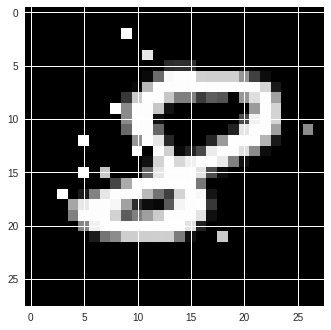

The classification label following attack is 2 from an original classification of 8
The L0 distance of the adversary is 0.015306122448979591
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


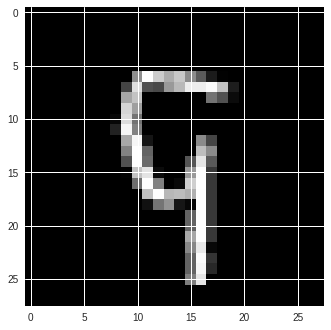

The classification label following attack is 5 from an original classification of 9
The L0 distance of the adversary is 0.0012755102040816326
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


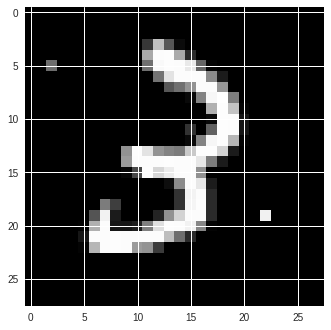

The classification label following attack is 2 from an original classification of 3
The L0 distance of the adversary is 0.006377551020408163
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


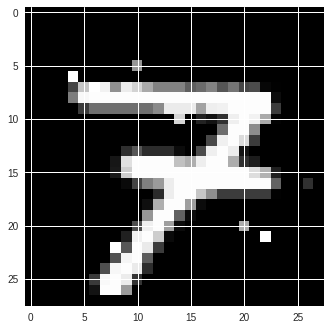

The classification label following attack is 2 from an original classification of 7
The L0 distance of the adversary is 0.011479591836734694
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


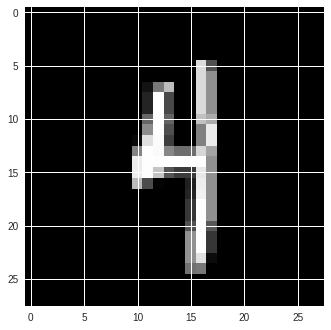

The classification label following attack is 9 from an original classification of 4
The L0 distance of the adversary is 0.0012755102040816326
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


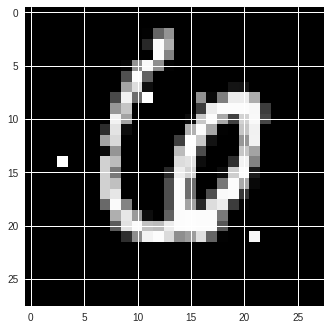

The classification label following attack is 2 from an original classification of 6
The L0 distance of the adversary is 0.007653061224489796
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


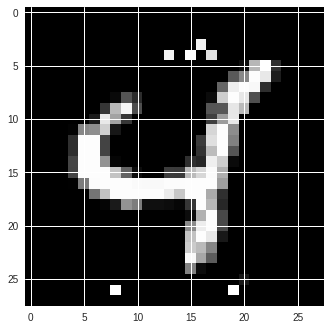

The classification label following attack is 9 from an original classification of 4
The L0 distance of the adversary is 0.01020408163265306
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


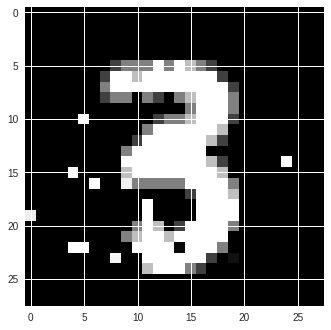

The classification label following attack is 8 from an original classification of 3
The L0 distance of the adversary is 0.01913265306122449
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


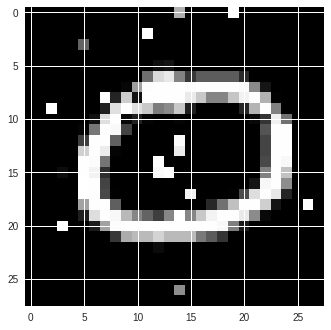

The classification label following attack is 6 from an original classification of 0
The L0 distance of the adversary is 0.025510204081632654
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


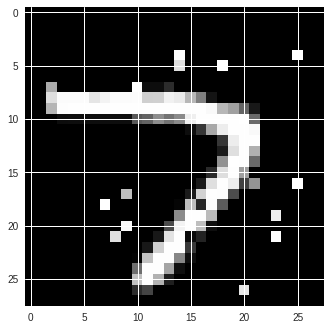

The classification label following attack is 2 from an original classification of 7
The L0 distance of the adversary is 0.021683673469387755
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


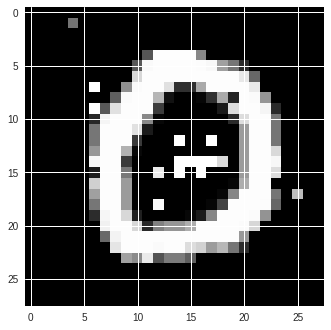

The classification label following attack is 8 from an original classification of 0
The L0 distance of the adversary is 0.02295918367346939
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


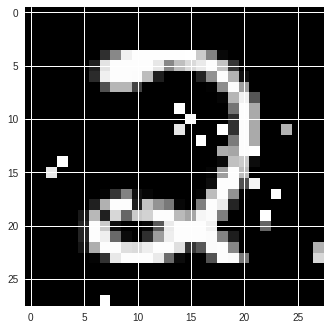

The classification label following attack is 3 from an original classification of 2
The L0 distance of the adversary is 0.025510204081632654
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


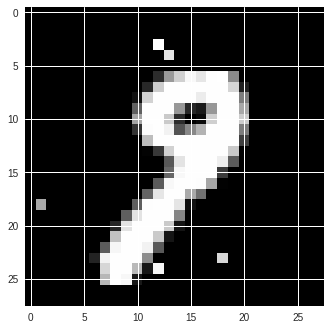

The classification label following attack is 2 from an original classification of 9
The L0 distance of the adversary is 0.006377551020408163
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


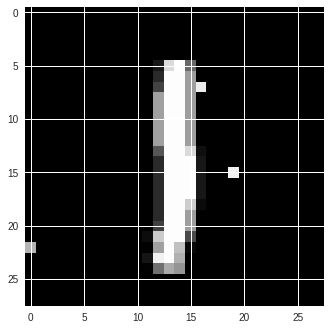

The classification label following attack is 8 from an original classification of 1
The L0 distance of the adversary is 0.003826530612244898
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


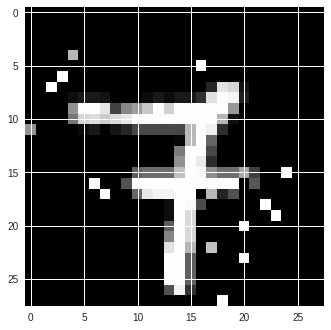

The classification label following attack is 2 from an original classification of 7
The L0 distance of the adversary is 0.021683673469387755
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


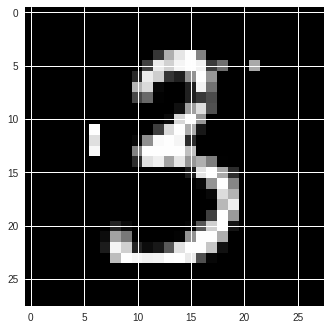

The classification label following attack is 5 from an original classification of 3
The L0 distance of the adversary is 0.007653061224489796
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


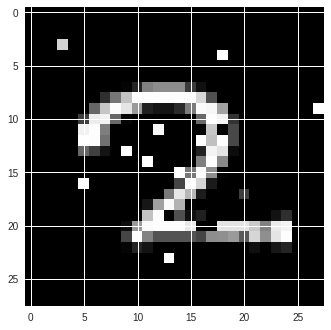

The classification label following attack is 8 from an original classification of 2
The L0 distance of the adversary is 0.01913265306122449
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


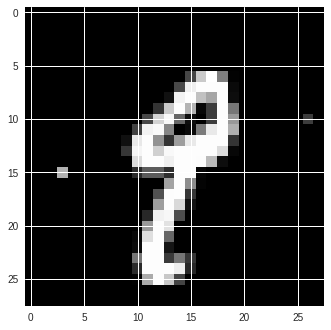

The classification label following attack is 8 from an original classification of 9
The L0 distance of the adversary is 0.003826530612244898
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


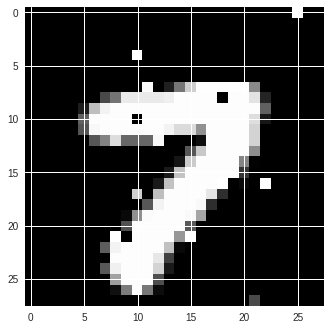

The classification label following attack is 2 from an original classification of 7
The L0 distance of the adversary is 0.02040816326530612
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


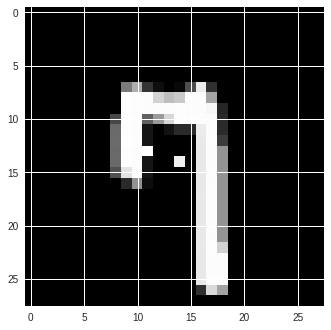

The classification label following attack is 9 from an original classification of 7
The L0 distance of the adversary is 0.002551020408163265
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


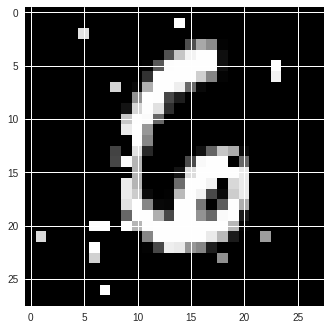

The classification label following attack is 5 from an original classification of 6
The L0 distance of the adversary is 0.025510204081632654
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


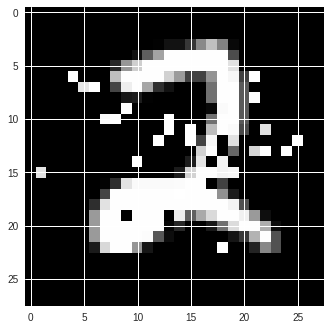

The classification label following attack is 8 from an original classification of 2
The L0 distance of the adversary is 0.039540816326530615
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


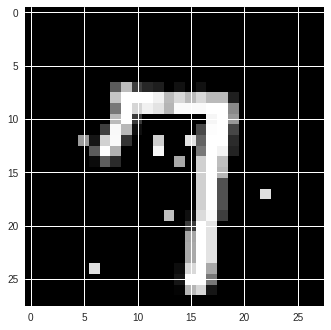

The classification label following attack is 9 from an original classification of 7
The L0 distance of the adversary is 0.01020408163265306
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


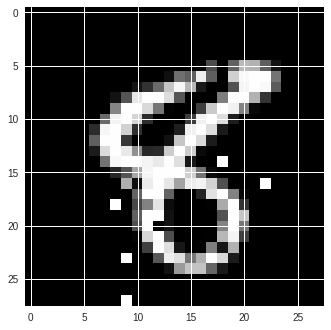

The classification label following attack is 5 from an original classification of 8
The L0 distance of the adversary is 0.012755102040816327
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


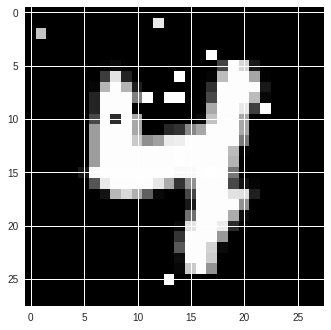

The classification label following attack is 9 from an original classification of 4
The L0 distance of the adversary is 0.01403061224489796
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


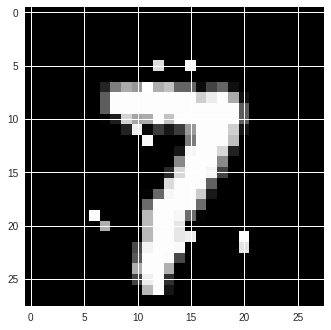

The classification label following attack is 2 from an original classification of 7
The L0 distance of the adversary is 0.012755102040816327
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


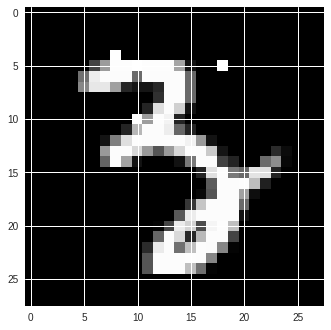

The classification label following attack is 5 from an original classification of 3
The L0 distance of the adversary is 0.006377551020408163
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


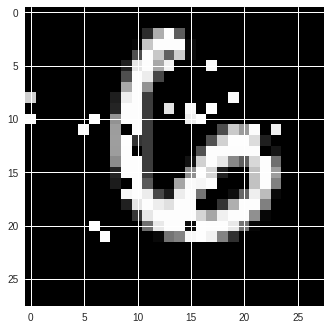

The classification label following attack is 2 from an original classification of 6
The L0 distance of the adversary is 0.030612244897959183
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


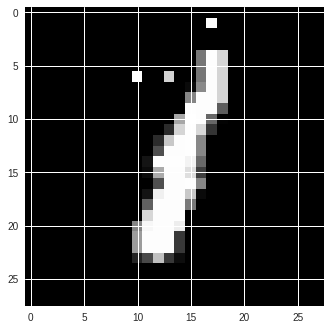

The classification label following attack is 8 from an original classification of 1
The L0 distance of the adversary is 0.003826530612244898
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


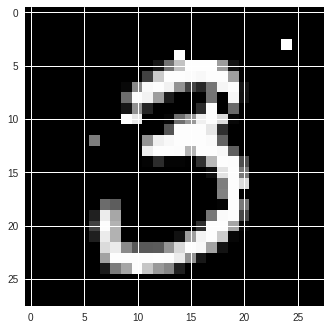

The classification label following attack is 5 from an original classification of 3
The L0 distance of the adversary is 0.011479591836734694
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


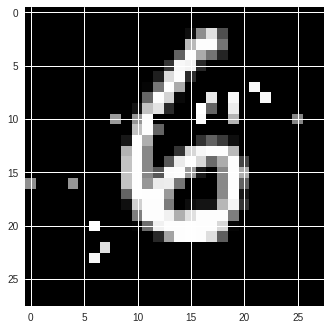

The classification label following attack is 5 from an original classification of 6
The L0 distance of the adversary is 0.021683673469387755
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


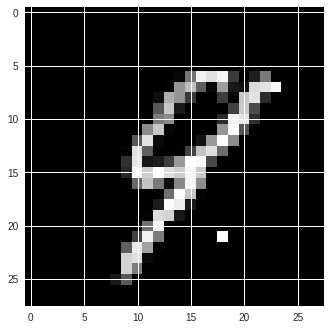

The classification label following attack is 8 from an original classification of 9
The L0 distance of the adversary is 0.002551020408163265
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


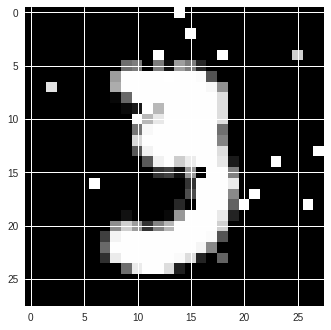

The classification label following attack is 5 from an original classification of 3
The L0 distance of the adversary is 0.025510204081632654
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


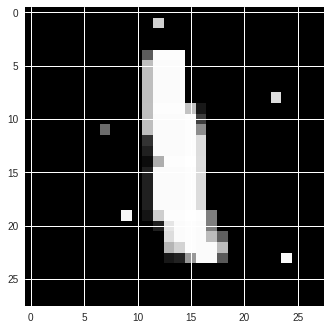

The classification label following attack is 8 from an original classification of 1
The L0 distance of the adversary is 0.006377551020408163
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


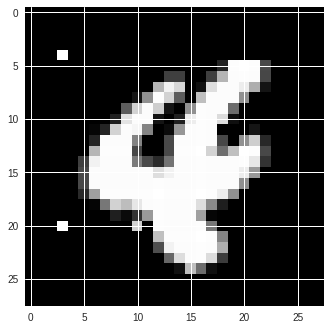

The classification label following attack is 6 from an original classification of 4
The L0 distance of the adversary is 0.00510204081632653
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


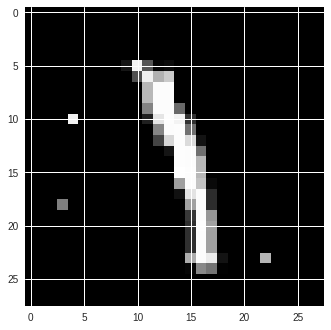

The classification label following attack is 8 from an original classification of 1
The L0 distance of the adversary is 0.00510204081632653
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


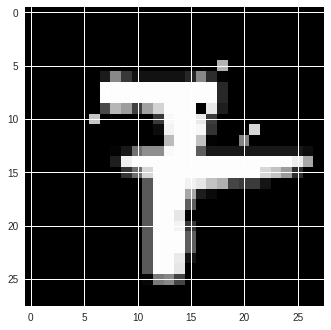

The classification label following attack is 8 from an original classification of 7
The L0 distance of the adversary is 0.006377551020408163
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


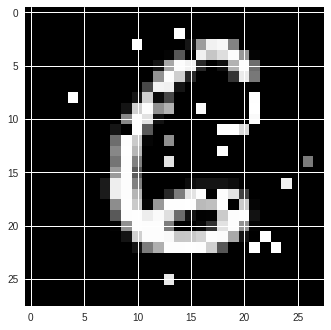

The classification label following attack is 2 from an original classification of 6
The L0 distance of the adversary is 0.03188775510204082
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


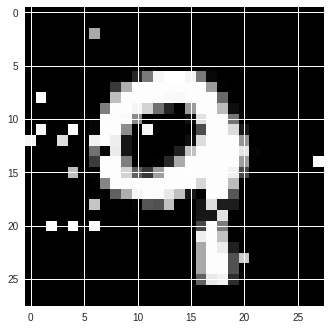

The classification label following attack is 2 from an original classification of 9
The L0 distance of the adversary is 0.02806122448979592


In [0]:
adversary_found, adversary_distance, adversary_arrays = evaluate_l0_PointWiseAttack_resistance_CustomModel(
    model_prediction_function=cnn_binding_predictions, model_weights="/Binding_CNN.ckpt", var_list=var_list_Binding,
    num_images_to_attack=num_images_to_attack, temp_batch_size=1)

In [0]:
success_ratio = np.sum(adversary_found)/num_images_to_attack
mean_distance_successful_attacks = np.sum(adversary_distance)/np.sum(adversary_found)

print("The success ratio is " + str(success_ratio))
print("The mean distance is " + str(mean_distance_successful_attacks))


The success ratio is 1.0
The mean distance is 0.014719387755102042


The Point-Wise attack is able to achieve 100% misclassification against the binding CNN with a mean l-0 distance of 0.0147. This is a smaller distance than that required against the standard CNN, arguing against increased adversarial resistance. Note these results were obtained from 100 images. 

##Basic Iterative (Gradient-Based) Attack

L-infinity minimising, gradient based method.

###BIM Attack Functions for the TensorFlow Models

In [0]:
# *** this code can eventually be refractored with earlier functions

#Function used to attack an arbitrary model that has been implemented with TensorFlow's low-level API (i.e. requires a session to be called explicitly)
def BIM_Attack_customTensorFlowModel(model_prediction_function, model_weights, var_list, test_image, test_label, temp_batch_size):

    images = x #x is a place-holder for 28x28 images earlier defined
    logits = model_prediction_function(images, temp_batch_size)

    saver = tf.train.Saver(var_list) #Define saver object for use later when loading the model weights

    #Note how when attacking a low-level TensorFlow API model, it is necessary for all steps to occur within the tf.Session()
    with tf.Session() as session:
        saver.restore(session, model_weights)

        #Define the foolbox model
        fmodel = foolbox.models.TensorFlowModel(images, logits, (0,1)) #The final parameter specifies the input values range

        #The predicted label of the network prior to carrying out the attack
        pre_label = np.argmax(fmodel.predictions(test_image[:, :, :]))
        #print("The classification label prior to attack is " + str(pre_label))
        if (pre_label != test_label):
            print("The model predicted a " + str(pre_label) + " when the ground-truth label is " + str(test_label))
            plt.imshow(test_image[:,:,0], cmap='gray')

        #Carry out the untargeted Bounary Attack
        attack_fmodel = foolbox.attacks.LinfinityBasicIterativeAttack(model=fmodel, criterion=foolbox.criteria.Misclassification(),
                                                                     distance=foolbox.distances.Linfinity)
        adversarial_image_fmodel = attack_fmodel(test_image, test_label, epsilon=0.001)
        plt.imshow(adversarial_image_fmodel[:,:,0], cmap='gray')
        plt.show()
        
        #Check the output of the adversarial attack
        adversarial_label_fmodel = np.argmax(fmodel.predictions(adversarial_image_fmodel[:, :, :]))
        print("The classification label following attack is " + str(adversarial_label_fmodel) 
              + " from an original classification of " + str(test_label))
        
        return adversarial_image_fmodel, adversarial_label_fmodel

###Visualize the BIM Attack

INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


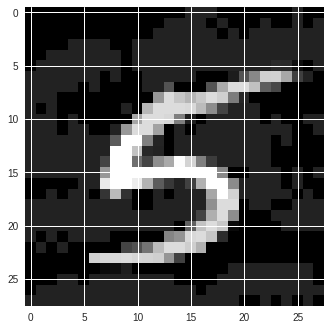

The classification label following attack is 4 from an original classification of 5


In [0]:
#An example of the attack
adversarial_image_fmodel, adversarial_label_fmodel = BIM_Attack_customTensorFlowModel(model_prediction_function=cnn_predictions,
                                                                 model_weights="/MNIST_LeNet5_CNN.ckpt", 
                                                                var_list=var_list_LeNet,
                                                                 test_image=test_image_LeNet, 
                                                                 test_label=test_label_LeNet,
                                                                 temp_batch_size=None)


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


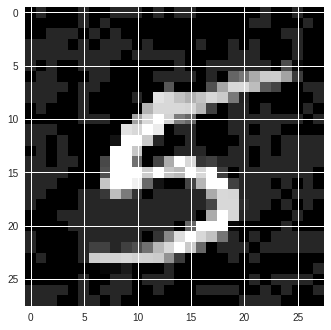

The classification label following attack is 6 from an original classification of 5


In [0]:
adversarial_image_fmodel, adversarial_label_fmodel = BIM_Attack_customTensorFlowModel(model_prediction_function=cnn_binding_predictions,
                                                                 model_weights="/Binding_CNN.ckpt",
                                                                  var_list=var_list_Binding,
                                                                 test_image=test_image_LeNet, 
                                                                 test_label=test_label_LeNet,
                                                                 temp_batch_size=1)


##Blended Uniform Noise Attack

###Blended Uniform Noise Attack Function for the TensorFlow Models

In [0]:
# *** this code can eventually be refractored with earlier functions

#Function used to attack an arbitrary model that has been implemented with TensorFlow's low-level API (i.e. requires a session to be called explicitly)
def BlendedUniformNoise_Attack_customTensorFlowModel(model_prediction_function, model_weights, 
                                                     var_list, test_image, test_label, temp_batch_size):

    images = x #x is a place-holder for 28x28 images earlier defined
    logits = model_prediction_function(images, temp_batch_size)

    saver = tf.train.Saver(var_list) #Define saver object for use later when loading the model weights

    #Note how when attacking a low-level TensorFlow API model, it is necessary for all steps to occur within the tf.Session()
    with tf.Session() as session:
        saver.restore(session, model_weights)

        #Define the foolbox model
        fmodel = foolbox.models.TensorFlowModel(images, logits, (0,1)) #The final parameter specifies the input values range

        #The predicted label of the network prior to carrying out the attack
        pre_label = np.argmax(fmodel.predictions(test_image[:, :, :]))
        #print("The classification label prior to attack is " + str(pre_label))
        if (pre_label != test_label):
            print("The model predicted a " + str(pre_label) + " when the ground-truth label is " + str(test_label))
            plt.imshow(test_image[:,:,0], cmap='gray')

        #Carry out the untargeted Bounary Attack
        attack_fmodel = foolbox.attacks.BlendedUniformNoiseAttack(model=fmodel, criterion=foolbox.criteria.Misclassification())
        adversarial_image_fmodel = attack_fmodel(test_image, test_label)
        plt.imshow(adversarial_image_fmodel[:,:,0], cmap='gray')
        plt.show()
        
        #Check the output of the adversarial attack
        adversarial_label_fmodel = np.argmax(fmodel.predictions(adversarial_image_fmodel[:, :, :]))
        print("The classification label following attack is " + str(adversarial_label_fmodel) 
              + " from an original classification of " + str(test_label))
        
        return adversarial_image_fmodel, adversarial_label_fmodel

In [0]:
# *** this code can eventually be refractored with earlier functions

#Iterate through a series of images to be attacked
def evaluate_BlendedUniformNoiseAttack_resistance_CustomModel(model_prediction_function, model_weights, 
                                                              var_list, num_images_to_attack, temp_batch_size):
    adversary_found = np.zeros([num_images_to_attack]) #array of booleans that indicates if an adversary was found for a particular image
    adversary_distance = np.zeros([num_images_to_attack])
    adversary_arrays = np.zeros([num_images_to_attack, testing_data.shape[1], testing_data.shape[2], 1])

    for ii in range(num_images_to_attack):
        test_image = testing_data[ii, :, :]
        test_label = np.argmax(testing_labels[ii,:])

        adversarial_image_fmodel, adversarial_classification = BlendedUniformNoise_Attack_customTensorFlowModel(model_prediction_function, 
                                                                                                     model_weights, var_list, 
                                                                                                     test_image, test_label, 
                                                                                                     temp_batch_size)
        adversary_arrays[ii, :, :] = adversarial_image_fmodel

        if ((np.any(adversarial_image_fmodel == None) | adversarial_classification == test_label)):
            print("No adversarial image found")

        else:
            l2_distance = scipy.spatial.distance.euclidean(test_image.flatten(), adversarial_image_fmodel.flatten())
            print("The L2 distance of the adversary is " + str(l2_distance))
            adversary_found[ii] = 1
            adversary_distance[ii] = l2_distance
        
    return adversary_found, adversary_distance, adversary_arrays

###Blended Uniform Noise Attack Function for the Keras Models

In [0]:
#Function to iterate through a series of images to be attacked
def evaluate_BlendedUniformNoiseAttack_resistance_MadryModel(num_images_to_attack):
    adversary_found = np.zeros([num_images_to_attack]) #array of booleans that indicates if an adversary was found for a particular image
    adversary_distance = np.zeros([num_images_to_attack])
    adversary_arrays = np.zeros([num_images_to_attack, Madry_testing_data.shape[1]])
    
    for ii in range(num_images_to_attack):
        test_image_Madry = Madry_testing_data[ii, :]
        test_label_Madry = np.argmax(Madry_testing_labels[ii,:])

        Madry_attack = foolbox.attacks.BlendedUniformNoiseAttack(model=Madry_model, criterion=foolbox.criteria.Misclassification())
        Madry_adversarial_image = Madry_attack(test_image_Madry, test_label_Madry)
        adversary_arrays[ii, :] = Madry_adversarial_image
        
        # **** need to check this logical statement for accuracy
        if np.any(np.any(Madry_adversarial_image == None) | (Madry_model.predictions(Madry_adversarial_image) == test_label_Madry)):
            print("No adversarial image found")

        else:
            l2_distance = scipy.spatial.distance.euclidean(test_image_Madry, Madry_adversarial_image)
            print("The L2 distance of the adversary is " + str(l2_distance))
            adversary_found[ii] = 1
            adversary_distance[ii] = l2_distance

    return adversary_found, adversary_distance, adversary_arrays


###Visualize the Attack

INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


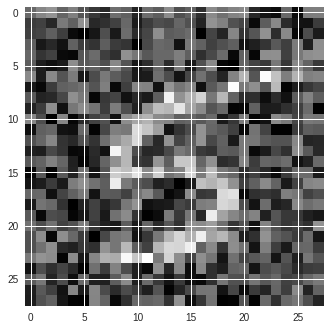

The classification label following attack is 3 from an original classification of 5


In [0]:
#An example of the attack
adversarial_image_fmodel, adversarial_label_fmodel = BlendedUniformNoise_Attack_customTensorFlowModel(model_prediction_function=cnn_predictions,
                                                                 model_weights="/MNIST_LeNet5_CNN.ckpt", 
                                                                var_list=var_list_LeNet,
                                                                 test_image=test_image_LeNet, 
                                                                 test_label=test_label_LeNet,
                                                                 temp_batch_size=None)


###Quantify Vulnerability

In [0]:
num_images_to_attack=200

INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


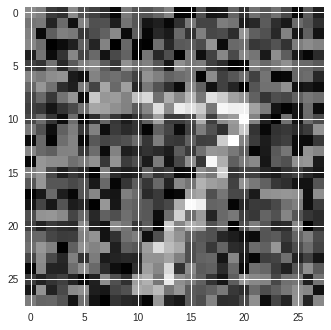

The classification label following attack is 3 from an original classification of 7
The L2 distance of the adversary is 9.200089148083961
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


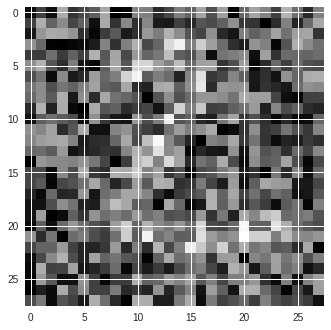

The classification label following attack is 8 from an original classification of 2
The L2 distance of the adversary is 10.824896272600952
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


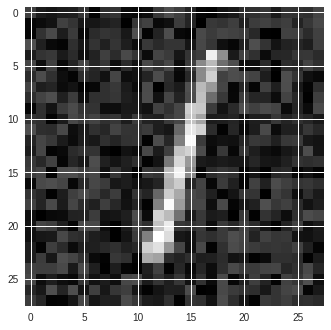

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 4.780467579246828
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


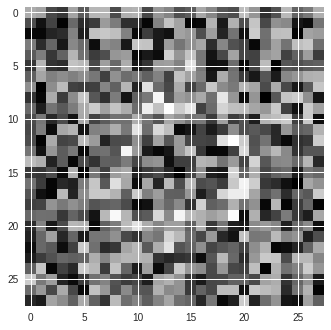

The classification label following attack is 8 from an original classification of 0
The L2 distance of the adversary is 12.516902038963334
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


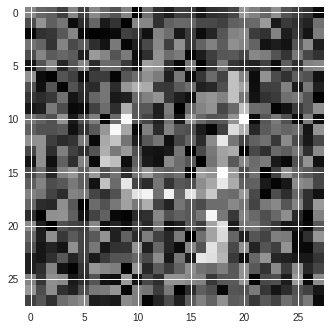

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 9.412226240612272
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


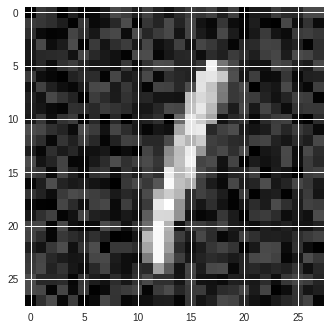

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 4.862476973391689
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


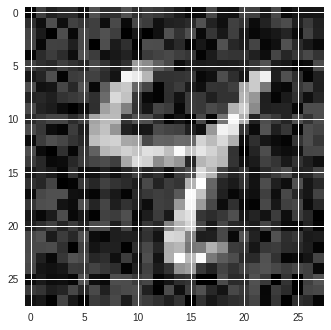

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 5.076039358831147
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


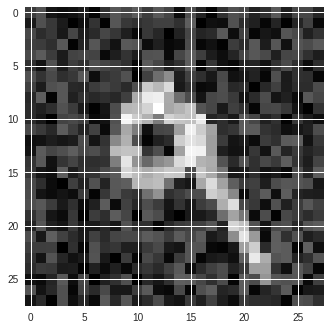

The classification label following attack is 8 from an original classification of 9
The L2 distance of the adversary is 5.897255357838962
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


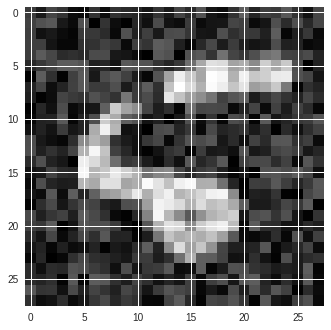

The classification label following attack is 8 from an original classification of 5
The L2 distance of the adversary is 5.624286910386364
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


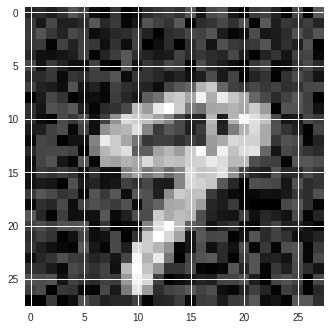

The classification label following attack is 8 from an original classification of 9
The L2 distance of the adversary is 5.511000192261172
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


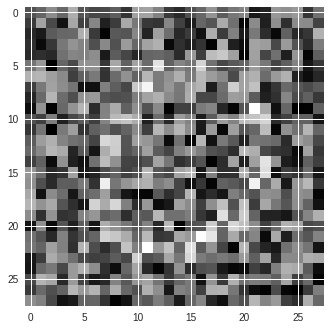

The classification label following attack is 8 from an original classification of 0
The L2 distance of the adversary is 11.331347900768867
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


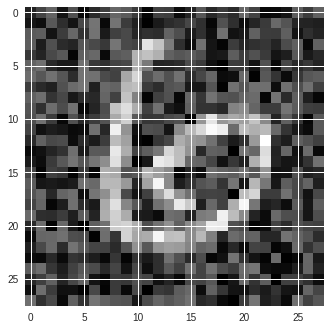

The classification label following attack is 8 from an original classification of 6
The L2 distance of the adversary is 7.0534305578501035
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


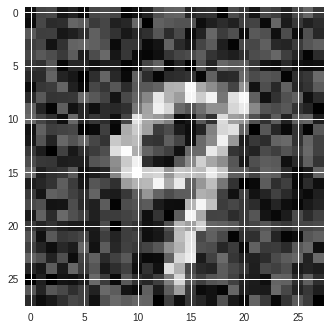

The classification label following attack is 8 from an original classification of 9
The L2 distance of the adversary is 6.375970980465394
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


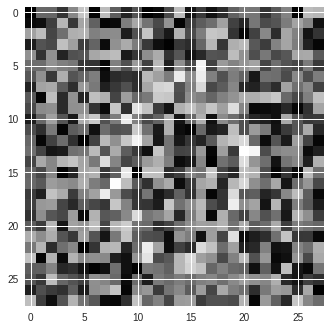

The classification label following attack is 8 from an original classification of 0
The L2 distance of the adversary is 11.63484367000169
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


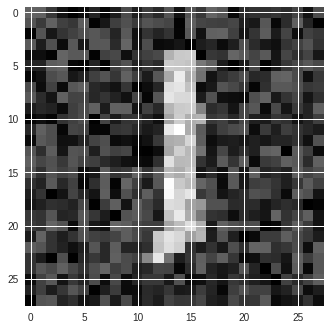

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 6.270375760989667
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


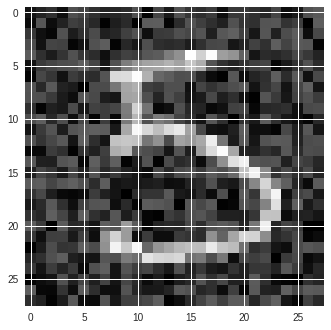

The classification label following attack is 8 from an original classification of 5
The L2 distance of the adversary is 5.935904277318102
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


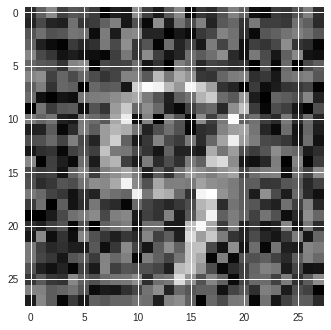

The classification label following attack is 8 from an original classification of 9
The L2 distance of the adversary is 8.74944800453234
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


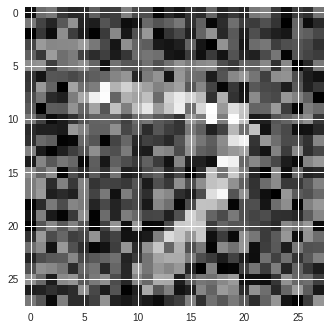

The classification label following attack is 3 from an original classification of 7
The L2 distance of the adversary is 9.500090278172982
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


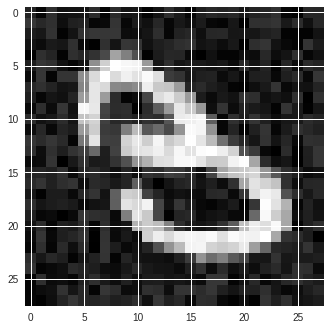

The classification label following attack is 8 from an original classification of 3
The L2 distance of the adversary is 3.3836354739728307
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


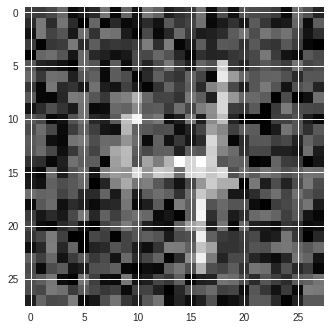

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 7.670672157789863
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


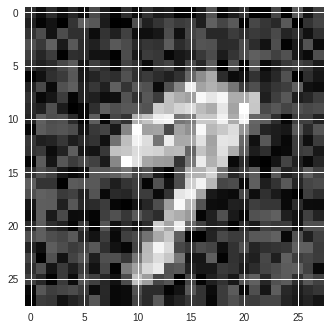

The classification label following attack is 3 from an original classification of 9
The L2 distance of the adversary is 5.990687046402707
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


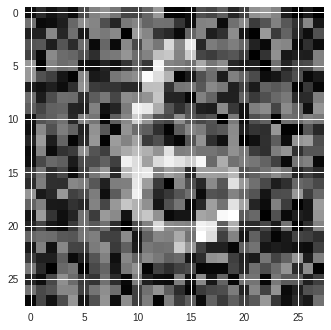

The classification label following attack is 8 from an original classification of 6
The L2 distance of the adversary is 9.128095958506535
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


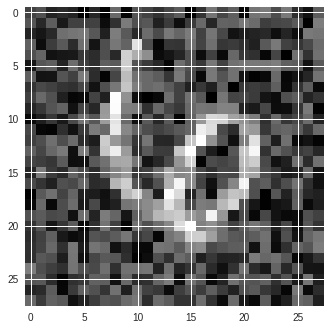

The classification label following attack is 8 from an original classification of 6
The L2 distance of the adversary is 7.714005276546451
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


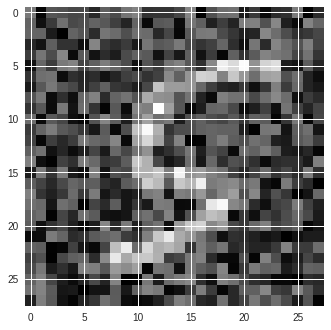

The classification label following attack is 3 from an original classification of 5
The L2 distance of the adversary is 8.299437252132428
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


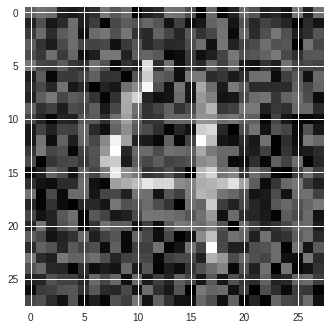

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 7.255606740136634
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


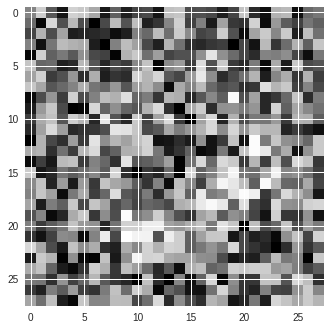

The classification label following attack is 8 from an original classification of 0
The L2 distance of the adversary is 13.356806241653494
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


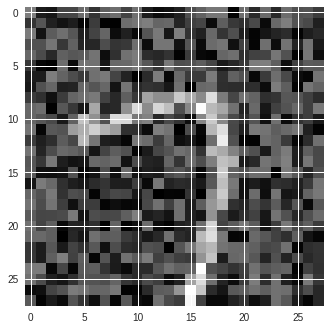

The classification label following attack is 3 from an original classification of 7
The L2 distance of the adversary is 7.794125498026247
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


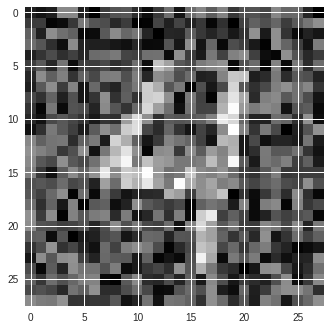

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 9.029371144914162
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


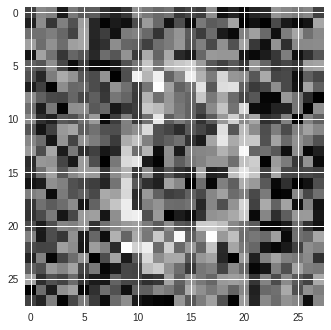

The classification label following attack is 8 from an original classification of 0
The L2 distance of the adversary is 10.672519129400861
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


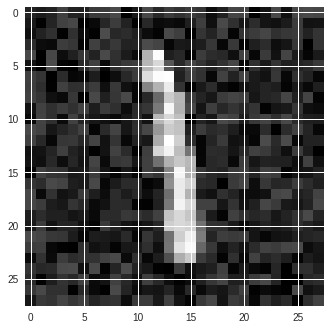

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 4.509879872390992
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


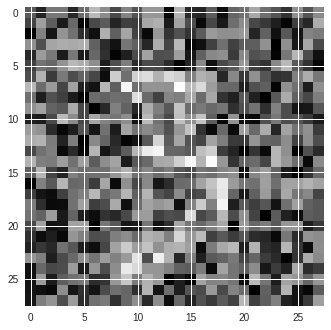

The classification label following attack is 8 from an original classification of 3
The L2 distance of the adversary is 11.166282276763038
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


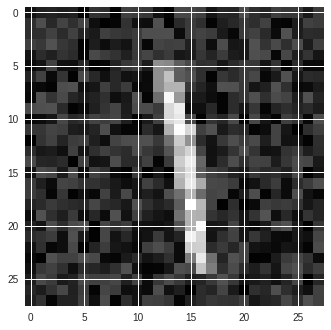

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 5.129461026024413
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


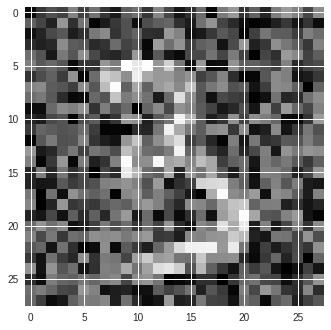

The classification label following attack is 8 from an original classification of 3
The L2 distance of the adversary is 9.5175835240034
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


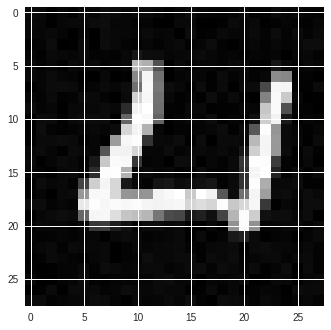

The classification label following attack is 6 from an original classification of 4
The L2 distance of the adversary is 0.806890914421017
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


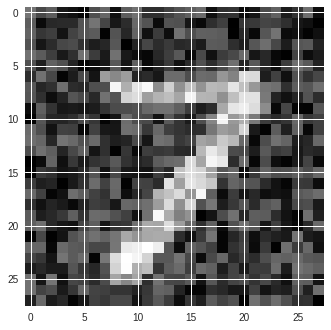

The classification label following attack is 3 from an original classification of 7
The L2 distance of the adversary is 7.0468207243091525
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


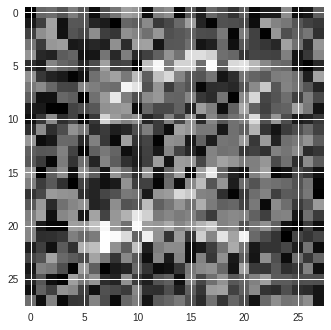

The classification label following attack is 8 from an original classification of 2
The L2 distance of the adversary is 9.828234980977989
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


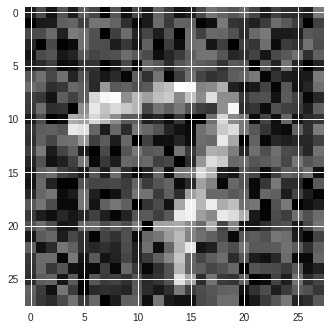

The classification label following attack is 2 from an original classification of 7
The L2 distance of the adversary is 7.608972298555171
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


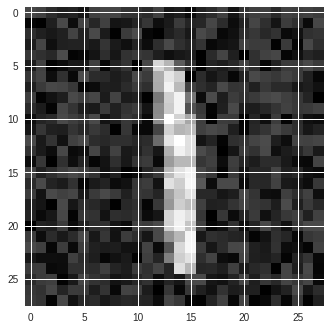

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 4.835825940170435
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


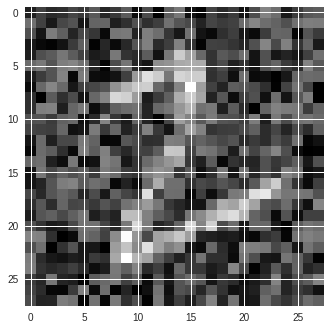

The classification label following attack is 3 from an original classification of 2
The L2 distance of the adversary is 8.05338619937668
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


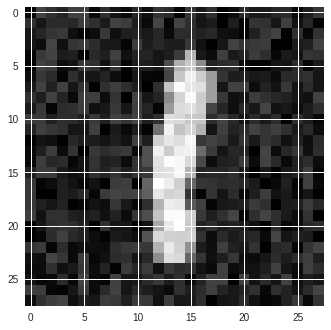

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 4.105601833464583
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


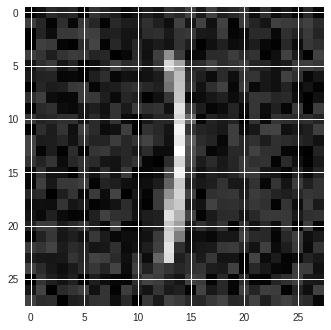

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 3.978092212492378
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


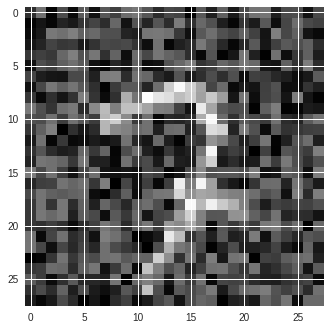

The classification label following attack is 3 from an original classification of 7
The L2 distance of the adversary is 7.639816530275466
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


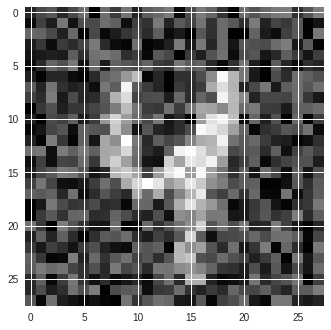

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 7.7061710057915525
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


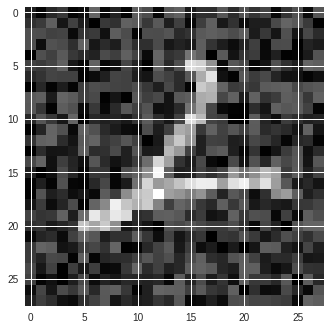

The classification label following attack is 8 from an original classification of 2
The L2 distance of the adversary is 6.2490378195192315
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


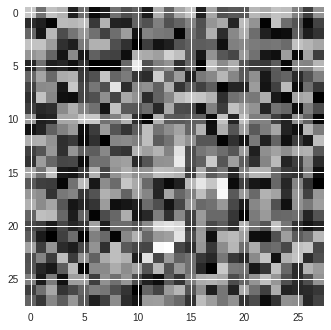

The classification label following attack is 8 from an original classification of 3
The L2 distance of the adversary is 12.338006873349043
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


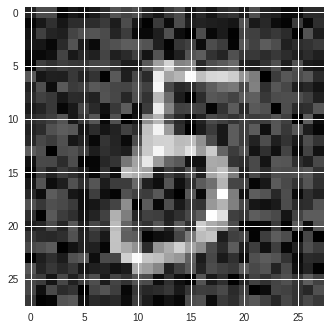

The classification label following attack is 8 from an original classification of 5
The L2 distance of the adversary is 5.894786153574935
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


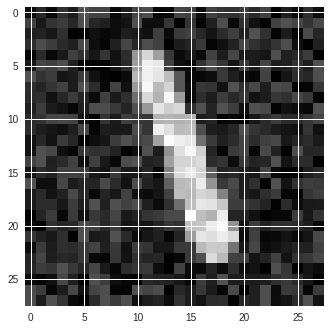

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 4.8439497277205055
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


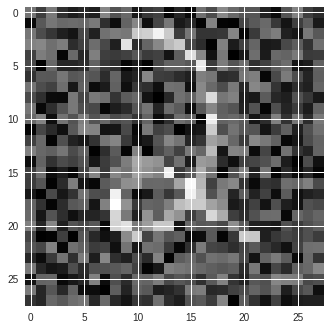

The classification label following attack is 8 from an original classification of 2
The L2 distance of the adversary is 8.270487352660307
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


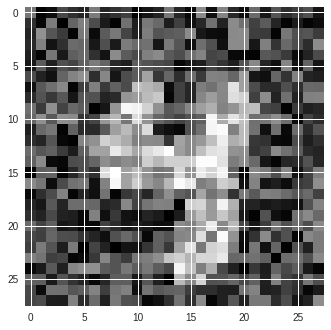

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 8.569343279273847
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


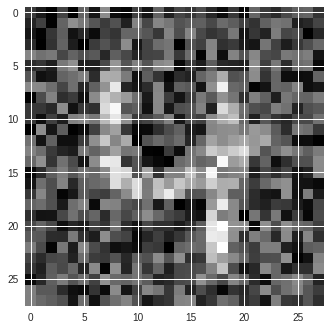

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 8.645288015727235
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


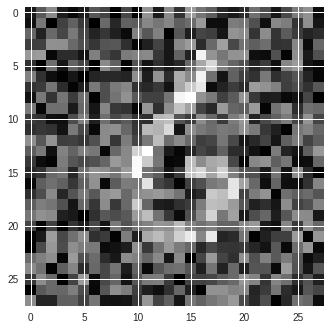

The classification label following attack is 0 from an original classification of 6
The L2 distance of the adversary is 9.181243085263887
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


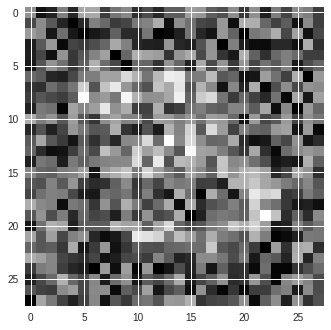

The classification label following attack is 8 from an original classification of 3
The L2 distance of the adversary is 10.72128620237901
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


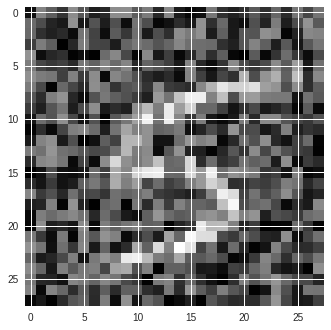

The classification label following attack is 8 from an original classification of 5
The L2 distance of the adversary is 8.99449051123743
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


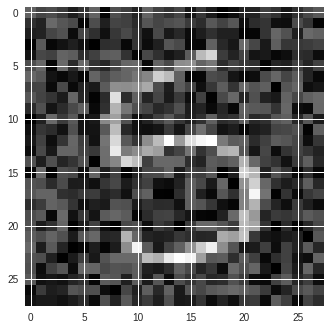

The classification label following attack is 3 from an original classification of 5
The L2 distance of the adversary is 6.42222444279904
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


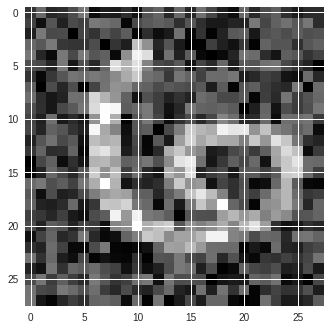

The classification label following attack is 8 from an original classification of 6
The L2 distance of the adversary is 7.431603983547089
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


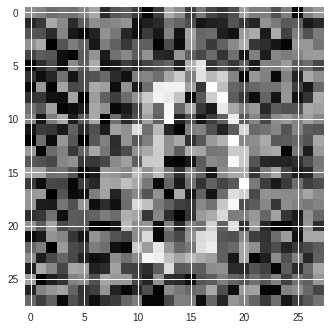

The classification label following attack is 8 from an original classification of 0
The L2 distance of the adversary is 10.611768650080668
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


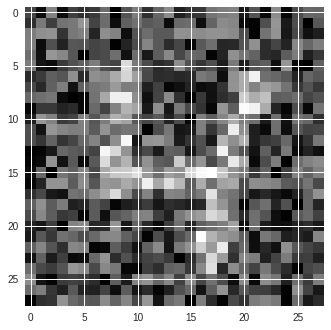

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 9.139311989073896
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


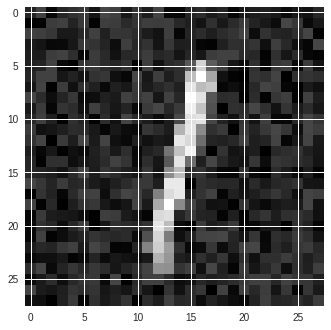

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 4.403095077664854
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


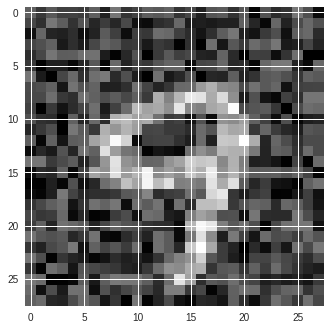

The classification label following attack is 8 from an original classification of 9
The L2 distance of the adversary is 7.579478782742181
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


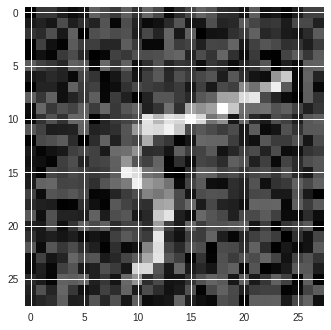

The classification label following attack is 8 from an original classification of 5
The L2 distance of the adversary is 6.475419196213183
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


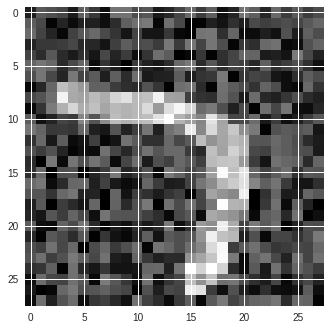

The classification label following attack is 3 from an original classification of 7
The L2 distance of the adversary is 7.674560802747347
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


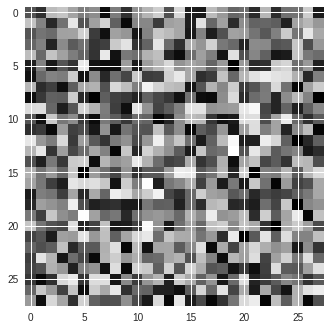

The classification label following attack is 3 from an original classification of 8
The L2 distance of the adversary is 14.378531277873211
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


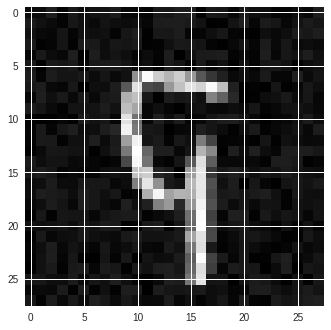

The classification label following attack is 8 from an original classification of 9
The L2 distance of the adversary is 1.997510198785368
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


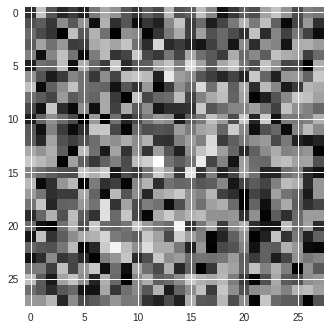

The classification label following attack is 8 from an original classification of 3
The L2 distance of the adversary is 12.631186740390977
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


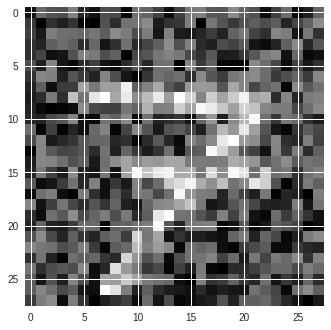

The classification label following attack is 3 from an original classification of 7
The L2 distance of the adversary is 8.641109892967737
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


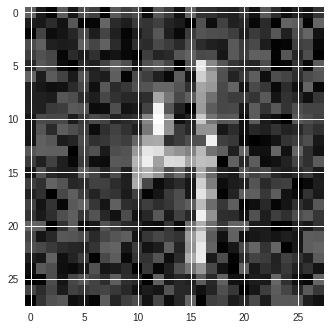

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 6.1327656198226626
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


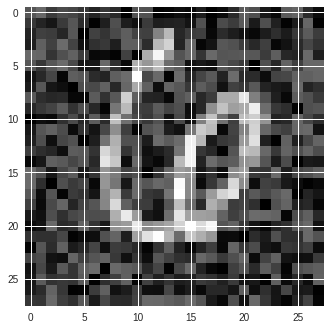

The classification label following attack is 8 from an original classification of 6
The L2 distance of the adversary is 6.5148895075805076
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


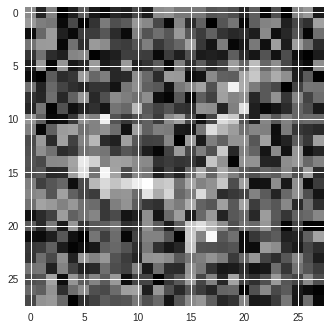

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 9.764458596337155
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


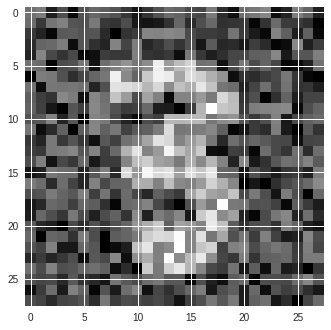

The classification label following attack is 8 from an original classification of 3
The L2 distance of the adversary is 8.749038047489586
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


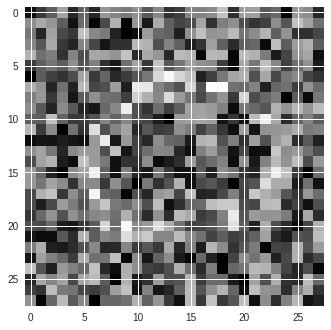

The classification label following attack is 8 from an original classification of 0
The L2 distance of the adversary is 11.745127587637144
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


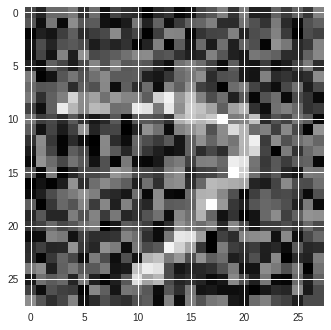

The classification label following attack is 3 from an original classification of 7
The L2 distance of the adversary is 8.90604653641379
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


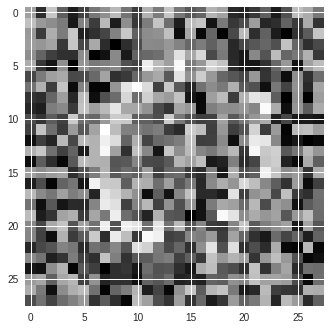

The classification label following attack is 8 from an original classification of 0
The L2 distance of the adversary is 12.092420461050148
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


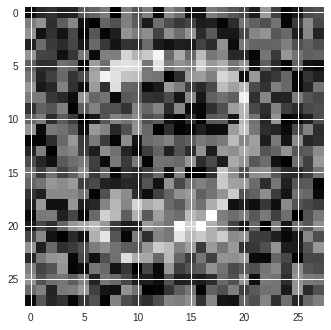

The classification label following attack is 3 from an original classification of 2
The L2 distance of the adversary is 9.352822134535089
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


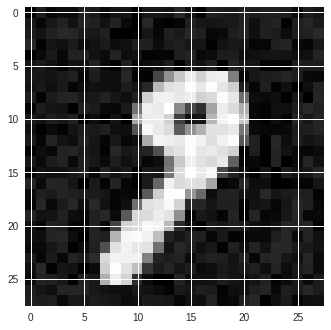

The classification label following attack is 8 from an original classification of 9
The L2 distance of the adversary is 2.5277801947568843
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


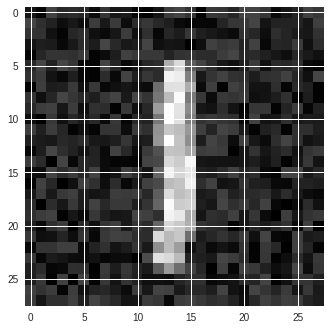

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 4.453146569323661
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


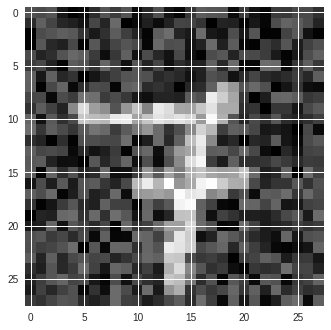

The classification label following attack is 8 from an original classification of 7
The L2 distance of the adversary is 6.783214722240853
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


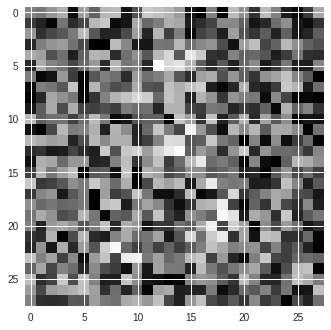

The classification label following attack is 8 from an original classification of 3
The L2 distance of the adversary is 11.924194443378752
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


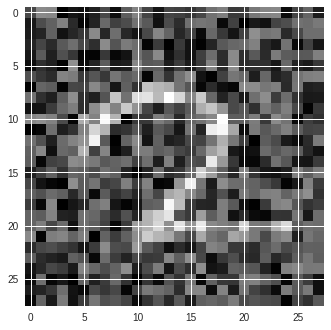

The classification label following attack is 8 from an original classification of 2
The L2 distance of the adversary is 8.351061002000536
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


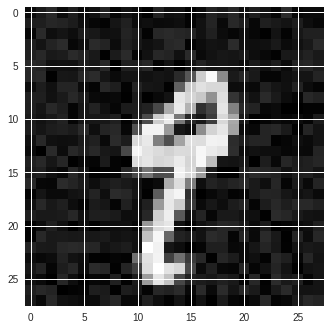

The classification label following attack is 8 from an original classification of 9
The L2 distance of the adversary is 2.702080803842249
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


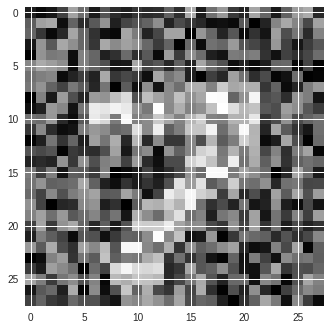

The classification label following attack is 3 from an original classification of 7
The L2 distance of the adversary is 10.243290804693729
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


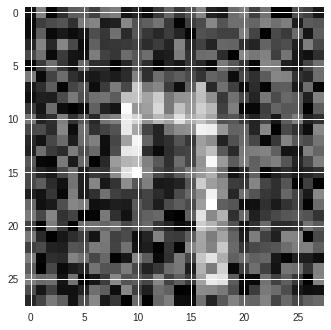

The classification label following attack is 8 from an original classification of 7
The L2 distance of the adversary is 8.363832636644354
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


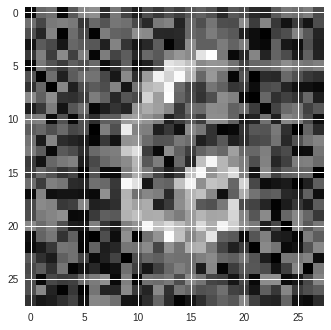

The classification label following attack is 8 from an original classification of 6
The L2 distance of the adversary is 8.930510347721269
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


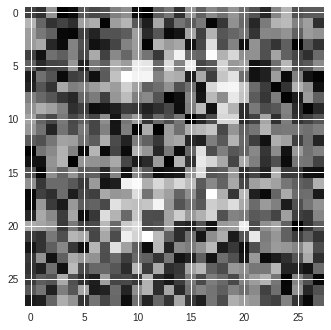

The classification label following attack is 8 from an original classification of 2
The L2 distance of the adversary is 11.234088623529871
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


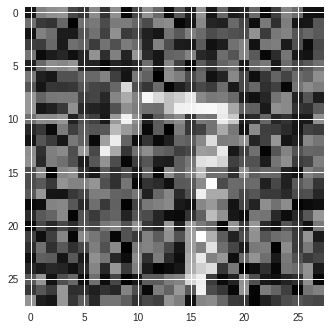

The classification label following attack is 3 from an original classification of 7
The L2 distance of the adversary is 9.245333400156794
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


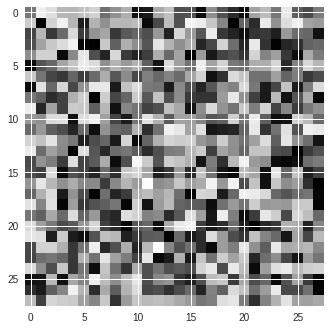

The classification label following attack is 3 from an original classification of 8
The L2 distance of the adversary is 15.082973567065366
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


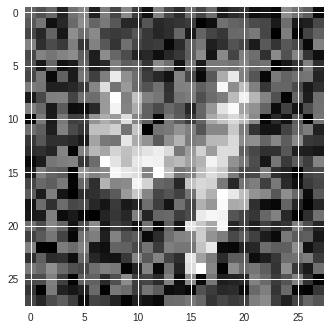

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 8.759178167326423
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


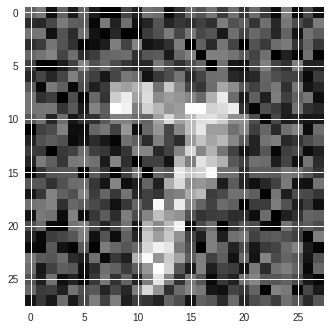

The classification label following attack is 3 from an original classification of 7
The L2 distance of the adversary is 8.39204542195526
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


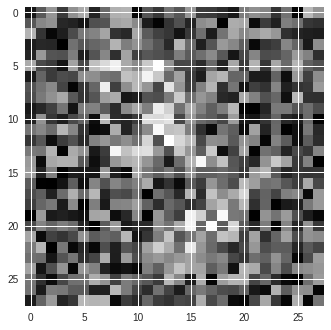

The classification label following attack is 8 from an original classification of 3
The L2 distance of the adversary is 10.790334741201526
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


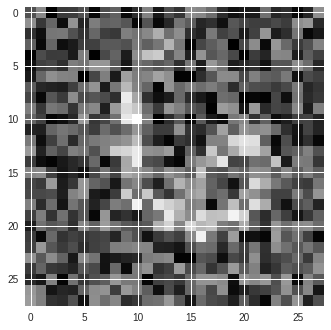

The classification label following attack is 8 from an original classification of 6
The L2 distance of the adversary is 9.494579057411482
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


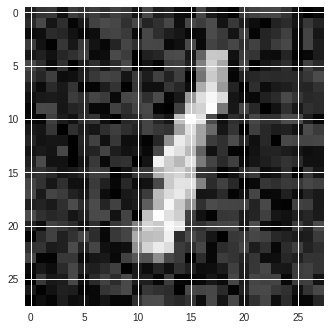

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 4.742417425272322
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


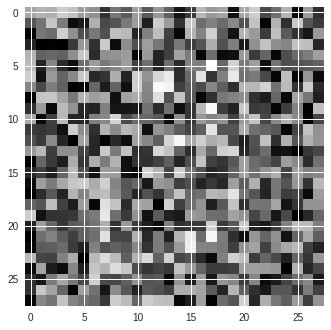

The classification label following attack is 8 from an original classification of 3
The L2 distance of the adversary is 12.662414832404398
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


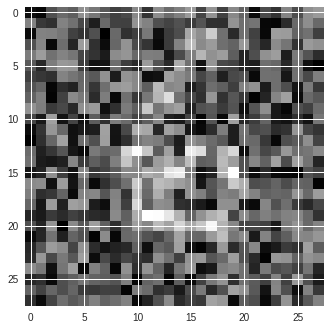

The classification label following attack is 8 from an original classification of 6
The L2 distance of the adversary is 10.110380885573319
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


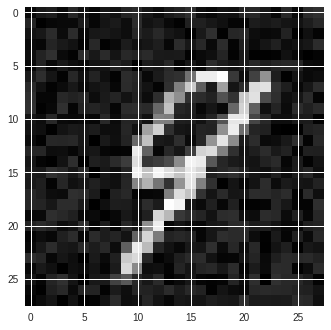

The classification label following attack is 8 from an original classification of 9
The L2 distance of the adversary is 2.86645973761027
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


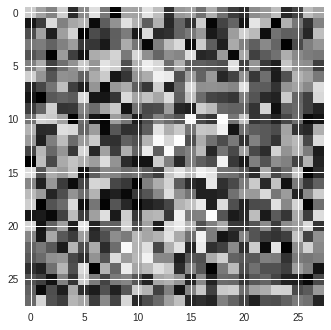

The classification label following attack is 8 from an original classification of 3
The L2 distance of the adversary is 13.429593329111817
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


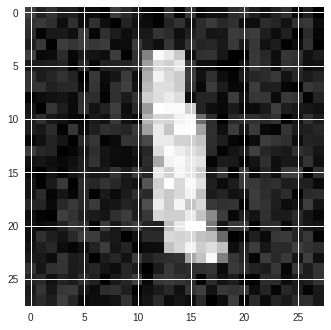

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 3.8509012512658853
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


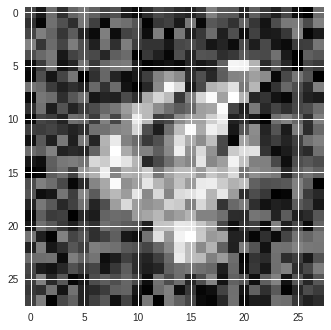

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 8.04338458273774
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


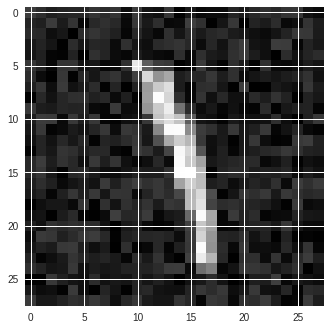

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 3.741973559215598
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


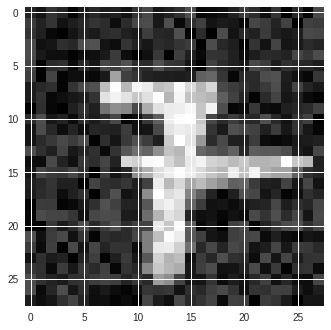

The classification label following attack is 8 from an original classification of 7
The L2 distance of the adversary is 4.8399640500154835
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


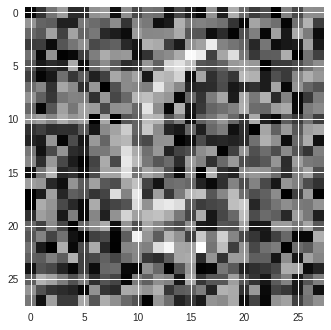

The classification label following attack is 8 from an original classification of 6
The L2 distance of the adversary is 11.000150454792534
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


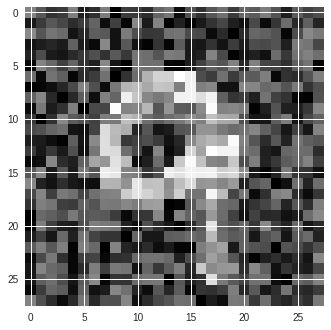

The classification label following attack is 8 from an original classification of 9
The L2 distance of the adversary is 8.37140485964614
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


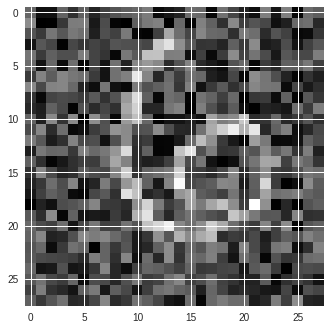

The classification label following attack is 8 from an original classification of 6
The L2 distance of the adversary is 8.128565038098849
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


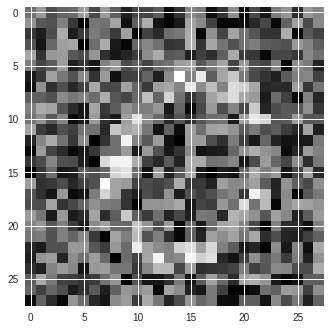

The classification label following attack is 8 from an original classification of 0
The L2 distance of the adversary is 10.246194161581895
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


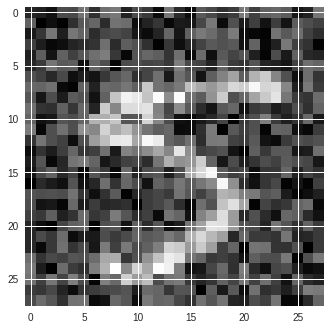

The classification label following attack is 8 from an original classification of 5
The L2 distance of the adversary is 7.5709398070234
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


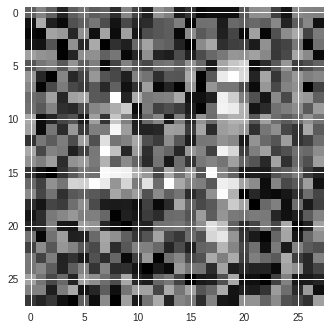

The classification label following attack is 3 from an original classification of 4
The L2 distance of the adversary is 10.468328668899517
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


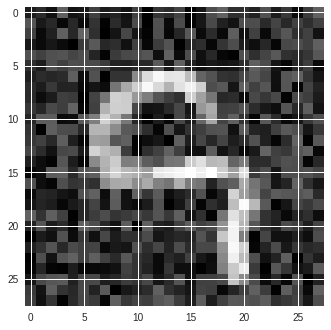

The classification label following attack is 8 from an original classification of 9
The L2 distance of the adversary is 5.977938642300471
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


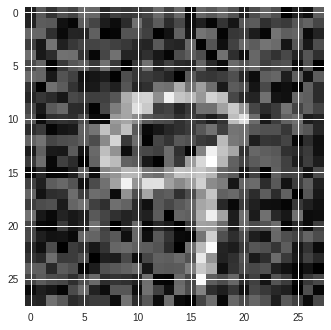

The classification label following attack is 8 from an original classification of 9
The L2 distance of the adversary is 7.204469654179803
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


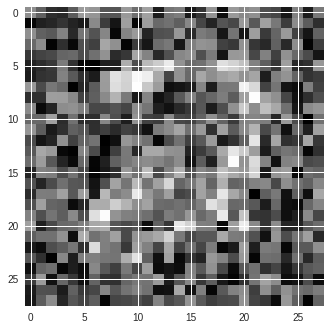

The classification label following attack is 8 from an original classification of 2
The L2 distance of the adversary is 9.94803303375567
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


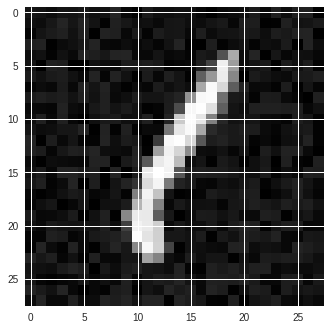

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 2.333970993324564
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


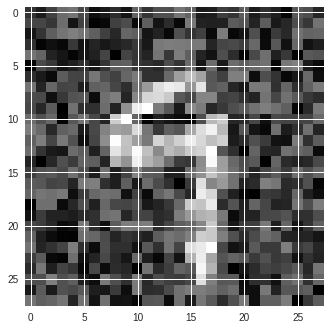

The classification label following attack is 8 from an original classification of 9
The L2 distance of the adversary is 7.766237021733881
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


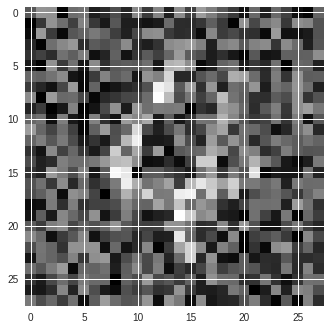

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 9.551210139370124
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


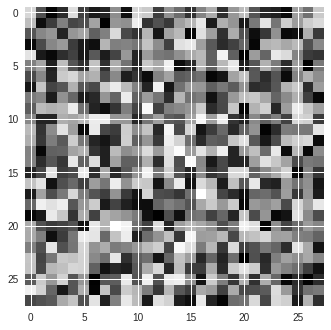

The classification label following attack is 3 from an original classification of 8
The L2 distance of the adversary is 14.316662574233295
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


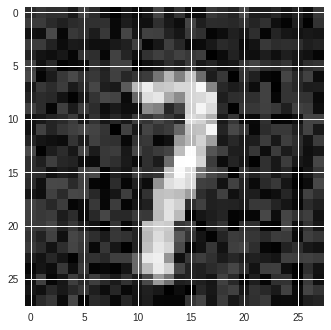

The classification label following attack is 8 from an original classification of 7
The L2 distance of the adversary is 4.517940854520961
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


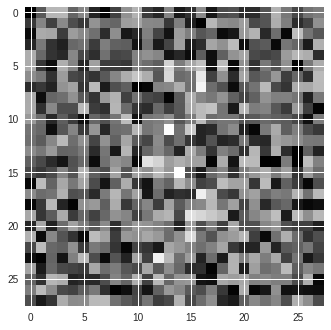

The classification label following attack is 8 from an original classification of 3
The L2 distance of the adversary is 12.05757008289817
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


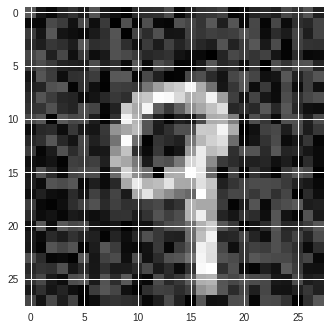

The classification label following attack is 8 from an original classification of 9
The L2 distance of the adversary is 5.537339251959311
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


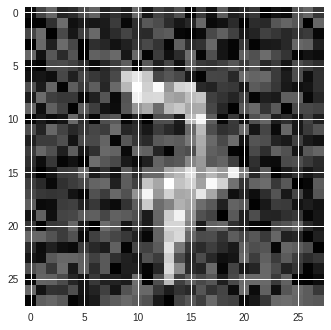

The classification label following attack is 8 from an original classification of 7
The L2 distance of the adversary is 6.7531633827015485
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


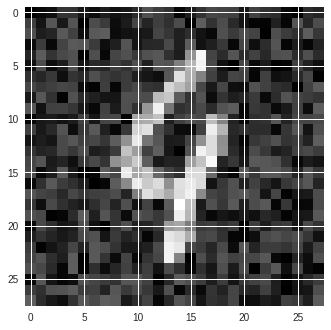

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 5.801300207314387
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


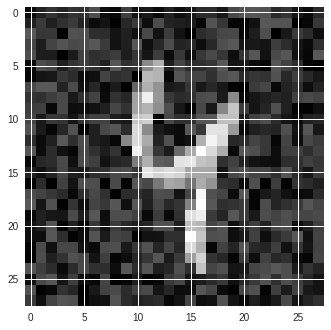

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 5.325555833803457
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


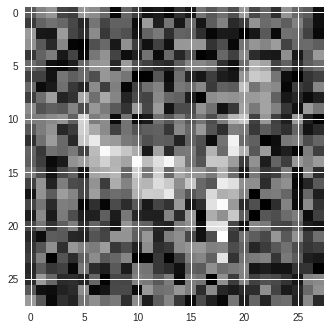

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 9.713711400948064
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


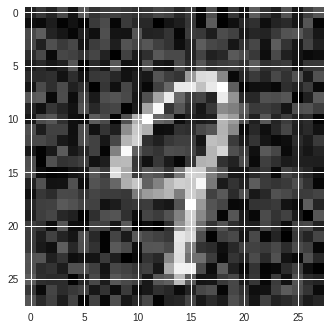

The classification label following attack is 8 from an original classification of 9
The L2 distance of the adversary is 5.555562649003925
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


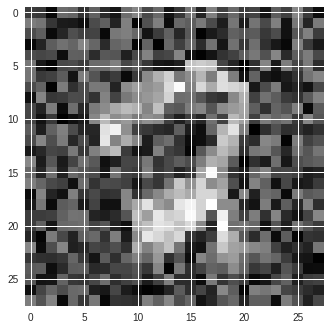

The classification label following attack is 8 from an original classification of 2
The L2 distance of the adversary is 8.401402335942953
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


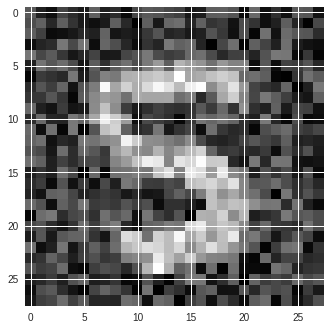

The classification label following attack is 3 from an original classification of 5
The L2 distance of the adversary is 7.434141604723827
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


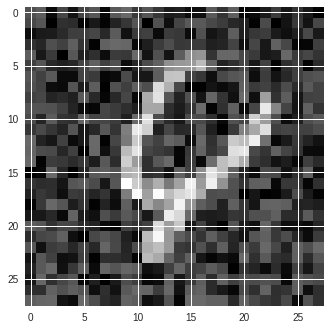

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 6.516346003670109
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


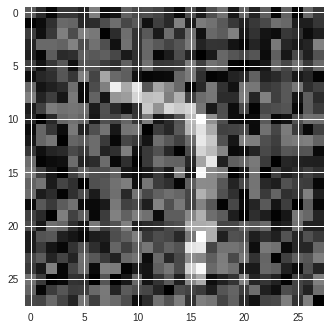

The classification label following attack is 3 from an original classification of 7
The L2 distance of the adversary is 7.981900597351713
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


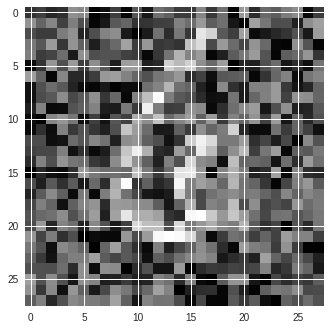

The classification label following attack is 8 from an original classification of 6
The L2 distance of the adversary is 9.651037150742546
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


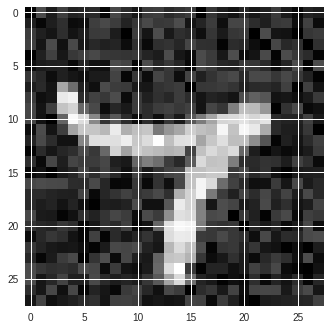

The classification label following attack is 8 from an original classification of 7
The L2 distance of the adversary is 4.871415215731822
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


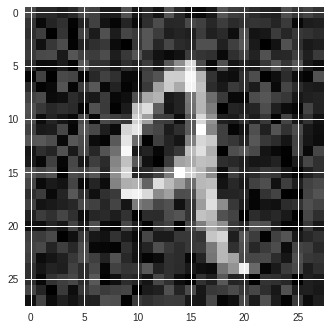

The classification label following attack is 4 from an original classification of 9
The L2 distance of the adversary is 5.309212214539981
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


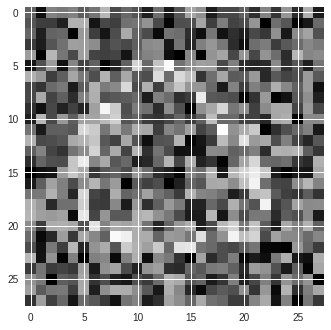

The classification label following attack is 8 from an original classification of 0
The L2 distance of the adversary is 10.972399288565061
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


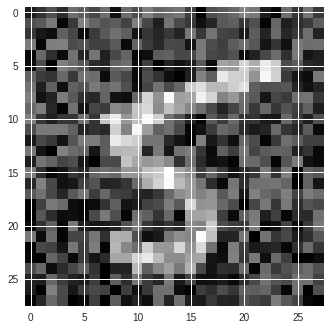

The classification label following attack is 8 from an original classification of 5
The L2 distance of the adversary is 7.853194918797988
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


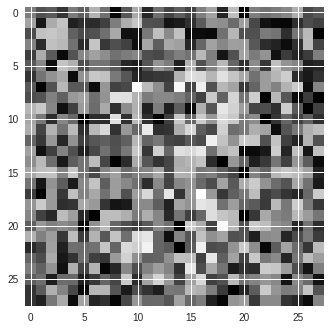

The classification label following attack is 3 from an original classification of 8
The L2 distance of the adversary is 12.681029134766614
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


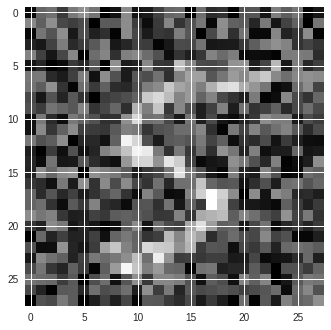

The classification label following attack is 3 from an original classification of 5
The L2 distance of the adversary is 8.677242149408547
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


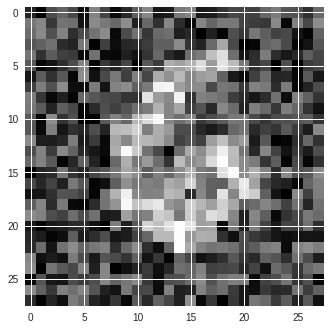

The classification label following attack is 8 from an original classification of 6
The L2 distance of the adversary is 8.551247525626149
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


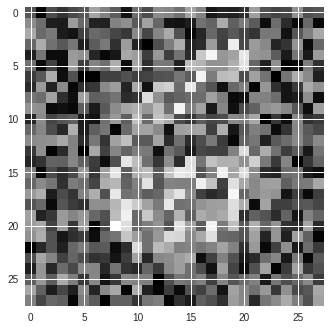

The classification label following attack is 8 from an original classification of 6
The L2 distance of the adversary is 10.774097297238596
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


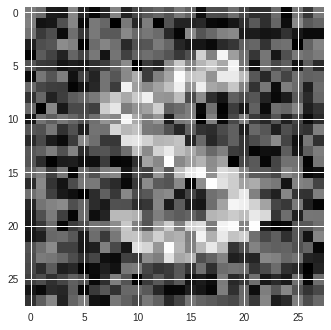

The classification label following attack is 8 from an original classification of 5
The L2 distance of the adversary is 8.508785028733755
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


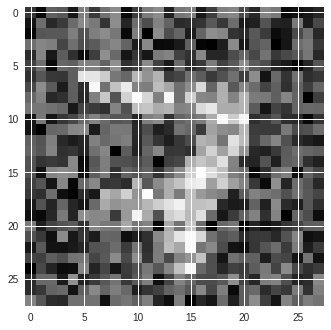

The classification label following attack is 8 from an original classification of 7
The L2 distance of the adversary is 9.031732357265925
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


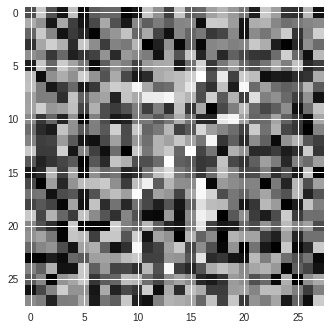

The classification label following attack is 3 from an original classification of 8
The L2 distance of the adversary is 12.731570815369464
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


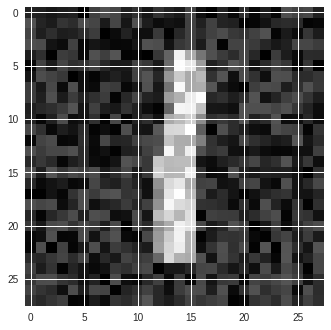

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 5.353958615564537
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


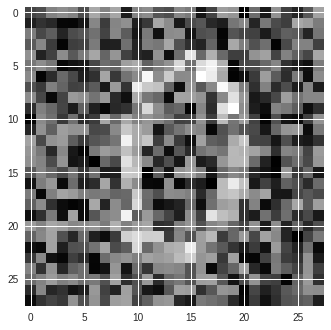

The classification label following attack is 8 from an original classification of 0
The L2 distance of the adversary is 10.389715356471589
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


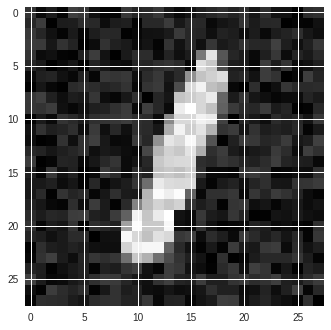

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 3.867429349293674
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


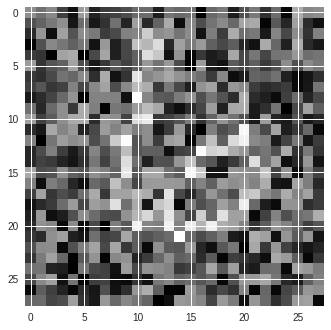

The classification label following attack is 8 from an original classification of 6
The L2 distance of the adversary is 10.58398186222681
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


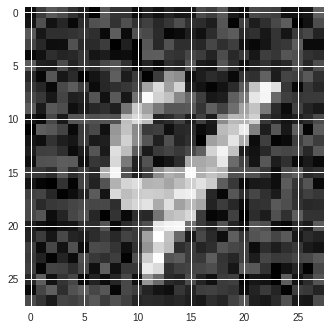

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 5.785296234621395
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


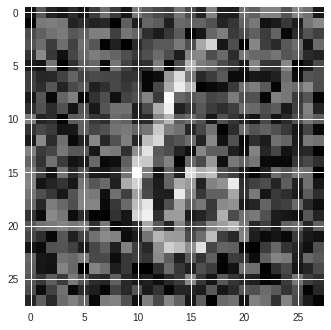

The classification label following attack is 8 from an original classification of 6
The L2 distance of the adversary is 8.25244734782643
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


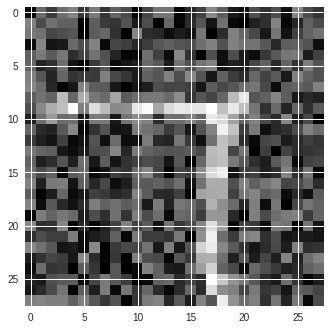

The classification label following attack is 3 from an original classification of 7
The L2 distance of the adversary is 8.287307807691354
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


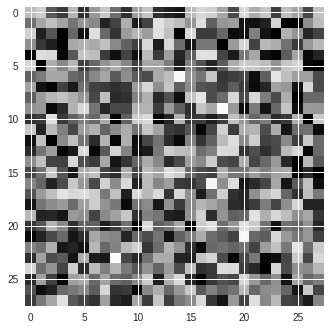

The classification label following attack is 8 from an original classification of 3
The L2 distance of the adversary is 13.716467261455797
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


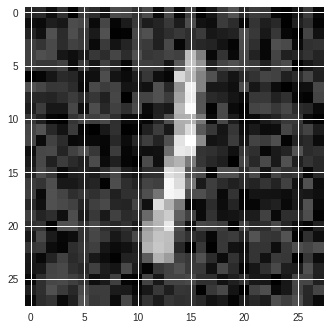

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 5.178594082285672
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


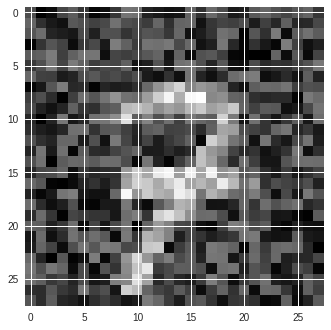

The classification label following attack is 8 from an original classification of 7
The L2 distance of the adversary is 7.732719981679153
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


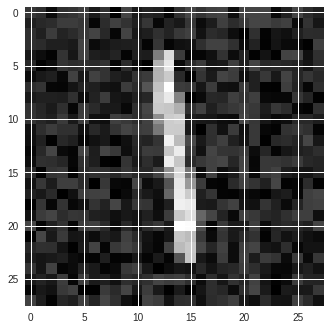

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 4.394466043440761
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


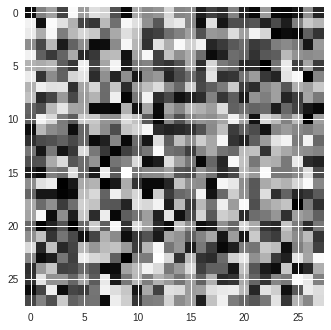

The classification label following attack is 3 from an original classification of 8
The L2 distance of the adversary is 15.232206279154736
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


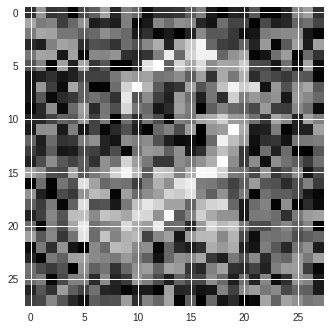

The classification label following attack is 8 from an original classification of 2
The L2 distance of the adversary is 10.020761352135278
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


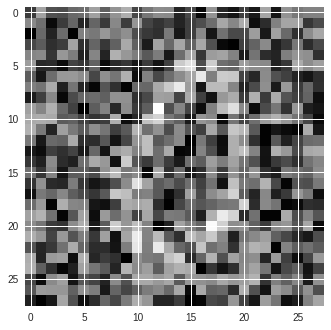

The classification label following attack is 8 from an original classification of 0
The L2 distance of the adversary is 11.076351168037839
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


The model predicted a 3 when the ground-truth label is 2


/usr/local/lib/python3.6/dist-packages/foolbox/attacks/base.py:129: UserWarning: Not running the attack because the original input is already misclassified and the adversarial thus has a distance of 0.
  warnings.warn('Not running the attack because the original input'


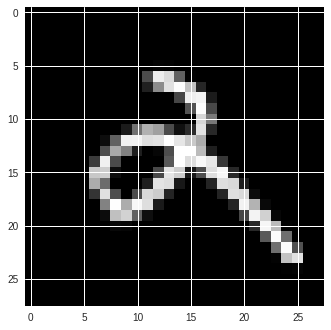

The classification label following attack is 3 from an original classification of 2
The L2 distance of the adversary is 0.0
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


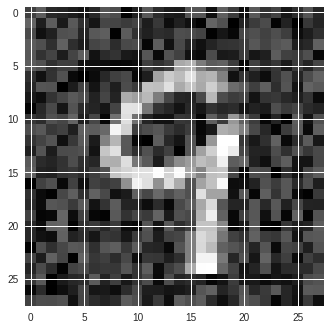

The classification label following attack is 8 from an original classification of 9
The L2 distance of the adversary is 6.090303595950781
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


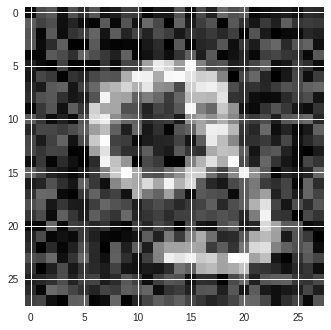

The classification label following attack is 8 from an original classification of 9
The L2 distance of the adversary is 6.157147263976327
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


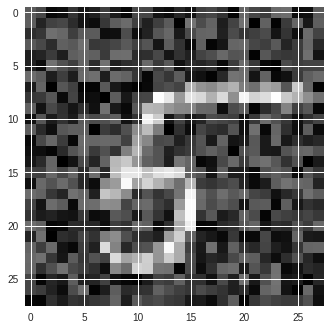

The classification label following attack is 8 from an original classification of 5
The L2 distance of the adversary is 6.995813351909681
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


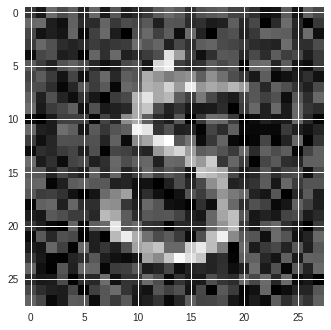

The classification label following attack is 8 from an original classification of 5
The L2 distance of the adversary is 6.8153346764217595
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


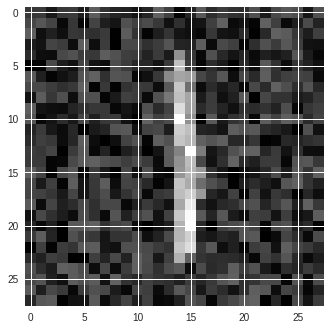

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 5.89746133167077
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


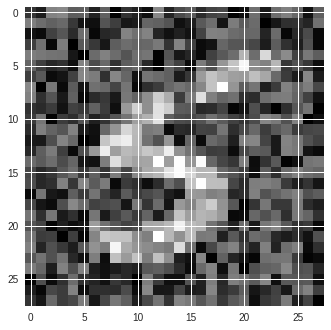

The classification label following attack is 8 from an original classification of 5
The L2 distance of the adversary is 8.3762584523914
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


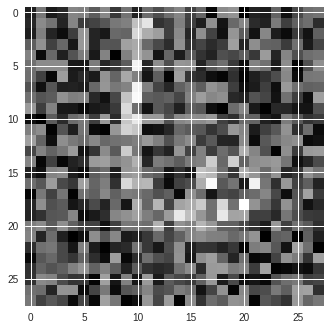

The classification label following attack is 8 from an original classification of 6
The L2 distance of the adversary is 9.85278170010962
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


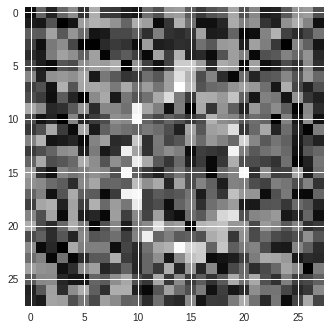

The classification label following attack is 8 from an original classification of 0
The L2 distance of the adversary is 10.86400396329354
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


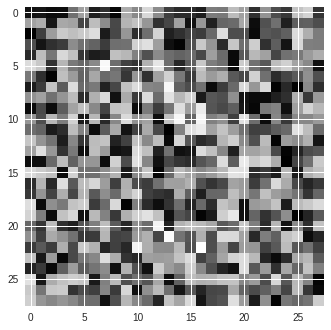

The classification label following attack is 8 from an original classification of 3
The L2 distance of the adversary is 13.844512572818365
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


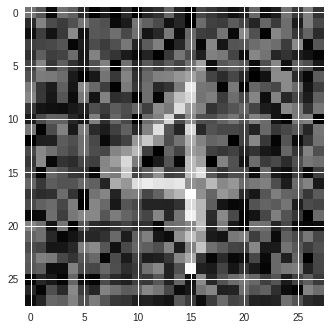

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 8.264356547088981
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


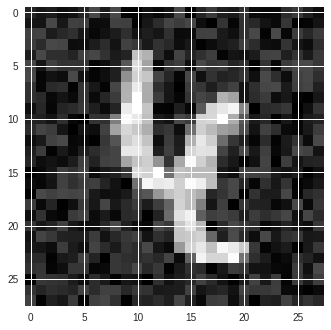

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 4.498430457674585
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


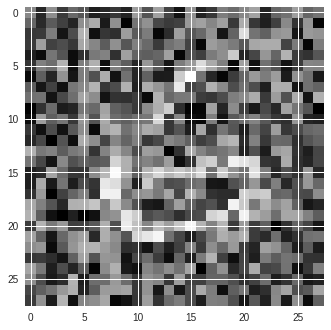

The classification label following attack is 8 from an original classification of 6
The L2 distance of the adversary is 10.702170037576222
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


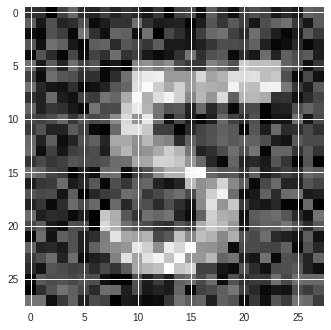

The classification label following attack is 8 from an original classification of 5
The L2 distance of the adversary is 7.213279646177185
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


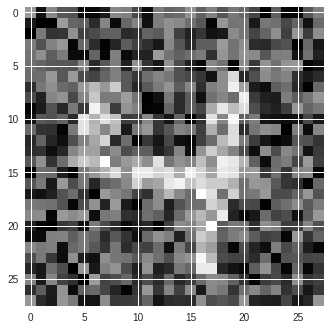

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 9.508546940646962
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


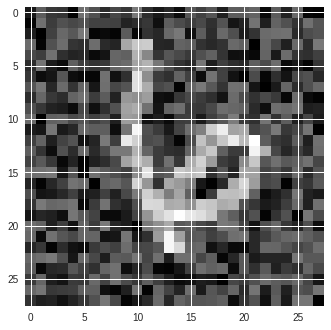

The classification label following attack is 8 from an original classification of 6
The L2 distance of the adversary is 7.498123164266726
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


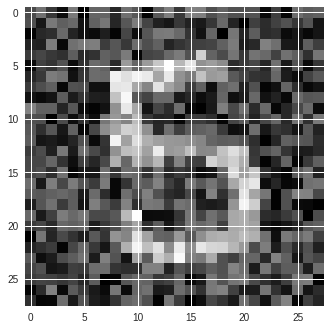

The classification label following attack is 8 from an original classification of 5
The L2 distance of the adversary is 7.993746283656069
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


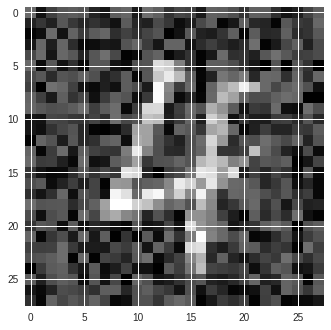

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 6.99855416443552
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


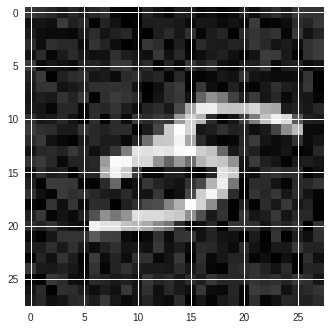

The classification label following attack is 3 from an original classification of 5
The L2 distance of the adversary is 3.5763723783073234
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


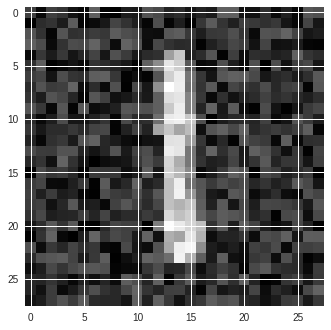

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 5.82836739312713
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


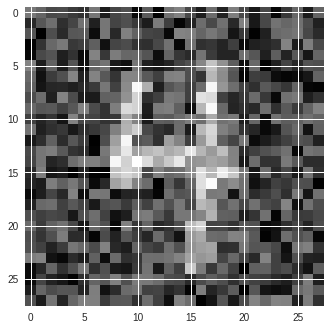

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 8.182336749033544
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


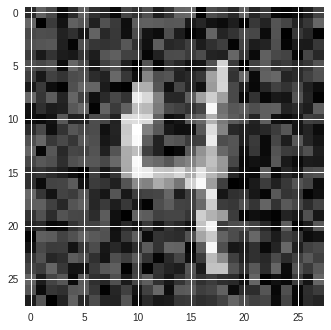

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 6.276988159691485
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


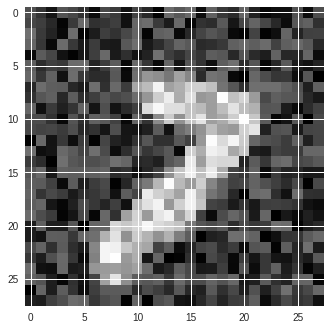

The classification label following attack is 3 from an original classification of 7
The L2 distance of the adversary is 7.11067723704804
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


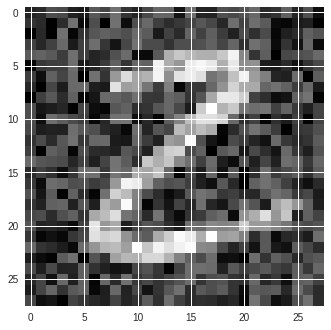

The classification label following attack is 8 from an original classification of 2
The L2 distance of the adversary is 7.2160975123890445
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


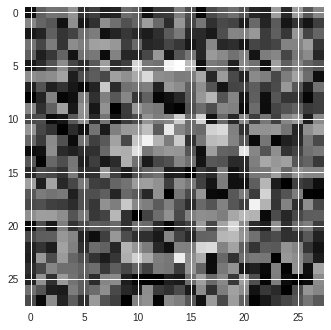

The classification label following attack is 8 from an original classification of 3
The L2 distance of the adversary is 9.75079955117788
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


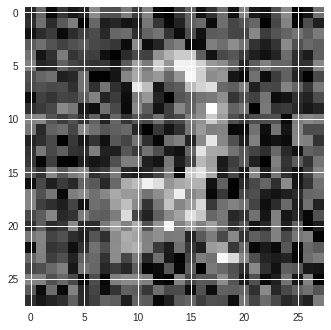

The classification label following attack is 8 from an original classification of 2
The L2 distance of the adversary is 8.384925911048251
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


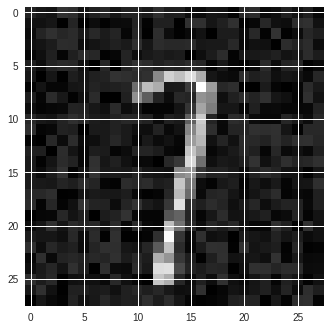

The classification label following attack is 3 from an original classification of 7
The L2 distance of the adversary is 3.0378207511433355
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


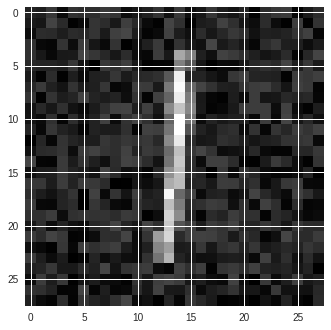

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 4.2100971167543655
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


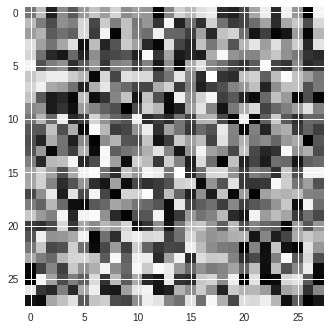

The classification label following attack is 3 from an original classification of 8
The L2 distance of the adversary is 15.129685932947153
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


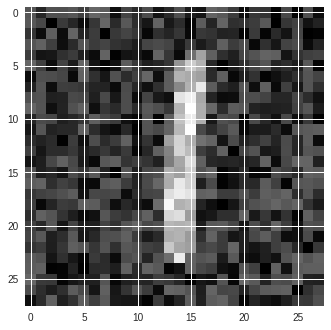

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 6.539722924593079
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


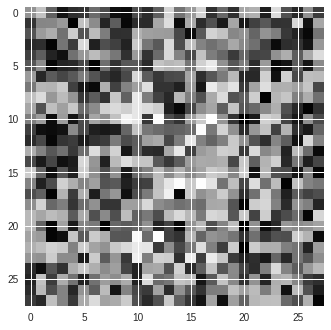

The classification label following attack is 3 from an original classification of 8
The L2 distance of the adversary is 12.906256261347497
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


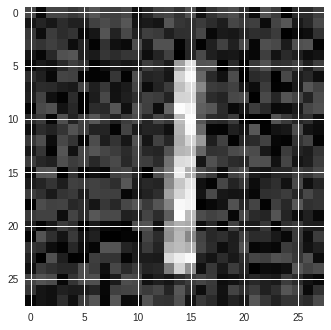

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 5.231235495450209
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


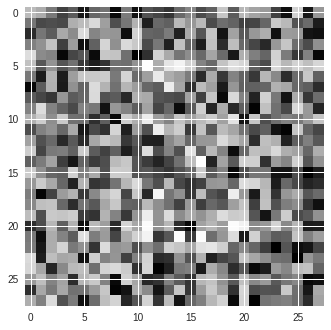

The classification label following attack is 3 from an original classification of 8
The L2 distance of the adversary is 13.894803350213593
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


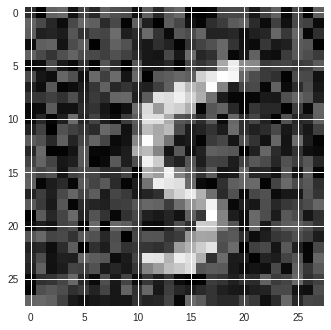

The classification label following attack is 8 from an original classification of 5
The L2 distance of the adversary is 6.392516134635303
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


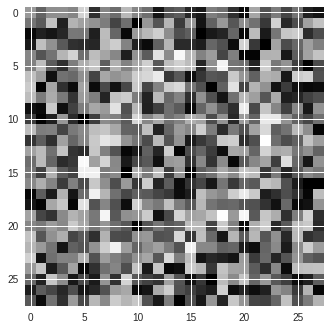

The classification label following attack is 8 from an original classification of 0
The L2 distance of the adversary is 12.385206722715036
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


The model predicted a 3 when the ground-truth label is 8


/usr/local/lib/python3.6/dist-packages/foolbox/attacks/base.py:129: UserWarning: Not running the attack because the original input is already misclassified and the adversarial thus has a distance of 0.
  warnings.warn('Not running the attack because the original input'


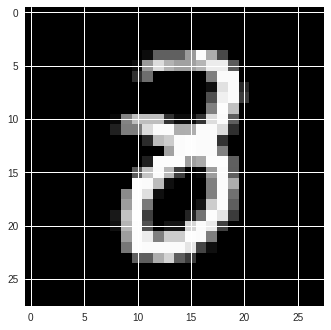

The classification label following attack is 3 from an original classification of 8
The L2 distance of the adversary is 0.0
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


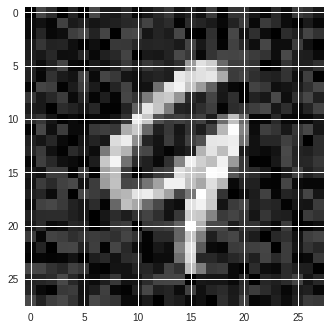

The classification label following attack is 4 from an original classification of 9
The L2 distance of the adversary is 4.360566359470564
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


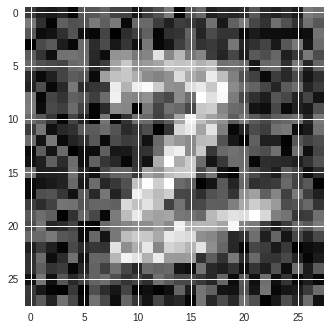

The classification label following attack is 8 from an original classification of 2
The L2 distance of the adversary is 7.596770764483263
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


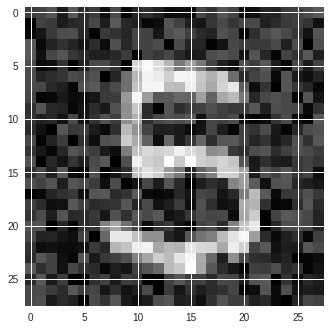

The classification label following attack is 8 from an original classification of 5
The L2 distance of the adversary is 5.706176702868618
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


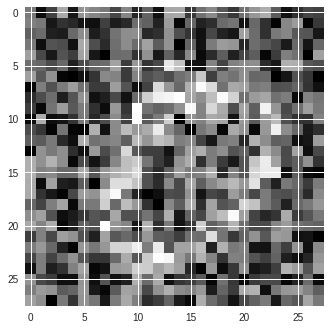

The classification label following attack is 8 from an original classification of 0
The L2 distance of the adversary is 10.792866657586309
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


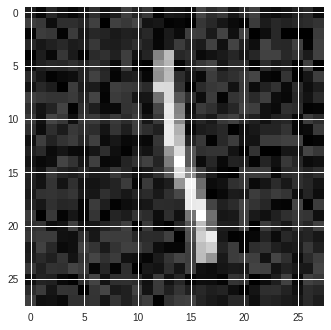

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 4.326896080315435
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


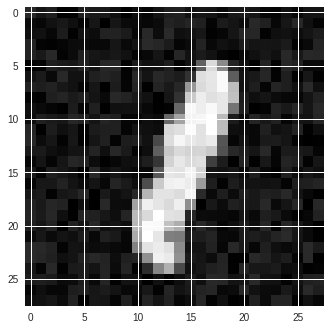

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 2.560201311557485
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


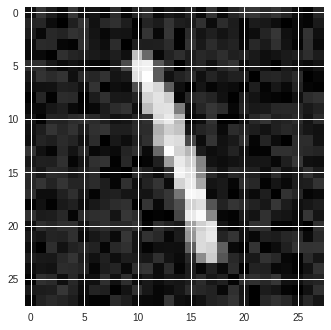

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 3.348534766750823
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


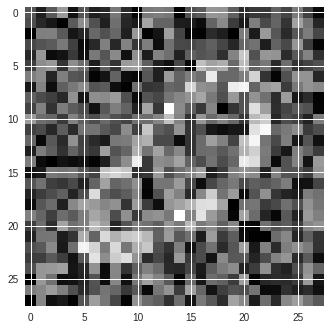

The classification label following attack is 8 from an original classification of 0
The L2 distance of the adversary is 9.857424938837156
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


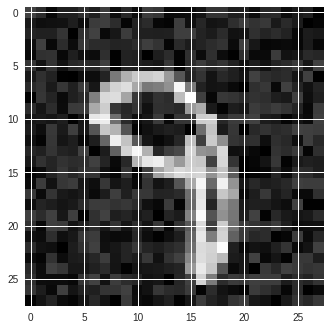

The classification label following attack is 8 from an original classification of 9
The L2 distance of the adversary is 3.963118163278303
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


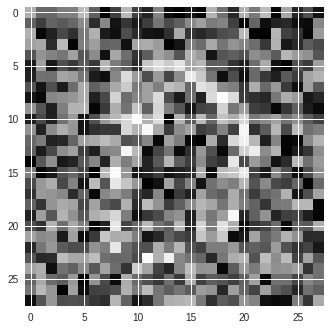

The classification label following attack is 8 from an original classification of 0
The L2 distance of the adversary is 11.504281378700398
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


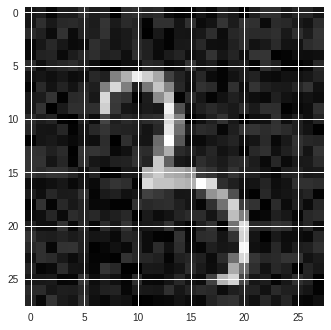

The classification label following attack is 8 from an original classification of 3
The L2 distance of the adversary is 3.3981459849332785
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


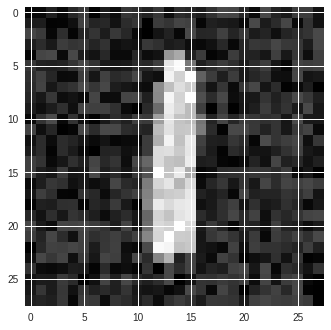

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 4.704546012925523
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


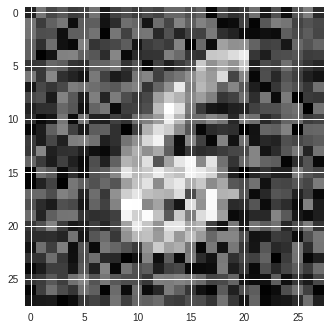

The classification label following attack is 8 from an original classification of 6
The L2 distance of the adversary is 8.285294771252756
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


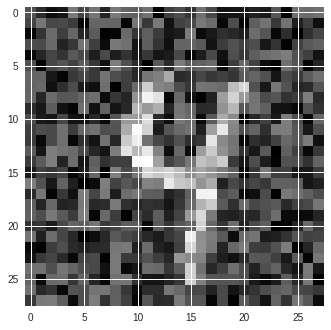

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 7.6707496356077565
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


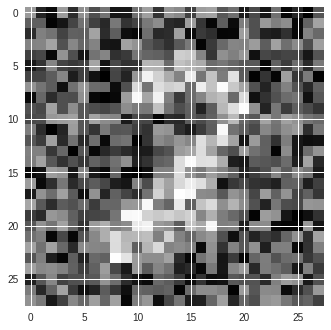

The classification label following attack is 8 from an original classification of 2
The L2 distance of the adversary is 10.119171435891996
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


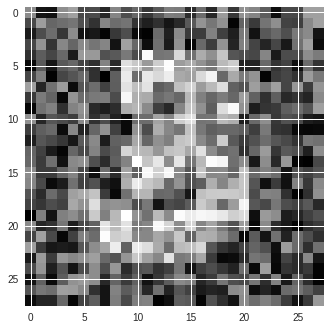

The classification label following attack is 8 from an original classification of 3
The L2 distance of the adversary is 9.732120534826207
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


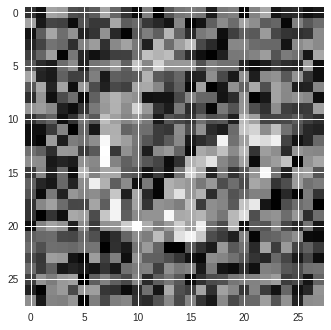

The classification label following attack is 8 from an original classification of 6
The L2 distance of the adversary is 10.307054416022165
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


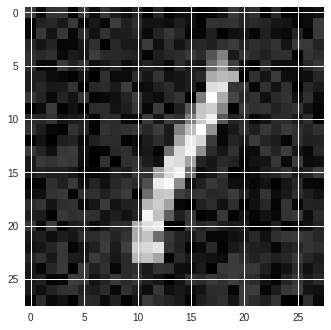

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 3.903587768250401
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


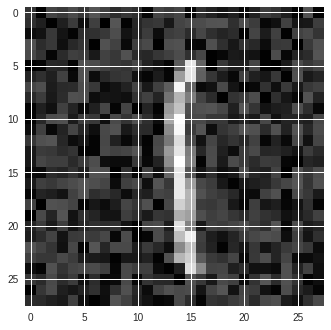

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 5.431862831018889
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


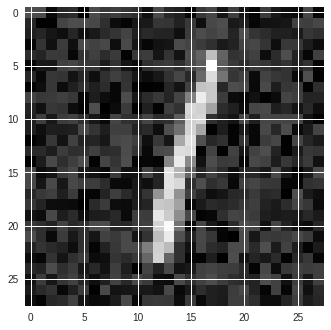

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 4.748648577024024
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


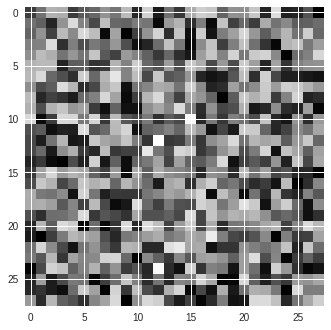

The classification label following attack is 8 from an original classification of 3
The L2 distance of the adversary is 13.25354148371245
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


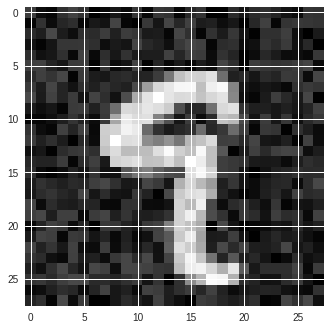

The classification label following attack is 8 from an original classification of 9
The L2 distance of the adversary is 4.431465484026435
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


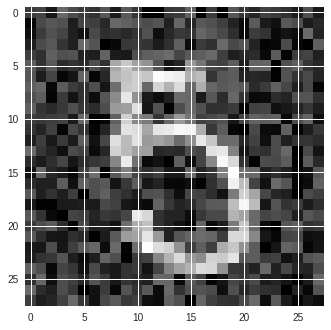

The classification label following attack is 8 from an original classification of 5
The L2 distance of the adversary is 6.328652307253696
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


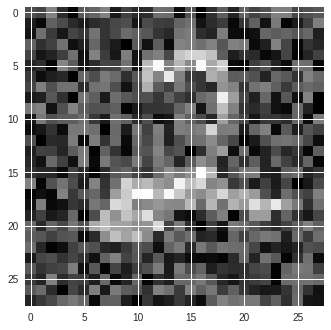

The classification label following attack is 8 from an original classification of 2
The L2 distance of the adversary is 8.222537309059327
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


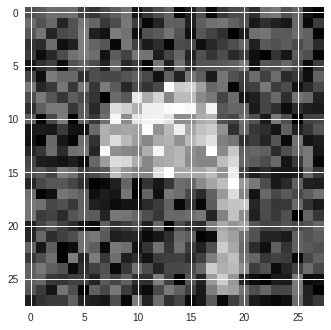

The classification label following attack is 8 from an original classification of 9
The L2 distance of the adversary is 7.984732397954102
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


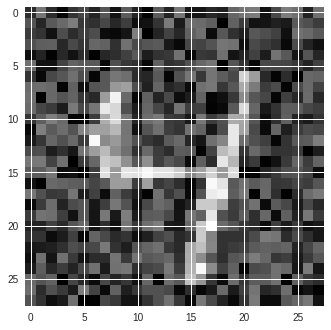

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 7.64309217919116
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


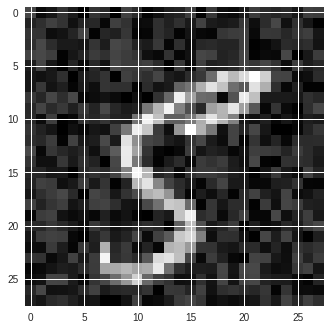

The classification label following attack is 3 from an original classification of 5
The L2 distance of the adversary is 4.332898129942065
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


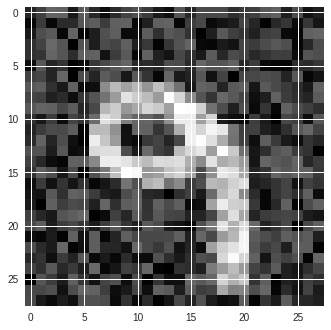

The classification label following attack is 8 from an original classification of 9
The L2 distance of the adversary is 6.533745616058164
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


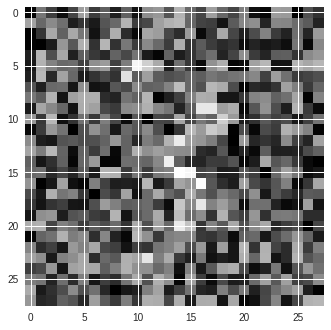

The classification label following attack is 8 from an original classification of 3
The L2 distance of the adversary is 10.579528991156318
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


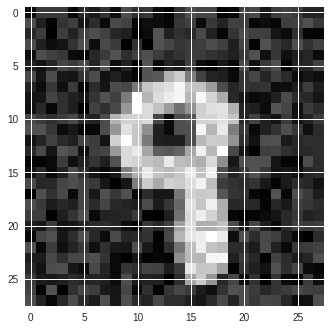

The classification label following attack is 8 from an original classification of 9
The L2 distance of the adversary is 5.12883285967247
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


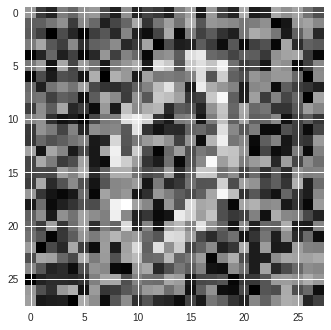

The classification label following attack is 8 from an original classification of 0
The L2 distance of the adversary is 10.945887129770394
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


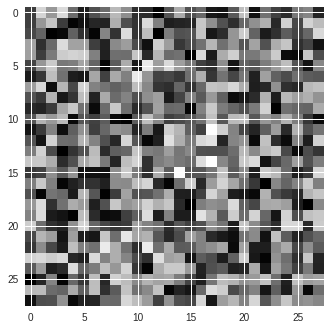

The classification label following attack is 8 from an original classification of 3
The L2 distance of the adversary is 13.355487693625495
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


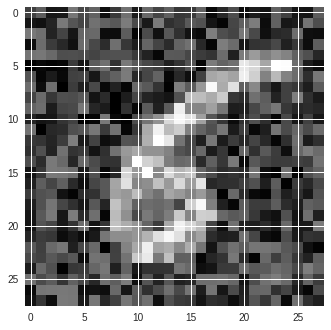

The classification label following attack is 8 from an original classification of 6
The L2 distance of the adversary is 7.747101093304726
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


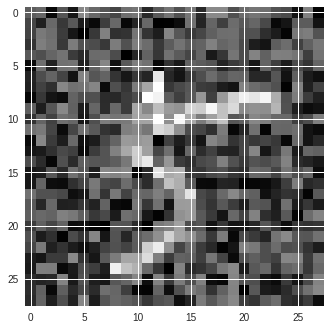

The classification label following attack is 8 from an original classification of 5
The L2 distance of the adversary is 8.218881934071902
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


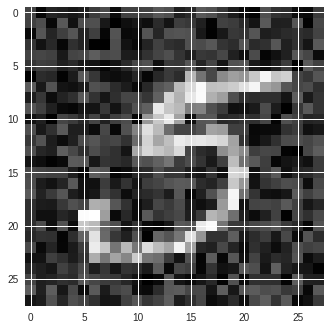

The classification label following attack is 3 from an original classification of 5
The L2 distance of the adversary is 5.683043803167352
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


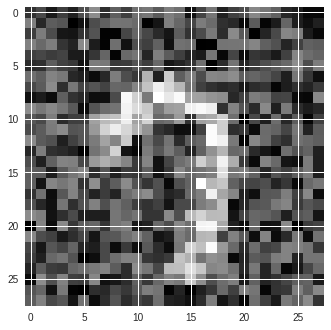

The classification label following attack is 8 from an original classification of 7
The L2 distance of the adversary is 8.715464162376216
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


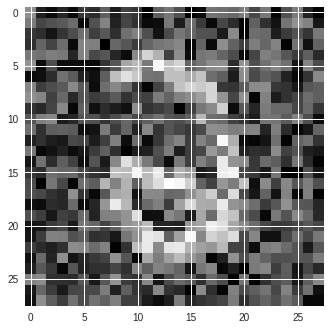

The classification label following attack is 3 from an original classification of 2
The L2 distance of the adversary is 8.769684922954571
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


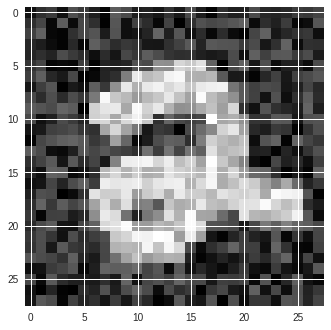

The classification label following attack is 8 from an original classification of 2
The L2 distance of the adversary is 6.015964964125762
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


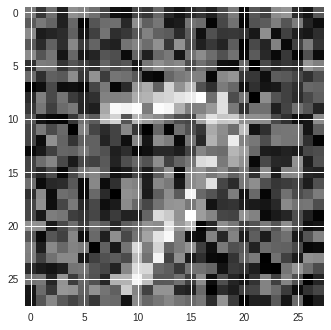

The classification label following attack is 3 from an original classification of 7
The L2 distance of the adversary is 9.08226010587969
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


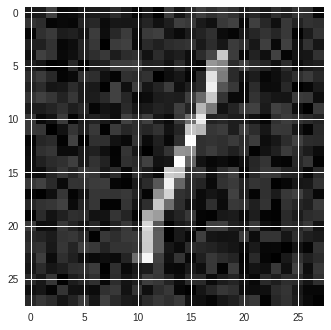

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 4.055826102621822
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


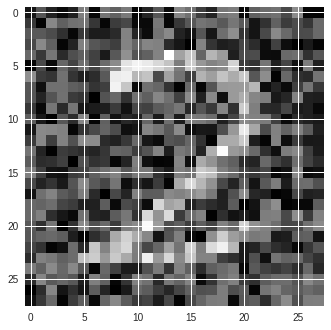

The classification label following attack is 3 from an original classification of 2
The L2 distance of the adversary is 8.47667903801226
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


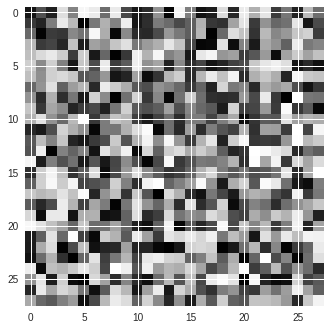

The classification label following attack is 3 from an original classification of 8
The L2 distance of the adversary is 15.818178329304535
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


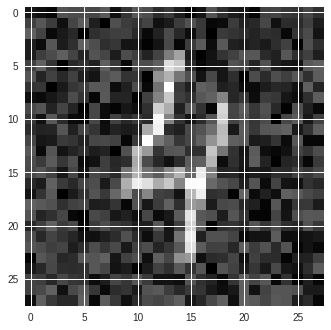

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 5.91107140187611
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


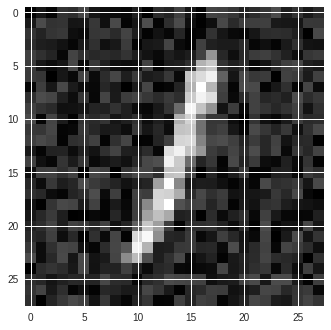

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 4.603904949008832
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


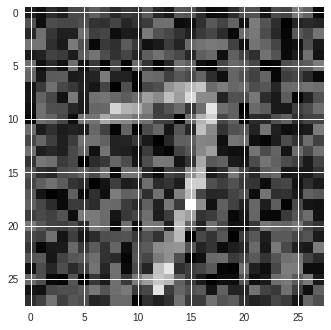

The classification label following attack is 3 from an original classification of 7
The L2 distance of the adversary is 7.791326911955475
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


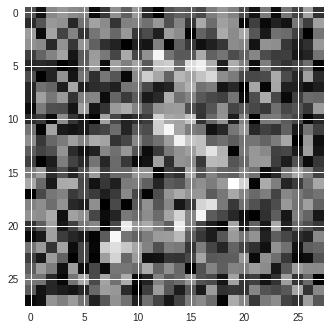

The classification label following attack is 8 from an original classification of 3
The L2 distance of the adversary is 10.448646299869173
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


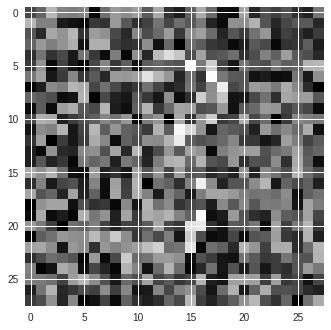

The classification label following attack is 8 from an original classification of 3
The L2 distance of the adversary is 10.98014389549058
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


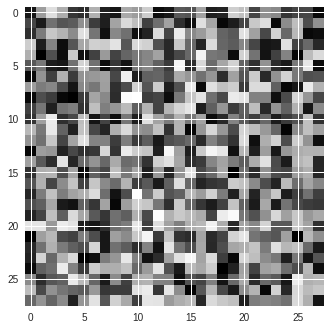

The classification label following attack is 3 from an original classification of 8
The L2 distance of the adversary is 14.431131711225479
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


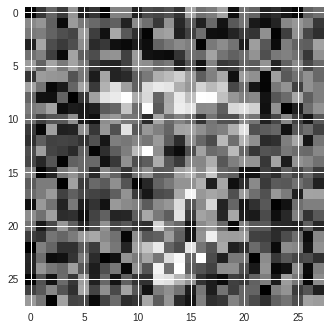

The classification label following attack is 3 from an original classification of 8
The L2 distance of the adversary is 10.468699960684328
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


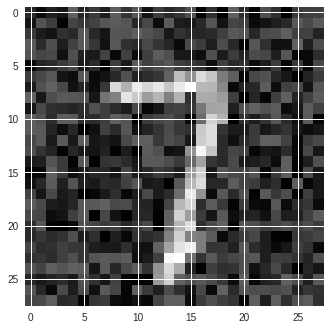

The classification label following attack is 3 from an original classification of 7
The L2 distance of the adversary is 6.062556841842842
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


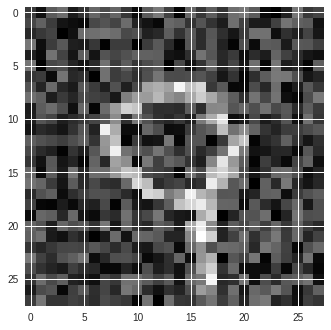

The classification label following attack is 8 from an original classification of 9
The L2 distance of the adversary is 7.372874353501964
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


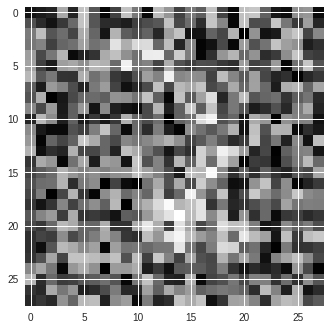

The classification label following attack is 3 from an original classification of 2
The L2 distance of the adversary is 12.078570140238003
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


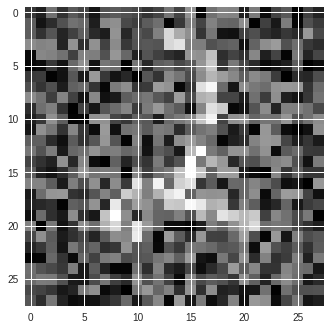

The classification label following attack is 8 from an original classification of 2
The L2 distance of the adversary is 9.574784672397767
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


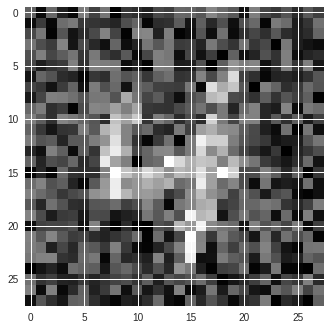

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 8.277484885988393
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


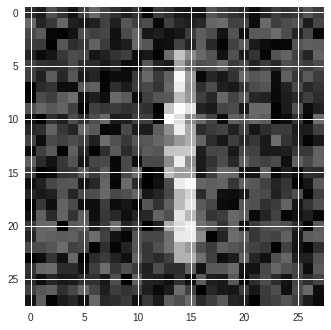

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 6.63464136163472
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


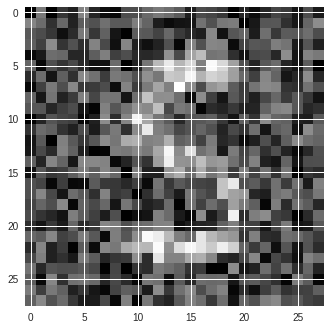

The classification label following attack is 8 from an original classification of 5
The L2 distance of the adversary is 8.631673489169964
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


The model predicted a 8 when the ground-truth label is 9


/usr/local/lib/python3.6/dist-packages/foolbox/attacks/base.py:129: UserWarning: Not running the attack because the original input is already misclassified and the adversarial thus has a distance of 0.
  warnings.warn('Not running the attack because the original input'


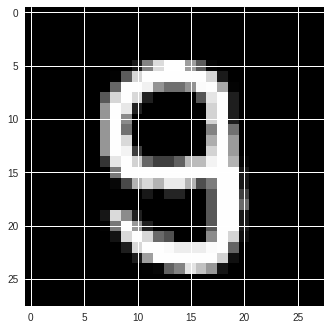

The classification label following attack is 8 from an original classification of 9
The L2 distance of the adversary is 0.0
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


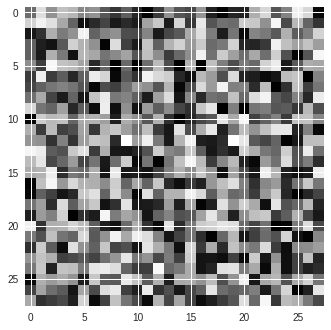

The classification label following attack is 3 from an original classification of 8
The L2 distance of the adversary is 15.019204552812184
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


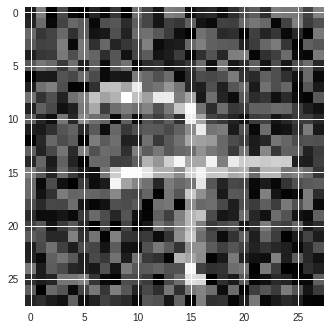

The classification label following attack is 8 from an original classification of 7
The L2 distance of the adversary is 7.590811556087562
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


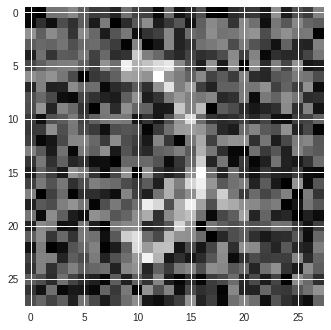

The classification label following attack is 8 from an original classification of 2
The L2 distance of the adversary is 9.115614385167989
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


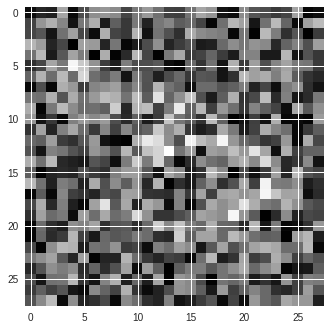

The classification label following attack is 8 from an original classification of 3
The L2 distance of the adversary is 10.957918189151655
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


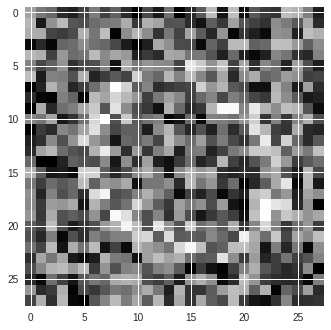

The classification label following attack is 8 from an original classification of 0
The L2 distance of the adversary is 11.532731492599073
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


The model predicted a 2 when the ground-truth label is 4


/usr/local/lib/python3.6/dist-packages/foolbox/attacks/base.py:129: UserWarning: Not running the attack because the original input is already misclassified and the adversarial thus has a distance of 0.
  warnings.warn('Not running the attack because the original input'


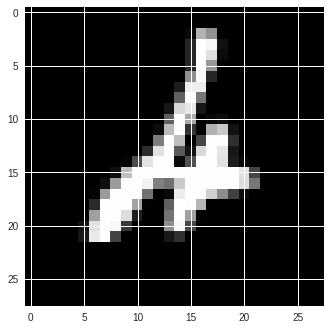

The classification label following attack is 2 from an original classification of 4
The L2 distance of the adversary is 0.0
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


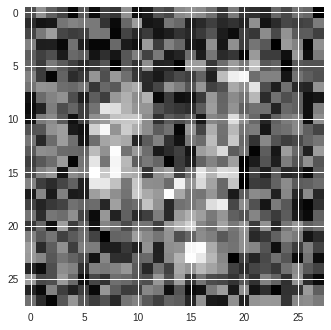

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 9.921390305157201
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


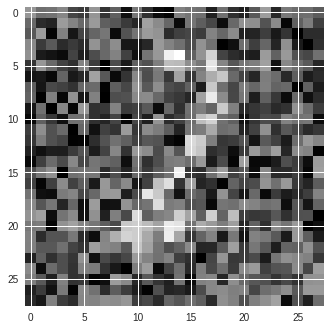

The classification label following attack is 8 from an original classification of 2
The L2 distance of the adversary is 9.90068832219232
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


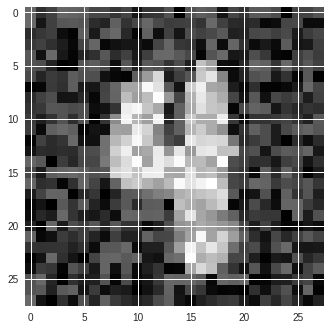

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 6.620252112648858
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


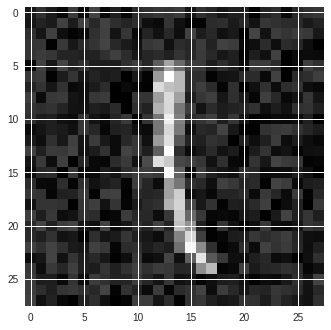

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 4.1937440854458385
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


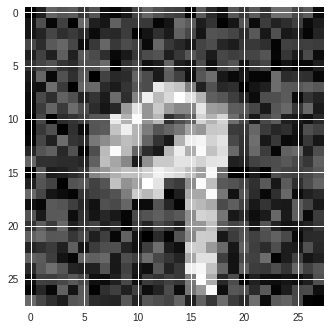

The classification label following attack is 8 from an original classification of 9
The L2 distance of the adversary is 6.611861685453781
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


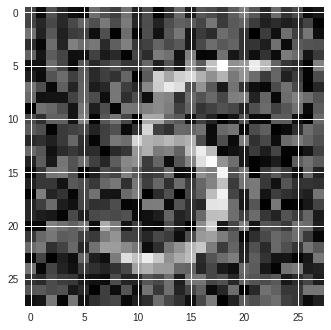

The classification label following attack is 3 from an original classification of 5
The L2 distance of the adversary is 7.595576361388427
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


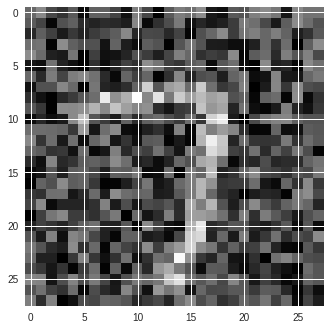

The classification label following attack is 3 from an original classification of 7
The L2 distance of the adversary is 8.548224101481194
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


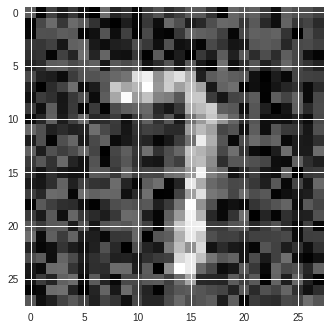

The classification label following attack is 3 from an original classification of 7
The L2 distance of the adversary is 6.892925585205544
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


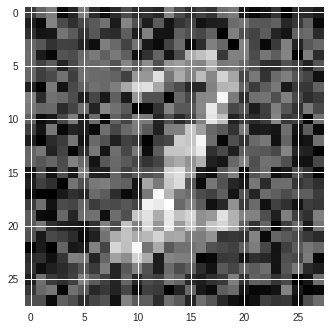

The classification label following attack is 8 from an original classification of 2
The L2 distance of the adversary is 8.287559449703563
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


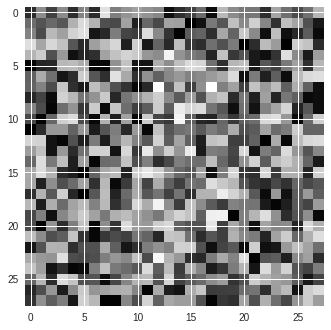

The classification label following attack is 3 from an original classification of 8
The L2 distance of the adversary is 13.408730595097436
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


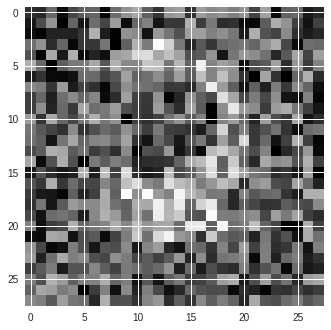

The classification label following attack is 8 from an original classification of 2
The L2 distance of the adversary is 10.713545294154198
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


The model predicted a 0 when the ground-truth label is 6


/usr/local/lib/python3.6/dist-packages/foolbox/attacks/base.py:129: UserWarning: Not running the attack because the original input is already misclassified and the adversarial thus has a distance of 0.
  warnings.warn('Not running the attack because the original input'


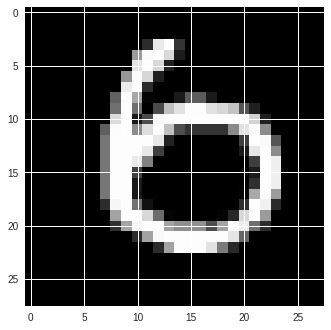

The classification label following attack is 0 from an original classification of 6
The L2 distance of the adversary is 0.0
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


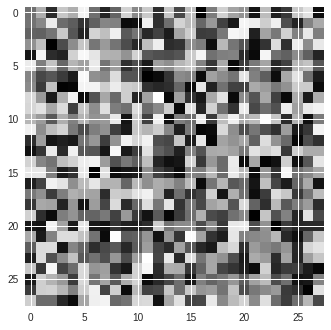

The classification label following attack is 3 from an original classification of 8
The L2 distance of the adversary is 15.2214839419407
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


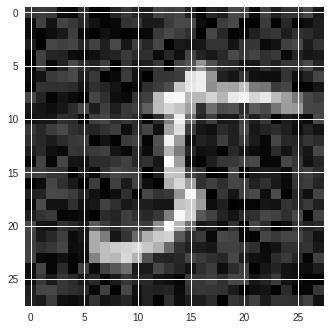

The classification label following attack is 3 from an original classification of 5
The L2 distance of the adversary is 4.609142744704735
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


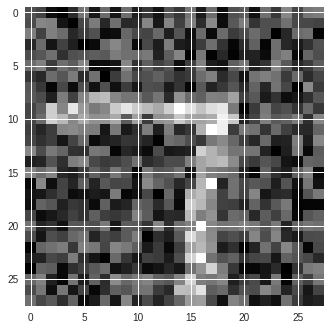

The classification label following attack is 3 from an original classification of 7
The L2 distance of the adversary is 8.419301855375895
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


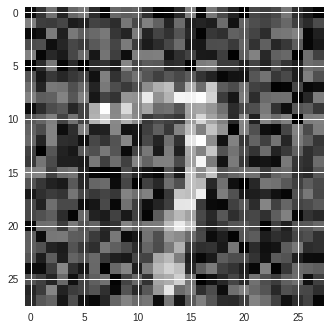

The classification label following attack is 3 from an original classification of 7
The L2 distance of the adversary is 8.26743162502321
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


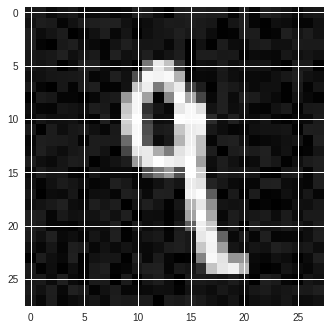

The classification label following attack is 8 from an original classification of 9
The L2 distance of the adversary is 2.1082790448183704
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


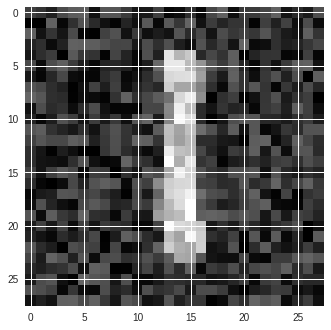

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 6.005539131192218
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


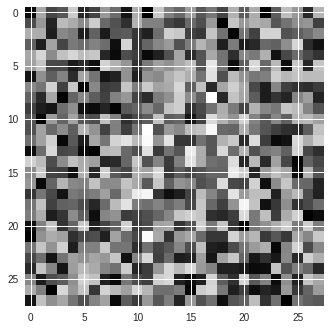

The classification label following attack is 3 from an original classification of 8
The L2 distance of the adversary is 13.562461305440841
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


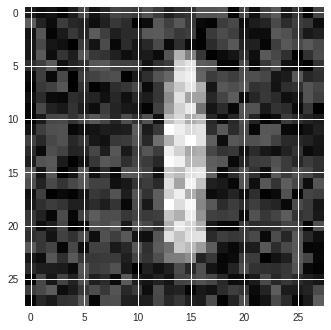

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 5.770852994548101
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


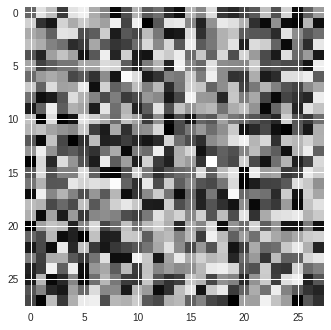

The classification label following attack is 3 from an original classification of 8
The L2 distance of the adversary is 14.799710629751404
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


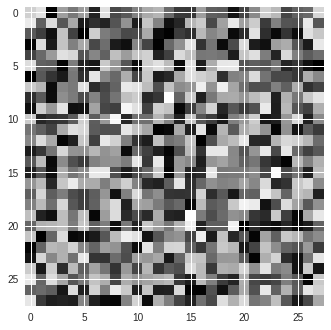

The classification label following attack is 8 from an original classification of 0
The L2 distance of the adversary is 14.045932559936627
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


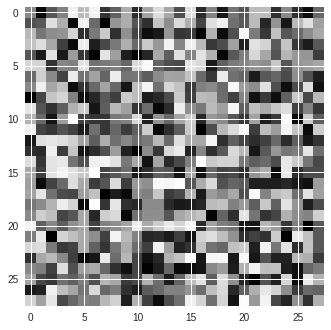

The classification label following attack is 8 from an original classification of 3
The L2 distance of the adversary is 15.28387188139998
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


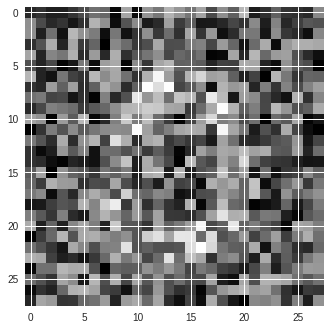

The classification label following attack is 8 from an original classification of 0
The L2 distance of the adversary is 11.412515973097053
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


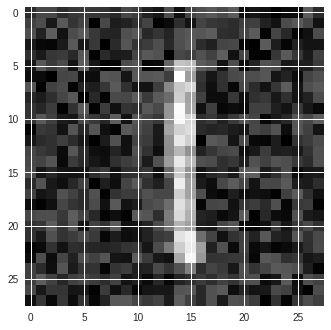

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 5.851046654009493
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


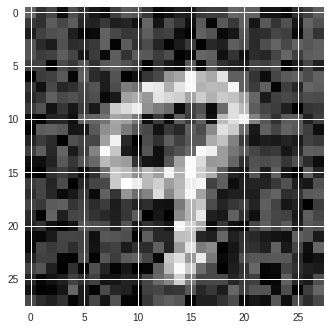

The classification label following attack is 8 from an original classification of 9
The L2 distance of the adversary is 6.4067048585419215
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


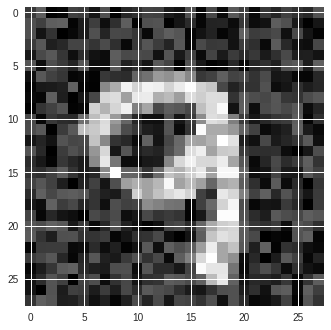

The classification label following attack is 3 from an original classification of 9
The L2 distance of the adversary is 5.830740243550449
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


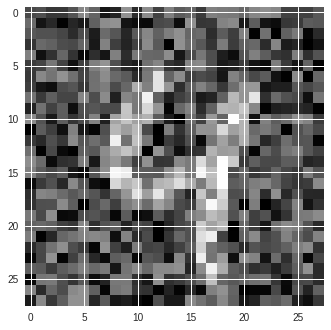

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 9.166048339411827
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


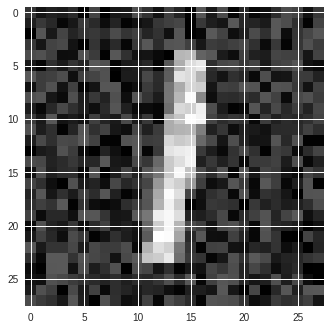

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 5.48943981432898
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


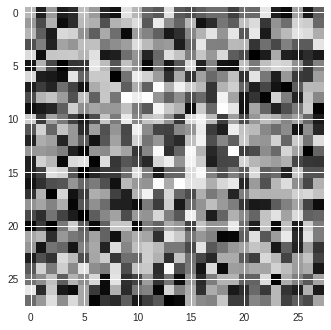

The classification label following attack is 3 from an original classification of 8
The L2 distance of the adversary is 14.010703077292417
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


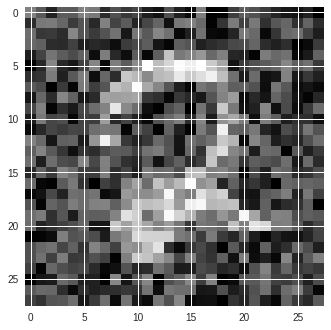

The classification label following attack is 8 from an original classification of 2
The L2 distance of the adversary is 8.401313090161139
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


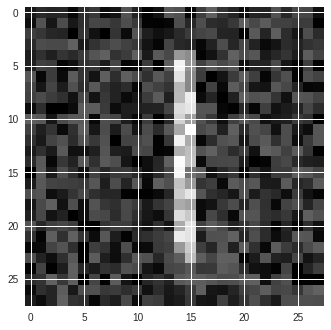

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 6.123830411126368
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


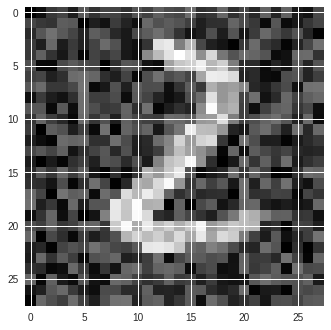

The classification label following attack is 8 from an original classification of 2
The L2 distance of the adversary is 7.13105770552396
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


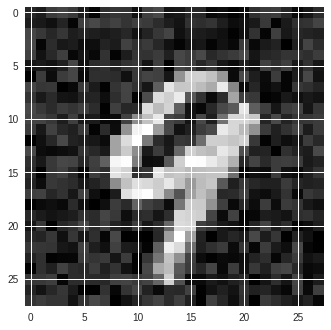

The classification label following attack is 8 from an original classification of 9
The L2 distance of the adversary is 4.5582949574270835
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


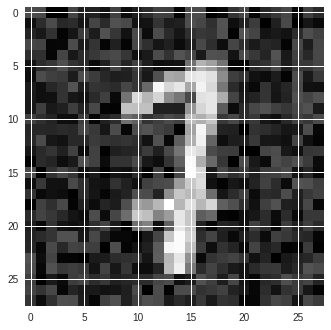

The classification label following attack is 3 from an original classification of 7
The L2 distance of the adversary is 5.145155078178992
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


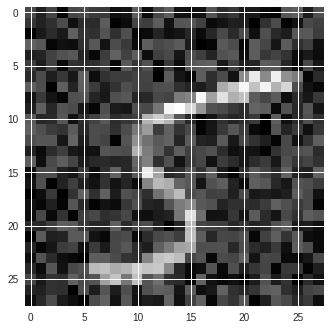

The classification label following attack is 8 from an original classification of 5
The L2 distance of the adversary is 6.160402619856843
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


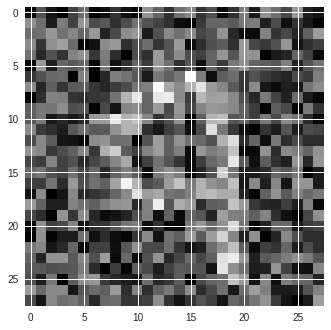

The classification label following attack is 8 from an original classification of 9
The L2 distance of the adversary is 9.50453673991209
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


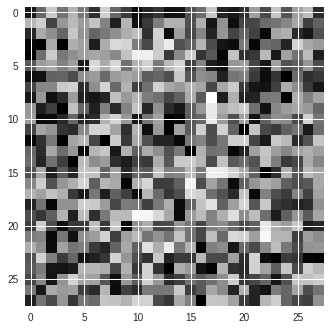

The classification label following attack is 8 from an original classification of 2
The L2 distance of the adversary is 13.038200883255383
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


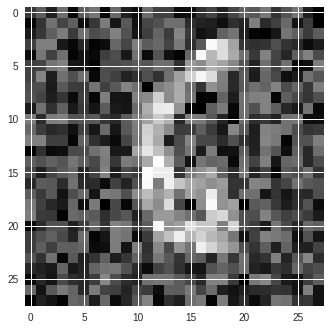

The classification label following attack is 8 from an original classification of 6
The L2 distance of the adversary is 8.279409795910741
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


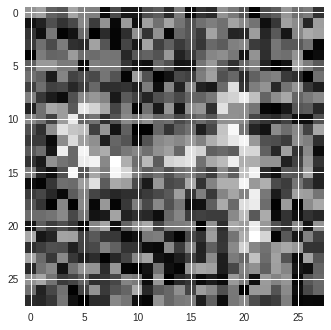

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 10.153776811368056
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


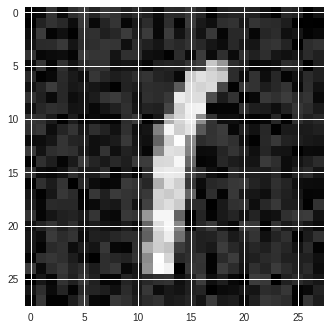

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 3.8696498086613818
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


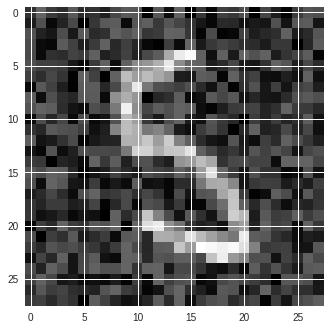

The classification label following attack is 8 from an original classification of 5
The L2 distance of the adversary is 6.451689664976313
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


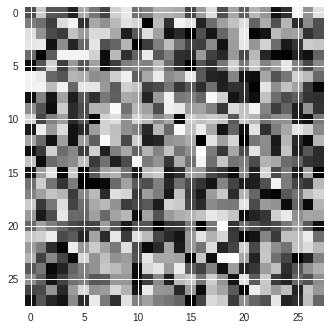

The classification label following attack is 3 from an original classification of 8
The L2 distance of the adversary is 14.623645628386509
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


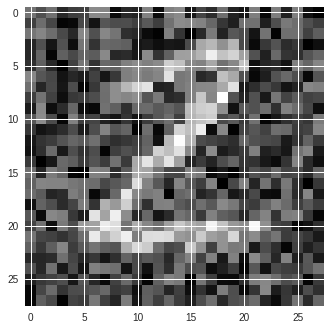

The classification label following attack is 3 from an original classification of 2
The L2 distance of the adversary is 8.326735706208972
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


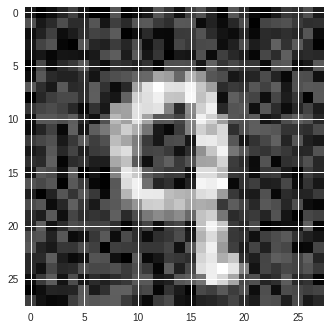

The classification label following attack is 8 from an original classification of 9
The L2 distance of the adversary is 6.064072843756296
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


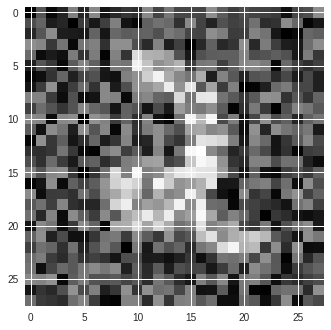

The classification label following attack is 8 from an original classification of 2
The L2 distance of the adversary is 8.999701033939532
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


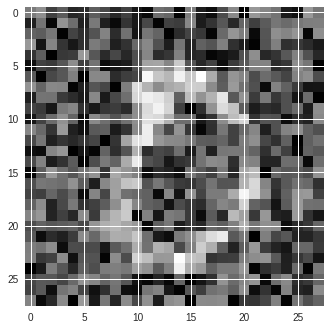

The classification label following attack is 8 from an original classification of 0
The L2 distance of the adversary is 9.412053654479408
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


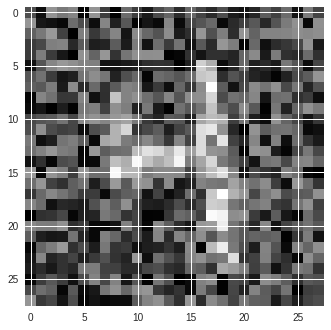

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 9.338659421011045
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


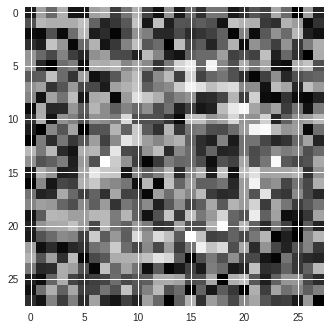

The classification label following attack is 8 from an original classification of 0
The L2 distance of the adversary is 11.836920520691471
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


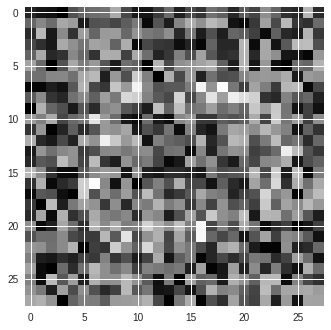

The classification label following attack is 8 from an original classification of 0
The L2 distance of the adversary is 11.597261546949742
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


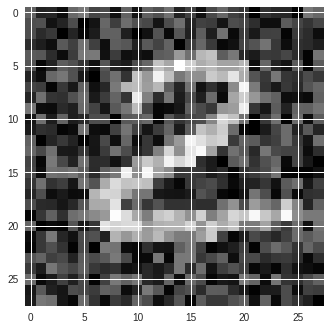

The classification label following attack is 8 from an original classification of 2
The L2 distance of the adversary is 6.975878708152909
INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


INFO:tensorflow:Restoring parameters from /MNIST_LeNet5_CNN.ckpt


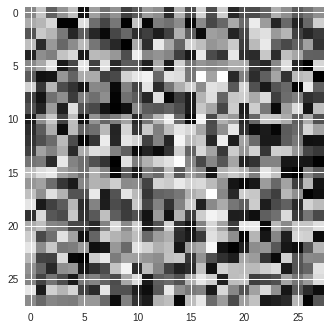

The classification label following attack is 3 from an original classification of 8
The L2 distance of the adversary is 13.60641192004255


In [0]:
adversary_found, adversary_distance, adversary_arrays = evaluate_BlendedUniformNoiseAttack_resistance_CustomModel(
    model_prediction_function=cnn_predictions, model_weights="/MNIST_LeNet5_CNN.ckpt", var_list=var_list_LeNet,
    num_images_to_attack=num_images_to_attack, temp_batch_size=None)

In [0]:
success_ratio = np.sum(adversary_found)/num_images_to_attack
Standard_mean, Standard_var, Standard_std = scipy.stats.bayes_mvs(adversary_distance)

print("The success ratio is " + str(success_ratio))
print("Mean: " + str(Standard_mean))
print("Variance: " + str(Standard_var))
print("Standard deviation: " + str(Standard_std))


The success ratio is 1.0
Mean: Mean(statistic=8.066568511965592, minmax=(7.763519978310654, 8.36961704562053))
Variance: Variance(statistic=10.188505870391483, minmax=(8.891385881009814, 11.640853974556817))
Standard deviation: Std_dev(statistic=3.189258215616872, minmax=(2.981842698904457, 3.411869571738759))


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


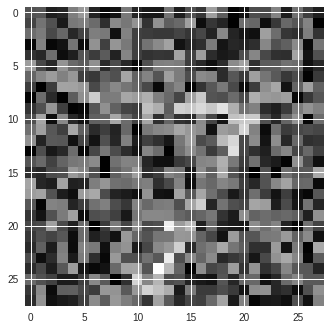

The classification label following attack is 8 from an original classification of 7
The L2 distance of the adversary is 10.076699234439655
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


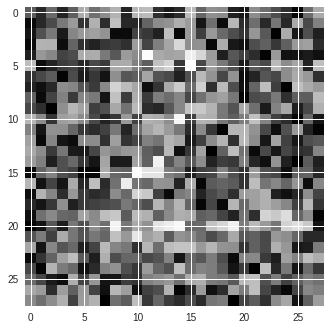

The classification label following attack is 8 from an original classification of 2
The L2 distance of the adversary is 11.52529034223868
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


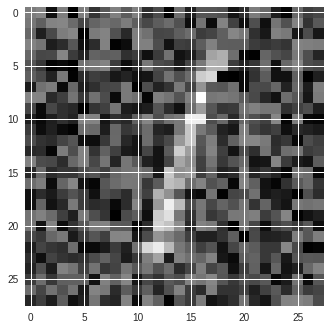

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 8.27926451372383
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


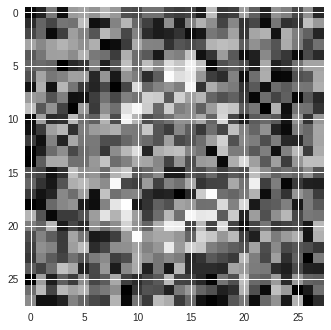

The classification label following attack is 6 from an original classification of 0
The L2 distance of the adversary is 11.571032372623927
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


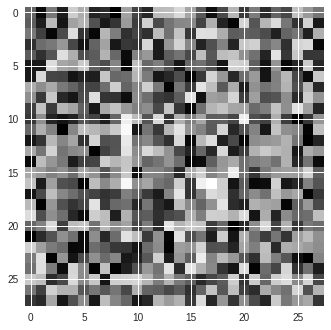

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 13.874392765832361
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


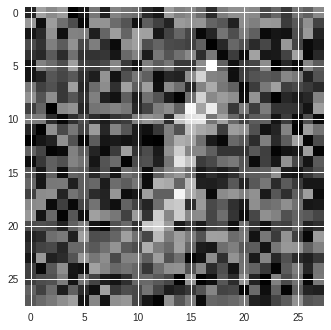

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 9.920871735552065
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


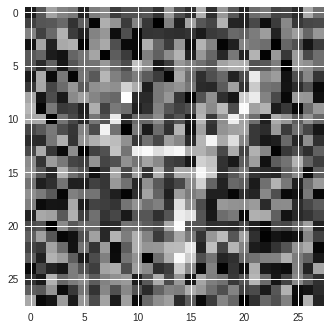

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 10.733981137693096
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


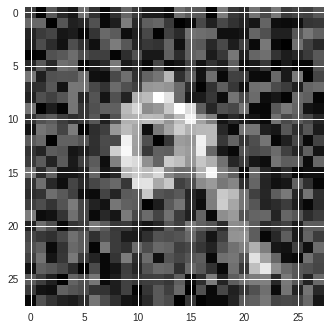

The classification label following attack is 4 from an original classification of 9
The L2 distance of the adversary is 7.562153891173229
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


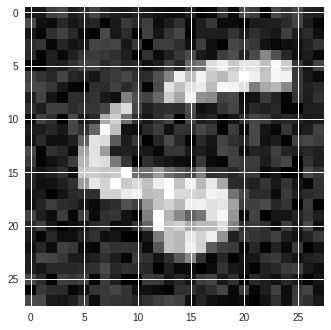

The classification label following attack is 6 from an original classification of 5
The L2 distance of the adversary is 4.457781035037205
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


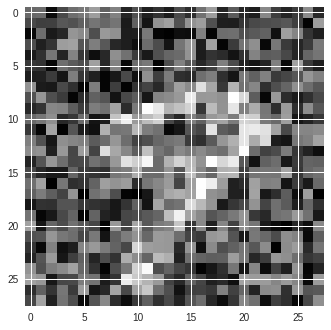

The classification label following attack is 4 from an original classification of 9
The L2 distance of the adversary is 9.598590665960488
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


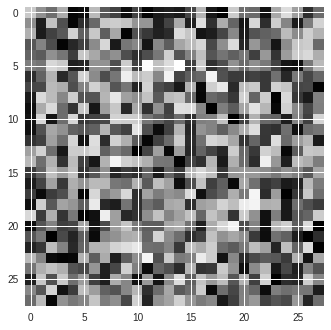

The classification label following attack is 4 from an original classification of 0
The L2 distance of the adversary is 13.339721288170498
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


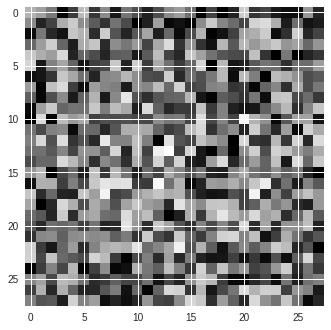

The classification label following attack is 8 from an original classification of 6
The L2 distance of the adversary is 12.895934526058676
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


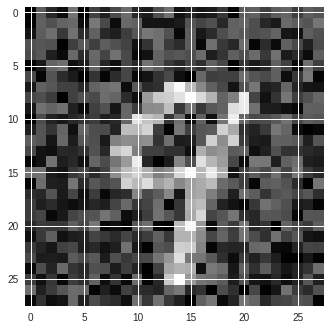

The classification label following attack is 4 from an original classification of 9
The L2 distance of the adversary is 7.271554247048303
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


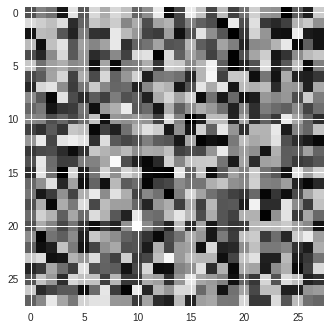

The classification label following attack is 8 from an original classification of 0
The L2 distance of the adversary is 14.433391418465039
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


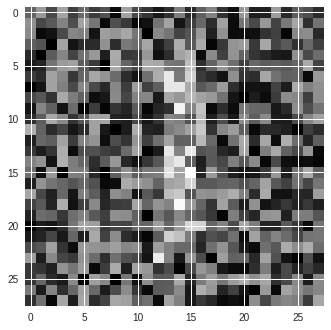

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 10.815729817209064
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


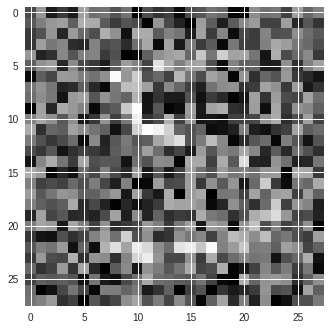

The classification label following attack is 8 from an original classification of 5
The L2 distance of the adversary is 10.884960651894877
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


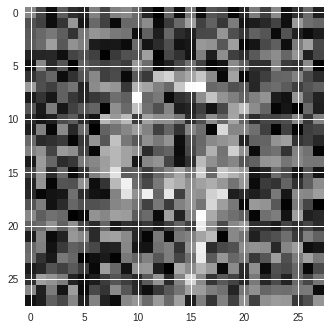

The classification label following attack is 4 from an original classification of 9
The L2 distance of the adversary is 9.658782915327262
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


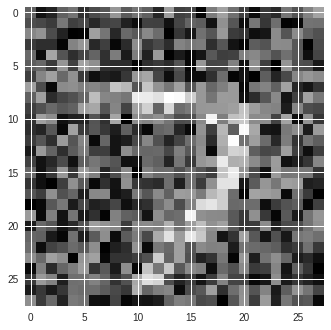

The classification label following attack is 2 from an original classification of 7
The L2 distance of the adversary is 9.877268863165035
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


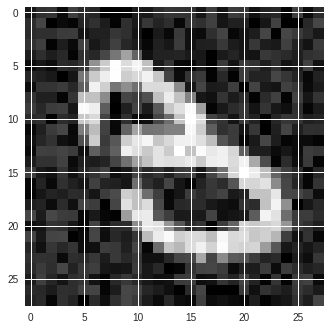

The classification label following attack is 8 from an original classification of 3
The L2 distance of the adversary is 4.254468670042465
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


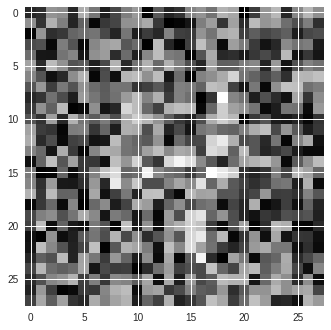

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 11.61109100795404
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


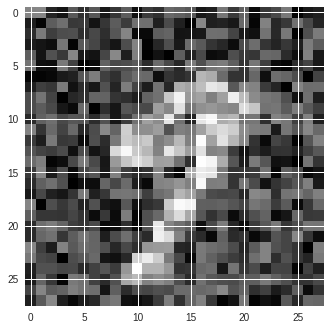

The classification label following attack is 4 from an original classification of 9
The L2 distance of the adversary is 8.224852347457999
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


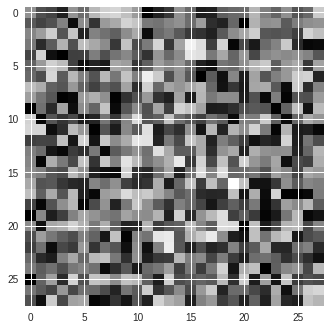

The classification label following attack is 8 from an original classification of 6
The L2 distance of the adversary is 12.818134168526607
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


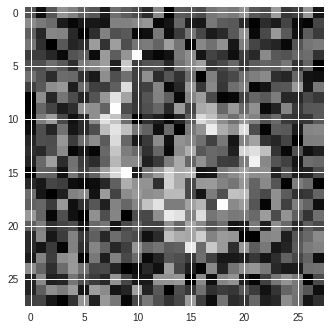

The classification label following attack is 8 from an original classification of 6
The L2 distance of the adversary is 9.465827087436551
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


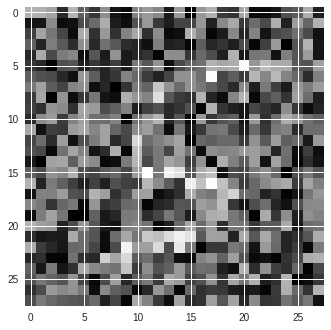

The classification label following attack is 8 from an original classification of 5
The L2 distance of the adversary is 10.767379765553056
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


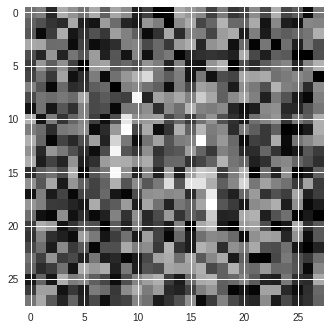

The classification label following attack is 5 from an original classification of 4
The L2 distance of the adversary is 10.517895255906096
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


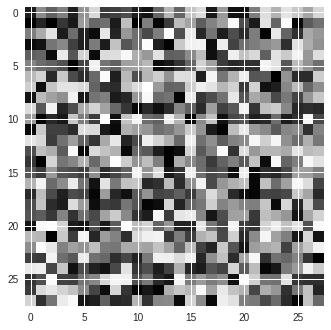

The classification label following attack is 8 from an original classification of 0
The L2 distance of the adversary is 15.328112148177171
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


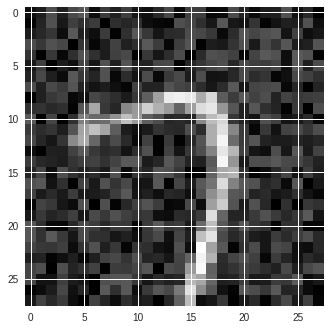

The classification label following attack is 9 from an original classification of 7
The L2 distance of the adversary is 5.598412764326111
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


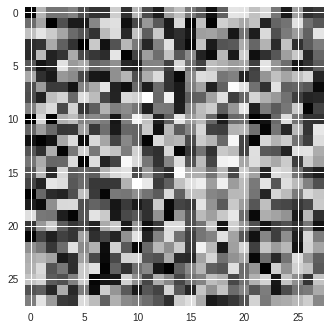

The classification label following attack is 5 from an original classification of 4
The L2 distance of the adversary is 13.90822515187828
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


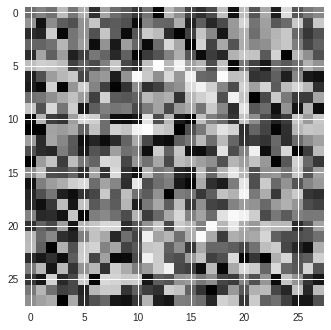

The classification label following attack is 2 from an original classification of 0
The L2 distance of the adversary is 13.346010882699504
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


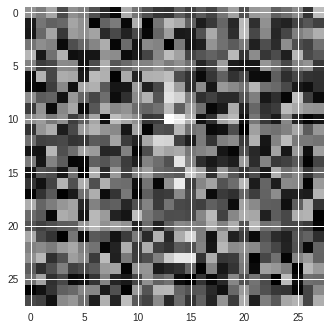

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 11.56486931237856
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


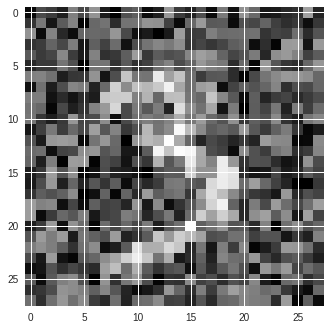

The classification label following attack is 8 from an original classification of 3
The L2 distance of the adversary is 9.802686499836744
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


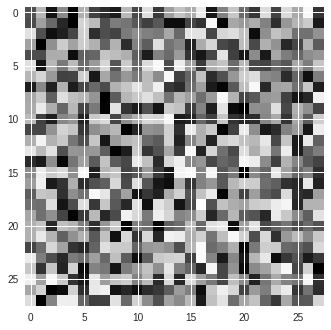

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 15.628573080582271
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


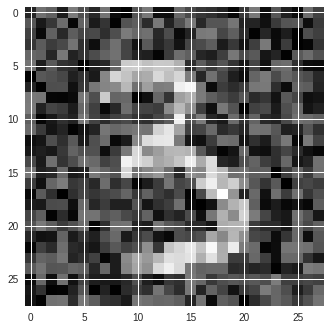

The classification label following attack is 8 from an original classification of 3
The L2 distance of the adversary is 7.612183712204864
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


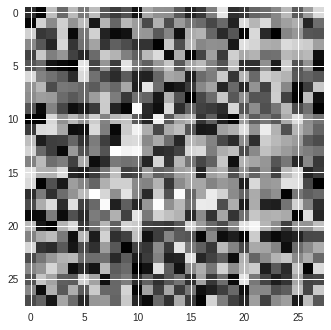

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 13.5076401781827
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


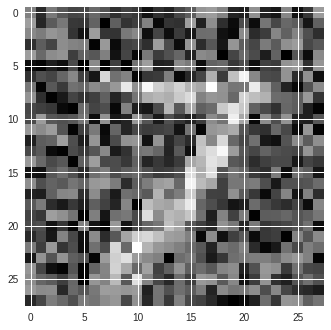

The classification label following attack is 8 from an original classification of 7
The L2 distance of the adversary is 9.854052642094986
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


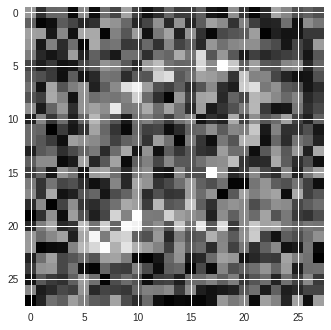

The classification label following attack is 0 from an original classification of 2
The L2 distance of the adversary is 10.342198788826654
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


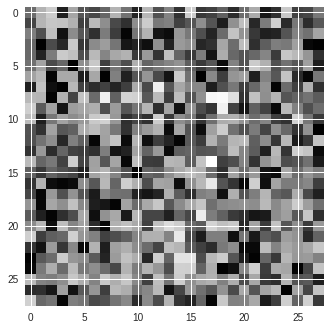

The classification label following attack is 8 from an original classification of 7
The L2 distance of the adversary is 13.101669111658952
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


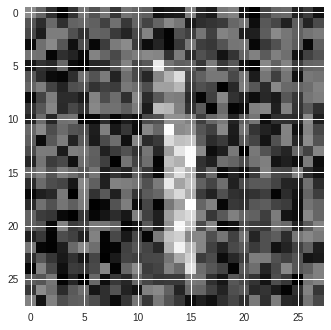

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 8.768514389428784
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


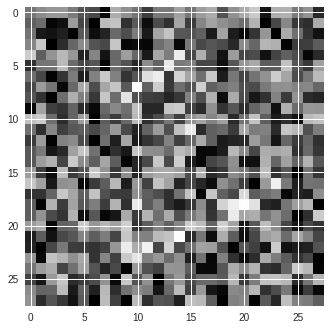

The classification label following attack is 1 from an original classification of 2
The L2 distance of the adversary is 12.061549779172163
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


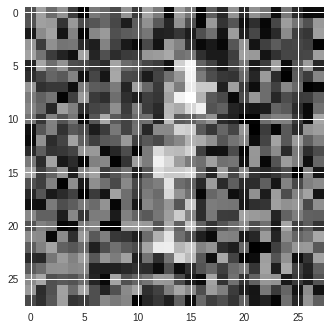

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 10.45408596788454
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


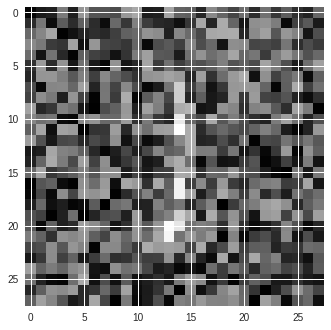

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 9.954554924549967
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


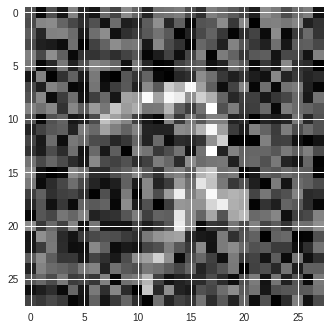

The classification label following attack is 8 from an original classification of 7
The L2 distance of the adversary is 8.580350032789514
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


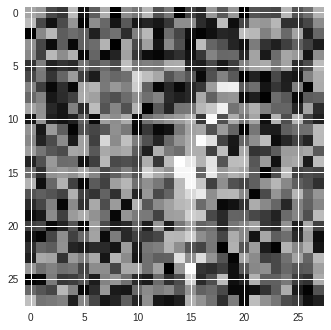

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 11.459226702211042
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


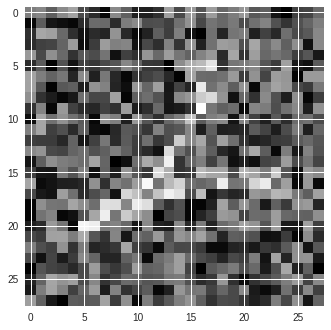

The classification label following attack is 5 from an original classification of 2
The L2 distance of the adversary is 10.241068115302598
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


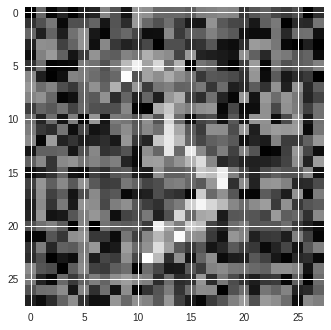

The classification label following attack is 5 from an original classification of 3
The L2 distance of the adversary is 9.700651271982634
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


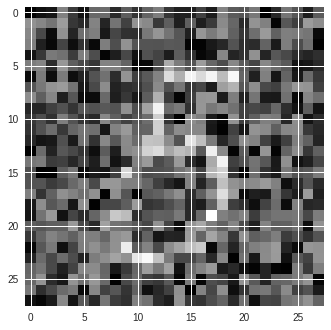

The classification label following attack is 8 from an original classification of 5
The L2 distance of the adversary is 9.591132853506451
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


The model predicted a 8 when the ground-truth label is 1


/usr/local/lib/python3.6/dist-packages/foolbox/attacks/base.py:129: UserWarning: Not running the attack because the original input is already misclassified and the adversarial thus has a distance of 0.
  warnings.warn('Not running the attack because the original input'


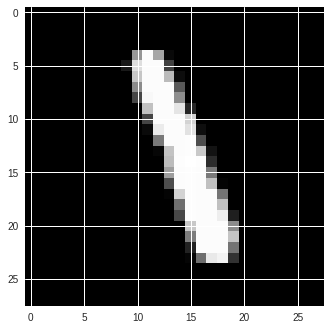

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 0.0
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


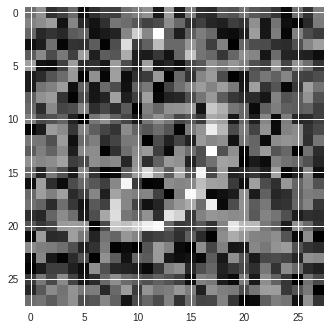

The classification label following attack is 6 from an original classification of 2
The L2 distance of the adversary is 9.814006707496757
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


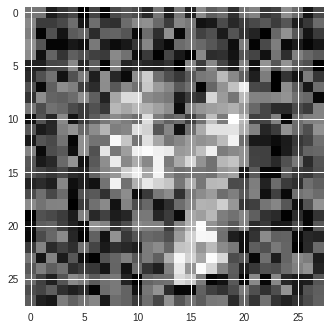

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 9.193493125437206
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


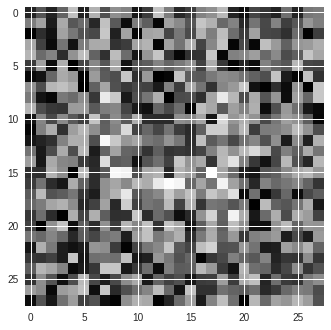

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 12.23594484599334
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


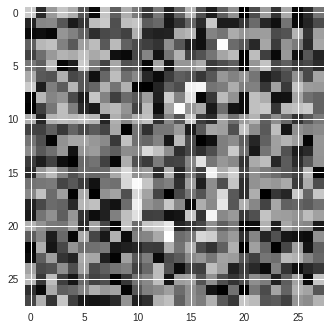

The classification label following attack is 8 from an original classification of 6
The L2 distance of the adversary is 12.422947472640931
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


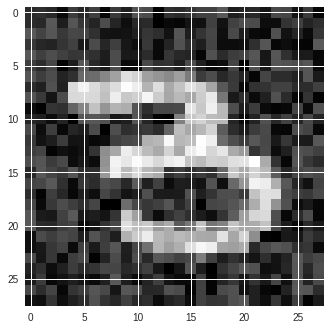

The classification label following attack is 8 from an original classification of 3
The L2 distance of the adversary is 5.505436151058793
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


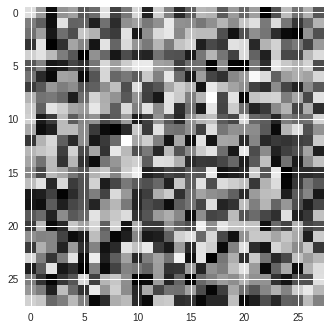

The classification label following attack is 1 from an original classification of 5
The L2 distance of the adversary is 14.17998278294349
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


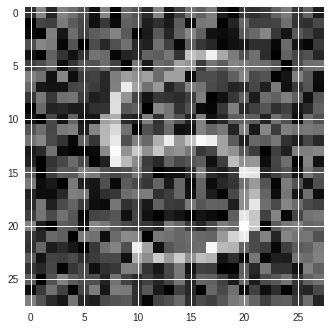

The classification label following attack is 6 from an original classification of 5
The L2 distance of the adversary is 7.716315406054567
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


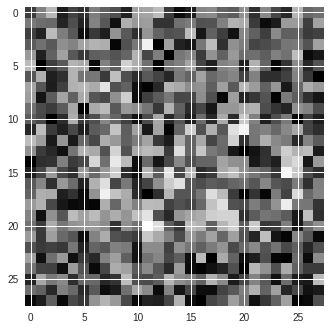

The classification label following attack is 5 from an original classification of 6
The L2 distance of the adversary is 11.401813369657841
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


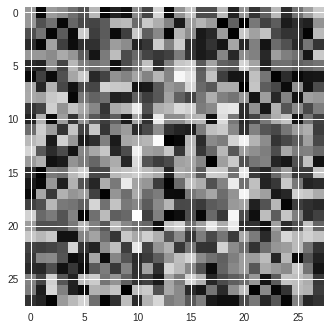

The classification label following attack is 4 from an original classification of 0
The L2 distance of the adversary is 12.988397515179315
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


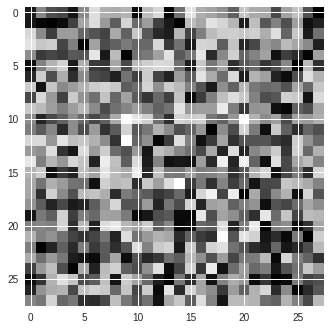

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 14.0330644522049
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


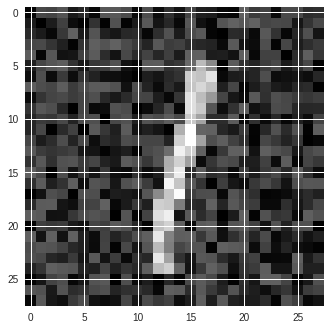

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 5.802680902868628
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


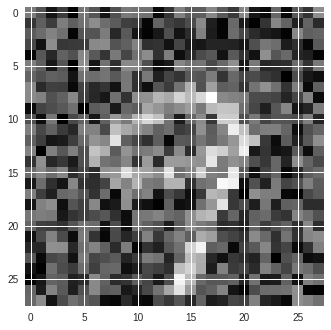

The classification label following attack is 4 from an original classification of 9
The L2 distance of the adversary is 8.982743526705708
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


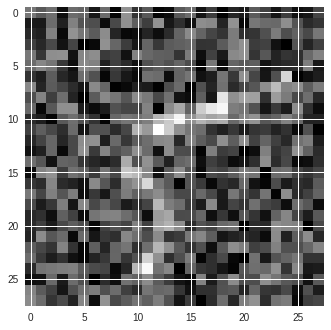

The classification label following attack is 8 from an original classification of 5
The L2 distance of the adversary is 8.092477468160155
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


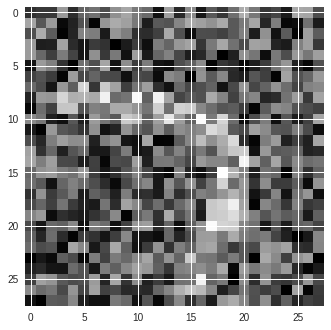

The classification label following attack is 1 from an original classification of 7
The L2 distance of the adversary is 10.648183363643787
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


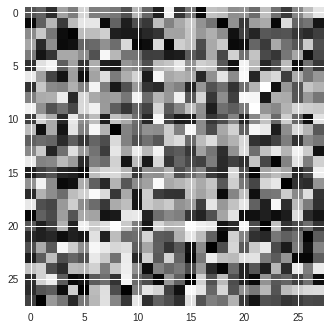

The classification label following attack is 1 from an original classification of 8
The L2 distance of the adversary is 14.52850257677448
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


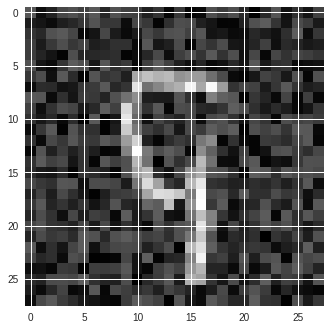

The classification label following attack is 8 from an original classification of 9
The L2 distance of the adversary is 5.683266102470253
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


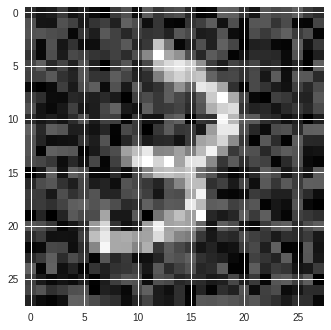

The classification label following attack is 8 from an original classification of 3
The L2 distance of the adversary is 6.0129111250478955
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


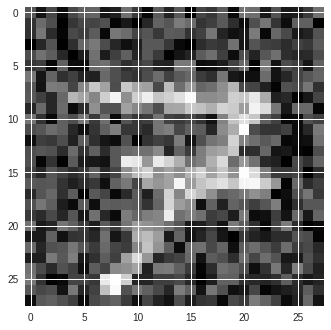

The classification label following attack is 8 from an original classification of 7
The L2 distance of the adversary is 7.563490508814508
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


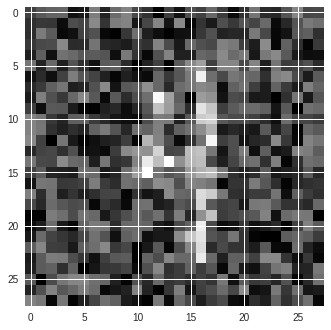

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 8.07381199397188
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


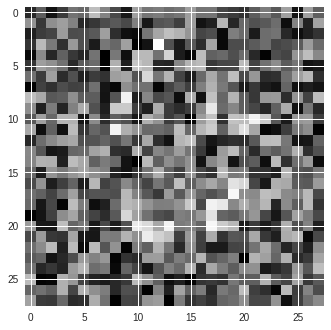

The classification label following attack is 0 from an original classification of 6
The L2 distance of the adversary is 11.58635977656087
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


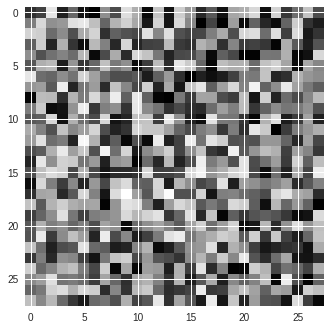

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 14.212103180427023
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


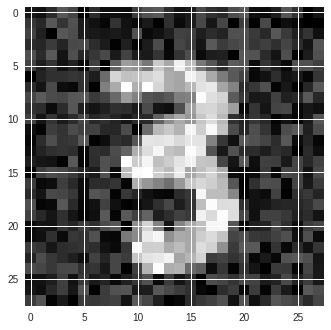

The classification label following attack is 8 from an original classification of 3
The L2 distance of the adversary is 5.497358216083336
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


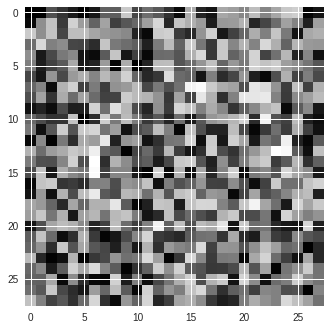

The classification label following attack is 8 from an original classification of 0
The L2 distance of the adversary is 13.180862257953613
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


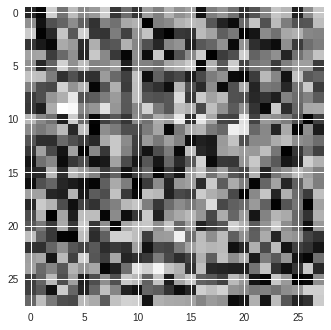

The classification label following attack is 5 from an original classification of 7
The L2 distance of the adversary is 13.02480870224813
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


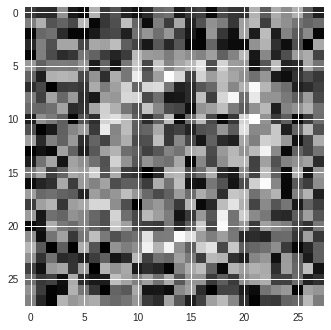

The classification label following attack is 8 from an original classification of 0
The L2 distance of the adversary is 11.661853354381238
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


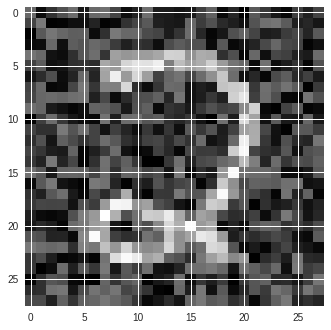

The classification label following attack is 0 from an original classification of 2
The L2 distance of the adversary is 7.218757977486437
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


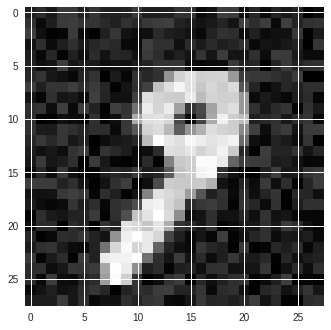

The classification label following attack is 8 from an original classification of 9
The L2 distance of the adversary is 3.932127445125631
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


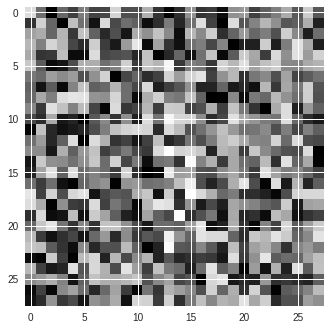

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 13.835786623922855
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


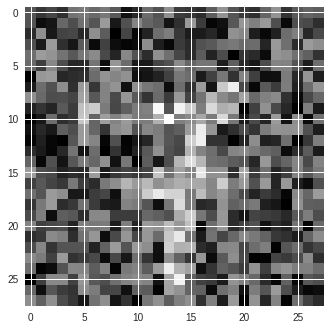

The classification label following attack is 8 from an original classification of 7
The L2 distance of the adversary is 9.780574489781403
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


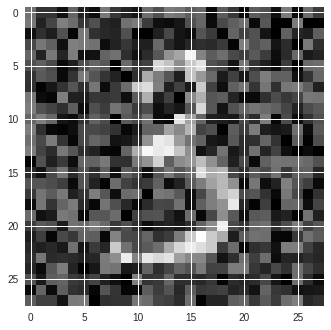

The classification label following attack is 5 from an original classification of 3
The L2 distance of the adversary is 7.582081399384408
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


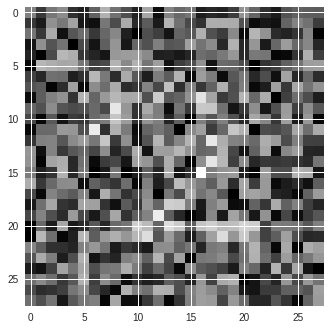

The classification label following attack is 5 from an original classification of 2
The L2 distance of the adversary is 11.045767940716487
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


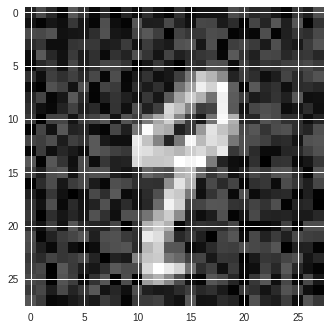

The classification label following attack is 8 from an original classification of 9
The L2 distance of the adversary is 5.450435142320137
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


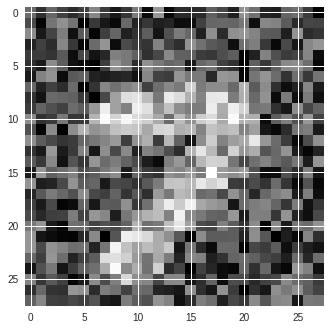

The classification label following attack is 2 from an original classification of 7
The L2 distance of the adversary is 9.429149597342722
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


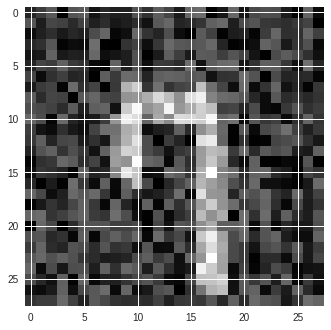

The classification label following attack is 4 from an original classification of 7
The L2 distance of the adversary is 6.892352413301304
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


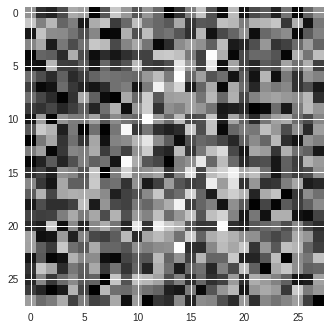

The classification label following attack is 8 from an original classification of 6
The L2 distance of the adversary is 12.294808587314243
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


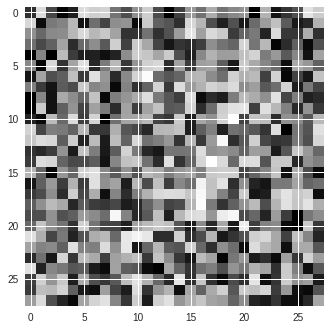

The classification label following attack is 4 from an original classification of 2
The L2 distance of the adversary is 14.174558155481362
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


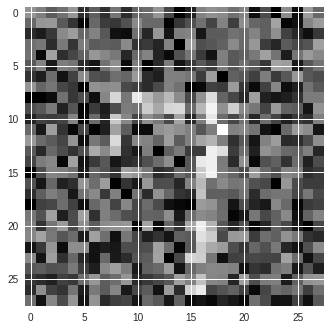

The classification label following attack is 8 from an original classification of 7
The L2 distance of the adversary is 10.10378557248925
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


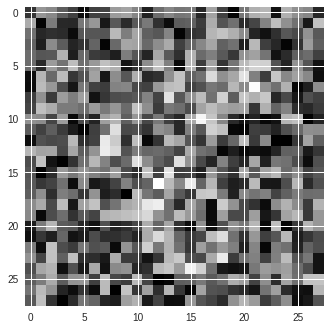

The classification label following attack is 5 from an original classification of 8
The L2 distance of the adversary is 11.615858421656196
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


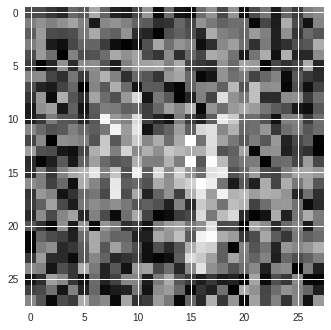

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 10.951424735610559
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


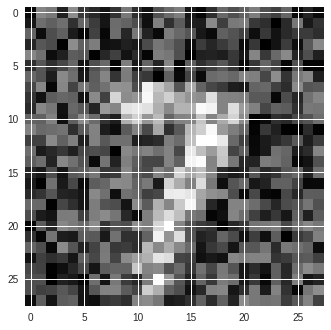

The classification label following attack is 9 from an original classification of 7
The L2 distance of the adversary is 8.735186322927676
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


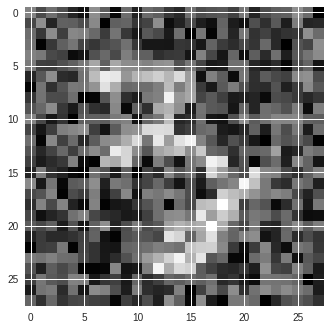

The classification label following attack is 5 from an original classification of 3
The L2 distance of the adversary is 8.702947025475712
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


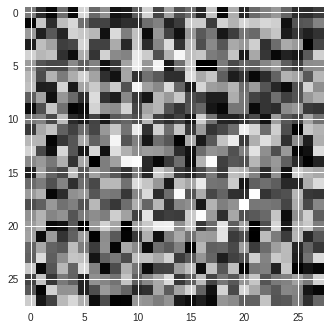

The classification label following attack is 8 from an original classification of 6
The L2 distance of the adversary is 13.13309481825526
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


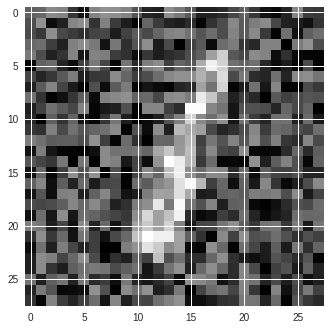

The classification label following attack is 6 from an original classification of 1
The L2 distance of the adversary is 9.066316940074518
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


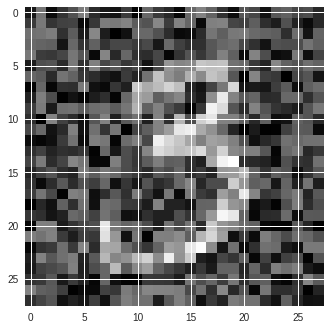

The classification label following attack is 8 from an original classification of 3
The L2 distance of the adversary is 8.283681824882931
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


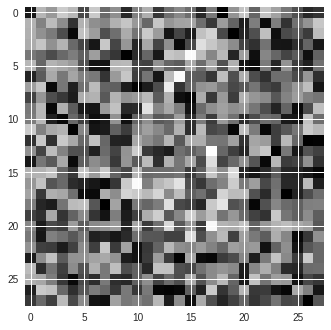

The classification label following attack is 5 from an original classification of 6
The L2 distance of the adversary is 12.138323560063336
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


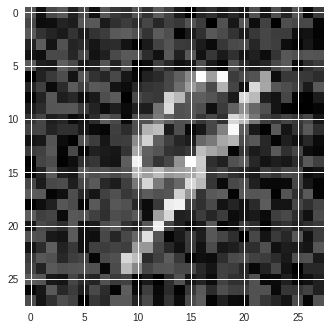

The classification label following attack is 8 from an original classification of 9
The L2 distance of the adversary is 5.819695637025247
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


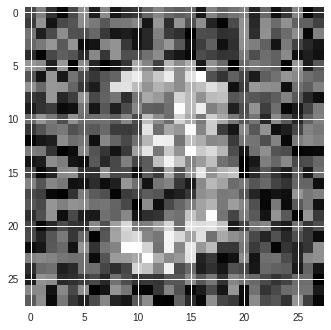

The classification label following attack is 8 from an original classification of 3
The L2 distance of the adversary is 9.42237137710016
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


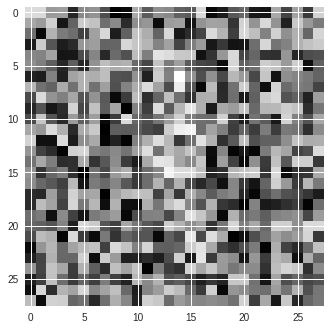

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 13.773813032886743
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


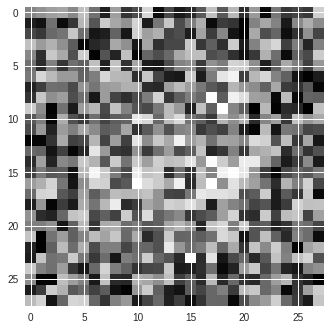

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 12.996702982578865
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


The model predicted a 8 when the ground-truth label is 1


/usr/local/lib/python3.6/dist-packages/foolbox/attacks/base.py:129: UserWarning: Not running the attack because the original input is already misclassified and the adversarial thus has a distance of 0.
  warnings.warn('Not running the attack because the original input'


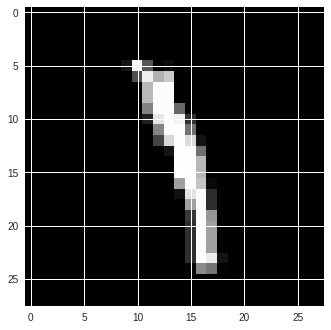

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 0.0
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


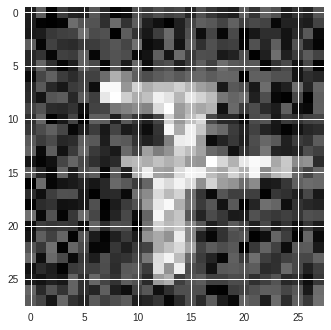

The classification label following attack is 8 from an original classification of 7
The L2 distance of the adversary is 6.819696572123436
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


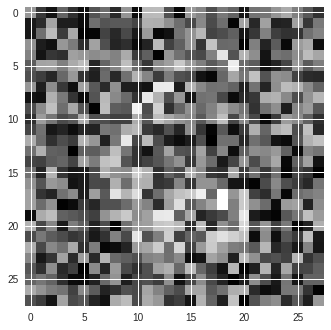

The classification label following attack is 2 from an original classification of 6
The L2 distance of the adversary is 11.313694300303165
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


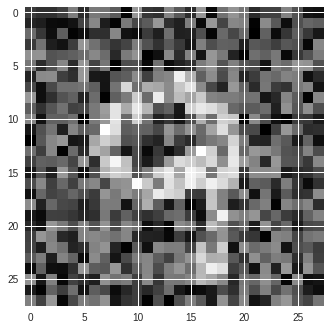

The classification label following attack is 8 from an original classification of 9
The L2 distance of the adversary is 9.515751434674169
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


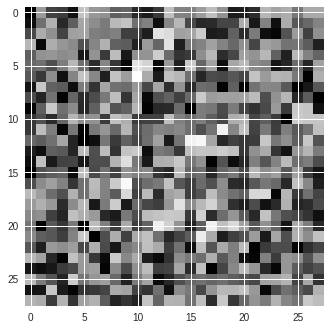

The classification label following attack is 8 from an original classification of 6
The L2 distance of the adversary is 11.958795704900064
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


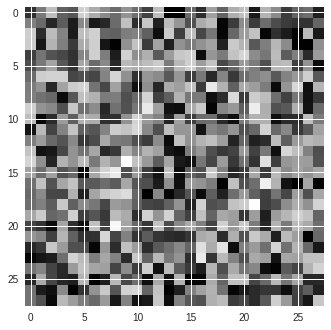

The classification label following attack is 6 from an original classification of 0
The L2 distance of the adversary is 13.275322083393135
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


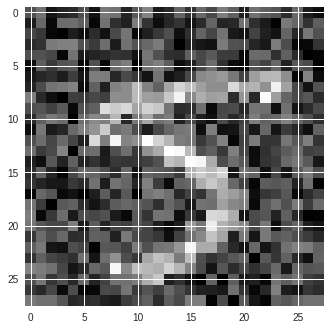

The classification label following attack is 8 from an original classification of 5
The L2 distance of the adversary is 8.033924748864745
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


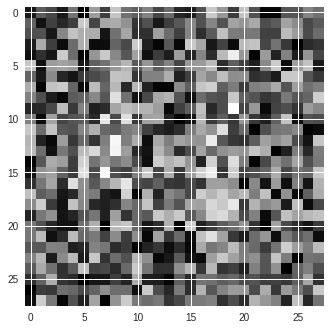

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 12.438881936726364
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


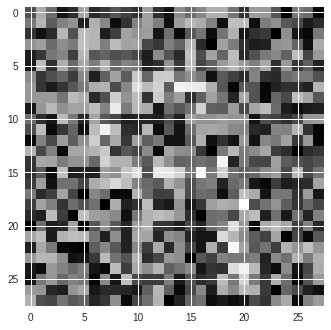

The classification label following attack is 8 from an original classification of 9
The L2 distance of the adversary is 11.895045606582114
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


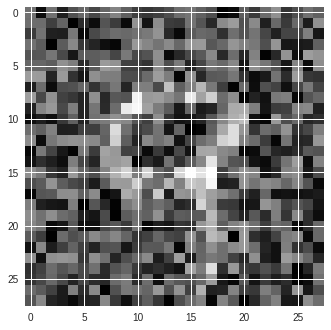

The classification label following attack is 8 from an original classification of 9
The L2 distance of the adversary is 9.446117212860772
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


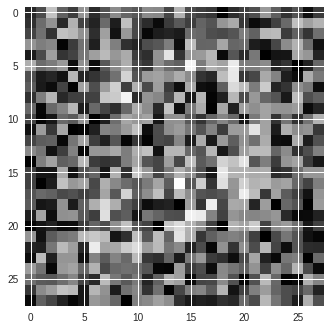

The classification label following attack is 1 from an original classification of 2
The L2 distance of the adversary is 11.201633383966744
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


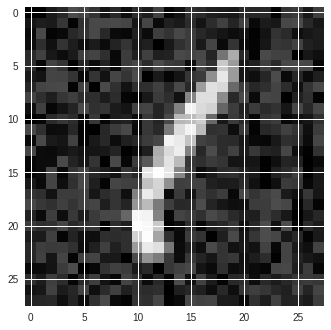

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 4.706992398965619
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


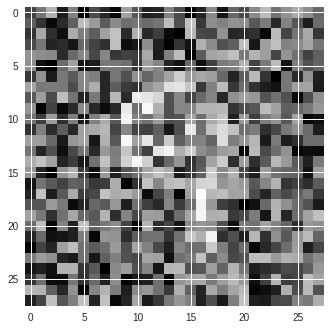

The classification label following attack is 5 from an original classification of 9
The L2 distance of the adversary is 11.889393747509569
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


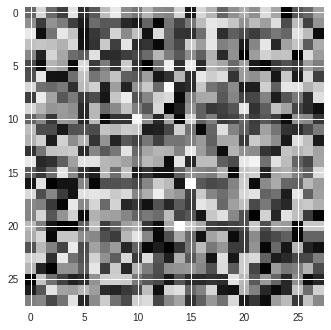

The classification label following attack is 5 from an original classification of 4
The L2 distance of the adversary is 13.825063579991575
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


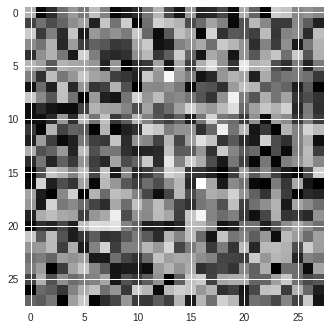

The classification label following attack is 5 from an original classification of 8
The L2 distance of the adversary is 13.007021902530681
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


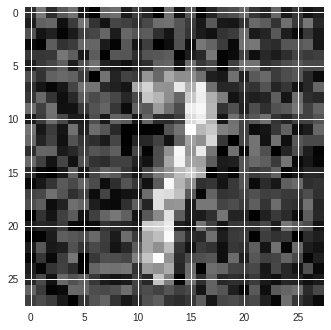

The classification label following attack is 8 from an original classification of 7
The L2 distance of the adversary is 7.151743043018844
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


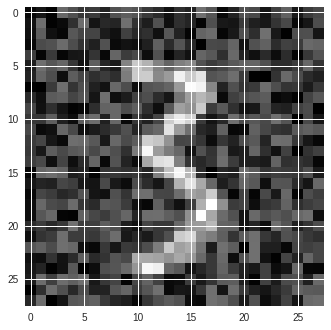

The classification label following attack is 8 from an original classification of 3
The L2 distance of the adversary is 6.939148676540047
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


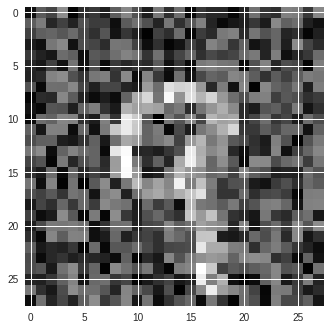

The classification label following attack is 8 from an original classification of 9
The L2 distance of the adversary is 8.841571349293401
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


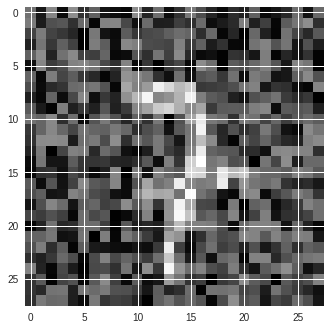

The classification label following attack is 2 from an original classification of 7
The L2 distance of the adversary is 8.787434978213783
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


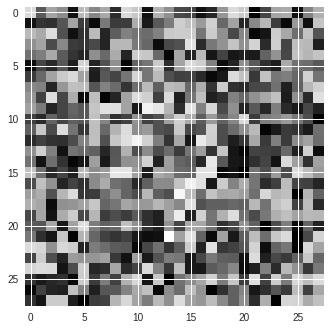

The classification label following attack is 2 from an original classification of 4
The L2 distance of the adversary is 13.39071940034412
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


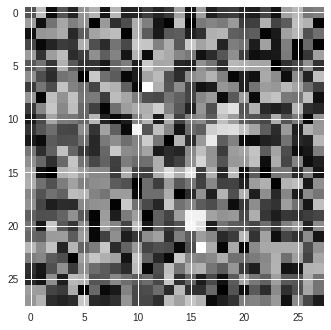

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 12.053740627722398
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


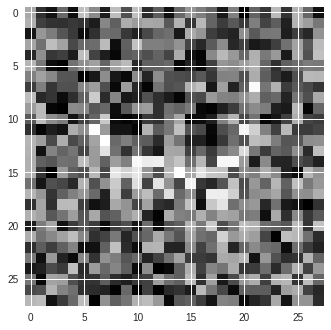

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 11.736780893680134
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


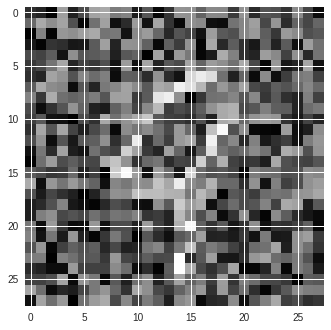

The classification label following attack is 4 from an original classification of 9
The L2 distance of the adversary is 9.804647760871529
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


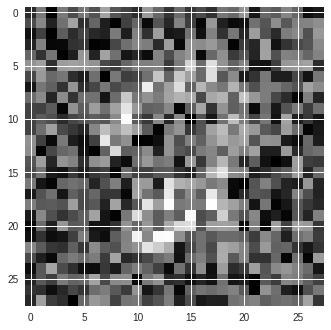

The classification label following attack is 8 from an original classification of 2
The L2 distance of the adversary is 10.180649440129821
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


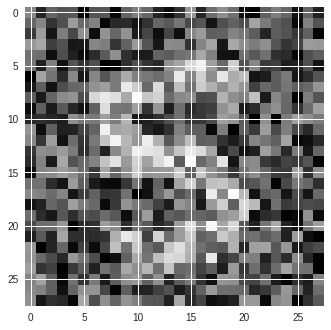

The classification label following attack is 8 from an original classification of 5
The L2 distance of the adversary is 9.97061076191583
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


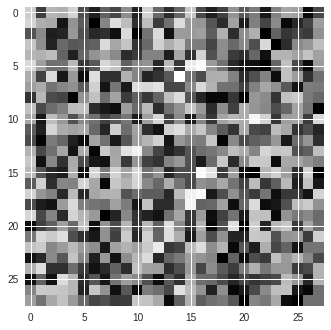

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 13.2921807394507
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


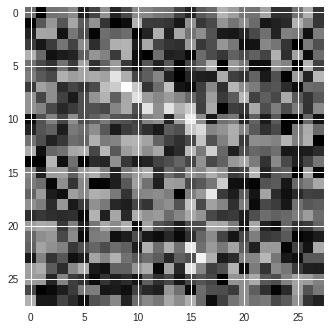

The classification label following attack is 8 from an original classification of 7
The L2 distance of the adversary is 11.175781145990403
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


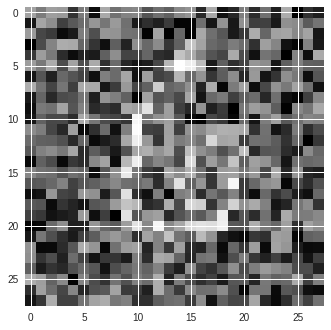

The classification label following attack is 5 from an original classification of 6
The L2 distance of the adversary is 10.642035933170803
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


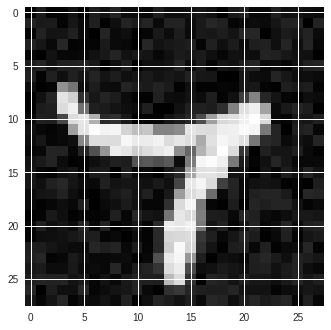

The classification label following attack is 4 from an original classification of 7
The L2 distance of the adversary is 2.415276395565727
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


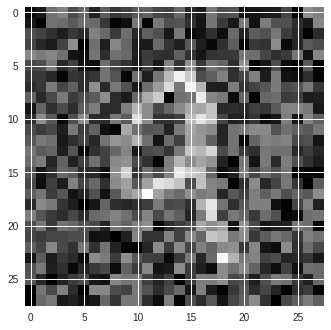

The classification label following attack is 8 from an original classification of 9
The L2 distance of the adversary is 8.712376127124394
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


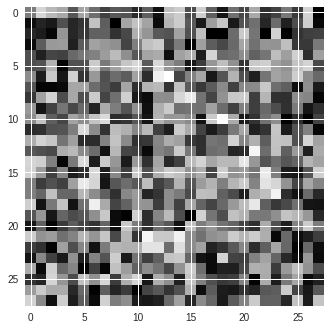

The classification label following attack is 8 from an original classification of 0
The L2 distance of the adversary is 13.013538842429211
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


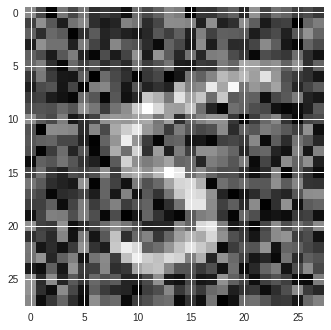

The classification label following attack is 8 from an original classification of 5
The L2 distance of the adversary is 8.788161109138725
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


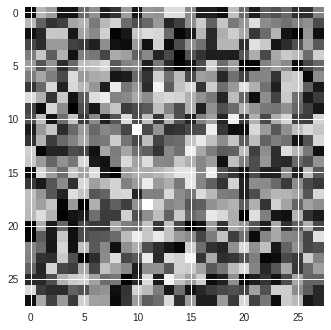

The classification label following attack is 2 from an original classification of 8
The L2 distance of the adversary is 13.216901715478624
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


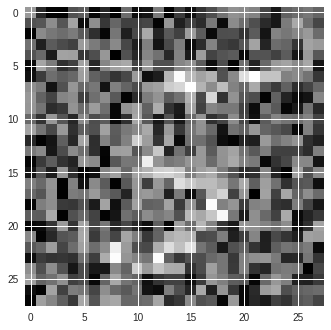

The classification label following attack is 8 from an original classification of 5
The L2 distance of the adversary is 10.620654254824005
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


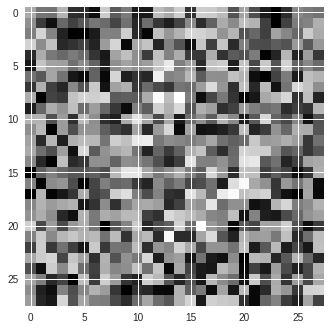

The classification label following attack is 0 from an original classification of 6
The L2 distance of the adversary is 13.519012771772529
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


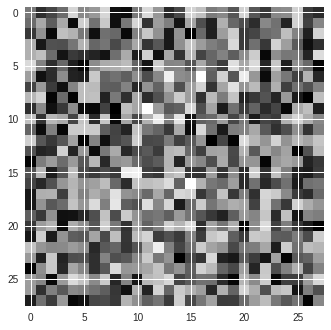

The classification label following attack is 0 from an original classification of 6
The L2 distance of the adversary is 13.658496786436483
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


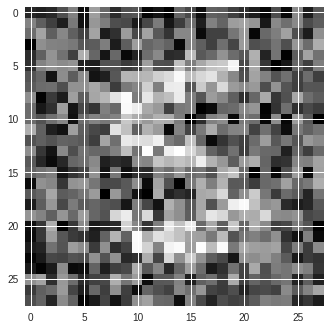

The classification label following attack is 8 from an original classification of 5
The L2 distance of the adversary is 10.647926269359457
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


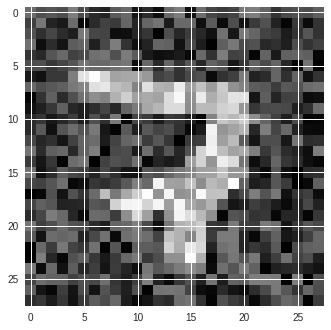

The classification label following attack is 2 from an original classification of 7
The L2 distance of the adversary is 7.686686795822297
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


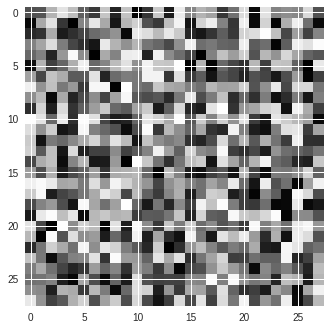

The classification label following attack is 2 from an original classification of 8
The L2 distance of the adversary is 15.878775621455361
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


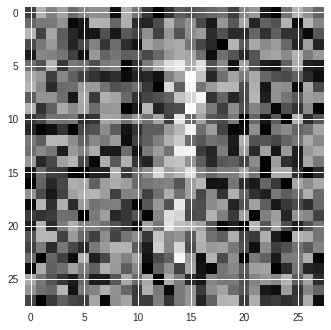

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 11.809683596940802
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


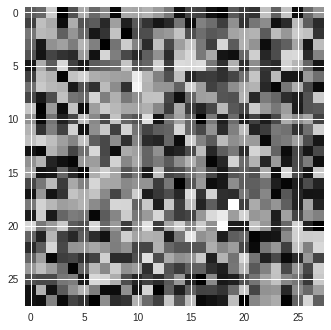

The classification label following attack is 2 from an original classification of 0
The L2 distance of the adversary is 13.117589423065976
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


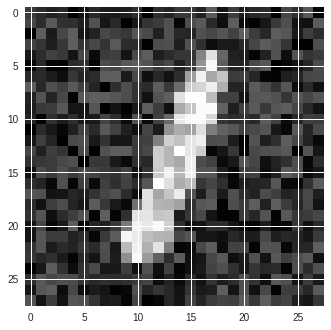

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 5.841346072478178
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


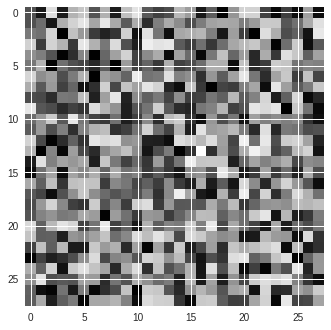

The classification label following attack is 8 from an original classification of 6
The L2 distance of the adversary is 14.268552095985862
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


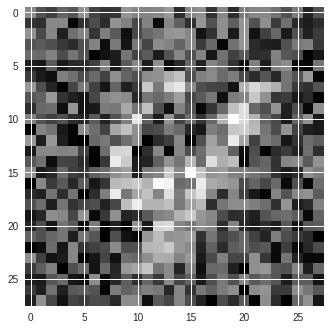

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 9.543545727283405
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


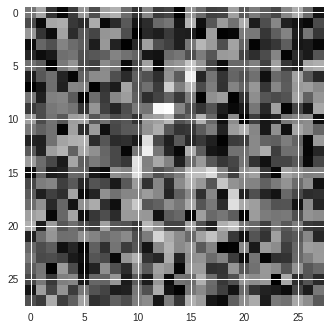

The classification label following attack is 8 from an original classification of 6
The L2 distance of the adversary is 10.47287250866219
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


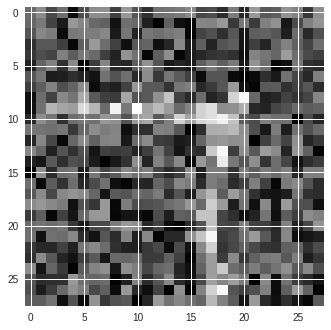

The classification label following attack is 8 from an original classification of 7
The L2 distance of the adversary is 9.517934108358219
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


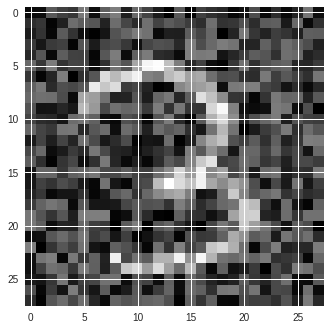

The classification label following attack is 8 from an original classification of 3
The L2 distance of the adversary is 7.704901059050045
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


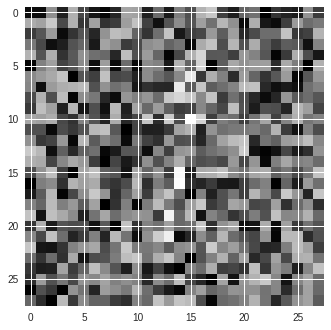

The classification label following attack is 6 from an original classification of 1
The L2 distance of the adversary is 12.445059005911146
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


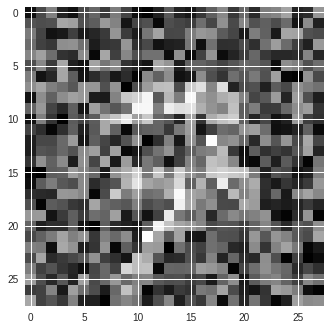

The classification label following attack is 9 from an original classification of 7
The L2 distance of the adversary is 10.111133791307362
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


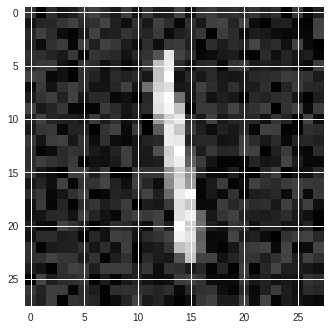

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 4.088527548017792
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


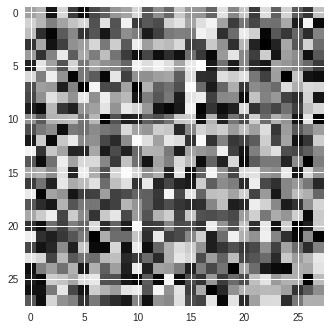

The classification label following attack is 5 from an original classification of 8
The L2 distance of the adversary is 15.05054966552487
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


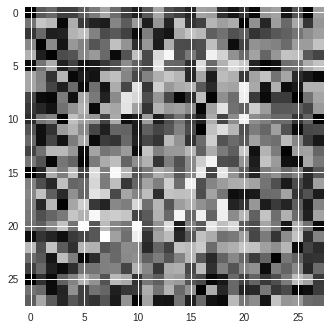

The classification label following attack is 8 from an original classification of 2
The L2 distance of the adversary is 11.991712678805271
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


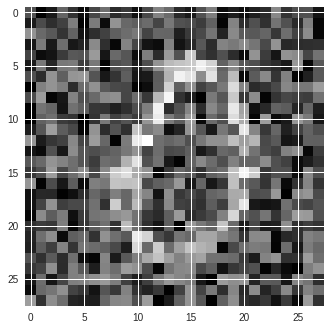

The classification label following attack is 8 from an original classification of 0
The L2 distance of the adversary is 9.621745649462616
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


The model predicted a 8 when the ground-truth label is 2


/usr/local/lib/python3.6/dist-packages/foolbox/attacks/base.py:129: UserWarning: Not running the attack because the original input is already misclassified and the adversarial thus has a distance of 0.
  warnings.warn('Not running the attack because the original input'


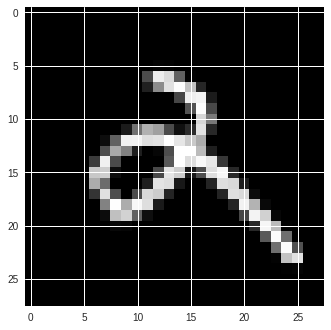

The classification label following attack is 8 from an original classification of 2
The L2 distance of the adversary is 0.0
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


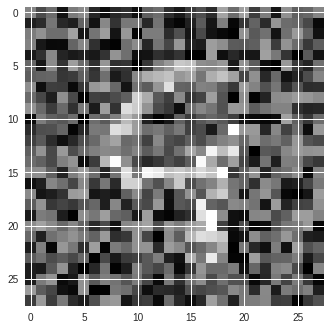

The classification label following attack is 8 from an original classification of 9
The L2 distance of the adversary is 10.063087219139396
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


The model predicted a 8 when the ground-truth label is 9


/usr/local/lib/python3.6/dist-packages/foolbox/attacks/base.py:129: UserWarning: Not running the attack because the original input is already misclassified and the adversarial thus has a distance of 0.
  warnings.warn('Not running the attack because the original input'


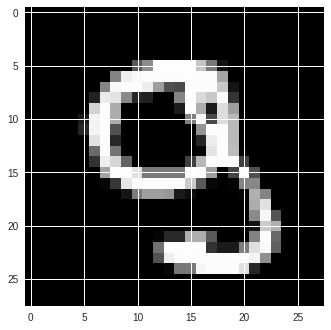

The classification label following attack is 8 from an original classification of 9
The L2 distance of the adversary is 0.0
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


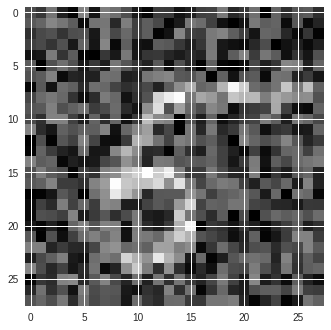

The classification label following attack is 8 from an original classification of 5
The L2 distance of the adversary is 8.35709941374814
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


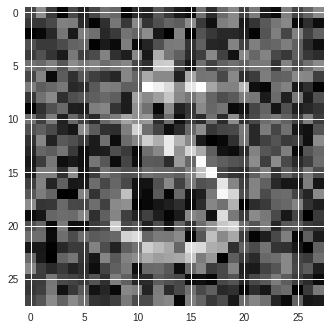

The classification label following attack is 8 from an original classification of 5
The L2 distance of the adversary is 8.805132581696427
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


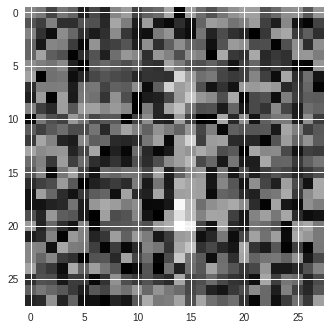

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 10.111451839259875
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


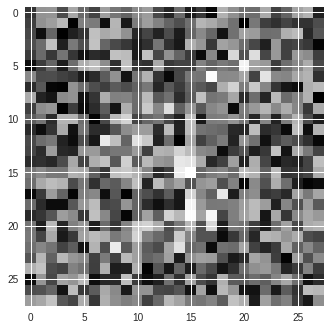

The classification label following attack is 8 from an original classification of 5
The L2 distance of the adversary is 11.976600591030534
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


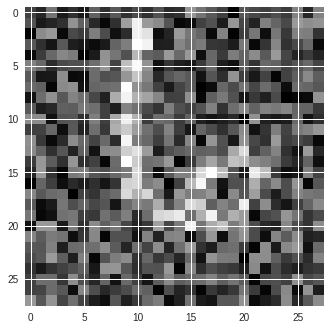

The classification label following attack is 4 from an original classification of 6
The L2 distance of the adversary is 9.253465889818676
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


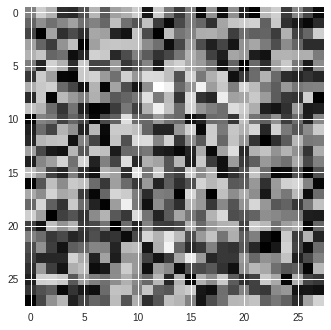

The classification label following attack is 2 from an original classification of 0
The L2 distance of the adversary is 13.369846247208484
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


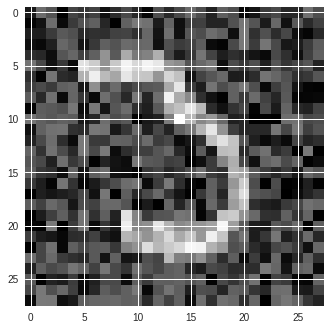

The classification label following attack is 2 from an original classification of 3
The L2 distance of the adversary is 7.537843861540268
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


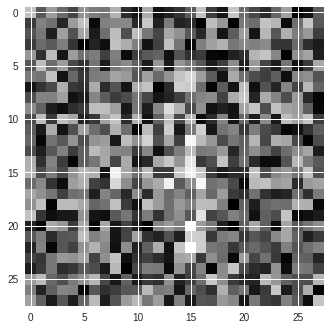

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 11.83935903589057
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


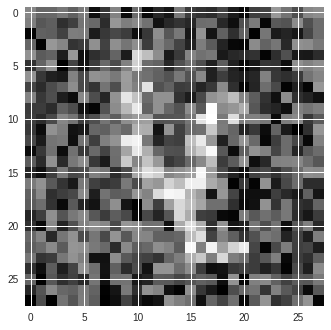

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 9.452545761149542
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


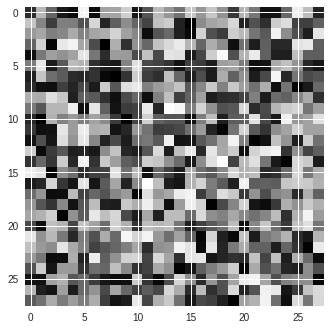

The classification label following attack is 8 from an original classification of 6
The L2 distance of the adversary is 14.424436523202504
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


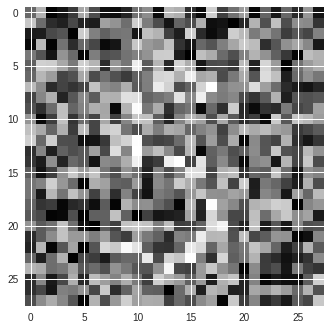

The classification label following attack is 8 from an original classification of 5
The L2 distance of the adversary is 12.636010762161764
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


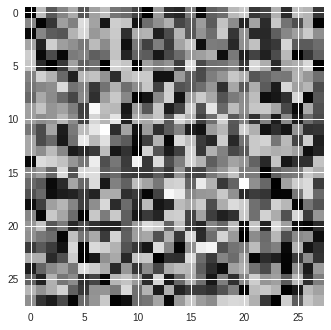

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 13.95052700960598
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


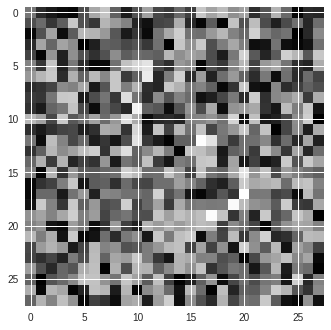

The classification label following attack is 7 from an original classification of 6
The L2 distance of the adversary is 12.635264754767563
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


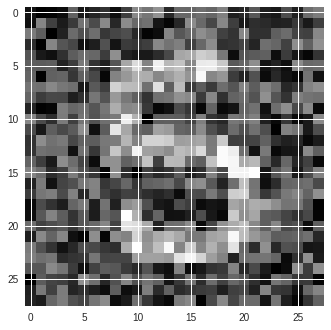

The classification label following attack is 8 from an original classification of 5
The L2 distance of the adversary is 8.635234278948937
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


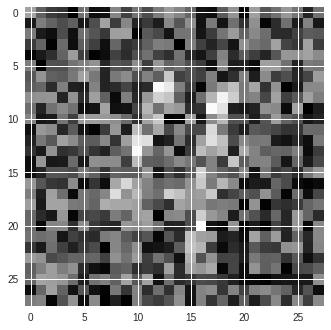

The classification label following attack is 9 from an original classification of 4
The L2 distance of the adversary is 10.097173442507323
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


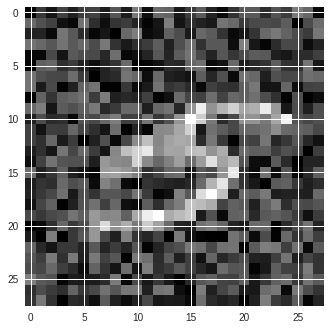

The classification label following attack is 4 from an original classification of 5
The L2 distance of the adversary is 7.567094993014792
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


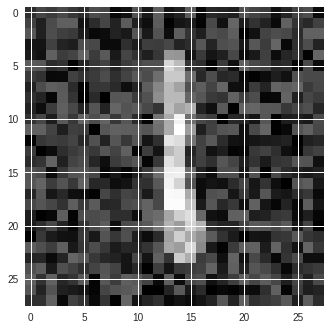

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 6.386976200129864
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


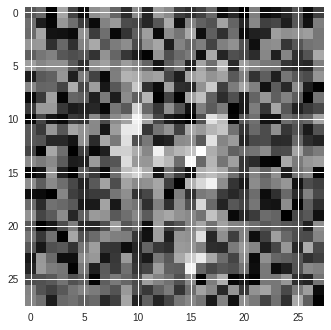

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 10.32360257419381
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


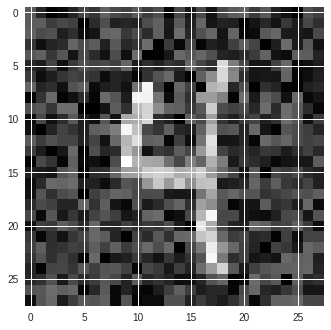

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 6.6547476059233945
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


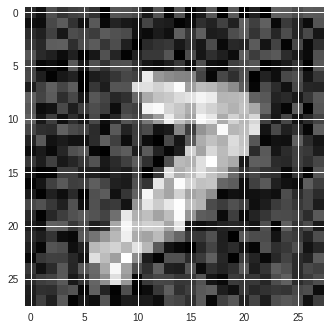

The classification label following attack is 2 from an original classification of 7
The L2 distance of the adversary is 6.049410436751011
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


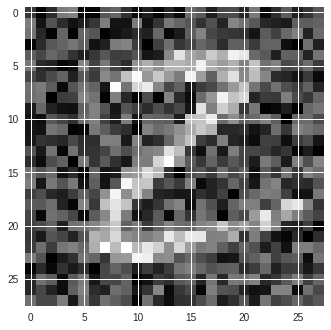

The classification label following attack is 8 from an original classification of 2
The L2 distance of the adversary is 8.072004014880855
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


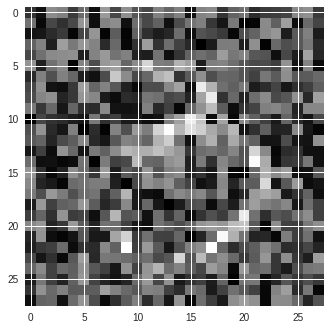

The classification label following attack is 8 from an original classification of 3
The L2 distance of the adversary is 9.568527594222914
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


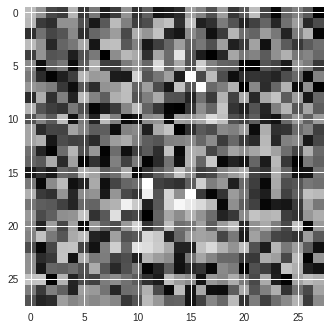

The classification label following attack is 8 from an original classification of 2
The L2 distance of the adversary is 12.136800178162897
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


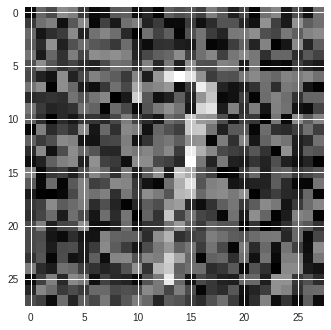

The classification label following attack is 1 from an original classification of 7
The L2 distance of the adversary is 7.535778262585194
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


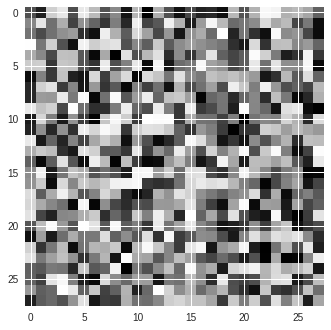

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 14.45509228259052
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


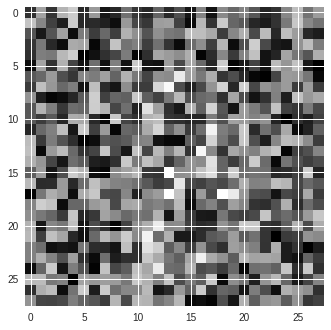

The classification label following attack is 2 from an original classification of 8
The L2 distance of the adversary is 12.597818027236364
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


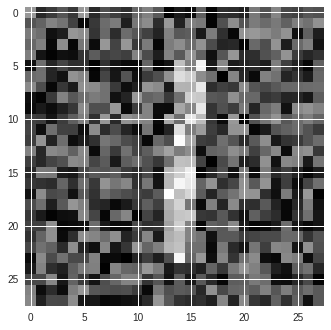

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 9.032482395184443
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


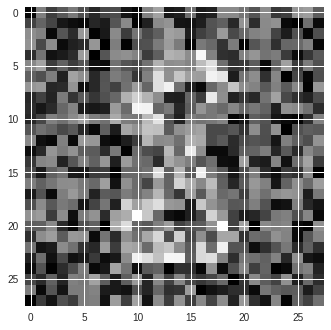

The classification label following attack is 2 from an original classification of 8
The L2 distance of the adversary is 10.015110497141224
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


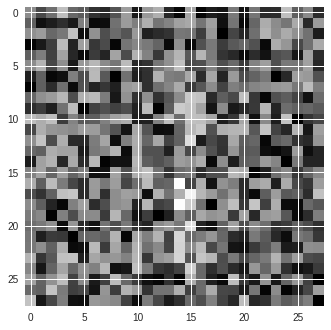

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 12.197542298726036
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


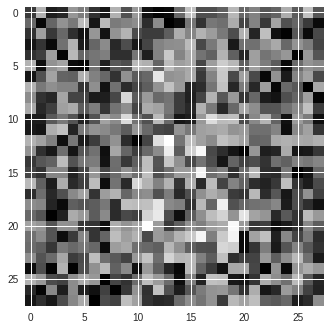

The classification label following attack is 6 from an original classification of 8
The L2 distance of the adversary is 11.774143566342248
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


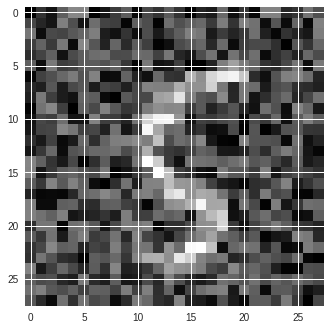

The classification label following attack is 8 from an original classification of 5
The L2 distance of the adversary is 8.410499496265523
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


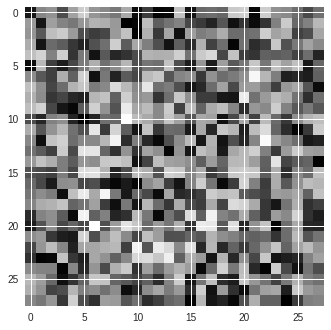

The classification label following attack is 5 from an original classification of 0
The L2 distance of the adversary is 12.972876811831116
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


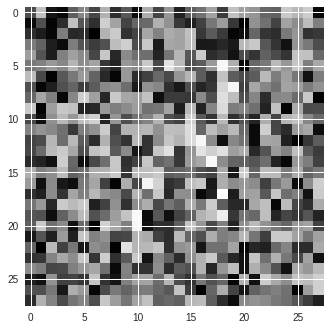

The classification label following attack is 4 from an original classification of 8
The L2 distance of the adversary is 12.86520388745835
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


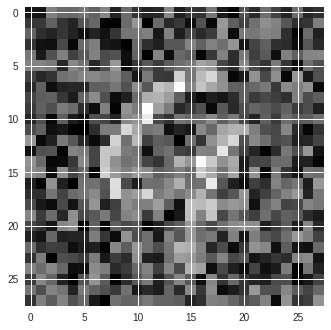

The classification label following attack is 8 from an original classification of 9
The L2 distance of the adversary is 9.353303228470756
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


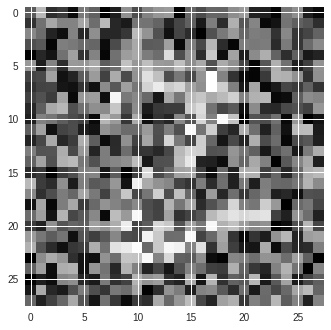

The classification label following attack is 0 from an original classification of 2
The L2 distance of the adversary is 11.336176384409974
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


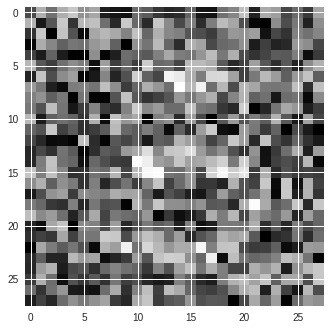

The classification label following attack is 8 from an original classification of 5
The L2 distance of the adversary is 11.45038593021604
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


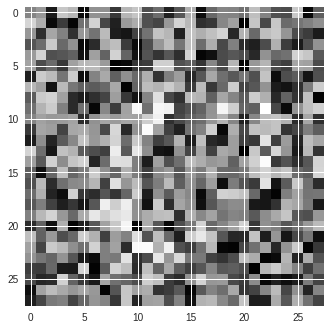

The classification label following attack is 2 from an original classification of 0
The L2 distance of the adversary is 13.251864616909854
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


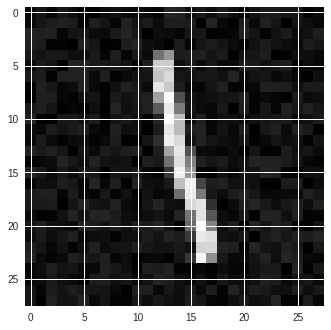

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 2.2690805434306354
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


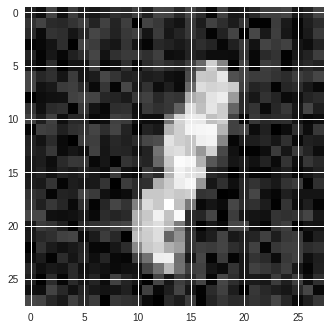

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 4.433864098774493
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


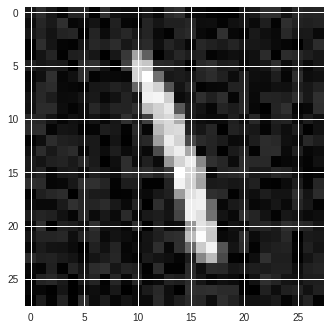

The classification label following attack is 5 from an original classification of 1
The L2 distance of the adversary is 2.974163973134733
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


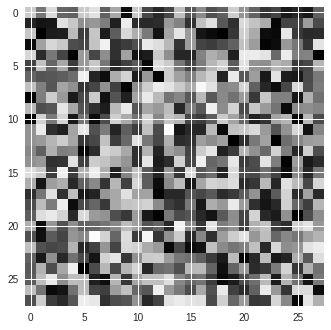

The classification label following attack is 8 from an original classification of 0
The L2 distance of the adversary is 14.055428415353665
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


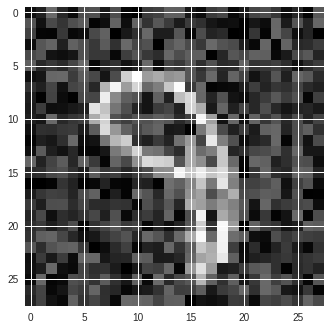

The classification label following attack is 8 from an original classification of 9
The L2 distance of the adversary is 6.319735501634074
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


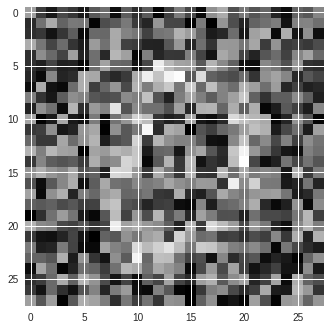

The classification label following attack is 8 from an original classification of 0
The L2 distance of the adversary is 11.023258125971497
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


The model predicted a 8 when the ground-truth label is 3


/usr/local/lib/python3.6/dist-packages/foolbox/attacks/base.py:129: UserWarning: Not running the attack because the original input is already misclassified and the adversarial thus has a distance of 0.
  warnings.warn('Not running the attack because the original input'


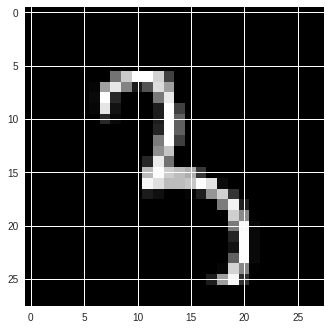

The classification label following attack is 8 from an original classification of 3
The L2 distance of the adversary is 0.0
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


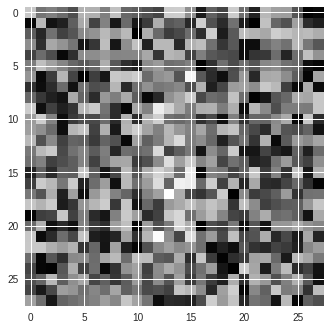

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 12.447091027081488
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


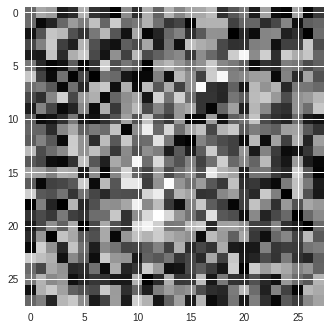

The classification label following attack is 8 from an original classification of 6
The L2 distance of the adversary is 12.563917309116546
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


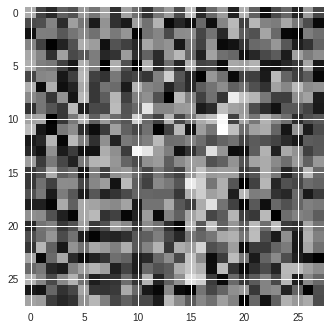

The classification label following attack is 2 from an original classification of 4
The L2 distance of the adversary is 11.759022327568996
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


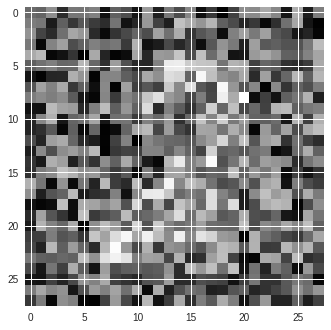

The classification label following attack is 8 from an original classification of 2
The L2 distance of the adversary is 11.825515762859517
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


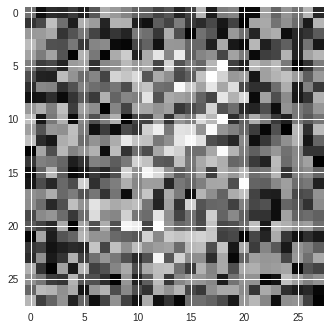

The classification label following attack is 5 from an original classification of 3
The L2 distance of the adversary is 12.099510942814673
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


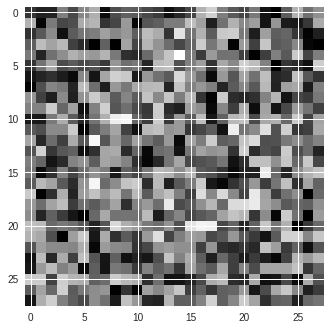

The classification label following attack is 2 from an original classification of 6
The L2 distance of the adversary is 12.815157495821506
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


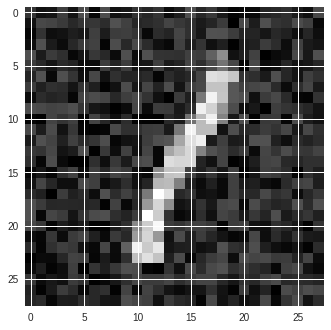

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 4.904734962411967
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


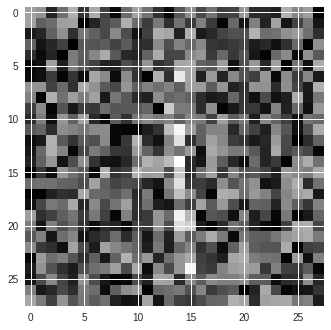

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 10.392634872717261
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


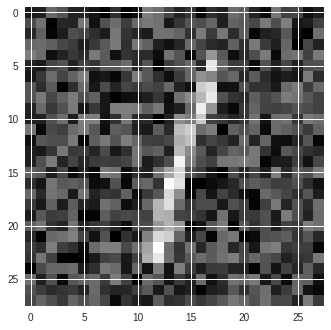

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 7.943883493123599
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


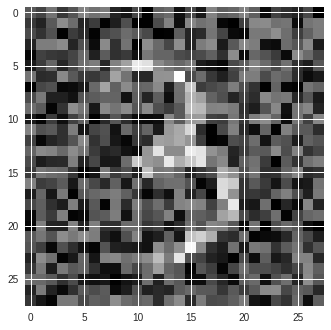

The classification label following attack is 8 from an original classification of 3
The L2 distance of the adversary is 8.812577879535588
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


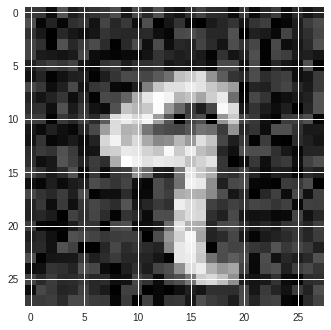

The classification label following attack is 8 from an original classification of 9
The L2 distance of the adversary is 5.096975676055689
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


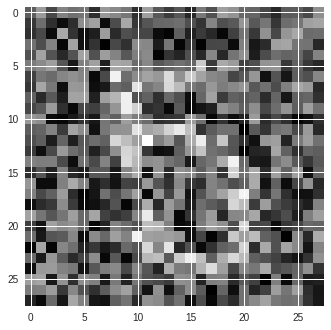

The classification label following attack is 8 from an original classification of 5
The L2 distance of the adversary is 10.461354070291272
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


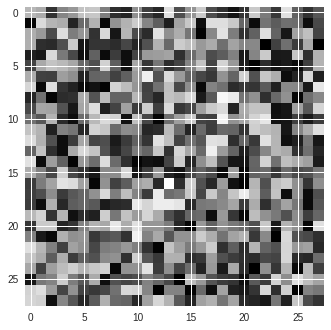

The classification label following attack is 8 from an original classification of 2
The L2 distance of the adversary is 13.439485225786196
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


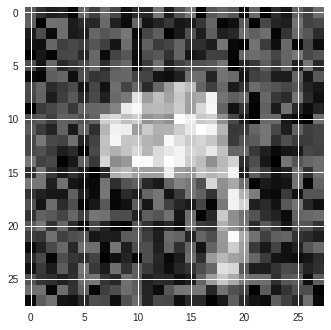

The classification label following attack is 4 from an original classification of 9
The L2 distance of the adversary is 7.423171891304776
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


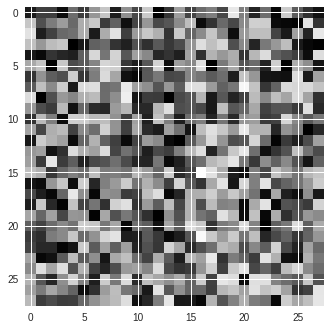

The classification label following attack is 2 from an original classification of 4
The L2 distance of the adversary is 13.677163172475217
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


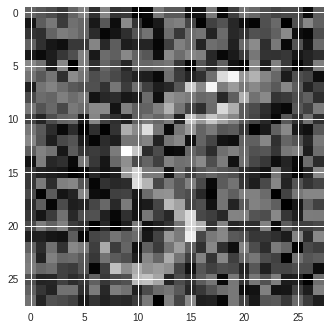

The classification label following attack is 8 from an original classification of 5
The L2 distance of the adversary is 8.604211203870914
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


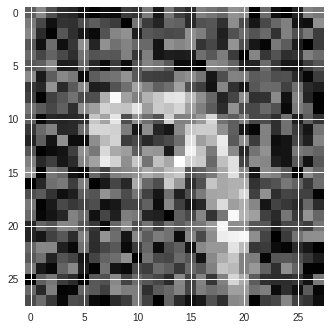

The classification label following attack is 8 from an original classification of 9
The L2 distance of the adversary is 8.98329329204425
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


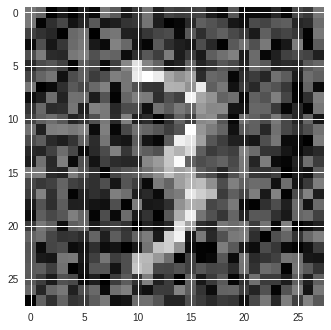

The classification label following attack is 8 from an original classification of 3
The L2 distance of the adversary is 7.834594091013507
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


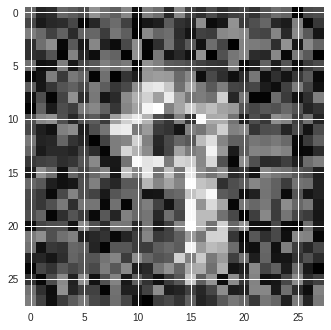

The classification label following attack is 8 from an original classification of 9
The L2 distance of the adversary is 8.80605342280896
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


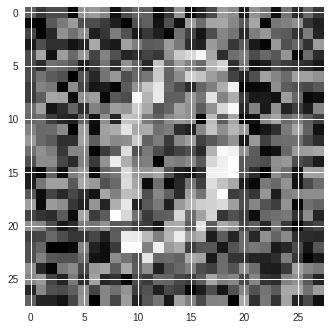

The classification label following attack is 4 from an original classification of 0
The L2 distance of the adversary is 10.300072976576557
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


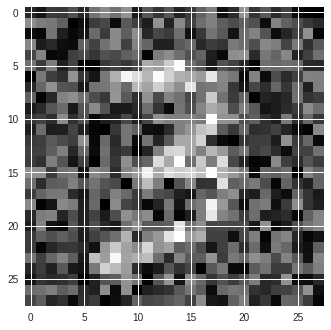

The classification label following attack is 8 from an original classification of 3
The L2 distance of the adversary is 8.82509246459605
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


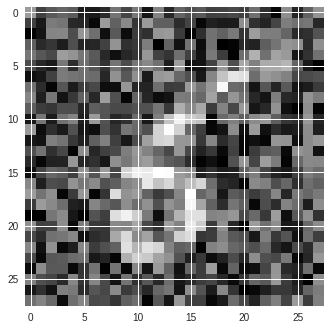

The classification label following attack is 5 from an original classification of 6
The L2 distance of the adversary is 9.413325186590395
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


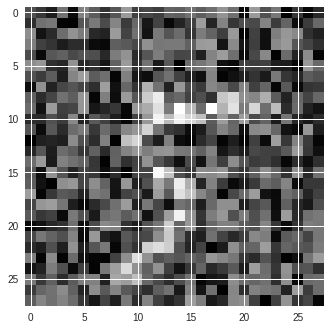

The classification label following attack is 8 from an original classification of 5
The L2 distance of the adversary is 9.443537018453332
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


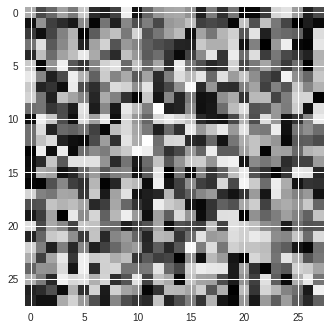

The classification label following attack is 8 from an original classification of 5
The L2 distance of the adversary is 14.989700237470323
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


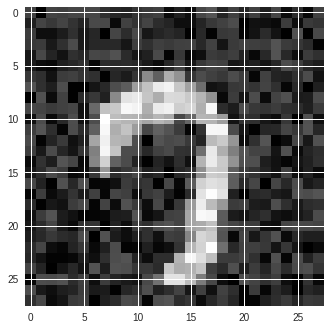

The classification label following attack is 9 from an original classification of 7
The L2 distance of the adversary is 5.251891982038736
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


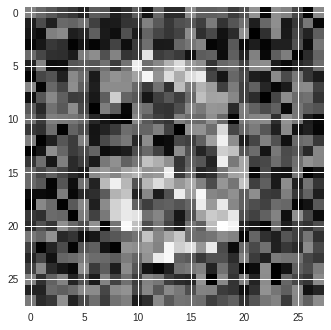

The classification label following attack is 8 from an original classification of 2
The L2 distance of the adversary is 9.05253249515786
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


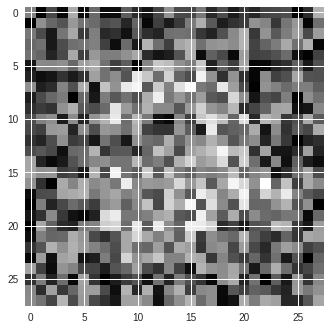

The classification label following attack is 8 from an original classification of 2
The L2 distance of the adversary is 11.233879432331173
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


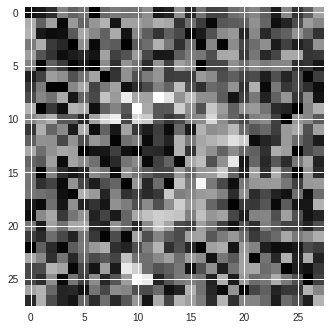

The classification label following attack is 2 from an original classification of 7
The L2 distance of the adversary is 10.924336686696927
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


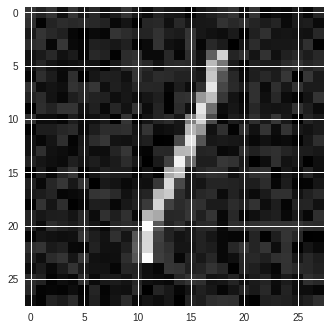

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 3.318810352856011
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


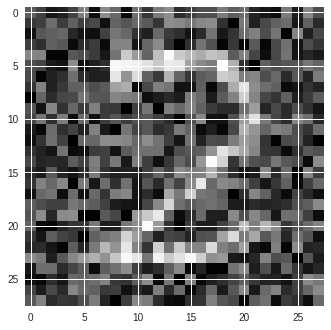

The classification label following attack is 8 from an original classification of 2
The L2 distance of the adversary is 8.41822174758538
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


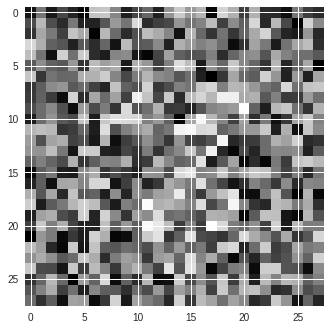

The classification label following attack is 2 from an original classification of 8
The L2 distance of the adversary is 12.702455424100734
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


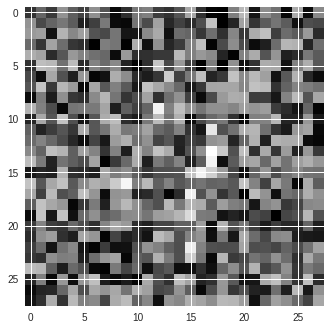

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 11.590029152830875
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


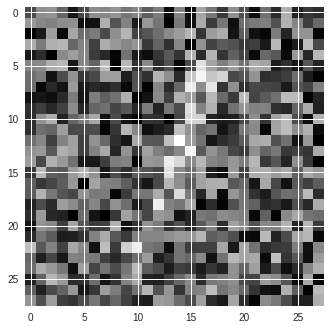

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 11.003918383534186
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


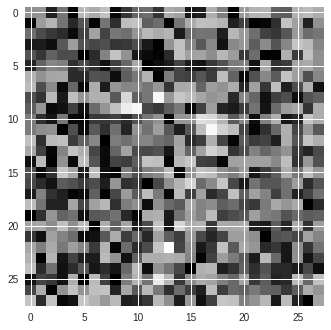

The classification label following attack is 8 from an original classification of 7
The L2 distance of the adversary is 12.257577891945305
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


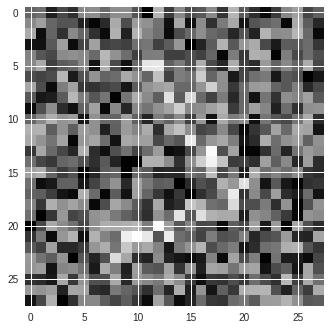

The classification label following attack is 8 from an original classification of 3
The L2 distance of the adversary is 11.633610368242731
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


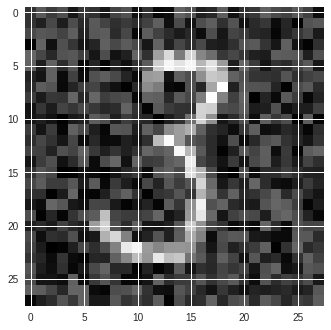

The classification label following attack is 8 from an original classification of 3
The L2 distance of the adversary is 6.134712739829916
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


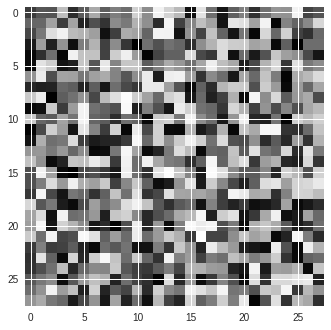

The classification label following attack is 6 from an original classification of 8
The L2 distance of the adversary is 15.163087579453322
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


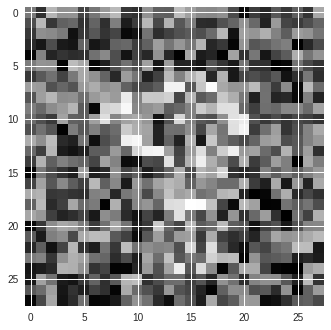

The classification label following attack is 9 from an original classification of 8
The L2 distance of the adversary is 11.313472254721185
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


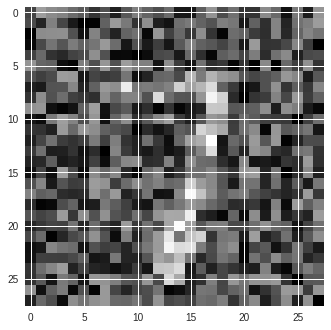

The classification label following attack is 2 from an original classification of 7
The L2 distance of the adversary is 9.532366000916783
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


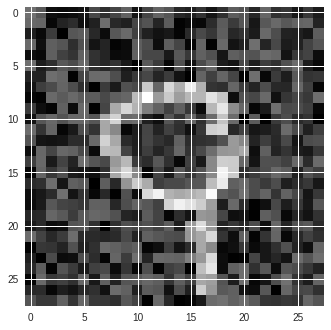

The classification label following attack is 7 from an original classification of 9
The L2 distance of the adversary is 6.810241085178044
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


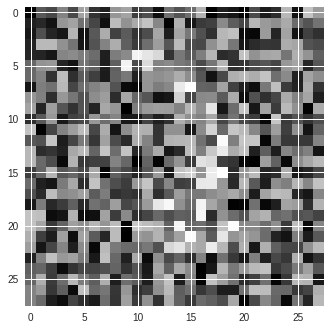

The classification label following attack is 8 from an original classification of 2
The L2 distance of the adversary is 12.446845850747335
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


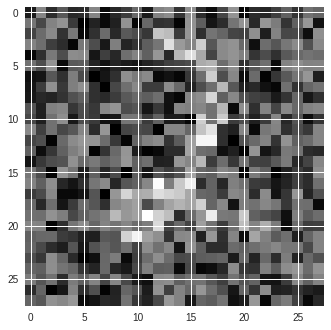

The classification label following attack is 8 from an original classification of 2
The L2 distance of the adversary is 9.58146474303501
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


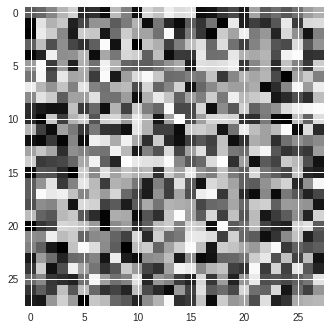

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 14.605039323590296
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


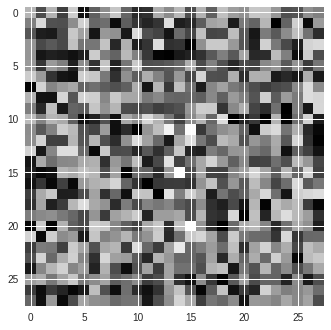

The classification label following attack is 0 from an original classification of 1
The L2 distance of the adversary is 13.893522365458828
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


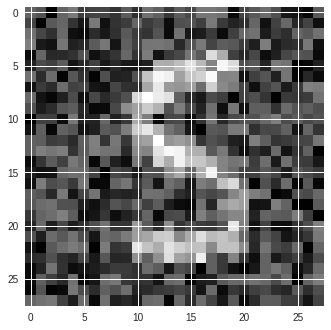

The classification label following attack is 8 from an original classification of 5
The L2 distance of the adversary is 7.861463514677768
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


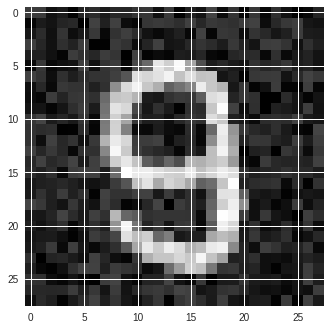

The classification label following attack is 8 from an original classification of 9
The L2 distance of the adversary is 4.1532639522765225
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


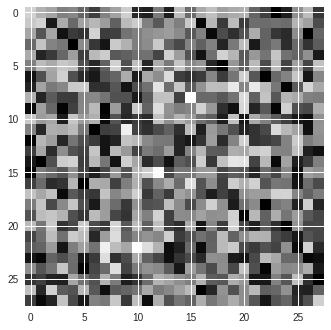

The classification label following attack is 2 from an original classification of 8
The L2 distance of the adversary is 13.281412800615191
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


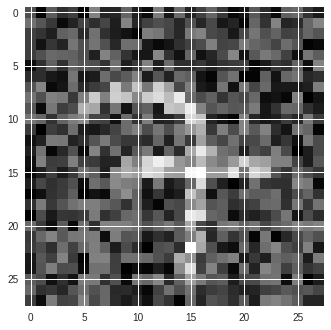

The classification label following attack is 8 from an original classification of 7
The L2 distance of the adversary is 8.321553254890699
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


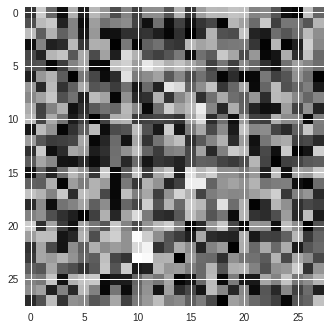

The classification label following attack is 4 from an original classification of 2
The L2 distance of the adversary is 12.707251980631534
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


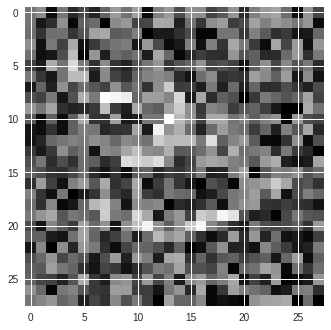

The classification label following attack is 5 from an original classification of 3
The L2 distance of the adversary is 9.820132561293027
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


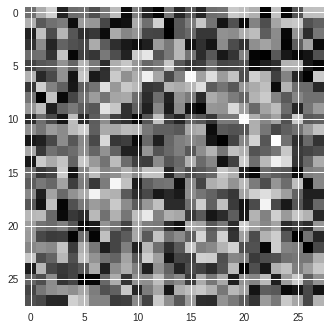

The classification label following attack is 8 from an original classification of 0
The L2 distance of the adversary is 12.473201779319453
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


The model predicted a 6 when the ground-truth label is 4


/usr/local/lib/python3.6/dist-packages/foolbox/attacks/base.py:129: UserWarning: Not running the attack because the original input is already misclassified and the adversarial thus has a distance of 0.
  warnings.warn('Not running the attack because the original input'


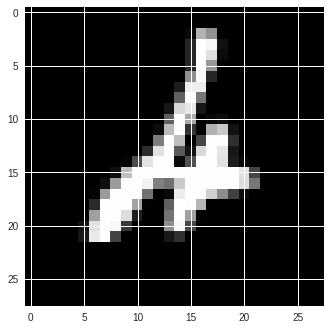

The classification label following attack is 6 from an original classification of 4
The L2 distance of the adversary is 0.0
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


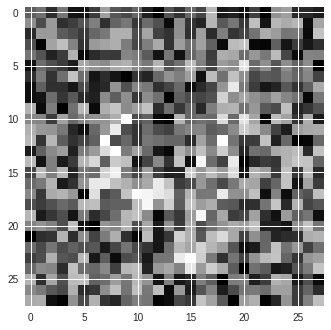

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 11.993451555382157
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


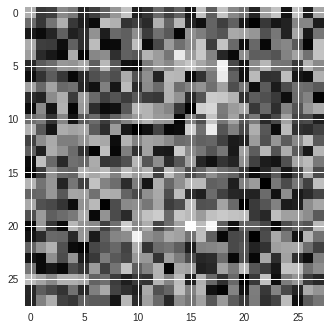

The classification label following attack is 6 from an original classification of 2
The L2 distance of the adversary is 11.543465235956603
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


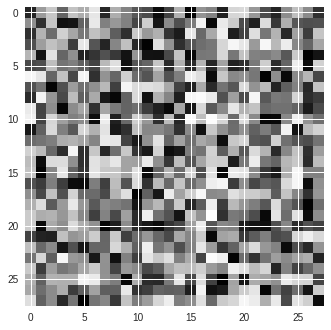

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 15.266412323323928
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


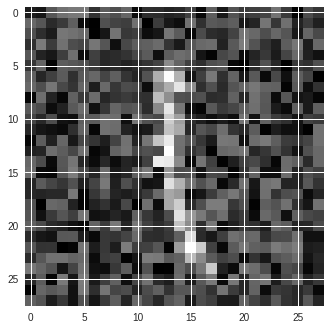

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 7.3007861708265
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


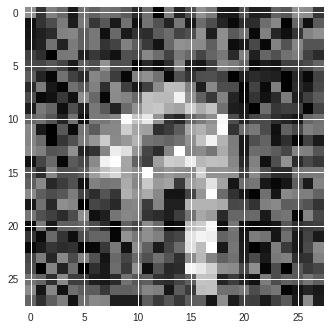

The classification label following attack is 4 from an original classification of 9
The L2 distance of the adversary is 8.920894207935559
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


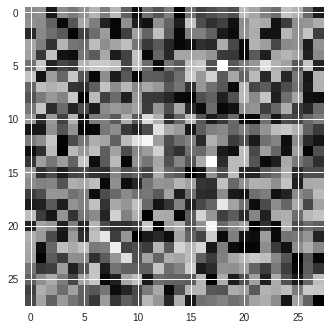

The classification label following attack is 8 from an original classification of 5
The L2 distance of the adversary is 12.165146898874662
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


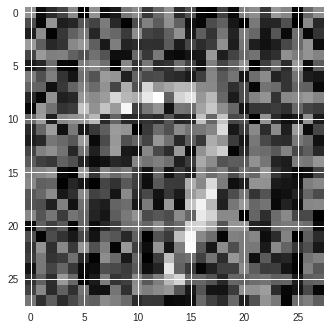

The classification label following attack is 2 from an original classification of 7
The L2 distance of the adversary is 9.531397165460007
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


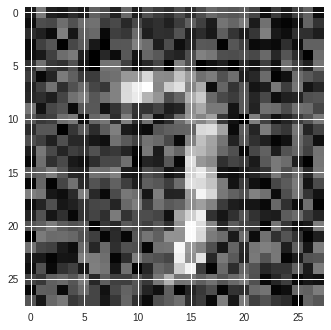

The classification label following attack is 8 from an original classification of 7
The L2 distance of the adversary is 7.8504805136714655
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


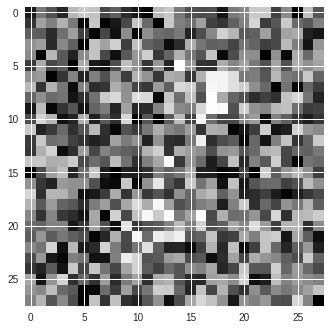

The classification label following attack is 0 from an original classification of 2
The L2 distance of the adversary is 12.944174329431734
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


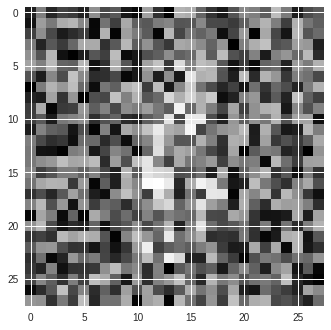

The classification label following attack is 0 from an original classification of 8
The L2 distance of the adversary is 11.937701202730066
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


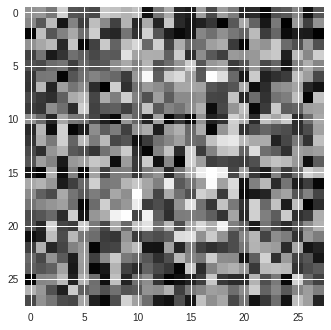

The classification label following attack is 8 from an original classification of 2
The L2 distance of the adversary is 12.947699196543153
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


The model predicted a 0 when the ground-truth label is 6


/usr/local/lib/python3.6/dist-packages/foolbox/attacks/base.py:129: UserWarning: Not running the attack because the original input is already misclassified and the adversarial thus has a distance of 0.
  warnings.warn('Not running the attack because the original input'


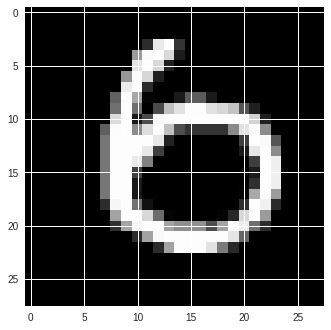

The classification label following attack is 0 from an original classification of 6
The L2 distance of the adversary is 0.0
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


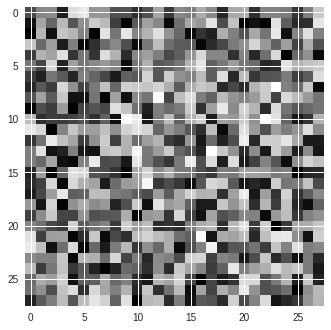

The classification label following attack is 0 from an original classification of 8
The L2 distance of the adversary is 14.192069146346604
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


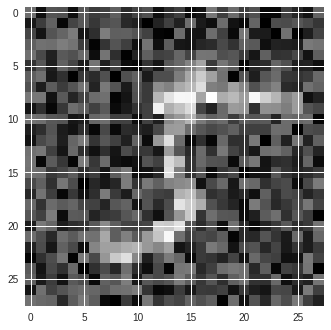

The classification label following attack is 1 from an original classification of 5
The L2 distance of the adversary is 7.694188567301624
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


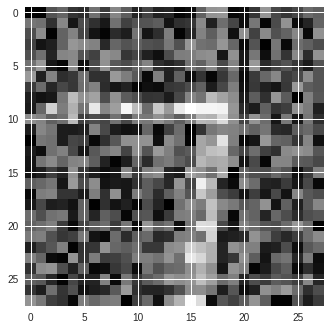

The classification label following attack is 8 from an original classification of 7
The L2 distance of the adversary is 9.35457939736278
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


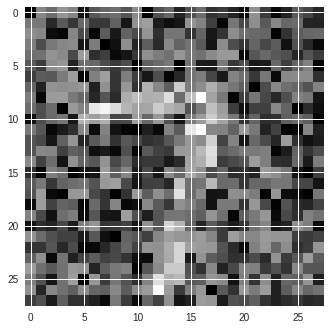

The classification label following attack is 8 from an original classification of 7
The L2 distance of the adversary is 9.854008775913282
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


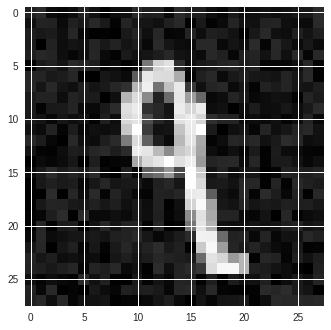

The classification label following attack is 4 from an original classification of 9
The L2 distance of the adversary is 2.7151438930878835
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


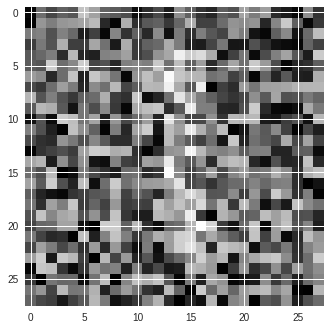

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 12.009876617884908
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


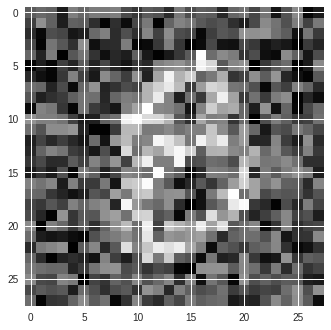

The classification label following attack is 0 from an original classification of 8
The L2 distance of the adversary is 9.098376710666049
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


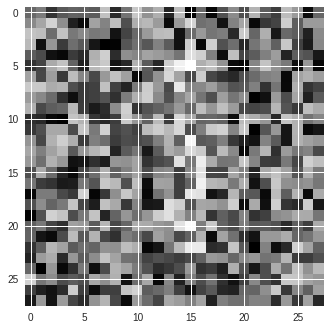

The classification label following attack is 5 from an original classification of 1
The L2 distance of the adversary is 12.626868900417342
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


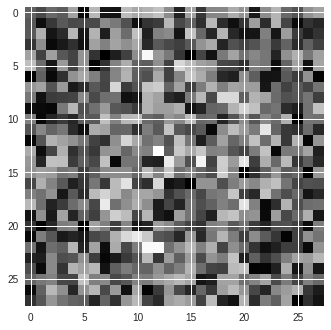

The classification label following attack is 0 from an original classification of 8
The L2 distance of the adversary is 11.471412561962982
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


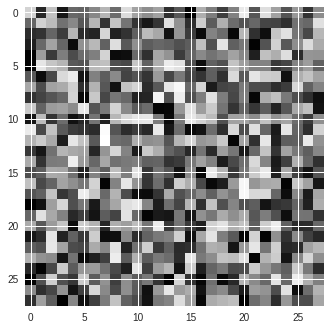

The classification label following attack is 4 from an original classification of 0
The L2 distance of the adversary is 13.780776156611747
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


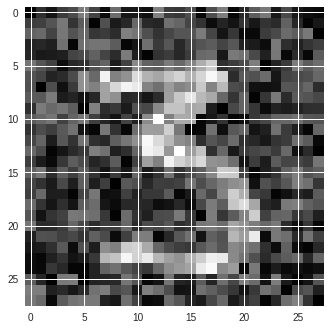

The classification label following attack is 5 from an original classification of 3
The L2 distance of the adversary is 7.723546035047329
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


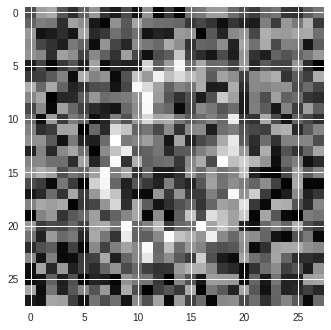

The classification label following attack is 6 from an original classification of 0
The L2 distance of the adversary is 10.846206042638105
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


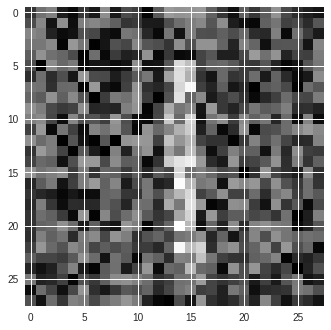

The classification label following attack is 4 from an original classification of 1
The L2 distance of the adversary is 9.57631572243314
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


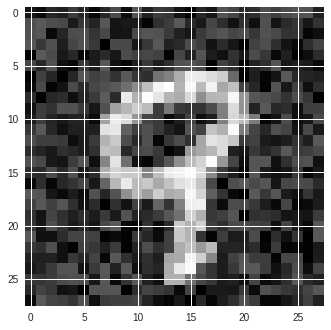

The classification label following attack is 8 from an original classification of 9
The L2 distance of the adversary is 5.5706681234475734
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


The model predicted a 3 when the ground-truth label is 9


/usr/local/lib/python3.6/dist-packages/foolbox/attacks/base.py:129: UserWarning: Not running the attack because the original input is already misclassified and the adversarial thus has a distance of 0.
  warnings.warn('Not running the attack because the original input'


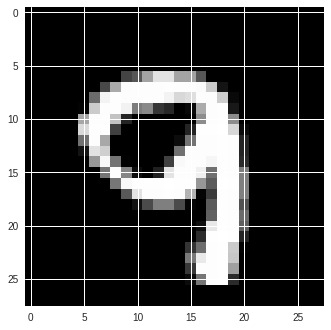

The classification label following attack is 3 from an original classification of 9
The L2 distance of the adversary is 0.0
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


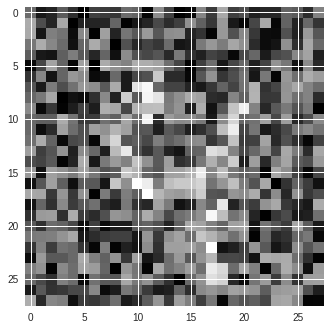

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 10.836825067440353
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


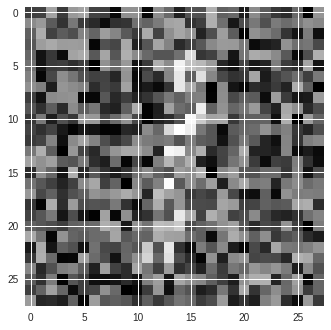

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 11.071382030036766
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


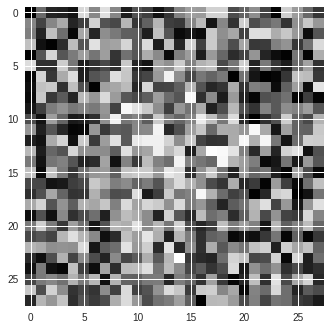

The classification label following attack is 4 from an original classification of 8
The L2 distance of the adversary is 13.45208484596519
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


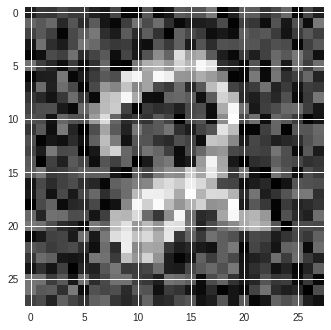

The classification label following attack is 8 from an original classification of 2
The L2 distance of the adversary is 7.413138668993951
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


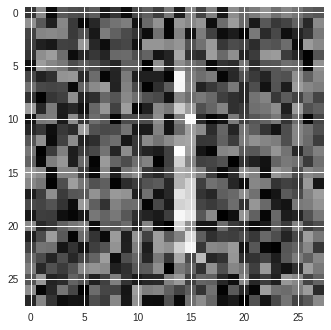

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 9.808390400583646
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


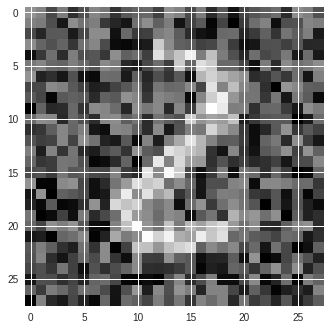

The classification label following attack is 8 from an original classification of 2
The L2 distance of the adversary is 9.329671693515527
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


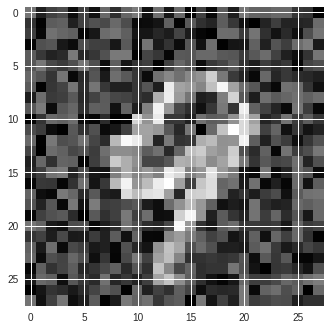

The classification label following attack is 4 from an original classification of 9
The L2 distance of the adversary is 7.625905154102848
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


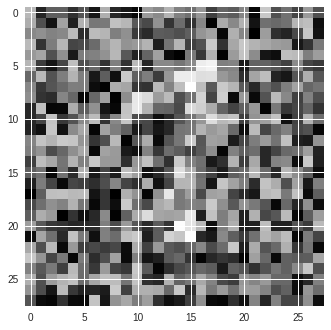

The classification label following attack is 0 from an original classification of 7
The L2 distance of the adversary is 12.193937265360928
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


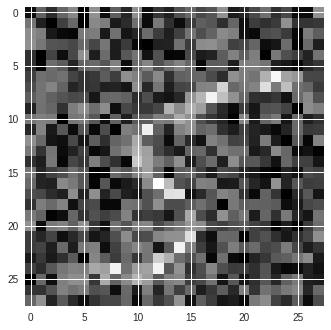

The classification label following attack is 4 from an original classification of 5
The L2 distance of the adversary is 8.79051540203402
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


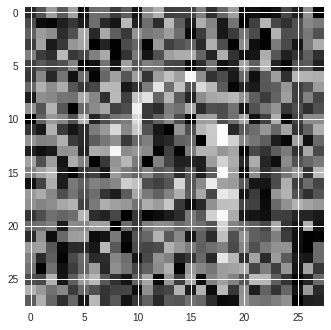

The classification label following attack is 8 from an original classification of 9
The L2 distance of the adversary is 10.94080273429607
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


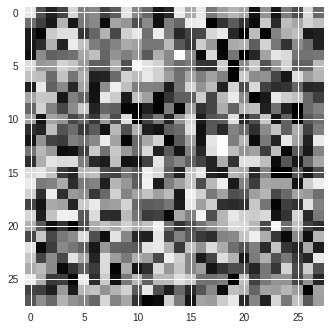

The classification label following attack is 8 from an original classification of 2
The L2 distance of the adversary is 14.412618387863189
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


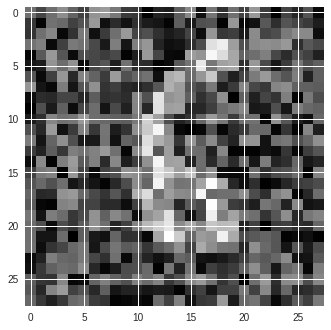

The classification label following attack is 8 from an original classification of 6
The L2 distance of the adversary is 9.203586290759638
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


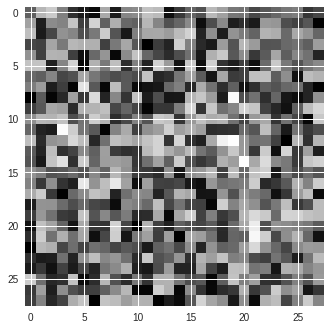

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 12.981863860529543
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


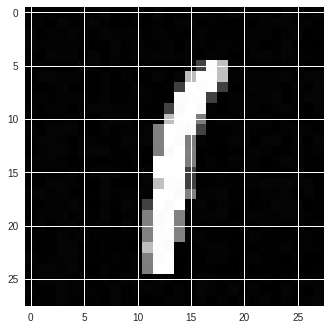

The classification label following attack is 8 from an original classification of 1
The L2 distance of the adversary is 0.332855908753846
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


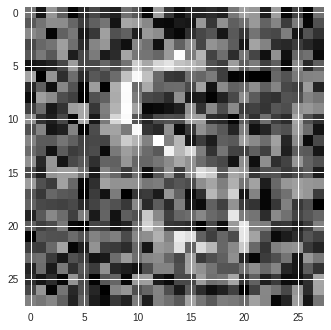

The classification label following attack is 8 from an original classification of 5
The L2 distance of the adversary is 9.789658672018906
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


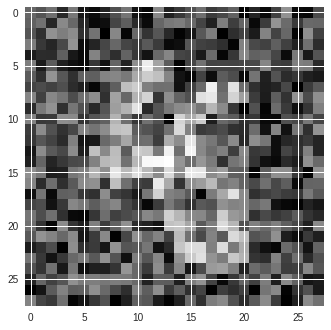

The classification label following attack is 5 from an original classification of 8
The L2 distance of the adversary is 9.079267481750218
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


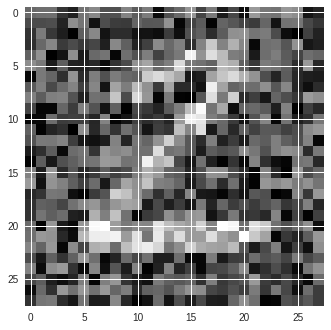

The classification label following attack is 8 from an original classification of 2
The L2 distance of the adversary is 8.987461303434566
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


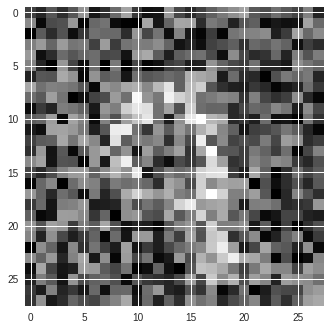

The classification label following attack is 4 from an original classification of 9
The L2 distance of the adversary is 10.377642984757744
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


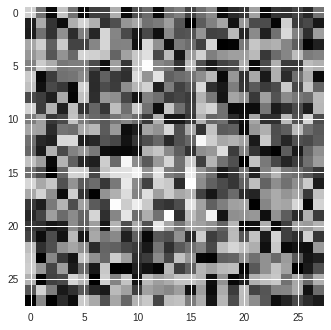

The classification label following attack is 8 from an original classification of 2
The L2 distance of the adversary is 12.958794580756717
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


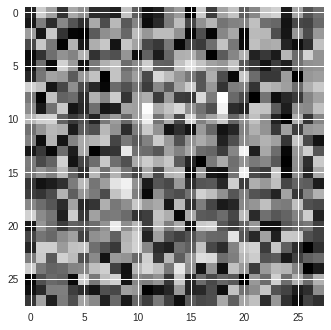

The classification label following attack is 2 from an original classification of 0
The L2 distance of the adversary is 13.087279169286301
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


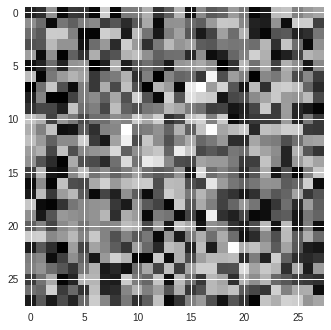

The classification label following attack is 8 from an original classification of 4
The L2 distance of the adversary is 13.253872424530005
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


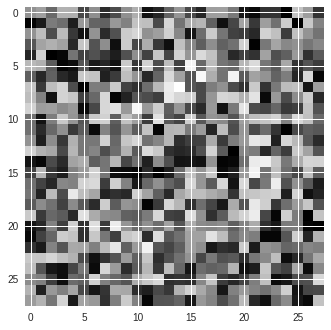

The classification label following attack is 5 from an original classification of 0
The L2 distance of the adversary is 13.094296536755179
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


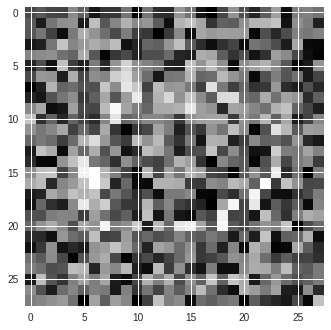

The classification label following attack is 8 from an original classification of 0
The L2 distance of the adversary is 11.934254744803408
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


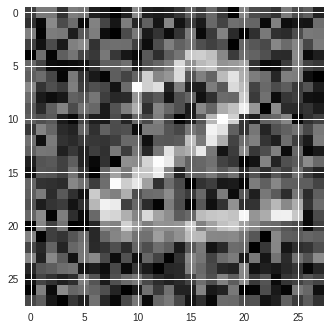

The classification label following attack is 8 from an original classification of 2
The L2 distance of the adversary is 8.472338198712837
INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


INFO:tensorflow:Restoring parameters from /Binding_CNN.ckpt


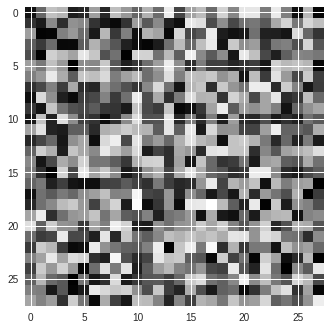

The classification label following attack is 1 from an original classification of 8
The L2 distance of the adversary is 14.153148528122012


In [0]:
adversary_found, adversary_distance, adversary_arrays = evaluate_BlendedUniformNoiseAttack_resistance_CustomModel(
    model_prediction_function=cnn_binding_predictions, model_weights="/Binding_CNN.ckpt", var_list=var_list_Binding,
    num_images_to_attack=num_images_to_attack, temp_batch_size=1)

In [0]:
success_ratio = np.sum(adversary_found)/num_images_to_attack
Binding_mean, Binding_var, Binding_std = scipy.stats.bayes_mvs(adversary_distance)

print("The success ratio is " + str(success_ratio))
print("Mean: " + str(Binding_mean))
print("Variance: " + str(Binding_var))
print("Standard deviation: " + str(Binding_std))


The success ratio is 1.0
Mean: Mean(statistic=10.004587448571757, minmax=(9.695138989697181, 10.314035907446332))
Variance: Variance(statistic=10.623381415525435, minmax=(9.270896511046079, 12.137720029541542))
Standard deviation: Std_dev(statistic=3.2566105101153706, minmax=(3.0448146923985506, 3.483923080313563))


In [0]:
adversary_found, adversary_distance, adversary_arrays = evaluate_BlendedUniformNoiseAttack_resistance_MadryModel(num_images_to_attack)

The L2 distance of the adversary is 8.110149282059432
The L2 distance of the adversary is 9.5880611080833
The L2 distance of the adversary is 7.3802022870233035
The L2 distance of the adversary is 14.107063795752936
The L2 distance of the adversary is 8.297772019829116
The L2 distance of the adversary is 8.173115024649812
The L2 distance of the adversary is 6.618812217631692
The L2 distance of the adversary is 7.106684359366931
The L2 distance of the adversary is 9.560672924082148
The L2 distance of the adversary is 7.914777483007395
The L2 distance of the adversary is 15.104793859387595
The L2 distance of the adversary is 8.243702757486965
The L2 distance of the adversary is 9.429098392004239
The L2 distance of the adversary is 14.726348763270927
The L2 distance of the adversary is 9.327769862370106
The L2 distance of the adversary is 9.256884186328262
The L2 distance of the adversary is 8.580918943122775
The L2 distance of the adversary is 8.182541068503802
The L2 distance of the adv

In [0]:
success_ratio = np.sum(adversary_found)/num_images_to_attack
Madry_mean, Madry_var, Madry_std = scipy.stats.bayes_mvs(adversary_distance)

print("The success ratio is " + str(success_ratio))
print("Mean: " + str(Madry_mean))
print("Variance: " + str(Madry_var))
print("Standard deviation: " + str(Madry_std))

The success ratio is 1.0
Mean: Mean(statistic=8.973086377076886, minmax=(8.809770774715616, 9.136401979438155))
Variance: Variance(statistic=2.9589762560141506, minmax=(2.582262800812087, 3.38077152318685))
Standard deviation: Std_dev(statistic=1.7187201676486712, minmax=(1.6069420651697706, 1.838687445757666))


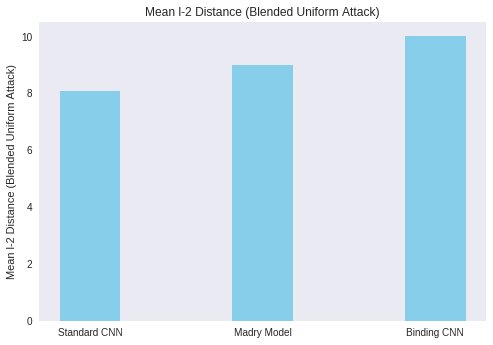

In [0]:
#Results form Blended Uniform attack

model_labels = ('Standard CNN', 'Madry Model', 'Binding CNN')
Blended_distance = np.zeros([1,3])
Blended_distance[0,0] = Standard_mean[0]
Blended_distance[0,1] = Madry_mean[0]
Blended_distance[0,2] = Binding_mean[0]

fig, ax = plt.subplots()
bar_width = 0.35
ax.grid(False)
plt.bar([0, 1, 2], Blended_distance[0,:], bar_width, color='SkyBlue')
plt.xticks([0, 1, 2], model_labels)
plt.ylabel('Mean l-2 Distance (Blended Uniform Attack)')
plt.title('Mean l-2 Distance (Blended Uniform Attack)')
plt.show()

#Visualizaiton of Results

In [0]:
#Overview of the results
#Columns 0:2 correspond to Standard CNN, Madry model, and the binding model respectively
#Rows 0:1 correspond to accuracy against one's own adversarial examples during generation
Boundary_attack_results = np.zeros([2,3])
Boundary_attack_results[0,0] = 1.0 #Standard CNN
Boundary_attack_results[1,0] = 1.591

Boundary_attack_results[0,1] = 1.0 #Madry model
Boundary_attack_results[1,1] = 1.433

Boundary_attack_results[0,2] = 0.24 #Binding model
Boundary_attack_results[1,2] = 8.328


#Columns 0:2 correspond to Standard CNN, Madry model, and the binding model respectively
#Rows 0:2 correspond to performance on adversaries from the Standard CNN, Madry model, and the binding model respectively
Transfer_attack_results = np.zeros([3,3])

Transfer_attack_results[0,0] = 1
Transfer_attack_results[1,0] = 0.333
Transfer_attack_results[2,0] = 0.378

Transfer_attack_results[0,1] = 0.155
Transfer_attack_results[1,1] = 1
Transfer_attack_results[2,1] = 0.267

Transfer_attack_results[0,2] = 0.267
Transfer_attack_results[1,2] = 0.083
Transfer_attack_results[2,2] = 1

Transfer_attack_results = Transfer_attack_results #Normalize the results

model_labels = ('Standard CNN', 'Madry Model', 'Binding CNN')

In [0]:
### *** Boundary attack results with binding net removed

Boundary_attack_results = np.zeros([2,2])
Boundary_attack_results[0,0] = 1.0 #Standard CNN
Boundary_attack_results[1,0] = 1.591

Boundary_attack_results[0,1] = 1.0 #Madry model
Boundary_attack_results[1,1] = 1.433

model_labels = ('Standard CNN', 'Madry Model')

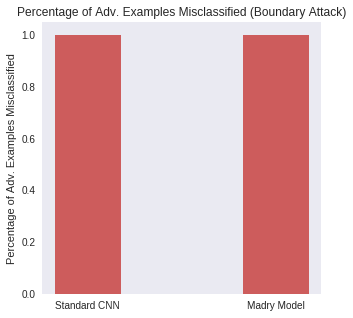

In [0]:
fig, ax = plt.subplots(figsize=(5,5))
bar_width = 0.35
ax.grid(False)
plt.bar([0, 1], Boundary_attack_results[0,:], bar_width, color='IndianRed')
plt.xticks([0, 1], model_labels)
plt.ylabel('Percentage of Adv. Examples Misclassified')
plt.title('Percentage of Adv. Examples Misclassified (Boundary Attack)')
plt.show()

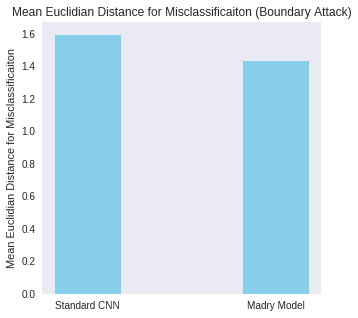

In [0]:
fig, ax = plt.subplots(figsize=(5,5))
bar_width = 0.35
ax.grid(False)
plt.bar([0, 1], Boundary_attack_results[1,:], bar_width, color='SkyBlue')
plt.xticks([0, 1], model_labels)
plt.ylabel('Mean Euclidian Distance for Misclassificaiton')
plt.title('Mean Euclidian Distance for Misclassificaiton (Boundary Attack)')
plt.show()

In [0]:
fig, ax = plt.subplots()
bar_width = 0.5
ax.grid(False)
plt.bar([0, 1, 2], Boundary_attack_results[1,:], bar_width, color='SkyBlue')
plt.xticks([0, 1, 2], model_labels)
plt.ylabel('Mean Euclidian Distance for Misclassificaiton')
plt.title('Mean Euclidian Distance for Misclassificaiton (Boundary Attack)')
plt.show()

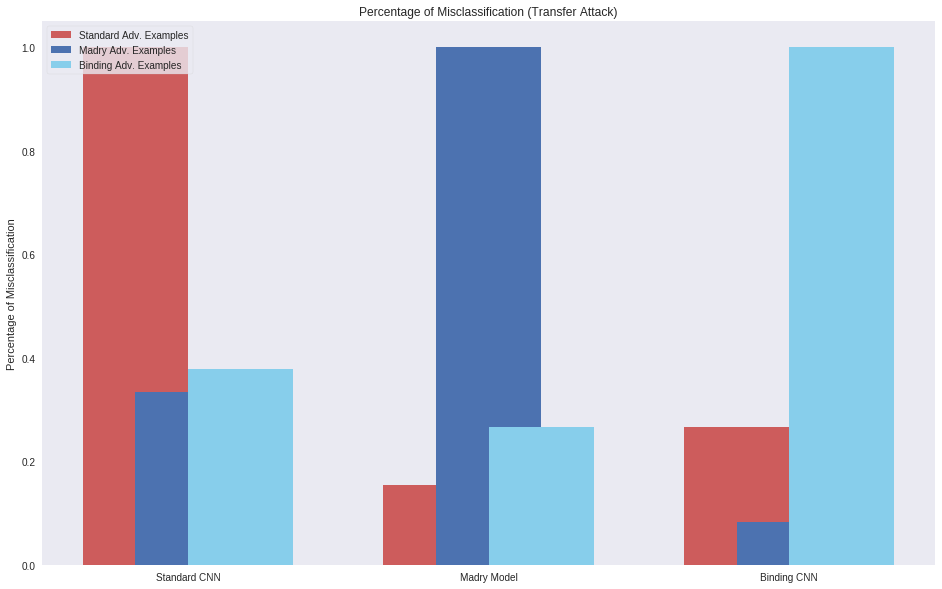

In [0]:
n_groups = 3
bar_width = 0.35
#_, ax = plt.subplots()
index = np.arange(n_groups)


plt.figure(figsize=(16,10))
plt.grid(False)
results_Standard_examples = plt.bar(index - bar_width/2, Transfer_attack_results[0,:], bar_width, color='IndianRed', label="Standard Adv. Examples")

results_Madry_examples = plt.bar(index, Transfer_attack_results[1,:], bar_width, label="Madry Adv. Examples")

results_Binding_examples = plt.bar(index + bar_width/2, Transfer_attack_results[2,:], bar_width, color='SkyBlue', label="Binding Adv. Examples")

plt.xticks(index, model_labels)
plt.ylabel('Percentage of Misclassification')
plt.title('Percentage of Misclassification (Transfer Attack)')
plt.legend(loc='upper left', frameon=1)
plt.show()

In [0]:
### mean transfer resistance results


#Columns 0:2 correspond to Standard CNN, Madry model, and the binding model respectively
#Rows 0:2 correspond to performance on adversaries from the Standard CNN, Madry model, and the binding model respectively
Transfer_attack_results = np.zeros([3,3])

Transfer_attack_results[0,0] = 1
Transfer_attack_results[1,0] = 0.333
Transfer_attack_results[2,0] = 0.378

Transfer_attack_results[0,1] = 0.155
Transfer_attack_results[1,1] = 1
Transfer_attack_results[2,1] = 0.267

Transfer_attack_results[0,2] = 0.267
Transfer_attack_results[1,2] = 0.083
Transfer_attack_results[2,2] = 1

Transfer_attack_results = Transfer_attack_results #Normalize the results

model_labels = ('Standard CNN', 'Madry Model', 'Binding CNN')

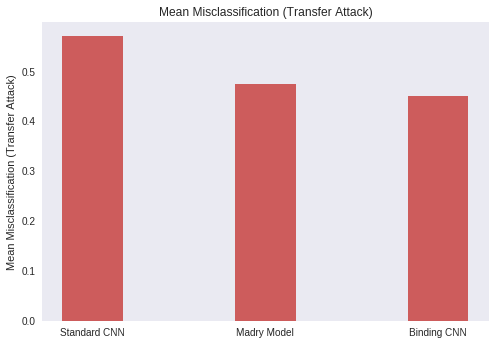

In [0]:
Transfer_means = np.zeros([1,3])
Transfer_means[0,0] = np.mean(Transfer_attack_results[:,0])
Transfer_means[0,1] = np.mean(Transfer_attack_results[:,1])
Transfer_means[0,2] = np.mean(Transfer_attack_results[:,2])

fig, ax = plt.subplots()
bar_width = 0.35
ax.grid(False)
plt.bar([0, 1, 2], Transfer_means[0,:], bar_width, color='IndianRed')
plt.xticks([0, 1, 2], model_labels)
plt.ylabel('Mean Misclassification (Transfer Attack)')
plt.title('Mean Misclassification (Transfer Attack)')
plt.show()

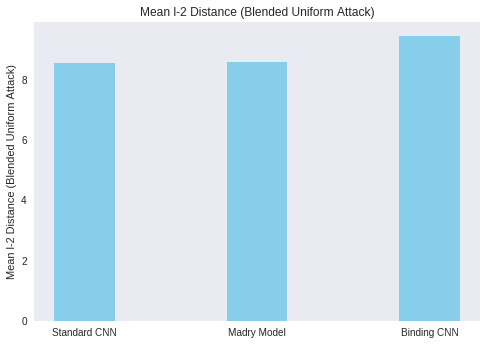

In [0]:
#Results form Blended Uniform attack

Blended_distance = np.zeros([1,3])
Blended_distance[0,0] = 8.526335774869567
Blended_distance[0,1] = 8.559281853495518
Blended_distance[0,2] = 9.433369523695147

fig, ax = plt.subplots()
bar_width = 0.35
ax.grid(False)
plt.bar([0, 1, 2], Blended_distance[0,:], bar_width, color='SkyBlue')
plt.xticks([0, 1, 2], model_labels)
plt.ylabel('Mean l-2 Distance (Blended Uniform Attack)')
plt.title('Mean l-2 Distance (Blended Uniform Attack)')
plt.show()